# Predict popularity of artist on Spotify

### Introduction

I want to predict the popularity of artists based on song features (energy, instrumentalness, liveness, loudness, speechiness, tempo, popularity, album, name). 

***
**Context**: Spotify is an audio streaming and media services provider. In 2019 there were approximately 40,000 new songs uploaded everyday. Nowadays, artists rely a lot on Spotify to earn money, simply selling hard copied albums will not suffice for them. Artists on Spotify get paid every time their song is streamed (Vultaggio, 2021). Moreover, artists are given the opportunity to find new fans in countries where their music may not be sold (Coffey, 2016), and thus increasing their reach and popularity. Spotify has the Topsify tab on the 'Home' page which shows daily popular albums, artists, songs. Topsify is based on artist and song popularity and in terms of design it is the most visible tab from the 'Home' page. Because of that, users tend to listen to those songs and therefore increase their popularity. The design is reachable and easy to use for all users. 


**Research question**: How popular are artists in the 2018-2021 range based on song features?


**Practical relevance**: Even though Spotify has the Topsify tab, I want predict the popularity of all artist from the above-mentioned years range. 
Why do I want to predict this? Artists might want their songs to reach the Topsify tab and this model could be helpful for artists to compose more popular songs based on song features and increase their reach and therefore become more popular. 
***



### Data gathering
***
The Data is gathered from Spotify API and spotistats API (Spotistats, n.d.) (Web API | Spotify for Developers, n.d.). At first, I create an album of artists who are on the list of Top-2018, Top-2019, Top-2020, Top-2021. This project is the estimation of a singer's popularity on Spotify using machine learning techniques based on the characteristics of the songs she has made and the day she shared the last album.
***


### Data Organizing

I download the albums as a csv file from ''https://spotistats.js.org/login''. Then concat them as a one csv file. 

### Spotify API 

After collecting the data of the albums and songs from spotistats, the song features were obtained using the developper.spotify with the code below.

In [2]:
# import spotipy
# from spotipy.oauth2 import SpotifyClientCredentials
# import pandas as pd
# import time 

# client_id ='***********'
# client_secret = '**********'


# client_credentials_manager = SpotifyClientCredentials(client_id, client_secret)
# sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# # def getTrackIDs(user, playlist_id):
# #     ids = []
# #     playlist = sp.user_playlist(user, playlist_id)
# #     for item in playlist['tracks']['items']:
# #         track = item['track']
# #         ids.append(track['id'])
# #     return ids

# # ids = getTrackIDs('username', 'usersecret')

# getTrackID function is using for taking songs id from spotify.

# df= pd.read_csv(r'/Users/firatsoydinc/Desktop/Master /Block - B/Machine Learning/untitled folder 2/TopArtist_csv/Top_Artists.csv')

# def getTrackFeatures(id):
#   meta = sp.track(id)
#   features = sp.audio_features(id)

#   # meta
#   name = meta['name']
#   album = meta['album']['name']
#   artist = meta['album']['artists'][0]['name']
#   release_date = meta['album']['release_date']
#   length = meta['duration_ms']
#   popularity = meta['popularity']

#   # features
#   acousticness = features[0]['acousticness']
#   danceability = features[0]['danceability']
#   energy = features[0]['energy']
#   instrumentalness = features[0]['instrumentalness']
#   liveness = features[0]['liveness']
#   loudness = features[0]['loudness']
#   speechiness = features[0]['speechiness']
#   tempo = features[0]['tempo']
#   time_signature = features[0]['time_signature']

#   track = [name, album, artist, release_date, length, popularity, danceability, acousticness, danceability, energy, instrumentalness, liveness, loudness, speechiness, tempo, time_signature]
#   return track

# GetTrackFeatures function need track id to take song features.


# tracks = []
# for i in range(13400,13501):
#   time.sleep(0.5)
#   track = getTrackFeatures(df['Spotify ID'][i])
#   tracks.append(track)

# Beacuse of spotify API rules I run the function in packages of 200 track ids.

# # create dataset
# df = pd.DataFrame(tracks, columns = ['name', 'album', 'artist', 'release_date', 'length', 'popularity', 'danceability', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'time_signature'])
# df.to_csv("13501.csv", sep = ',')

Since the Spotify API does not allow access to more than 200 song data at the same time, I ran the songs in packages of 200 and saved the results as csv.

#### Import Libraries

In [4]:
# Data orginizing 
import numpy as np
import pandas as pd
from datetime import date

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Scaling the Data
from sklearn.preprocessing import MinMaxScaler

#Model Validation
from sklearn.model_selection import train_test_split

#Calculation important metrics
import math
from sklearn.metrics import mean_squared_error # MSE
from sklearn.metrics import r2_score #R^2
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    plot_roc_curve,
)

#Linear Machine Learnig Models 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

#Non-Linear Machine Learning Models
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

# To make Model Tuning
from sklearn.model_selection import GridSearchCV

#To close feature warning 
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

### Feature Engineering (Adding new features and Data cleaning)

In [5]:
df_songs = pd.read_csv(r'/Users/firatsoydinc/Desktop/Master /Block - B/Machine Learning/untitled folder 2/Songs_with_features.csv')
df_songs.drop(df_songs[df_songs.artist == 'EA Sports Madden NFL'].index, inplace=True)
df_songs = df_songs.iloc[:,2:]

#### Explanation 
'EA Sports Madden NFL' is a game songs of FIFA game. It is not an artist so I drop it from dataframe.
The first 2 columns is index columns so I drop them from the dataframe. 
### Adding new features
The album release date is the day of publishing the album. So I decided to add a column which shows the last album of the artist published how many days ago. This column describes when the artist was last active. The new features are created based on Spotify API (Web API | Spotify for Developers, n.d.).
##### 1- The last release column shows when the artist last released an album.

In [6]:
today = date.today().strftime("%Y-%m-%d")
df_songs['today'] = today
df_songs['today'] = pd.to_datetime(df_songs['today'])
df_songs['release_date'] = pd.to_datetime(df_songs['release_date'])
df_songs['last_release'] = df_songs['today'] - df_songs['release_date']
df_songs['last_release'] = df_songs['last_release'].apply(lambda x: int(str(x)[:-14]))

#### Group By 

The aim of the project is to create machine learning to predict popularity of the artist based on the song features. So I took groupby of the artists and then took the mean of their song features. 

In [7]:
dff = df_songs.groupby('artist').agg({'danceability':'mean',
                         'acousticness':'mean',
                         'energy':'mean',
                         'instrumentalness':'mean',
                         'liveness':'mean',
                         'loudness':'mean',
                         'speechiness':'mean',
                         'tempo':'mean',
                         'popularity':'mean',
                         'album':'nunique',
                          'name':'count',
                          'last_release':'min'}).reset_index()

dff=dff.rename(columns={'album': 'number_of_albums', 'name': 'number_of_songs'})

##### 2- If danceability value is more than 0.70 that's mean the song is danceable.


In [8]:
dff['danceability_class'] = np.where(dff['danceability'] > 0.70, 1, 0)

##### 3- if energy value of song is more than 0.70 that's mean the song is energic. 

In [9]:
dff['energy_class'] = np.where(dff['energy'] > 0.70, 1, 0)

##### 4- if loudness value is between -14 and -7.5 thats mean the song has chill (dB) genre.

In [10]:
dff['loudness_class'] = np.where((dff['loudness'] > -14) & (dff['loudness'] < -7.5), 1, 0)

#### Taking quick overview to data data

In [11]:
def overview_df(dataframe):
    print("##################### Types of Variables#####################")
    print(dataframe.dtypes)
    print("##################### NA #####################")
    print(dataframe.isnull().sum())

overview_df(dff)

##################### Types of Variables#####################
artist                 object
danceability          float64
acousticness          float64
energy                float64
instrumentalness      float64
liveness              float64
loudness              float64
speechiness           float64
tempo                 float64
popularity            float64
number_of_albums        int64
number_of_songs         int64
last_release            int64
danceability_class      int64
energy_class            int64
loudness_class          int64
dtype: object
##################### NA #####################
artist                0
danceability          0
acousticness          0
energy                0
instrumentalness      0
liveness              0
loudness              0
speechiness           0
tempo                 0
popularity            0
number_of_albums      0
number_of_songs       0
last_release          0
danceability_class    0
energy_class          0
loudness_class        0
dtype: int64


Regarding results, Dataframe has 107 rows and 16 columns, and there is not any NAN variable inside the data frame. 


###### Explaination of function
Grab_cols function is used to determine the columns according to their categories. (10 and 20 can be changed based on the problem.)
    
    .If a categorical variable has more than 10 categories, it means that the cardinality of this variable is high (Determining cardinality in categorical variables)
    .If a numeric variable consists of less than 20 classes, we can say that this variable has categorical properties  (Determining cardinality in categorical variables)


In [12]:
def grab_cols(dataframe, cat_th=10, car_th=20):

    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, cat_but_car, num_cols, num_but_cat

cat_cols, cat_but_car, num_cols, num_but_cat = grab_cols(dff)

Observations: 107
Variables: 16
cat_cols: 3
num_cols: 12
cat_but_car: 1
num_but_cat: 3


##### Summary of the result
Regarding to grab_cols function, the dataframe has 107 observations and 16 variables. 3 of this variables are categoric, 12 of them are numeric and 1 of them is categoric but cardinal. Also 2 of the numerical variables have categorical behaviours.

### Detailed analysis of variables

##### 1.Analysis of Numeric variables (Quantiles and histogram of the variables) 

count    107.000000
mean       0.646411
std        0.087603
min        0.393132
5%         0.518112
10%        0.540869
20%        0.567513
30%        0.607982
40%        0.627985
50%        0.647022
60%        0.677187
70%        0.697550
80%        0.733763
90%        0.751446
95%        0.775479
99%        0.803492
max        0.804598
Name: danceability, dtype: float64


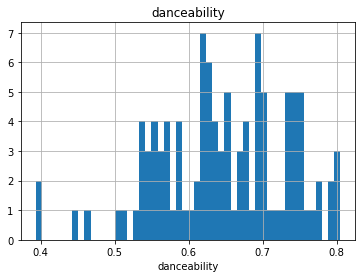

##############Quantiles#######################
count    107.000000
mean       0.255100
std        0.139063
min        0.010539
5%         0.098421
10%        0.113437
20%        0.151387
30%        0.170288
40%        0.199312
50%        0.225623
60%        0.256110
70%        0.273806
80%        0.334547
90%        0.441092
95%        0.553921
99%        0.684267
max        0.756778
Name: acousticness, dtype: float64


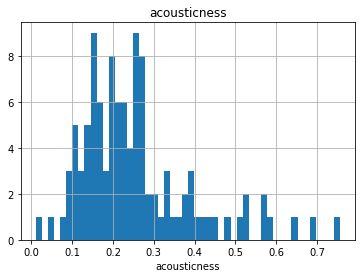

##############Quantiles#######################
count    107.000000
mean       0.627102
std        0.103356
min        0.298737
5%         0.444860
10%        0.489081
20%        0.560735
30%        0.587126
40%        0.620797
50%        0.631688
60%        0.652523
70%        0.676378
80%        0.701219
90%        0.746752
95%        0.770924
99%        0.881188
max        0.899800
Name: energy, dtype: float64


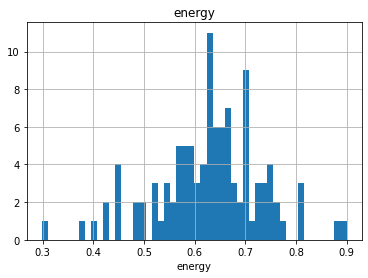

##############Quantiles#######################
count    1.070000e+02
mean     3.231889e-02
std      8.370007e-02
min      7.370370e-08
5%       1.571306e-06
10%      1.208757e-05
20%      1.626864e-04
30%      3.314557e-04
40%      7.645144e-04
50%      2.056278e-03
60%      6.280351e-03
70%      1.188767e-02
80%      2.056761e-02
90%      1.027561e-01
95%      2.096974e-01
99%      3.369612e-01
max      5.811889e-01
Name: instrumentalness, dtype: float64


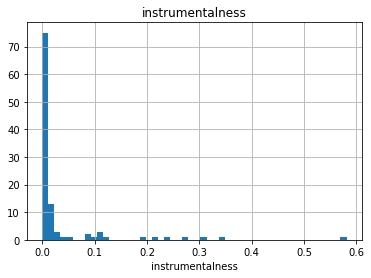

##############Quantiles#######################
count    107.000000
mean       0.208097
std        0.060924
min        0.101437
5%         0.141258
10%        0.150286
20%        0.163103
30%        0.172504
40%        0.185523
50%        0.194659
60%        0.209867
70%        0.224973
80%        0.239489
90%        0.281633
95%        0.308852
99%        0.435648
max        0.465367
Name: liveness, dtype: float64


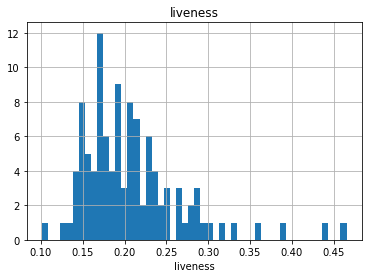

##############Quantiles#######################
count    107.000000
mean      -6.790163
std        1.610930
min      -13.388933
5%        -9.385282
10%       -8.879973
20%       -7.926615
30%       -7.382328
40%       -7.010273
50%       -6.629111
60%       -6.240978
70%       -5.878416
80%       -5.665626
90%       -5.051907
95%       -4.700312
99%       -3.340643
max       -3.162200
Name: loudness, dtype: float64


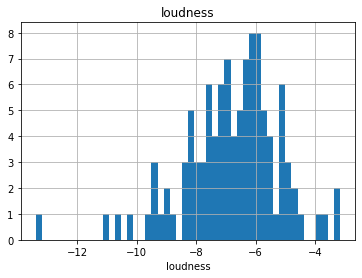

##############Quantiles#######################
count    107.000000
mean       0.145280
std        0.079850
min        0.035232
5%         0.046853
10%        0.055408
20%        0.072656
30%        0.092222
40%        0.104323
50%        0.122467
60%        0.145292
70%        0.183922
80%        0.224575
90%        0.260490
95%        0.302049
99%        0.339218
max        0.345124
Name: speechiness, dtype: float64


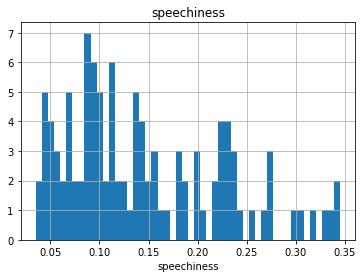

##############Quantiles#######################
count    107.000000
mean     121.896411
std        8.288777
min      106.227063
5%       110.000650
10%      111.087538
20%      113.356248
30%      117.977371
40%      120.210117
50%      122.218364
60%      123.738043
70%      125.389322
80%      127.995862
90%      131.994632
95%      136.539855
99%      141.461962
max      143.841200
Name: tempo, dtype: float64


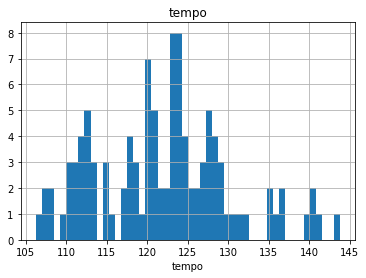

##############Quantiles#######################
count    107.000000
mean      52.131505
std       11.994567
min       14.806383
5%        33.689647
10%       39.273829
20%       42.804300
30%       45.830530
40%       49.463755
50%       51.872549
60%       55.399817
70%       58.261004
80%       61.072271
90%       66.988187
95%       71.352500
99%       77.117636
max       87.545455
Name: popularity, dtype: float64


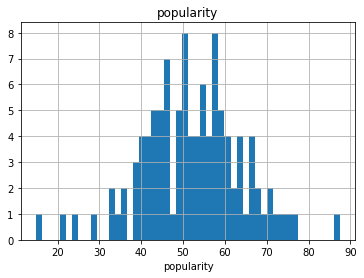

##############Quantiles#######################
count    107.000000
mean       7.308411
std        6.902845
min        1.000000
5%         1.000000
10%        1.000000
20%        2.000000
30%        3.000000
40%        4.000000
50%        5.000000
60%        7.000000
70%        9.000000
80%       12.000000
90%       14.400000
95%       19.700000
99%       29.880000
max       43.000000
Name: number_of_albums, dtype: float64


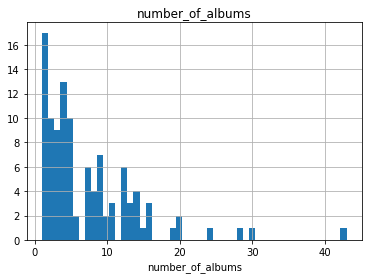

##############Quantiles#######################
count    107.000000
mean     126.074766
std      130.132422
min        7.000000
5%        10.000000
10%       12.000000
20%       27.200000
30%       46.600000
40%       64.400000
50%       84.000000
60%      117.000000
70%      152.400000
80%      185.200000
90%      269.000000
95%      373.500000
99%      584.460000
max      749.000000
Name: number_of_songs, dtype: float64


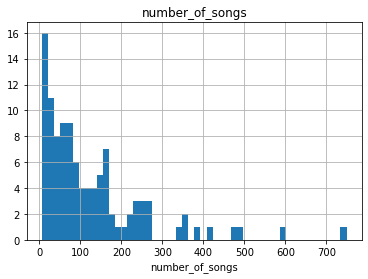

##############Quantiles#######################
count     107.000000
mean      595.233645
std       679.912849
min        21.000000
5%         51.100000
10%        76.200000
20%       126.000000
30%       161.000000
40%       239.200000
50%       315.000000
60%       439.800000
70%       694.400000
80%       814.800000
90%      1469.000000
95%      2108.900000
99%      3139.120000
max      3314.000000
Name: last_release, dtype: float64


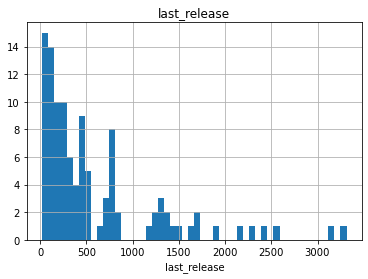

##############Quantiles#######################


In [13]:
def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=50)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show()

    print("##############Quantiles#######################")


for col in num_cols:
    num_summary(dff, col,plot=True)

##### Summary of the result
    .The distribution of the danceability variable is left tailed.
    .The distribution of the acousticness variable is right tailed.
    .The distribution of the energy variable is left tailed.
    .The distribution of the instumentalness variable is right tailed and has outliers.
    .The distribution of the liveness variable is left tailed.
    .The distribution of the loudness variable is left tailed.
    .The distribution of the speechiness variable is right tailed.
    .The distribution of the tempo variable is right tailed.
    .The distribution of the popularity variable is about normally distributed and has outliers.
    .The distribution of the tempo variable is right tailed.
    .The distribution of the number_of_albums variable is right tailed and has outliers.
    .The distribution of the number_of_songs variable is right tailed and has outliers
    .The distribution of the last_release variable is right tailed.
    
Furthermore, popularity is my dependent variable, so it is not recommended to interfere with the outlier values of the dependent variable (theanalysisfactor, 2022).

##### 2.Analysis of Categorical Variables (Distriburion of categoric variables and bar plot) 

   danceability_class      Ratio
0                  77  71.962617
1                  30  28.037383


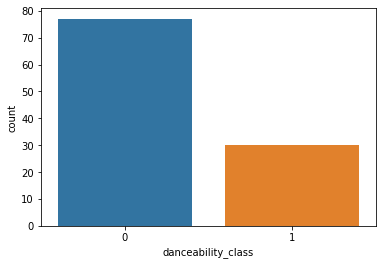

   energy_class      Ratio
0            84  78.504673
1            23  21.495327


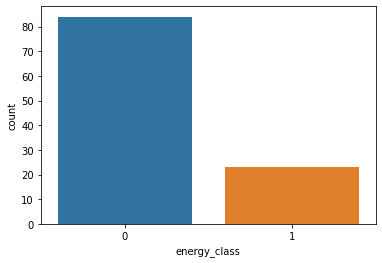

   loudness_class      Ratio
0              77  71.962617
1              30  28.037383


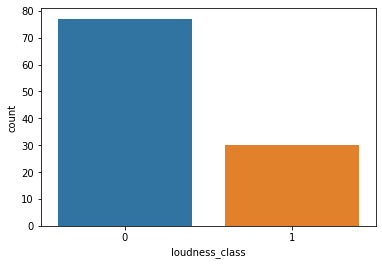

In [14]:
def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))

    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show()


for col in cat_cols:
    cat_summary(dff, col,plot=True)

##### Summary of the result
    .The danceability_class variable is binary and the ratio of the variables are 0 --> 71.96%
                                                                                  1--> 28.04%
                                                                            
    .The energy_class variable is binary and the ratio of the variables are 0 --> 78.50%
                                                                            1--> 21.50%
                                                                            
    .The loudness_class variable is binary and the ratio of the variables are 0 --> 71.96%
                                                                              1--> 28.04%                                                                       

#### Correlation Analysis

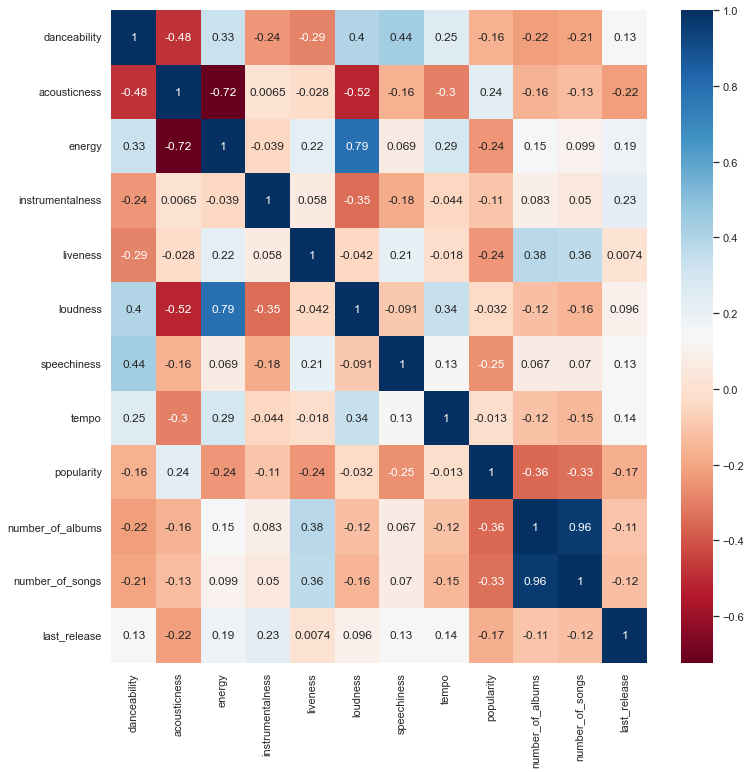

In [15]:
corr = dff[num_cols].corr()
sns.set(rc={'figure.figsize': (12, 12)})
sns.heatmap(corr, cmap="RdBu",annot=True)
plt.show()



Regarding heatmap, The variable of number_of_albums and number_of_songs are over-correlated (96%). Therefore, I drop number_of_song from the data frame while I am making a machine learning model. (datascience.stackexchange, 2022)

#### Pairplot 

Using pairplot, we can examine the distributions of variables over each other and the meanings of these distributions.

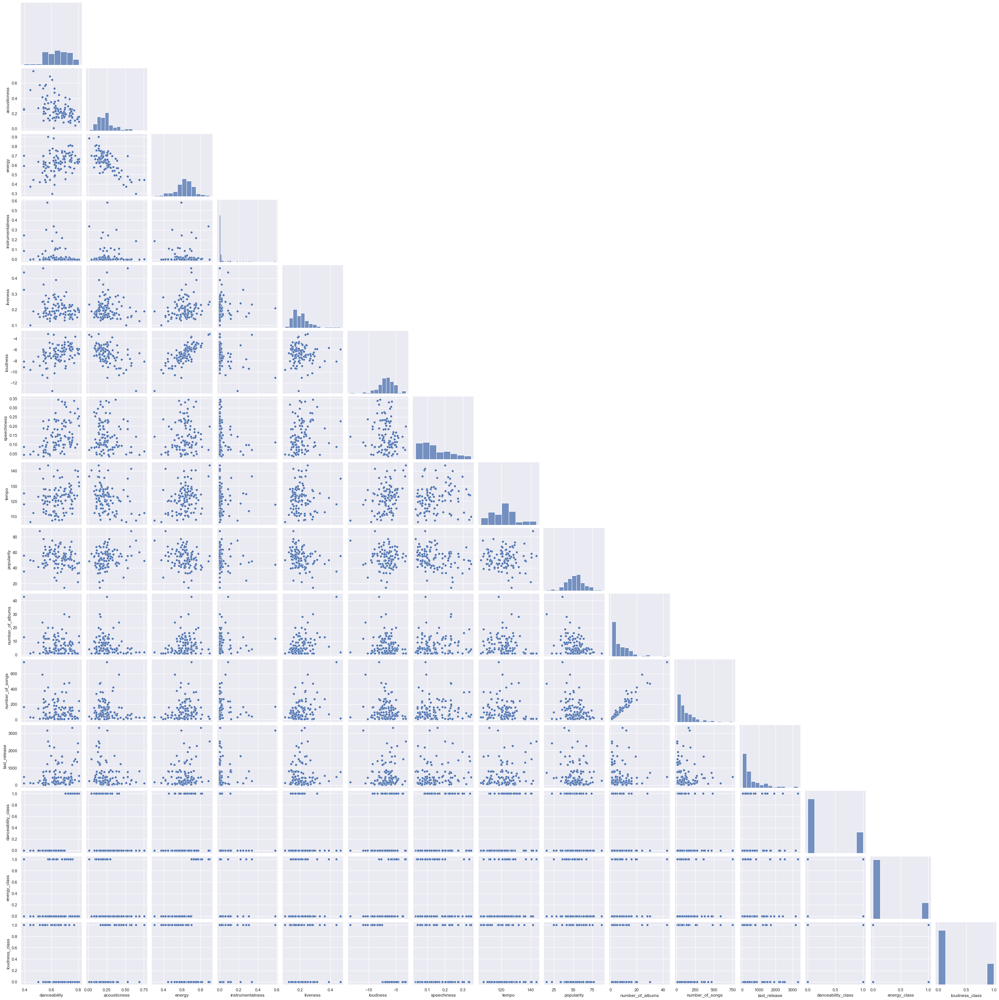

In [16]:
sns.pairplot(dff,corner=True)

##### Result of Pairplot
The pair graph shows the distribution of_num_songs and_num_albums. Also, when looking at the relationship of the variables with the dependent variable, no variable requiring transformation was observed(Seaborn.Pairplot — Seaborn 0.11.2 Documentation, n.d.) . So, I didn't make any transformation on my variables


#### Outlier Processing

###### Explanation of function

Boxplot apporach is using for outliers in the variables. Default values for low_quantile and up_quantile is 0.25 and 0.75 respectively. But, I just want to check for extreme values, so I changed the low_quantile to 0.10, and up_quantile to 0.90. (Grace-Martin, 2021)

In [17]:
def outlier_thresholds(dataframe, variable, low_quantile=0.10, up_quantile=0.90):
    quantile_one = dataframe[variable].quantile(low_quantile)
    quantile_three = dataframe[variable].quantile(up_quantile)
    interquantile_range = quantile_three - quantile_one
    up_limit = quantile_three + 1.5 * interquantile_range
    low_limit = quantile_one - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

for col in num_cols:
    if col != "popularity":
      print(col, check_outlier(dff, col))

danceability False
acousticness False
energy False
instrumentalness True
liveness False
loudness False
speechiness False
tempo False
number_of_albums True
number_of_songs True
last_release False


##### Summary of the Result

Outlier thresholds function is using for calculation boxplot bounds. But I just want to check for really extreme values so I changed the low and up limit to 0.10 and 0.90 (Keskin, 2021) . So this function just recognizing really extreme values.

Check_outlier fuction is using for checking the columns variable which has variables lower than low limit, and upper than up limit which are calculated with outlier thresholds.

I didn't check outliers for dependent variable.

Instrumentalnes, album, name have extreme values.


In [18]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit


for col in num_cols:
    if col != "popularity":
        replace_with_thresholds(dff,col)

After using replace_with_thresholds function this outliers changed with suppression method.
Suppression method is if the variable is lower than low_limit it equates this variable to the low limit, or if the variable is upper than up_limit it equated this variable to the up limit.

####  Encoding

I created dummy variables from categorical variables that do not have any precedence between them.

In [19]:
def dummy_creater(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

dff = dummy_creater(dff, cat_cols, drop_first=True)
dff

,artist,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,popularity,number_of_albums,number_of_songs,last_release,danceability_class_1,energy_class_1,loudness_class_1
0,6LACK,0.567214,0.436569,0.479107,0.001137,0.140600,-9.322607,0.184571,119.942321,58.535714,2.0,28.0,1232.0,0,0,1
1,AREA21,0.643750,0.266333,0.747083,0.000017,0.239833,-5.152750,0.147442,140.453750,53.416667,1.0,12.0,77.0,0,1,0
2,Adele,0.550696,0.564048,0.444705,0.000335,0.213648,-7.661536,0.057362,120.085214,67.482143,4.0,56.0,70.0,0,0,1
3,Anuel AA,0.735203,0.389621,0.647527,0.000469,0.141774,-5.207162,0.114438,122.805243,63.324324,4.0,74.0,63.0,1,0,0
4,Arcangel,0.733785,0.256425,0.734138,0.007280,0.230513,-5.424562,0.167220,123.590169,41.607692,8.0,130.0,133.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,XXXTENTACION,0.704180,0.412257,0.455005,0.111406,0.168416,-9.314863,0.198347,120.670050,54.900621,7.0,161.0,784.0,1,0,1
103,YBN Nahmir,0.774442,0.109534,0.624814,0.000296,0.167956,-6.990512,0.270593,121.690279,40.441860,2.0,43.0,308.0,1,0,0
104,Yo Gotti,0.693187,0.155531,0.669221,0.001127,0.285550,-6.845974,0.233871,126.809649,14.806383,30.0,470.0,728.0,0,0,0
105,Zion & Lennox,0.739692,0.111007,0.813985,0.007133,0.191278,-4.887323,0.086843,115.250615,41.246154,4.0,65.0,190.0,1,1,0


#### Scaling The Variables

In order to eliminate the meaningless difference between the data, it is necessary to standardize the data before making machine learning application.

The danceability, acousticness, energy, instrumentalness, liveness and speechiness are already scaled. So, I scaled loudness, tempo, number_of_albums and last_release here.

In [20]:
scaler = MinMaxScaler(feature_range=(0,1))
data = scaler.fit_transform(dff[['loudness','tempo','number_of_albums','last_release']])
data=pd.DataFrame(data,columns=['loudness_s','tempo_s','number_of_albums_s','last_release_s'])
dff=pd.concat([dff,data],axis=1)
dff=dff.drop(['loudness','tempo','number_of_albums','last_release'],axis=1)
dff

,artist,danceability,acousticness,energy,instrumentalness,liveness,speechiness,popularity,number_of_songs,danceability_class_1,energy_class_1,loudness_class_1,loudness_s,tempo_s,number_of_albums_s,last_release_s
0,6LACK,0.567214,0.436569,0.479107,0.001137,0.140600,0.184571,58.535714,28.0,0,0,1,0.397617,0.364630,0.029851,0.367750
1,AREA21,0.643750,0.266333,0.747083,0.000017,0.239833,0.147442,53.416667,12.0,0,1,0,0.805358,0.909942,0.000000,0.017006
2,Adele,0.550696,0.564048,0.444705,0.000335,0.213648,0.057362,67.482143,56.0,0,0,1,0.560042,0.368429,0.089552,0.014880
3,Anuel AA,0.735203,0.389621,0.647527,0.000469,0.141774,0.114438,63.324324,74.0,1,0,0,0.800038,0.440743,0.089552,0.012754
4,Arcangel,0.733785,0.256425,0.734138,0.007280,0.230513,0.167220,41.607692,130.0,1,1,0,0.778780,0.461611,0.208955,0.034012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,XXXTENTACION,0.704180,0.412257,0.455005,0.111406,0.168416,0.198347,54.900621,161.0,1,0,1,0.398375,0.383978,0.179104,0.231704
103,YBN Nahmir,0.774442,0.109534,0.624814,0.000296,0.167956,0.270593,40.441860,43.0,1,0,0,0.625656,0.411101,0.029851,0.087155
104,Yo Gotti,0.693187,0.155531,0.669221,0.001127,0.285550,0.233871,14.806383,470.0,0,0,0,0.639790,0.547203,0.865672,0.214698
105,Zion & Lennox,0.739692,0.111007,0.813985,0.007133,0.191278,0.086843,41.246154,65.0,1,1,0,0.831312,0.239898,0.089552,0.051321


Now, the data is ready to make machine learning application.

#### Machine Learning Applications

Before starting machine learnign application data should be divided into 2 groups which are dependent(y) and independent(X) variables. Dependent variable is 'popularity', independent variables are all the variables in the dataframe except 'artist', 'number_of_songs', and 'popularity'.
   
    'artist column' dont have any meaning for the project.
    'number_of_songs' is over-correlated with 'number_of_albums'
    'popularity' is dependent variable.
    

In [21]:
y = dff['popularity']
X = dff.drop(["artist", "number_of_songs",'popularity'], axis=1)

Popularity variable is continious variable so regression algorithms should used to make prediction model. 
In regression models, the predictive power of the model can be explained by Root Mean Square Error(RMSE)and R^2 values. 
    
    .RMSE is the square root of the mean difference between actual and predicted data. 
    .R^2  statistic indicates the percentage of the variance in the dependent variable that the independent variables explain collectively.
    
To decide which algorithm gives best prediction amoung others I used rmse_r2_calculater to calculare RMSE and R^2 value of each algorithm. Good prediction with regression method can be explained as low RMSE and high r^2 (Burns, 2021). 


In [22]:
def rmse_r2_calculater(X,y,alg):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30,random_state=42)
    model = alg().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    RMSE_ = np.sqrt(mean_squared_error(y_test, y_pred))
    RMSE = f'{RMSE_:.5f}'[:-1]
    r2_= r2_score(y_test,y_pred)
    r2 = f'{r2_:.5f}'[:-1]
    model_name = alg.__name__
    print(model_name, "RMSE Score:",RMSE,'R^2:',r2)
    rmse.append(RMSE_)
    r_2.append(r2_)

In [23]:
rmse = [] 
r_2 = []

#### Lineer Machine Learning Application

In [24]:
l_models = [
          Ridge,
          LinearRegression,
          Lasso,
          ElasticNet
         ]
for i in l_models:
    rmse_r2_calculater(X,y, i)

Ridge RMSE Score: 8.4549 R^2: 0.2099
LinearRegression RMSE Score: 12.3005 R^2: -0.6721
Lasso RMSE Score: 9.6123 R^2: -0.0211
ElasticNet RMSE Score: 9.5346 R^2: -0.0047


Amoung the linear models Ridge Regression has the lowest RMSE and highest r^2 value.

#### Non-Lineer Machine Learning Application

In [25]:
nl_models = [GradientBoostingRegressor, 
          RandomForestRegressor, 
          DecisionTreeRegressor,
          KNeighborsRegressor, 
          SVR,
          XGBRegressor,
          CatBoostRegressor,
          LGBMRegressor

         ]
for i in nl_models:
    rmse_r2_calculater(X,y, i)

GradientBoostingRegressor RMSE Score: 9.0796 R^2: 0.0888
RandomForestRegressor RMSE Score: 8.6037 R^2: 0.1818
DecisionTreeRegressor RMSE Score: 12.6871 R^2: -0.7789
KNeighborsRegressor RMSE Score: 10.9974 R^2: -0.3366
SVR RMSE Score: 9.5954 R^2: -0.0175
XGBRegressor RMSE Score: 11.8792 R^2: -0.5596
Learning rate set to 0.027134
0:	learn: 12.7574733	total: 61.7ms	remaining: 1m 1s
1:	learn: 12.6547155	total: 62.4ms	remaining: 31.1s
2:	learn: 12.5754242	total: 62.8ms	remaining: 20.9s
3:	learn: 12.4933834	total: 63.3ms	remaining: 15.8s
4:	learn: 12.4043064	total: 63.8ms	remaining: 12.7s
5:	learn: 12.3315309	total: 64.2ms	remaining: 10.6s
6:	learn: 12.2496150	total: 64.7ms	remaining: 9.18s
7:	learn: 12.1791300	total: 65.2ms	remaining: 8.09s
8:	learn: 12.0829289	total: 65.6ms	remaining: 7.23s
9:	learn: 12.0150383	total: 66.1ms	remaining: 6.54s
10:	learn: 11.9311262	total: 66.6ms	remaining: 5.99s
11:	learn: 11.8403780	total: 67.2ms	remaining: 5.53s
12:	learn: 11.7609826	total: 67.6ms	remainin

173:	learn: 5.1099690	total: 157ms	remaining: 747ms
174:	learn: 5.0990001	total: 158ms	remaining: 744ms
175:	learn: 5.0664323	total: 159ms	remaining: 742ms
176:	learn: 5.0551484	total: 159ms	remaining: 739ms
177:	learn: 5.0319203	total: 160ms	remaining: 737ms
178:	learn: 5.0094922	total: 160ms	remaining: 736ms
179:	learn: 4.9735572	total: 161ms	remaining: 734ms
180:	learn: 4.9626922	total: 162ms	remaining: 731ms
181:	learn: 4.9301535	total: 162ms	remaining: 729ms
182:	learn: 4.9063502	total: 163ms	remaining: 727ms
183:	learn: 4.8934324	total: 163ms	remaining: 724ms
184:	learn: 4.8771087	total: 164ms	remaining: 721ms
185:	learn: 4.8599436	total: 165ms	remaining: 720ms
186:	learn: 4.8297951	total: 165ms	remaining: 717ms
187:	learn: 4.7946398	total: 165ms	remaining: 715ms
188:	learn: 4.7706992	total: 166ms	remaining: 713ms
189:	learn: 4.7383094	total: 167ms	remaining: 710ms
190:	learn: 4.7248133	total: 167ms	remaining: 708ms
191:	learn: 4.7153316	total: 168ms	remaining: 705ms
192:	learn: 

331:	learn: 2.7522611	total: 245ms	remaining: 494ms
332:	learn: 2.7388785	total: 246ms	remaining: 493ms
333:	learn: 2.7353926	total: 247ms	remaining: 492ms
334:	learn: 2.7192719	total: 247ms	remaining: 491ms
335:	learn: 2.7158517	total: 248ms	remaining: 489ms
336:	learn: 2.7124800	total: 248ms	remaining: 488ms
337:	learn: 2.7091560	total: 248ms	remaining: 486ms
338:	learn: 2.7031582	total: 249ms	remaining: 485ms
339:	learn: 2.6998800	total: 249ms	remaining: 484ms
340:	learn: 2.6966482	total: 250ms	remaining: 482ms
341:	learn: 2.6917926	total: 250ms	remaining: 481ms
342:	learn: 2.6786748	total: 250ms	remaining: 480ms
343:	learn: 2.6739291	total: 251ms	remaining: 478ms
344:	learn: 2.6707750	total: 251ms	remaining: 477ms
345:	learn: 2.6554753	total: 251ms	remaining: 475ms
346:	learn: 2.6526040	total: 252ms	remaining: 474ms
347:	learn: 2.6495393	total: 252ms	remaining: 473ms
348:	learn: 2.6467354	total: 253ms	remaining: 472ms
349:	learn: 2.6342130	total: 253ms	remaining: 470ms
350:	learn: 

494:	learn: 1.4870659	total: 335ms	remaining: 342ms
495:	learn: 1.4847350	total: 336ms	remaining: 341ms
496:	learn: 1.4824466	total: 336ms	remaining: 340ms
497:	learn: 1.4810977	total: 337ms	remaining: 339ms
498:	learn: 1.4692354	total: 337ms	remaining: 339ms
499:	learn: 1.4627788	total: 338ms	remaining: 338ms
500:	learn: 1.4614658	total: 338ms	remaining: 337ms
501:	learn: 1.4592424	total: 339ms	remaining: 336ms
502:	learn: 1.4570597	total: 339ms	remaining: 335ms
503:	learn: 1.4493578	total: 340ms	remaining: 334ms
504:	learn: 1.4480849	total: 340ms	remaining: 333ms
505:	learn: 1.4405056	total: 341ms	remaining: 333ms
506:	learn: 1.4330480	total: 341ms	remaining: 332ms
507:	learn: 1.4303058	total: 342ms	remaining: 331ms
508:	learn: 1.4276161	total: 342ms	remaining: 330ms
509:	learn: 1.4190100	total: 343ms	remaining: 329ms
510:	learn: 1.4069890	total: 343ms	remaining: 328ms
511:	learn: 1.4043596	total: 343ms	remaining: 327ms
512:	learn: 1.3944168	total: 344ms	remaining: 327ms
513:	learn: 

818:	learn: 0.3694131	total: 522ms	remaining: 115ms
819:	learn: 0.3669281	total: 523ms	remaining: 115ms
820:	learn: 0.3642324	total: 523ms	remaining: 114ms
821:	learn: 0.3620152	total: 524ms	remaining: 113ms
822:	learn: 0.3610610	total: 524ms	remaining: 113ms
823:	learn: 0.3599572	total: 524ms	remaining: 112ms
824:	learn: 0.3568950	total: 525ms	remaining: 111ms
825:	learn: 0.3549484	total: 525ms	remaining: 111ms
826:	learn: 0.3544551	total: 526ms	remaining: 110ms
827:	learn: 0.3532413	total: 526ms	remaining: 109ms
828:	learn: 0.3515530	total: 526ms	remaining: 109ms
829:	learn: 0.3510648	total: 527ms	remaining: 108ms
830:	learn: 0.3481387	total: 528ms	remaining: 107ms
831:	learn: 0.3462628	total: 528ms	remaining: 107ms
832:	learn: 0.3458354	total: 529ms	remaining: 106ms
833:	learn: 0.3435383	total: 529ms	remaining: 105ms
834:	learn: 0.3430694	total: 530ms	remaining: 105ms
835:	learn: 0.3419271	total: 530ms	remaining: 104ms
836:	learn: 0.3394083	total: 531ms	remaining: 103ms
837:	learn: 

978:	learn: 0.1894907	total: 612ms	remaining: 13.1ms
979:	learn: 0.1889963	total: 613ms	remaining: 12.5ms
980:	learn: 0.1886676	total: 613ms	remaining: 11.9ms
981:	learn: 0.1880252	total: 614ms	remaining: 11.3ms
982:	learn: 0.1868395	total: 615ms	remaining: 10.6ms
983:	learn: 0.1865163	total: 615ms	remaining: 10ms
984:	learn: 0.1855203	total: 616ms	remaining: 9.38ms
985:	learn: 0.1851566	total: 616ms	remaining: 8.75ms
986:	learn: 0.1844314	total: 617ms	remaining: 8.13ms
987:	learn: 0.1834722	total: 618ms	remaining: 7.5ms
988:	learn: 0.1827754	total: 618ms	remaining: 6.88ms
989:	learn: 0.1818544	total: 619ms	remaining: 6.25ms
990:	learn: 0.1809504	total: 620ms	remaining: 5.63ms
991:	learn: 0.1798875	total: 620ms	remaining: 5ms
992:	learn: 0.1791182	total: 621ms	remaining: 4.37ms
993:	learn: 0.1782353	total: 621ms	remaining: 3.75ms
994:	learn: 0.1773688	total: 622ms	remaining: 3.12ms
995:	learn: 0.1763436	total: 622ms	remaining: 2.5ms
996:	learn: 0.1755967	total: 623ms	remaining: 1.87ms


Amoung the Non-Linear Models CatBoost have the lowest RMSE and highest r^2. 

When I compared the best results on linear and not-linear algorithms, non-linear algorithm(CatBoostRegressor) gave the lowest RMSE and highest R^2.

In [26]:
df_rmse = pd.DataFrame (rmse, columns = ['RMSE Score'])
df_r2 = pd.DataFrame (r_2, columns = ['R^2 Score'])
model = ['Ridge',
          'LinearRegression',
          'Lasso',
          'ElasticNet',
          'GradientBoostingRegressor', 
          'RandomForestRegressor', 
          'DecisionTreeRegressor',
          'KNeighborsRegressor', 
          'SVR',
          'XGBRegressor',
          'CatBoostRegressor',
          'LGBMRegressor'
        ]
df_models = pd.DataFrame (model, columns = ['Models'])
df_rmse_r2= pd.concat([df_rmse,df_r2,df_models],axis=1)
df_rmse_r2


,RMSE Score,R^2 Score,Models
0,8.454933,0.209948,Ridge
1,12.300543,-0.672183,LinearRegression
2,9.612395,-0.021171,Lasso
3,9.534668,-0.004723,ElasticNet
4,9.079604,0.088894,GradientBoostingRegressor
5,8.603761,0.181890,RandomForestRegressor
6,12.687153,-0.778949,DecisionTreeRegressor
7,10.997474,-0.336660,KNeighborsRegressor
8,9.595457,-0.017575,SVR
9,11.879264,-0.559604,XGBRegressor


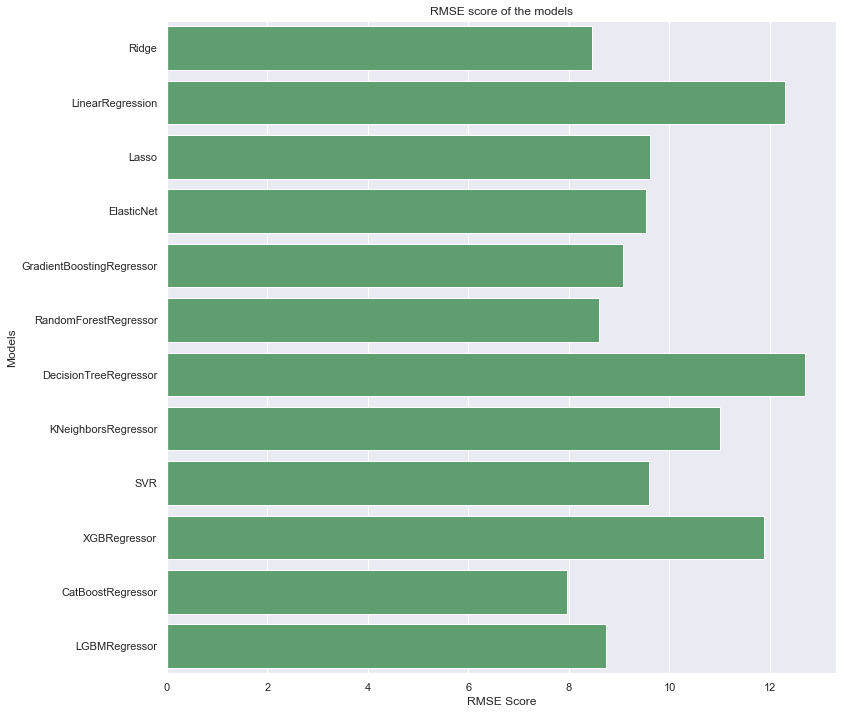

In [27]:
sns.barplot(x= 'RMSE Score', y = 'Models', data=df_rmse_r2, color= 'g')
plt.xlabel('RMSE Score')
plt.title('RMSE score of the models');

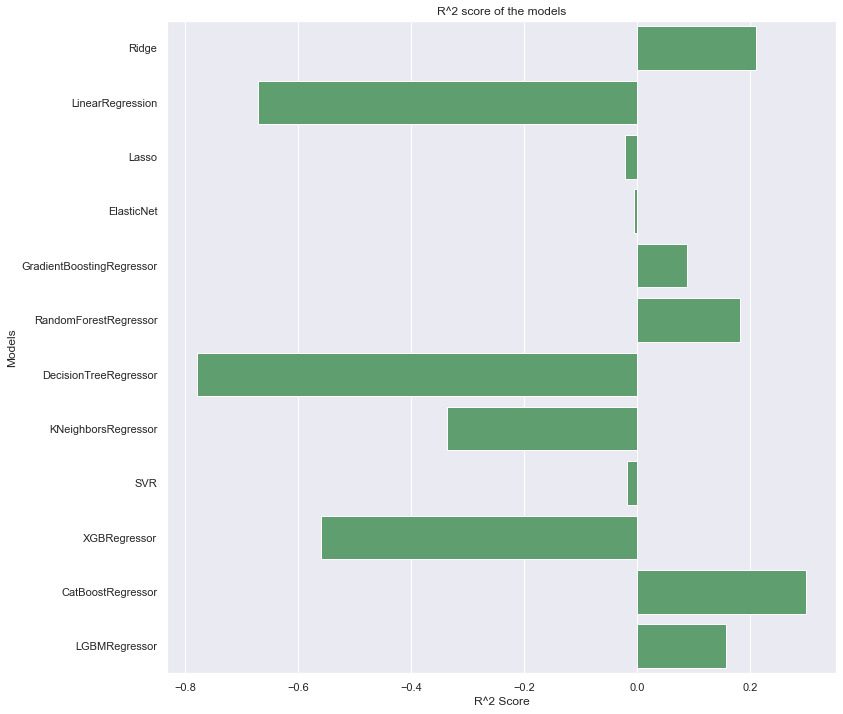

In [28]:
sns.barplot(x= 'R^2 Score', y = 'Models', data=df_rmse_r2, color= 'g')
plt.xlabel('R^2 Score')
plt.title('R^2 score of the models');

The graphps which are RMSE score of models and R^2 score of the models show that CatBoost Regression has better results than other algorithms.

### CatBoostRegressor

CatBoost is an algorithm for gradient boosting on decision trees. It's different from other boosting algorithm because it has special features which the other boosting algorithms dont have. These features are, early_stopping_round, depth, faster parameter tuning. Early_stopping_round is using to obstruct over-learning of model(Pramoditha, 2022). Depth is depth of the tree and its using for decreasing the value prevents overfitting. Since it is a tree algorithm, it is robust to outlier values(Pramoditha, 2022).

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30,random_state=42)
model = CatBoostRegressor().fit(X_train, y_train)
y_pred = model.predict(X_test)
RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
RMSE = f'{RMSE:.5f}'[:-1]
r2= r2_score(y_test,y_pred)
r2 = f'{r2:.5f}'[:-1]
print("model_name", "RMSE Score:",RMSE,'R^2:',r2)

Learning rate set to 0.027134
0:	learn: 12.7574733	total: 719us	remaining: 719ms
1:	learn: 12.6547155	total: 1.36ms	remaining: 680ms
2:	learn: 12.5754242	total: 1.95ms	remaining: 649ms
3:	learn: 12.4933834	total: 2.5ms	remaining: 623ms
4:	learn: 12.4043064	total: 2.97ms	remaining: 591ms
5:	learn: 12.3315309	total: 3.31ms	remaining: 549ms
6:	learn: 12.2496150	total: 3.65ms	remaining: 518ms
7:	learn: 12.1791300	total: 4.03ms	remaining: 499ms
8:	learn: 12.0829289	total: 4.55ms	remaining: 501ms
9:	learn: 12.0150383	total: 4.96ms	remaining: 491ms
10:	learn: 11.9311262	total: 5.34ms	remaining: 480ms
11:	learn: 11.8403780	total: 5.78ms	remaining: 476ms
12:	learn: 11.7609826	total: 6.17ms	remaining: 469ms
13:	learn: 11.6998739	total: 6.77ms	remaining: 477ms
14:	learn: 11.6267378	total: 7.37ms	remaining: 484ms
15:	learn: 11.5539327	total: 7.88ms	remaining: 484ms
16:	learn: 11.5072463	total: 8.37ms	remaining: 484ms
17:	learn: 11.4187022	total: 8.86ms	remaining: 483ms
18:	learn: 11.3464691	total:

342:	learn: 2.6786748	total: 186ms	remaining: 357ms
343:	learn: 2.6739291	total: 187ms	remaining: 356ms
344:	learn: 2.6707750	total: 187ms	remaining: 355ms
345:	learn: 2.6554753	total: 188ms	remaining: 355ms
346:	learn: 2.6526040	total: 188ms	remaining: 354ms
347:	learn: 2.6495393	total: 188ms	remaining: 353ms
348:	learn: 2.6467354	total: 189ms	remaining: 353ms
349:	learn: 2.6342130	total: 190ms	remaining: 352ms
350:	learn: 2.6296583	total: 190ms	remaining: 352ms
351:	learn: 2.6269107	total: 191ms	remaining: 351ms
352:	learn: 2.6224258	total: 191ms	remaining: 351ms
353:	learn: 2.6197226	total: 192ms	remaining: 350ms
354:	learn: 2.6053388	total: 192ms	remaining: 350ms
355:	learn: 2.6026513	total: 193ms	remaining: 349ms
356:	learn: 2.5901281	total: 194ms	remaining: 349ms
357:	learn: 2.5759382	total: 194ms	remaining: 349ms
358:	learn: 2.5730320	total: 195ms	remaining: 348ms
359:	learn: 2.5626329	total: 196ms	remaining: 348ms
360:	learn: 2.5597743	total: 196ms	remaining: 347ms
361:	learn: 

673:	learn: 0.6700189	total: 372ms	remaining: 180ms
674:	learn: 0.6662862	total: 373ms	remaining: 179ms
675:	learn: 0.6630383	total: 373ms	remaining: 179ms
676:	learn: 0.6614133	total: 374ms	remaining: 178ms
677:	learn: 0.6570313	total: 374ms	remaining: 178ms
678:	learn: 0.6528960	total: 375ms	remaining: 177ms
679:	learn: 0.6505555	total: 375ms	remaining: 177ms
680:	learn: 0.6476413	total: 376ms	remaining: 176ms
681:	learn: 0.6453900	total: 376ms	remaining: 175ms
682:	learn: 0.6429726	total: 377ms	remaining: 175ms
683:	learn: 0.6406125	total: 377ms	remaining: 174ms
684:	learn: 0.6383083	total: 378ms	remaining: 174ms
685:	learn: 0.6360587	total: 378ms	remaining: 173ms
686:	learn: 0.6329799	total: 379ms	remaining: 173ms
687:	learn: 0.6307815	total: 380ms	remaining: 172ms
688:	learn: 0.6277672	total: 380ms	remaining: 172ms
689:	learn: 0.6248177	total: 381ms	remaining: 171ms
690:	learn: 0.6232158	total: 381ms	remaining: 170ms
691:	learn: 0.6213788	total: 382ms	remaining: 170ms
692:	learn: 

989:	learn: 0.1818544	total: 558ms	remaining: 5.64ms
990:	learn: 0.1809504	total: 559ms	remaining: 5.08ms
991:	learn: 0.1798875	total: 560ms	remaining: 4.51ms
992:	learn: 0.1791182	total: 560ms	remaining: 3.95ms
993:	learn: 0.1782353	total: 561ms	remaining: 3.38ms
994:	learn: 0.1773688	total: 561ms	remaining: 2.82ms
995:	learn: 0.1763436	total: 562ms	remaining: 2.25ms
996:	learn: 0.1755967	total: 562ms	remaining: 1.69ms
997:	learn: 0.1748639	total: 563ms	remaining: 1.13ms
998:	learn: 0.1745188	total: 563ms	remaining: 563us
999:	learn: 0.1737993	total: 564ms	remaining: 0us
model_name RMSE Score: 7.9638 R^2: 0.2990


#### Feature Importance

A higher importance level means that the specific feature will have a larger effect on the model that is being used to predict a certain variable.

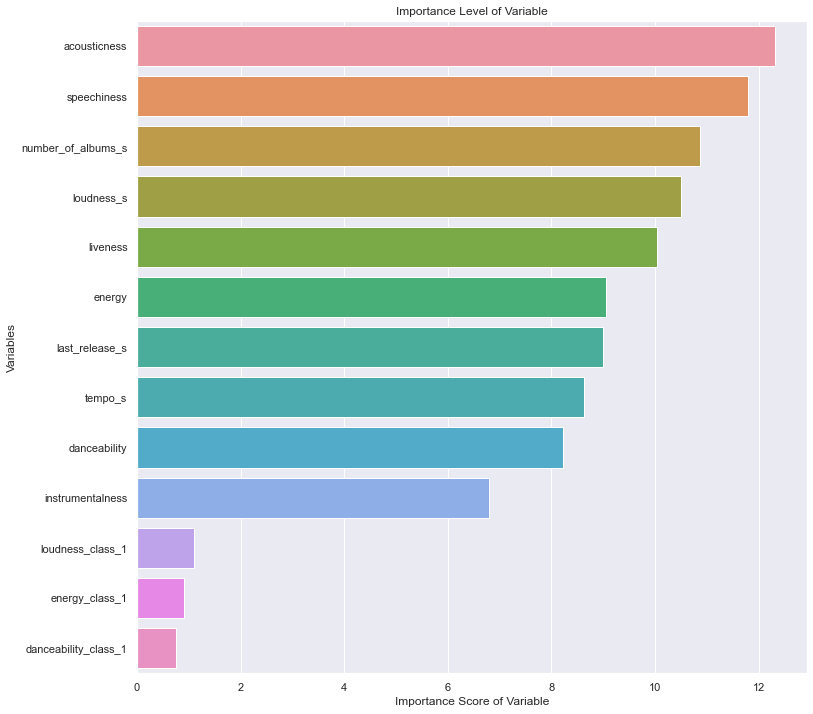

In [30]:
feature_imp = pd.Series(model.feature_importances_,
                        index=X_train.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Importance Score of Variable')
plt.ylabel('Variables')
plt.title("Importance Level of Variable")
plt.show()

Acousticness, speechiness, number of albums_s, loudness_s, liveness has more than 10 importance level on dependent variable. Dependent variable (popularity) has range between 0 - 100, so importance level between 0 to 100.

#### Visualization of y_pred and y_test

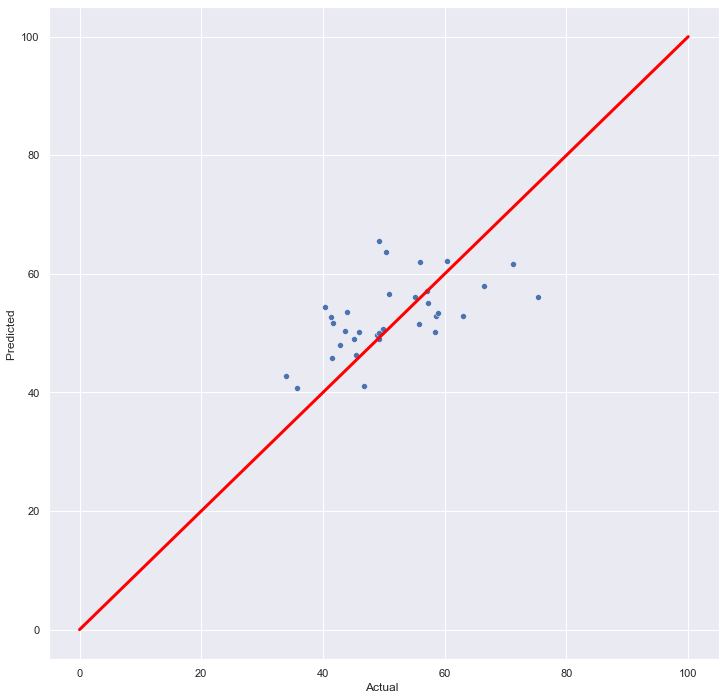

In [31]:
sns.scatterplot(y_test, y_pred)
plt.xlabel('Actual ')
plt.ylabel('Predicted ')
plt.plot([0, 100], [0, 100], color='red', lw=3) #Plot a diagonal length (Popularity variable can be between 0-100)
plt.show()

If the points in the scatter plot are gathered on the diagonal curve, it can be interpreted that the error of the estimations is low. The prediction error is high in this model.

Text(0.5, 1.0, 'Residual Table')

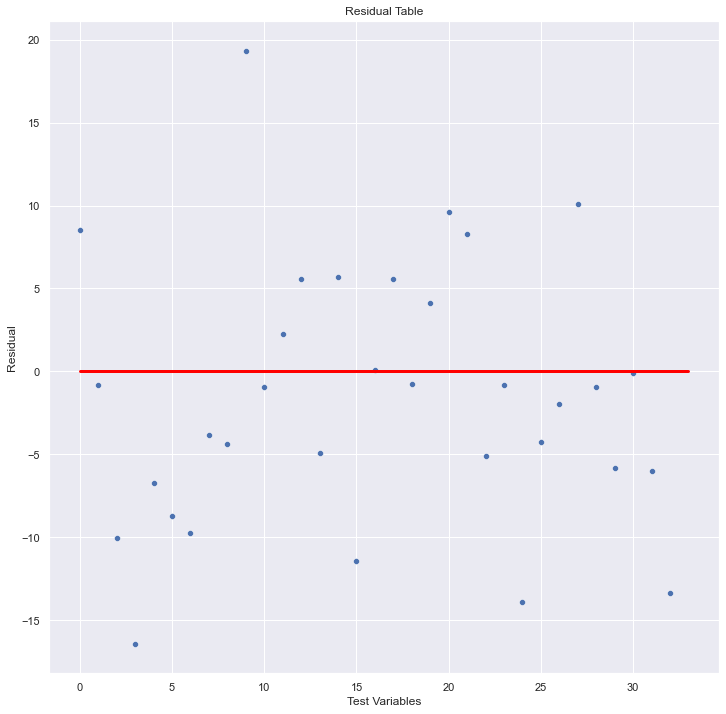

In [32]:
eror=y_test - y_pred
sns.scatterplot(range(len(eror)),eror)
plt.plot([0, 33], [0, 0], color='red', lw=3) #Plot a diagonal length
plt.xlabel('Test Variables')
plt.ylabel('Residual')
plt.title("Residual Table")

##### Summary of the Graph
Normality is the assumption that the underlying residuals are normally distributed, or approximately so. If the residuals are normally distributed predictors technically mean the same things at different levels of the dependent variable(Chris, 2014). 

##### Learning Curve of CatBoost 
The green point is using for to understand overlearning of the model. Green point gives the best iteration is reaced by the algorithm. With using early_stopping_round paramater, the overlearning problem can be solved (Pramoditha, 2022).


In [33]:
tuplee = (X_test,y_test)

model = CatBoostRegressor().fit(X_train, y_train,plot=True,eval_set = tuplee)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.033835
0:	learn: 12.7345805	test: 9.5893743	best: 9.5893743 (0)	total: 1.13ms	remaining: 1.13s
1:	learn: 12.6068556	test: 9.5627834	best: 9.5627834 (1)	total: 1.61ms	remaining: 805ms
2:	learn: 12.5085907	test: 9.5718630	best: 9.5627834 (1)	total: 2.12ms	remaining: 704ms
3:	learn: 12.4071897	test: 9.4917609	best: 9.4917609 (3)	total: 2.64ms	remaining: 657ms
4:	learn: 12.2975604	test: 9.4860338	best: 9.4860338 (4)	total: 3.08ms	remaining: 613ms
5:	learn: 12.2081644	test: 9.4490653	best: 9.4490653 (5)	total: 3.49ms	remaining: 578ms
6:	learn: 12.1073099	test: 9.4426565	best: 9.4426565 (6)	total: 4.02ms	remaining: 570ms
7:	learn: 12.0210748	test: 9.4349956	best: 9.4349956 (7)	total: 4.48ms	remaining: 556ms
8:	learn: 11.9032871	test: 9.4224630	best: 9.4224630 (8)	total: 4.92ms	remaining: 542ms
9:	learn: 11.8207862	test: 9.3541383	best: 9.3541383 (9)	total: 5.31ms	remaining: 526ms
10:	learn: 11.7183512	test: 9.3342103	best: 9.3342103 (10)	total: 5.76ms	remaining: 518ms


351:	learn: 1.6864405	test: 8.4142242	best: 8.3536497 (310)	total: 181ms	remaining: 333ms
352:	learn: 1.6735845	test: 8.4147476	best: 8.3536497 (310)	total: 181ms	remaining: 333ms
353:	learn: 1.6620886	test: 8.4174517	best: 8.3536497 (310)	total: 182ms	remaining: 332ms
354:	learn: 1.6544197	test: 8.4174046	best: 8.3536497 (310)	total: 183ms	remaining: 332ms
355:	learn: 1.6506929	test: 8.4164881	best: 8.3536497 (310)	total: 183ms	remaining: 331ms
356:	learn: 1.6470405	test: 8.4155853	best: 8.3536497 (310)	total: 183ms	remaining: 330ms
357:	learn: 1.6311657	test: 8.4179781	best: 8.3536497 (310)	total: 184ms	remaining: 330ms
358:	learn: 1.6223890	test: 8.4167516	best: 8.3536497 (310)	total: 184ms	remaining: 329ms
359:	learn: 1.6114254	test: 8.4193455	best: 8.3536497 (310)	total: 185ms	remaining: 328ms
360:	learn: 1.6024391	test: 8.4161771	best: 8.3536497 (310)	total: 185ms	remaining: 328ms
361:	learn: 1.5989425	test: 8.4153176	best: 8.3536497 (310)	total: 186ms	remaining: 328ms
362:	learn

681:	learn: 0.2465410	test: 8.4297052	best: 8.3536497 (310)	total: 365ms	remaining: 170ms
682:	learn: 0.2449743	test: 8.4298280	best: 8.3536497 (310)	total: 366ms	remaining: 170ms
683:	learn: 0.2430354	test: 8.4295152	best: 8.3536497 (310)	total: 366ms	remaining: 169ms
684:	learn: 0.2414827	test: 8.4292530	best: 8.3536497 (310)	total: 367ms	remaining: 169ms
685:	learn: 0.2392445	test: 8.4290659	best: 8.3536497 (310)	total: 367ms	remaining: 168ms
686:	learn: 0.2377375	test: 8.4288122	best: 8.3536497 (310)	total: 368ms	remaining: 168ms
687:	learn: 0.2364931	test: 8.4291252	best: 8.3536497 (310)	total: 369ms	remaining: 167ms
688:	learn: 0.2346275	test: 8.4292434	best: 8.3536497 (310)	total: 369ms	remaining: 167ms
689:	learn: 0.2323973	test: 8.4297829	best: 8.3536497 (310)	total: 370ms	remaining: 166ms
690:	learn: 0.2306026	test: 8.4298989	best: 8.3536497 (310)	total: 370ms	remaining: 166ms
691:	learn: 0.2291136	test: 8.4300462	best: 8.3536497 (310)	total: 371ms	remaining: 165ms
692:	learn

In [34]:
catb_model_setted = CatBoostRegressor().fit(X_train, y_train,early_stopping_rounds=310)
y_pred = catb_model_setted.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

Learning rate set to 0.027134
0:	learn: 12.7574733	total: 1.03ms	remaining: 1.03s
1:	learn: 12.6547155	total: 1.41ms	remaining: 706ms
2:	learn: 12.5754242	total: 1.78ms	remaining: 593ms
3:	learn: 12.4933834	total: 2.17ms	remaining: 541ms
4:	learn: 12.4043064	total: 2.54ms	remaining: 506ms
5:	learn: 12.3315309	total: 2.9ms	remaining: 481ms
6:	learn: 12.2496150	total: 3.32ms	remaining: 471ms
7:	learn: 12.1791300	total: 3.96ms	remaining: 491ms
8:	learn: 12.0829289	total: 4.47ms	remaining: 493ms
9:	learn: 12.0150383	total: 4.99ms	remaining: 494ms
10:	learn: 11.9311262	total: 5.46ms	remaining: 491ms
11:	learn: 11.8403780	total: 5.84ms	remaining: 481ms
12:	learn: 11.7609826	total: 6.25ms	remaining: 475ms
13:	learn: 11.6998739	total: 6.66ms	remaining: 469ms
14:	learn: 11.6267378	total: 7.14ms	remaining: 469ms
15:	learn: 11.5539327	total: 7.67ms	remaining: 472ms
16:	learn: 11.5072463	total: 8.03ms	remaining: 464ms
17:	learn: 11.4187022	total: 8.35ms	remaining: 456ms
18:	learn: 11.3464691	total

367:	learn: 2.5213064	total: 184ms	remaining: 316ms
368:	learn: 2.5082107	total: 185ms	remaining: 316ms
369:	learn: 2.5049938	total: 186ms	remaining: 316ms
370:	learn: 2.5023456	total: 186ms	remaining: 316ms
371:	learn: 2.4999993	total: 187ms	remaining: 315ms
372:	learn: 2.4870012	total: 187ms	remaining: 315ms
373:	learn: 2.4844029	total: 188ms	remaining: 315ms
374:	learn: 2.4812999	total: 189ms	remaining: 314ms
375:	learn: 2.4790200	total: 189ms	remaining: 314ms
376:	learn: 2.4681966	total: 190ms	remaining: 314ms
377:	learn: 2.4659381	total: 191ms	remaining: 313ms
378:	learn: 2.4637081	total: 191ms	remaining: 313ms
379:	learn: 2.4531394	total: 191ms	remaining: 312ms
380:	learn: 2.4428334	total: 192ms	remaining: 312ms
381:	learn: 2.4406165	total: 192ms	remaining: 311ms
382:	learn: 2.4311652	total: 193ms	remaining: 311ms
383:	learn: 2.4289728	total: 193ms	remaining: 310ms
384:	learn: 2.4189581	total: 194ms	remaining: 310ms
385:	learn: 2.4167859	total: 195ms	remaining: 310ms
386:	learn: 

699:	learn: 0.6035023	total: 369ms	remaining: 158ms
700:	learn: 0.6017824	total: 370ms	remaining: 158ms
701:	learn: 0.5990770	total: 371ms	remaining: 157ms
702:	learn: 0.5964294	total: 371ms	remaining: 157ms
703:	learn: 0.5950960	total: 372ms	remaining: 156ms
704:	learn: 0.5926361	total: 372ms	remaining: 156ms
705:	learn: 0.5918350	total: 373ms	remaining: 155ms
706:	learn: 0.5905378	total: 374ms	remaining: 155ms
707:	learn: 0.5879786	total: 374ms	remaining: 154ms
708:	learn: 0.5872059	total: 375ms	remaining: 154ms
709:	learn: 0.5864238	total: 375ms	remaining: 153ms
710:	learn: 0.5854573	total: 376ms	remaining: 153ms
711:	learn: 0.5846883	total: 377ms	remaining: 152ms
712:	learn: 0.5839312	total: 377ms	remaining: 152ms
713:	learn: 0.5825409	total: 378ms	remaining: 151ms
714:	learn: 0.5817930	total: 378ms	remaining: 151ms
715:	learn: 0.5810833	total: 379ms	remaining: 150ms
716:	learn: 0.5801680	total: 379ms	remaining: 150ms
717:	learn: 0.5794329	total: 380ms	remaining: 149ms
718:	learn: 

7.9638159564424

In [35]:
r2_score(y_test,y_pred)

0.29906516110864245

After 310 iterations, the model begins an over-learning state. To prevent this, the early_stopping_round=310 parameter should be used while doing grid search.

#### Model Tuning

All the parameters of catboost are None by default, which means unset. So I am trying different variables to reach better score than default parameters by using GridSearch. I tried to find optimum values for 'iterations', 'learning_rate','depth' (Glossary of Common Terms and API Elements, n.d.). 

I used cross_validation(cv) = 10, which is using for runing the code 10 times and take the average of the rmse and r^2 values. 

n_jobs = -1 is used for running the grid Search with whole memories in the system. (To make it faster.)

Verbose is a parameter used to display each iteration in the output. Any value can be used for it, but if you want to check full verbosity you need to set verbose >= 10. 



I used GridSearch to find optimum default values of parameters that are iteration, learning_rate and depth.However, Catboost parameters dont have any default values so I tried random numbers (CatBoost - State-of-the-Art Open-Source Gradient Boosting Library with Categorical Features Support, n.d.)(Using Grid Search to Optimise CatBoost Parameters, n.d.).


depth: Depth of the tree
learning_rate: Reducing the gradient step.
iterations: The maximum number of trees that can be built



In [36]:
catb_params = {'depth': [None,6,8,10],
              'learning_rate' : [0.01, 0.03,0.05, 0.1],
              'iterations'    : [None,30, 50, 100,500]
                 }

catb_model = CatBoostRegressor().fit(X_train, y_train,eval_set = tuplee,early_stopping_rounds=310)
catb_cv_model = GridSearchCV(catb_model, 
                           catb_params, 
                           cv = 10, 
                           n_jobs = -1, 
                           verbose = 2).fit(X_train, y_train)

Learning rate set to 0.033835
0:	learn: 12.7345805	test: 9.5893743	best: 9.5893743 (0)	total: 1.24ms	remaining: 1.24s
1:	learn: 12.6068556	test: 9.5627834	best: 9.5627834 (1)	total: 1.75ms	remaining: 871ms
2:	learn: 12.5085907	test: 9.5718630	best: 9.5627834 (1)	total: 2.21ms	remaining: 734ms
3:	learn: 12.4071897	test: 9.4917609	best: 9.4917609 (3)	total: 2.65ms	remaining: 660ms
4:	learn: 12.2975604	test: 9.4860338	best: 9.4860338 (4)	total: 3.11ms	remaining: 620ms
5:	learn: 12.2081644	test: 9.4490653	best: 9.4490653 (5)	total: 3.66ms	remaining: 607ms
6:	learn: 12.1073099	test: 9.4426565	best: 9.4426565 (6)	total: 4.13ms	remaining: 587ms
7:	learn: 12.0210748	test: 9.4349956	best: 9.4349956 (7)	total: 4.52ms	remaining: 560ms
8:	learn: 11.9032871	test: 9.4224630	best: 9.4224630 (8)	total: 5.07ms	remaining: 558ms
9:	learn: 11.8207862	test: 9.3541383	best: 9.3541383 (9)	total: 5.38ms	remaining: 533ms
10:	learn: 11.7183512	test: 9.3342103	best: 9.3342103 (10)	total: 5.96ms	remaining: 536ms


319:	learn: 2.0099358	test: 8.3656613	best: 8.3536497 (310)	total: 183ms	remaining: 389ms
320:	learn: 1.9948828	test: 8.3728952	best: 8.3536497 (310)	total: 184ms	remaining: 389ms
321:	learn: 1.9836763	test: 8.3713498	best: 8.3536497 (310)	total: 185ms	remaining: 389ms
322:	learn: 1.9689618	test: 8.3784573	best: 8.3536497 (310)	total: 185ms	remaining: 389ms
323:	learn: 1.9645133	test: 8.3783645	best: 8.3536497 (310)	total: 186ms	remaining: 388ms
324:	learn: 1.9601390	test: 8.3782872	best: 8.3536497 (310)	total: 187ms	remaining: 388ms
325:	learn: 1.9456966	test: 8.3852622	best: 8.3536497 (310)	total: 187ms	remaining: 387ms
326:	learn: 1.9357348	test: 8.3847733	best: 8.3536497 (310)	total: 188ms	remaining: 387ms
327:	learn: 1.9314476	test: 8.3846934	best: 8.3536497 (310)	total: 189ms	remaining: 386ms
328:	learn: 1.9172956	test: 8.3915108	best: 8.3536497 (310)	total: 189ms	remaining: 386ms
329:	learn: 1.9130684	test: 8.3914321	best: 8.3536497 (310)	total: 190ms	remaining: 386ms
330:	learn

Fitting 10 folds for each of 80 candidates, totalling 800 fits
0:	learn: 12.5482560	total: 57.5ms	remaining: 57.4s
1:	learn: 12.5160951	total: 58.1ms	remaining: 29s
2:	learn: 12.4916711	total: 59ms	remaining: 19.6s
3:	learn: 12.4607126	total: 60ms	remaining: 14.9s
4:	learn: 12.4274114	total: 60.9ms	remaining: 12.1s
5:	learn: 12.3985020	total: 61.6ms	remaining: 10.2s
6:	learn: 12.3738454	total: 62.1ms	remaining: 8.8s
7:	learn: 12.3473703	total: 62.5ms	remaining: 7.75s
8:	learn: 12.3148033	total: 63.2ms	remaining: 6.96s
9:	learn: 12.2871637	total: 65.1ms	remaining: 6.45s
10:	learn: 12.2559890	total: 66.2ms	remaining: 5.95s
11:	learn: 12.2245405	total: 66.7ms	remaining: 5.49s
12:	learn: 12.1966110	total: 67.1ms	remaining: 5.1s
13:	learn: 12.1685959	total: 68.5ms	remaining: 4.82s
14:	learn: 12.1425535	total: 69.7ms	remaining: 4.57s
15:	learn: 12.1181133	total: 70.2ms	remaining: 4.32s
16:	learn: 12.0929182	total: 70.7ms	remaining: 4.09s
17:	learn: 12.0658891	total: 71.1ms	remaining: 3.88s
1

313:	learn: 6.6639194	total: 287ms	remaining: 627ms
314:	learn: 6.6504751	total: 287ms	remaining: 625ms
315:	learn: 6.6374885	total: 288ms	remaining: 623ms
316:	learn: 6.6214750	total: 288ms	remaining: 621ms
317:	learn: 6.6035516	total: 289ms	remaining: 619ms
318:	learn: 6.5966949	total: 289ms	remaining: 617ms
319:	learn: 6.5808782	total: 290ms	remaining: 616ms
320:	learn: 6.5703152	total: 291ms	remaining: 616ms
321:	learn: 6.5543374	total: 292ms	remaining: 615ms
322:	learn: 6.5395763	total: 293ms	remaining: 614ms
323:	learn: 6.5270895	total: 294ms	remaining: 613ms
324:	learn: 6.5148347	total: 294ms	remaining: 611ms
325:	learn: 6.5029476	total: 295ms	remaining: 610ms
326:	learn: 6.4951917	total: 296ms	remaining: 608ms
327:	learn: 6.4840657	total: 296ms	remaining: 607ms
328:	learn: 6.4692678	total: 296ms	remaining: 605ms
329:	learn: 6.4564336	total: 297ms	remaining: 604ms
330:	learn: 6.4433530	total: 298ms	remaining: 602ms
331:	learn: 6.4290668	total: 298ms	remaining: 600ms
332:	learn: 

627:	learn: 3.6673948	total: 508ms	remaining: 301ms
628:	learn: 3.6566263	total: 509ms	remaining: 300ms
629:	learn: 3.6461655	total: 509ms	remaining: 299ms
630:	learn: 3.6364655	total: 510ms	remaining: 298ms
631:	learn: 3.6231829	total: 510ms	remaining: 297ms
632:	learn: 3.6202383	total: 511ms	remaining: 296ms
633:	learn: 3.6077239	total: 511ms	remaining: 295ms
634:	learn: 3.5975328	total: 511ms	remaining: 294ms
635:	learn: 3.5851266	total: 512ms	remaining: 293ms
636:	learn: 3.5751429	total: 512ms	remaining: 292ms
637:	learn: 3.5728307	total: 513ms	remaining: 291ms
638:	learn: 3.5702026	total: 513ms	remaining: 290ms
639:	learn: 3.5645024	total: 514ms	remaining: 289ms
640:	learn: 3.5543688	total: 514ms	remaining: 288ms
641:	learn: 3.5466842	total: 515ms	remaining: 287ms
642:	learn: 3.5443018	total: 515ms	remaining: 286ms
643:	learn: 3.5322791	total: 515ms	remaining: 285ms
644:	learn: 3.5201191	total: 517ms	remaining: 284ms
645:	learn: 3.5089410	total: 518ms	remaining: 284ms
646:	learn: 

940:	learn: 2.4622437	total: 768ms	remaining: 48.1ms
941:	learn: 2.4572466	total: 768ms	remaining: 47.3ms
942:	learn: 2.4506016	total: 770ms	remaining: 46.5ms
943:	learn: 2.4458771	total: 771ms	remaining: 45.7ms
944:	learn: 2.4401273	total: 772ms	remaining: 44.9ms
945:	learn: 2.4387746	total: 773ms	remaining: 44.1ms
946:	learn: 2.4348143	total: 775ms	remaining: 43.4ms
947:	learn: 2.4287850	total: 776ms	remaining: 42.6ms
948:	learn: 2.4238549	total: 777ms	remaining: 41.7ms
949:	learn: 2.4189887	total: 777ms	remaining: 40.9ms
950:	learn: 2.4141698	total: 778ms	remaining: 40.1ms
951:	learn: 2.4082669	total: 779ms	remaining: 39.3ms
952:	learn: 2.4023909	total: 780ms	remaining: 38.5ms
953:	learn: 2.3978028	total: 781ms	remaining: 37.7ms
954:	learn: 2.3919887	total: 782ms	remaining: 36.8ms
955:	learn: 2.3904835	total: 782ms	remaining: 36ms
956:	learn: 2.3856796	total: 783ms	remaining: 35.2ms
957:	learn: 2.3794556	total: 783ms	remaining: 34.3ms
958:	learn: 2.3756133	total: 784ms	remaining: 33

250:	learn: 7.3528072	total: 198ms	remaining: 590ms
251:	learn: 7.3343531	total: 198ms	remaining: 588ms
252:	learn: 7.3199635	total: 199ms	remaining: 587ms
253:	learn: 7.3063933	total: 199ms	remaining: 585ms
254:	learn: 7.2935976	total: 200ms	remaining: 583ms
255:	learn: 7.2815775	total: 200ms	remaining: 581ms
256:	learn: 7.2720179	total: 200ms	remaining: 580ms
257:	learn: 7.2592657	total: 201ms	remaining: 579ms
258:	learn: 7.2473222	total: 203ms	remaining: 581ms
259:	learn: 7.2368440	total: 204ms	remaining: 581ms
260:	learn: 7.2250823	total: 206ms	remaining: 583ms
261:	learn: 7.2177692	total: 207ms	remaining: 584ms
262:	learn: 7.2030180	total: 208ms	remaining: 584ms
263:	learn: 7.1843820	total: 210ms	remaining: 585ms
264:	learn: 7.1712097	total: 211ms	remaining: 586ms
265:	learn: 7.1538926	total: 212ms	remaining: 584ms
266:	learn: 7.1445735	total: 212ms	remaining: 583ms
267:	learn: 7.1327479	total: 213ms	remaining: 581ms
268:	learn: 7.1123010	total: 214ms	remaining: 581ms
269:	learn: 

564:	learn: 4.2059210	total: 441ms	remaining: 339ms
565:	learn: 4.1965563	total: 441ms	remaining: 338ms
566:	learn: 4.1914409	total: 442ms	remaining: 337ms
567:	learn: 4.1800062	total: 442ms	remaining: 336ms
568:	learn: 4.1766081	total: 443ms	remaining: 335ms
569:	learn: 4.1691982	total: 444ms	remaining: 335ms
570:	learn: 4.1620364	total: 444ms	remaining: 334ms
571:	learn: 4.1507867	total: 444ms	remaining: 333ms
572:	learn: 4.1463430	total: 445ms	remaining: 331ms
573:	learn: 4.1417891	total: 445ms	remaining: 330ms
574:	learn: 4.1309934	total: 446ms	remaining: 329ms
575:	learn: 4.1282693	total: 446ms	remaining: 328ms
576:	learn: 4.1246066	total: 447ms	remaining: 327ms
577:	learn: 4.1205296	total: 447ms	remaining: 326ms
578:	learn: 4.1161144	total: 447ms	remaining: 325ms
579:	learn: 4.1109153	total: 448ms	remaining: 324ms
580:	learn: 4.1060383	total: 448ms	remaining: 323ms
581:	learn: 4.1028085	total: 450ms	remaining: 323ms
582:	learn: 4.0958468	total: 450ms	remaining: 322ms
583:	learn: 

701:	learn: 0.2831299	total: 569ms	remaining: 241ms
702:	learn: 0.2801600	total: 571ms	remaining: 241ms
703:	learn: 0.2775989	total: 572ms	remaining: 241ms
704:	learn: 0.2750979	total: 573ms	remaining: 240ms
705:	learn: 0.2724158	total: 574ms	remaining: 239ms
706:	learn: 0.2706623	total: 574ms	remaining: 238ms
707:	learn: 0.2680559	total: 574ms	remaining: 237ms
708:	learn: 0.2654909	total: 585ms	remaining: 240ms
709:	learn: 0.2638320	total: 586ms	remaining: 239ms
710:	learn: 0.2615804	total: 587ms	remaining: 239ms
711:	learn: 0.2590743	total: 588ms	remaining: 238ms
712:	learn: 0.2566416	total: 589ms	remaining: 237ms
713:	learn: 0.2542115	total: 590ms	remaining: 236ms
714:	learn: 0.2518922	total: 590ms	remaining: 235ms
715:	learn: 0.2495565	total: 591ms	remaining: 234ms
716:	learn: 0.2472299	total: 591ms	remaining: 233ms
717:	learn: 0.2447949	total: 592ms	remaining: 232ms
718:	learn: 0.2437030	total: 592ms	remaining: 231ms
719:	learn: 0.2414595	total: 593ms	remaining: 230ms
720:	learn: 

879:	learn: 0.1784057	total: 647ms	remaining: 88.2ms
880:	learn: 0.1770394	total: 647ms	remaining: 87.4ms
881:	learn: 0.1764669	total: 648ms	remaining: 86.7ms
882:	learn: 0.1755453	total: 648ms	remaining: 85.9ms
883:	learn: 0.1749861	total: 649ms	remaining: 85.1ms
884:	learn: 0.1746068	total: 649ms	remaining: 84.3ms
885:	learn: 0.1732804	total: 649ms	remaining: 83.6ms
886:	learn: 0.1724944	total: 650ms	remaining: 82.8ms
887:	learn: 0.1721255	total: 650ms	remaining: 82ms
888:	learn: 0.1717616	total: 651ms	remaining: 81.3ms
889:	learn: 0.1715626	total: 651ms	remaining: 80.5ms
890:	learn: 0.1702676	total: 652ms	remaining: 79.7ms
891:	learn: 0.1695146	total: 652ms	remaining: 79ms
892:	learn: 0.1682427	total: 653ms	remaining: 78.2ms
893:	learn: 0.1678889	total: 653ms	remaining: 77.4ms
894:	learn: 0.1664810	total: 653ms	remaining: 76.7ms
895:	learn: 0.1659290	total: 659ms	remaining: 76.5ms
896:	learn: 0.1646923	total: 660ms	remaining: 75.8ms
897:	learn: 0.1641421	total: 661ms	remaining: 75.1

190:	learn: 4.2396520	total: 185ms	remaining: 784ms
191:	learn: 4.2072839	total: 186ms	remaining: 782ms
192:	learn: 4.1971701	total: 187ms	remaining: 781ms
193:	learn: 4.1839277	total: 187ms	remaining: 778ms
194:	learn: 4.1758949	total: 188ms	remaining: 775ms
195:	learn: 4.1412130	total: 188ms	remaining: 772ms
196:	learn: 4.1324190	total: 189ms	remaining: 769ms
197:	learn: 4.1222550	total: 190ms	remaining: 769ms
198:	learn: 4.0891098	total: 190ms	remaining: 766ms
199:	learn: 4.0820558	total: 191ms	remaining: 763ms
200:	learn: 4.0756124	total: 191ms	remaining: 759ms
201:	learn: 4.0447375	total: 191ms	remaining: 756ms
202:	learn: 4.0204560	total: 192ms	remaining: 753ms
203:	learn: 4.0108687	total: 192ms	remaining: 750ms
204:	learn: 4.0026871	total: 193ms	remaining: 749ms
205:	learn: 3.9699449	total: 194ms	remaining: 746ms
206:	learn: 3.9371029	total: 195ms	remaining: 746ms
207:	learn: 3.9278923	total: 196ms	remaining: 745ms
208:	learn: 3.9201970	total: 196ms	remaining: 742ms
209:	learn: 

506:	learn: 0.1007162	total: 422ms	remaining: 411ms
507:	learn: 0.0999940	total: 423ms	remaining: 410ms
508:	learn: 0.0987607	total: 423ms	remaining: 408ms
509:	learn: 0.0979912	total: 424ms	remaining: 407ms
510:	learn: 0.0972635	total: 424ms	remaining: 406ms
511:	learn: 0.0958831	total: 425ms	remaining: 405ms
512:	learn: 0.0952150	total: 426ms	remaining: 405ms
513:	learn: 0.0944352	total: 428ms	remaining: 405ms
514:	learn: 0.0932479	total: 429ms	remaining: 404ms
515:	learn: 0.0927943	total: 429ms	remaining: 403ms
516:	learn: 0.0923499	total: 430ms	remaining: 401ms
517:	learn: 0.0911801	total: 430ms	remaining: 400ms
518:	learn: 0.0905832	total: 431ms	remaining: 399ms
519:	learn: 0.0891010	total: 431ms	remaining: 398ms
520:	learn: 0.0885689	total: 432ms	remaining: 397ms
521:	learn: 0.0879973	total: 434ms	remaining: 398ms
522:	learn: 0.0874852	total: 435ms	remaining: 396ms
523:	learn: 0.0862898	total: 435ms	remaining: 395ms
524:	learn: 0.0849028	total: 436ms	remaining: 394ms
525:	learn: 

820:	learn: 0.0085793	total: 679ms	remaining: 148ms
821:	learn: 0.0085145	total: 680ms	remaining: 147ms
822:	learn: 0.0084348	total: 680ms	remaining: 146ms
823:	learn: 0.0083739	total: 681ms	remaining: 145ms
824:	learn: 0.0083145	total: 681ms	remaining: 144ms
825:	learn: 0.0082182	total: 682ms	remaining: 144ms
826:	learn: 0.0081577	total: 682ms	remaining: 143ms
827:	learn: 0.0080641	total: 683ms	remaining: 142ms
828:	learn: 0.0080083	total: 683ms	remaining: 141ms
829:	learn: 0.0078880	total: 683ms	remaining: 140ms
830:	learn: 0.0078182	total: 684ms	remaining: 139ms
831:	learn: 0.0077658	total: 684ms	remaining: 138ms
832:	learn: 0.0076573	total: 685ms	remaining: 137ms
833:	learn: 0.0076432	total: 685ms	remaining: 136ms
834:	learn: 0.0075555	total: 686ms	remaining: 135ms
835:	learn: 0.0074767	total: 686ms	remaining: 135ms
836:	learn: 0.0074067	total: 686ms	remaining: 134ms
837:	learn: 0.0073295	total: 687ms	remaining: 133ms
838:	learn: 0.0072940	total: 687ms	remaining: 132ms
839:	learn: 

128:	learn: 3.5452228	total: 92.2ms	remaining: 622ms
129:	learn: 3.4889127	total: 92.6ms	remaining: 620ms
130:	learn: 3.4428776	total: 96.4ms	remaining: 640ms
131:	learn: 3.3875424	total: 96.9ms	remaining: 637ms
132:	learn: 3.3389889	total: 97.4ms	remaining: 635ms
133:	learn: 3.3226433	total: 97.8ms	remaining: 632ms
134:	learn: 3.3111874	total: 98.3ms	remaining: 630ms
135:	learn: 3.2965183	total: 98.7ms	remaining: 627ms
136:	learn: 3.2649602	total: 99.2ms	remaining: 625ms
137:	learn: 3.2279284	total: 99.6ms	remaining: 622ms
138:	learn: 3.1816062	total: 100ms	remaining: 620ms
139:	learn: 3.1739441	total: 100ms	remaining: 616ms
140:	learn: 3.1608462	total: 102ms	remaining: 620ms
141:	learn: 3.1214377	total: 103ms	remaining: 623ms
142:	learn: 3.1118697	total: 104ms	remaining: 621ms
143:	learn: 3.0629874	total: 104ms	remaining: 620ms
144:	learn: 3.0505076	total: 105ms	remaining: 619ms
145:	learn: 3.0428059	total: 106ms	remaining: 620ms
146:	learn: 3.0333227	total: 106ms	remaining: 618ms
14

442:	learn: 0.2362631	total: 336ms	remaining: 422ms
443:	learn: 0.2341286	total: 336ms	remaining: 421ms
444:	learn: 0.2324613	total: 337ms	remaining: 420ms
445:	learn: 0.2304362	total: 338ms	remaining: 420ms
446:	learn: 0.2286518	total: 339ms	remaining: 420ms
447:	learn: 0.2271019	total: 340ms	remaining: 420ms
448:	learn: 0.2252188	total: 342ms	remaining: 420ms
449:	learn: 0.2236776	total: 343ms	remaining: 420ms
450:	learn: 0.2228307	total: 344ms	remaining: 419ms
451:	learn: 0.2211816	total: 344ms	remaining: 417ms
452:	learn: 0.2203844	total: 345ms	remaining: 416ms
453:	learn: 0.2189561	total: 345ms	remaining: 415ms
454:	learn: 0.2174721	total: 345ms	remaining: 414ms
455:	learn: 0.2162800	total: 346ms	remaining: 413ms
456:	learn: 0.2155375	total: 346ms	remaining: 411ms
457:	learn: 0.2143850	total: 347ms	remaining: 410ms
458:	learn: 0.2136831	total: 347ms	remaining: 409ms
459:	learn: 0.2123175	total: 347ms	remaining: 408ms
460:	learn: 0.2118261	total: 348ms	remaining: 407ms
461:	learn: 

759:	learn: 0.0167147	total: 579ms	remaining: 183ms
760:	learn: 0.0165389	total: 580ms	remaining: 182ms
761:	learn: 0.0164357	total: 580ms	remaining: 181ms
762:	learn: 0.0162076	total: 581ms	remaining: 180ms
763:	learn: 0.0159870	total: 581ms	remaining: 180ms
764:	learn: 0.0158140	total: 582ms	remaining: 179ms
765:	learn: 0.0157686	total: 582ms	remaining: 178ms
766:	learn: 0.0157243	total: 584ms	remaining: 177ms
767:	learn: 0.0155556	total: 585ms	remaining: 177ms
768:	learn: 0.0154892	total: 588ms	remaining: 177ms
769:	learn: 0.0154463	total: 588ms	remaining: 176ms
770:	learn: 0.0153817	total: 589ms	remaining: 175ms
771:	learn: 0.0151773	total: 589ms	remaining: 174ms
772:	learn: 0.0150389	total: 589ms	remaining: 173ms
773:	learn: 0.0149976	total: 590ms	remaining: 172ms
774:	learn: 0.0149574	total: 590ms	remaining: 171ms
775:	learn: 0.0147619	total: 591ms	remaining: 171ms
776:	learn: 0.0146400	total: 591ms	remaining: 170ms
777:	learn: 0.0146009	total: 592ms	remaining: 169ms
778:	learn: 

67:	learn: 3.5722964	total: 53.8ms	remaining: 738ms
68:	learn: 3.4724916	total: 54.2ms	remaining: 732ms
69:	learn: 3.3857319	total: 54.7ms	remaining: 727ms
70:	learn: 3.3193316	total: 55.1ms	remaining: 721ms
71:	learn: 3.2401891	total: 55.6ms	remaining: 716ms
72:	learn: 3.1471151	total: 56ms	remaining: 711ms
73:	learn: 3.0661664	total: 56.4ms	remaining: 706ms
74:	learn: 3.0069325	total: 57.6ms	remaining: 710ms
75:	learn: 2.9575481	total: 58.6ms	remaining: 712ms
76:	learn: 2.9386134	total: 59.4ms	remaining: 713ms
77:	learn: 2.8449515	total: 60.6ms	remaining: 716ms
78:	learn: 2.7592142	total: 61ms	remaining: 712ms
79:	learn: 2.7441138	total: 61.5ms	remaining: 707ms
80:	learn: 2.7290283	total: 61.9ms	remaining: 702ms
81:	learn: 2.6516608	total: 62.3ms	remaining: 698ms
82:	learn: 2.5735810	total: 62.7ms	remaining: 693ms
83:	learn: 2.5596960	total: 63.2ms	remaining: 689ms
84:	learn: 2.5022304	total: 63.6ms	remaining: 685ms
85:	learn: 2.4481578	total: 64ms	remaining: 681ms
86:	learn: 2.43508

382:	learn: 0.0206344	total: 305ms	remaining: 491ms
383:	learn: 0.0202637	total: 305ms	remaining: 490ms
384:	learn: 0.0198228	total: 307ms	remaining: 490ms
385:	learn: 0.0196227	total: 308ms	remaining: 490ms
386:	learn: 0.0192125	total: 309ms	remaining: 490ms
387:	learn: 0.0188627	total: 310ms	remaining: 490ms
388:	learn: 0.0185883	total: 312ms	remaining: 490ms
389:	learn: 0.0181222	total: 313ms	remaining: 490ms
390:	learn: 0.0179465	total: 314ms	remaining: 489ms
391:	learn: 0.0177050	total: 314ms	remaining: 487ms
392:	learn: 0.0175177	total: 315ms	remaining: 486ms
393:	learn: 0.0174531	total: 315ms	remaining: 485ms
394:	learn: 0.0172918	total: 316ms	remaining: 485ms
395:	learn: 0.0172300	total: 318ms	remaining: 484ms
396:	learn: 0.0170631	total: 318ms	remaining: 484ms
397:	learn: 0.0167610	total: 319ms	remaining: 482ms
398:	learn: 0.0167012	total: 320ms	remaining: 482ms
399:	learn: 0.0163843	total: 321ms	remaining: 482ms
400:	learn: 0.0160311	total: 322ms	remaining: 481ms
401:	learn: 

696:	learn: 0.0001405	total: 577ms	remaining: 251ms
697:	learn: 0.0001395	total: 577ms	remaining: 250ms
698:	learn: 0.0001359	total: 578ms	remaining: 249ms
699:	learn: 0.0001323	total: 578ms	remaining: 248ms
700:	learn: 0.0001307	total: 578ms	remaining: 247ms
701:	learn: 0.0001298	total: 579ms	remaining: 246ms
702:	learn: 0.0001277	total: 579ms	remaining: 245ms
703:	learn: 0.0001273	total: 580ms	remaining: 244ms
704:	learn: 0.0001256	total: 580ms	remaining: 243ms
705:	learn: 0.0001242	total: 581ms	remaining: 242ms
706:	learn: 0.0001236	total: 581ms	remaining: 241ms
707:	learn: 0.0001218	total: 581ms	remaining: 240ms
708:	learn: 0.0001194	total: 582ms	remaining: 239ms
709:	learn: 0.0001191	total: 582ms	remaining: 238ms
710:	learn: 0.0001165	total: 583ms	remaining: 237ms
711:	learn: 0.0001145	total: 583ms	remaining: 236ms
712:	learn: 0.0001123	total: 584ms	remaining: 235ms
713:	learn: 0.0001103	total: 585ms	remaining: 234ms
714:	learn: 0.0001079	total: 586ms	remaining: 233ms
715:	learn: 

7:	learn: 12.0579249	total: 3.59ms	remaining: 9.88ms
8:	learn: 12.0237367	total: 4.04ms	remaining: 9.43ms
9:	learn: 11.9941413	total: 4.48ms	remaining: 8.96ms
10:	learn: 11.9673601	total: 4.91ms	remaining: 8.48ms
11:	learn: 11.9375993	total: 5.36ms	remaining: 8.04ms
12:	learn: 11.9042749	total: 5.79ms	remaining: 7.57ms
13:	learn: 11.8767652	total: 6.26ms	remaining: 7.15ms
14:	learn: 11.8423118	total: 6.71ms	remaining: 6.71ms
15:	learn: 11.8091258	total: 7.16ms	remaining: 6.26ms
16:	learn: 11.7836895	total: 7.59ms	remaining: 5.8ms
17:	learn: 11.7536216	total: 8.02ms	remaining: 5.35ms
18:	learn: 11.7239106	total: 8.47ms	remaining: 4.9ms
19:	learn: 11.7111578	total: 8.91ms	remaining: 4.45ms
20:	learn: 11.6822919	total: 9.63ms	remaining: 4.13ms
21:	learn: 11.6557624	total: 10.9ms	remaining: 3.96ms
22:	learn: 11.6317045	total: 12.4ms	remaining: 3.77ms
23:	learn: 11.5929107	total: 12.9ms	remaining: 3.23ms
24:	learn: 11.5723957	total: 13.4ms	remaining: 2.67ms
25:	learn: 11.5411229	total: 14.7

6:	learn: 11.9849600	total: 3.16ms	remaining: 10.4ms
7:	learn: 11.9095962	total: 3.6ms	remaining: 9.9ms
8:	learn: 11.8171773	total: 4.05ms	remaining: 9.46ms
9:	learn: 11.7392260	total: 4.49ms	remaining: 8.98ms
10:	learn: 11.6515718	total: 4.93ms	remaining: 8.51ms
11:	learn: 11.5639636	total: 5.38ms	remaining: 8.07ms
12:	learn: 11.4868153	total: 5.83ms	remaining: 7.63ms
13:	learn: 11.4099049	total: 6.28ms	remaining: 7.18ms
14:	learn: 11.3388691	total: 6.74ms	remaining: 6.74ms
15:	learn: 11.2717429	total: 7.16ms	remaining: 6.27ms
16:	learn: 11.2049085	total: 7.59ms	remaining: 5.81ms
17:	learn: 11.1325622	total: 8.05ms	remaining: 5.37ms
18:	learn: 11.0593273	total: 8.51ms	remaining: 4.93ms
19:	learn: 11.0015697	total: 8.95ms	remaining: 4.47ms
20:	learn: 10.9216518	total: 9.44ms	remaining: 4.05ms
21:	learn: 10.8491102	total: 9.93ms	remaining: 3.61ms
22:	learn: 10.8033434	total: 11.3ms	remaining: 3.43ms
23:	learn: 10.7477587	total: 11.8ms	remaining: 2.94ms
24:	learn: 10.6883097	total: 12.2m

62:	learn: 11.4354617	total: 46.7ms	remaining: 27.4ms
63:	learn: 11.4070120	total: 47.6ms	remaining: 26.8ms
64:	learn: 11.3792363	total: 50.1ms	remaining: 27ms
65:	learn: 11.3536071	total: 50.6ms	remaining: 26.1ms
66:	learn: 11.3261926	total: 51ms	remaining: 25.1ms
67:	learn: 11.3007421	total: 51.7ms	remaining: 24.3ms
68:	learn: 11.2797794	total: 52.2ms	remaining: 23.5ms
69:	learn: 11.2494090	total: 52.8ms	remaining: 22.6ms
70:	learn: 11.2214805	total: 53.2ms	remaining: 21.7ms
71:	learn: 11.1903800	total: 53.8ms	remaining: 20.9ms
72:	learn: 11.1696367	total: 54.2ms	remaining: 20.1ms
73:	learn: 11.1488654	total: 54.9ms	remaining: 19.3ms
74:	learn: 11.1230115	total: 55.5ms	remaining: 18.5ms
75:	learn: 11.0996601	total: 56.4ms	remaining: 17.8ms
76:	learn: 11.0665843	total: 57.1ms	remaining: 17.1ms
77:	learn: 11.0399444	total: 58.1ms	remaining: 16.4ms
78:	learn: 11.0145899	total: 58.6ms	remaining: 15.6ms
79:	learn: 10.9858463	total: 59ms	remaining: 14.7ms
80:	learn: 10.9643887	total: 59.6m

66:	learn: 10.7523692	total: 40.4ms	remaining: 261ms
67:	learn: 10.7279241	total: 40.8ms	remaining: 259ms
68:	learn: 10.7061600	total: 41.3ms	remaining: 258ms
69:	learn: 10.6767773	total: 42ms	remaining: 258ms
70:	learn: 10.6672278	total: 42.4ms	remaining: 256ms
71:	learn: 10.6512389	total: 43.3ms	remaining: 258ms
72:	learn: 10.6296866	total: 44.4ms	remaining: 260ms
73:	learn: 10.6024716	total: 45.2ms	remaining: 260ms
74:	learn: 10.5878985	total: 45.9ms	remaining: 260ms
75:	learn: 10.5723631	total: 46.4ms	remaining: 259ms
76:	learn: 10.5534901	total: 47.7ms	remaining: 262ms
77:	learn: 10.5317511	total: 48.5ms	remaining: 262ms
78:	learn: 10.5118819	total: 49.1ms	remaining: 262ms
79:	learn: 10.4878154	total: 49.6ms	remaining: 260ms
80:	learn: 10.4709629	total: 50ms	remaining: 259ms
81:	learn: 10.4393473	total: 50.5ms	remaining: 257ms
82:	learn: 10.4132889	total: 50.9ms	remaining: 256ms
83:	learn: 10.3937912	total: 51.3ms	remaining: 254ms
84:	learn: 10.3651902	total: 52.7ms	remaining: 257

379:	learn: 5.8123763	total: 254ms	remaining: 80.3ms
380:	learn: 5.7998165	total: 255ms	remaining: 79.5ms
381:	learn: 5.7931712	total: 255ms	remaining: 78.8ms
382:	learn: 5.7848314	total: 256ms	remaining: 78.3ms
383:	learn: 5.7802717	total: 257ms	remaining: 77.5ms
384:	learn: 5.7723978	total: 257ms	remaining: 76.8ms
385:	learn: 5.7613120	total: 258ms	remaining: 76.1ms
386:	learn: 5.7487951	total: 258ms	remaining: 75.3ms
387:	learn: 5.7399719	total: 258ms	remaining: 74.6ms
388:	learn: 5.7272307	total: 259ms	remaining: 73.9ms
389:	learn: 5.7144981	total: 259ms	remaining: 73.1ms
390:	learn: 5.7018593	total: 260ms	remaining: 72.4ms
391:	learn: 5.6925830	total: 260ms	remaining: 71.7ms
392:	learn: 5.6800187	total: 261ms	remaining: 71ms
393:	learn: 5.6694165	total: 263ms	remaining: 70.8ms
394:	learn: 5.6639760	total: 264ms	remaining: 70.2ms
395:	learn: 5.6492902	total: 264ms	remaining: 69.5ms
396:	learn: 5.6351176	total: 265ms	remaining: 68.8ms
397:	learn: 5.6226743	total: 266ms	remaining: 68

187:	learn: 8.5012017	total: 130ms	remaining: 215ms
188:	learn: 8.4902766	total: 130ms	remaining: 214ms
189:	learn: 8.4716069	total: 130ms	remaining: 213ms
190:	learn: 8.4603668	total: 131ms	remaining: 212ms
191:	learn: 8.4446990	total: 131ms	remaining: 211ms
192:	learn: 8.4282229	total: 132ms	remaining: 210ms
193:	learn: 8.4077461	total: 132ms	remaining: 209ms
194:	learn: 8.3878377	total: 133ms	remaining: 208ms
195:	learn: 8.3651590	total: 133ms	remaining: 207ms
196:	learn: 8.3481790	total: 134ms	remaining: 206ms
197:	learn: 8.3308155	total: 134ms	remaining: 205ms
198:	learn: 8.3097110	total: 135ms	remaining: 204ms
199:	learn: 8.2923515	total: 135ms	remaining: 202ms
200:	learn: 8.2719497	total: 135ms	remaining: 201ms
201:	learn: 8.2538163	total: 136ms	remaining: 200ms
202:	learn: 8.2422446	total: 136ms	remaining: 200ms
203:	learn: 8.2279730	total: 138ms	remaining: 200ms
204:	learn: 8.2105049	total: 139ms	remaining: 200ms
205:	learn: 8.1960108	total: 139ms	remaining: 199ms
206:	learn: 

358:	learn: 6.3085237	total: 207ms	remaining: 81.1ms
359:	learn: 6.2931217	total: 207ms	remaining: 80.5ms
360:	learn: 6.2857890	total: 207ms	remaining: 79.9ms
361:	learn: 6.2723142	total: 208ms	remaining: 79.3ms
362:	learn: 6.2635473	total: 208ms	remaining: 78.6ms
363:	learn: 6.2508464	total: 209ms	remaining: 78ms
364:	learn: 6.2303397	total: 209ms	remaining: 77.4ms
365:	learn: 6.2177653	total: 210ms	remaining: 76.9ms
366:	learn: 6.2102882	total: 211ms	remaining: 76.3ms
367:	learn: 6.1964847	total: 211ms	remaining: 75.7ms
368:	learn: 6.1858413	total: 212ms	remaining: 75.1ms
369:	learn: 6.1724985	total: 212ms	remaining: 74.5ms
370:	learn: 6.1619822	total: 213ms	remaining: 74.1ms
371:	learn: 6.1537628	total: 213ms	remaining: 73.5ms
372:	learn: 6.1412326	total: 214ms	remaining: 73ms
373:	learn: 6.1345128	total: 215ms	remaining: 72.4ms
374:	learn: 6.1323045	total: 215ms	remaining: 71.7ms
375:	learn: 6.1217440	total: 215ms	remaining: 71ms
376:	learn: 6.1028927	total: 216ms	remaining: 70.4ms

167:	learn: 4.5494932	total: 108ms	remaining: 214ms
168:	learn: 4.5126266	total: 109ms	remaining: 213ms
169:	learn: 4.4765017	total: 109ms	remaining: 212ms
170:	learn: 4.4452492	total: 110ms	remaining: 211ms
171:	learn: 4.4339100	total: 111ms	remaining: 211ms
172:	learn: 4.4175678	total: 111ms	remaining: 210ms
173:	learn: 4.3932666	total: 112ms	remaining: 209ms
174:	learn: 4.3820564	total: 112ms	remaining: 208ms
175:	learn: 4.3704821	total: 113ms	remaining: 207ms
176:	learn: 4.3613575	total: 113ms	remaining: 206ms
177:	learn: 4.3515611	total: 113ms	remaining: 205ms
178:	learn: 4.3212247	total: 114ms	remaining: 204ms
179:	learn: 4.3096314	total: 114ms	remaining: 203ms
180:	learn: 4.2992008	total: 115ms	remaining: 202ms
181:	learn: 4.2887665	total: 115ms	remaining: 201ms
182:	learn: 4.2767660	total: 116ms	remaining: 200ms
183:	learn: 4.2526838	total: 116ms	remaining: 199ms
184:	learn: 4.2423930	total: 117ms	remaining: 198ms
185:	learn: 4.2303209	total: 117ms	remaining: 198ms
186:	learn: 

479:	learn: 0.7498635	total: 305ms	remaining: 12.7ms
480:	learn: 0.7452188	total: 306ms	remaining: 12.1ms
481:	learn: 0.7390646	total: 307ms	remaining: 11.4ms
482:	learn: 0.7327148	total: 307ms	remaining: 10.8ms
483:	learn: 0.7274537	total: 307ms	remaining: 10.2ms
484:	learn: 0.7215038	total: 308ms	remaining: 9.52ms
485:	learn: 0.7168130	total: 308ms	remaining: 8.88ms
486:	learn: 0.7118425	total: 309ms	remaining: 8.24ms
487:	learn: 0.7076236	total: 309ms	remaining: 7.6ms
488:	learn: 0.7016740	total: 310ms	remaining: 6.96ms
489:	learn: 0.6973294	total: 310ms	remaining: 6.33ms
490:	learn: 0.6924927	total: 310ms	remaining: 5.69ms
491:	learn: 0.6883778	total: 311ms	remaining: 5.05ms
492:	learn: 0.6836117	total: 312ms	remaining: 4.42ms
493:	learn: 0.6802598	total: 313ms	remaining: 3.8ms
494:	learn: 0.6765476	total: 313ms	remaining: 3.16ms
495:	learn: 0.6731461	total: 314ms	remaining: 2.53ms
496:	learn: 0.6692507	total: 314ms	remaining: 1.9ms
497:	learn: 0.6661117	total: 315ms	remaining: 1.2

291:	learn: 2.1776696	total: 186ms	remaining: 133ms
292:	learn: 2.1620500	total: 187ms	remaining: 132ms
293:	learn: 2.1491086	total: 188ms	remaining: 132ms
294:	learn: 2.1312259	total: 189ms	remaining: 131ms
295:	learn: 2.1188123	total: 190ms	remaining: 131ms
296:	learn: 2.1071300	total: 190ms	remaining: 130ms
297:	learn: 2.0950904	total: 191ms	remaining: 129ms
298:	learn: 2.0817914	total: 191ms	remaining: 129ms
299:	learn: 2.0702477	total: 192ms	remaining: 128ms
300:	learn: 2.0590450	total: 192ms	remaining: 127ms
301:	learn: 2.0419186	total: 193ms	remaining: 127ms
302:	learn: 2.0383033	total: 194ms	remaining: 126ms
303:	learn: 2.0255754	total: 194ms	remaining: 125ms
304:	learn: 2.0114556	total: 194ms	remaining: 124ms
305:	learn: 2.0082291	total: 195ms	remaining: 124ms
306:	learn: 1.9918682	total: 195ms	remaining: 123ms
307:	learn: 1.9885243	total: 196ms	remaining: 122ms
308:	learn: 1.9760106	total: 196ms	remaining: 121ms
309:	learn: 1.9635623	total: 197ms	remaining: 121ms
310:	learn: 

100:	learn: 9.8250085	total: 67.3ms	remaining: 599ms
101:	learn: 9.8178576	total: 67.5ms	remaining: 594ms
102:	learn: 9.8024897	total: 67.9ms	remaining: 592ms
103:	learn: 9.7821384	total: 68.4ms	remaining: 589ms
104:	learn: 9.7637701	total: 68.8ms	remaining: 587ms
105:	learn: 9.7361765	total: 69.3ms	remaining: 584ms
106:	learn: 9.7129690	total: 69.8ms	remaining: 582ms
107:	learn: 9.6998840	total: 70.8ms	remaining: 584ms
108:	learn: 9.6847178	total: 71.2ms	remaining: 582ms
109:	learn: 9.6533919	total: 71.6ms	remaining: 579ms
110:	learn: 9.6256880	total: 72.1ms	remaining: 577ms
111:	learn: 9.6018227	total: 72.5ms	remaining: 575ms
112:	learn: 9.5765193	total: 72.9ms	remaining: 572ms
113:	learn: 9.5611881	total: 73.3ms	remaining: 570ms
114:	learn: 9.5428049	total: 74.7ms	remaining: 575ms
115:	learn: 9.5233294	total: 75.7ms	remaining: 577ms
116:	learn: 9.4981944	total: 76.1ms	remaining: 574ms
117:	learn: 9.4802680	total: 76.5ms	remaining: 572ms
118:	learn: 9.4627935	total: 77ms	remaining: 5

413:	learn: 5.4084346	total: 279ms	remaining: 395ms
414:	learn: 5.4022041	total: 280ms	remaining: 395ms
415:	learn: 5.3951524	total: 281ms	remaining: 395ms
416:	learn: 5.3809053	total: 282ms	remaining: 395ms
417:	learn: 5.3718769	total: 283ms	remaining: 394ms
418:	learn: 5.3662399	total: 283ms	remaining: 393ms
419:	learn: 5.3632146	total: 284ms	remaining: 392ms
420:	learn: 5.3498025	total: 284ms	remaining: 391ms
421:	learn: 5.3458012	total: 285ms	remaining: 390ms
422:	learn: 5.3370467	total: 285ms	remaining: 389ms
423:	learn: 5.3263862	total: 285ms	remaining: 388ms
424:	learn: 5.3191237	total: 286ms	remaining: 387ms
425:	learn: 5.3137896	total: 286ms	remaining: 386ms
426:	learn: 5.3028985	total: 287ms	remaining: 385ms
427:	learn: 5.2986637	total: 287ms	remaining: 384ms
428:	learn: 5.2943826	total: 288ms	remaining: 383ms
429:	learn: 5.2812536	total: 288ms	remaining: 382ms
430:	learn: 5.2736794	total: 289ms	remaining: 381ms
431:	learn: 5.2632073	total: 290ms	remaining: 381ms
432:	learn: 

484:	learn: 0.1674601	total: 882ms	remaining: 27.3ms
485:	learn: 0.1655773	total: 883ms	remaining: 25.4ms
486:	learn: 0.1651073	total: 885ms	remaining: 23.6ms
487:	learn: 0.1640618	total: 886ms	remaining: 21.8ms
488:	learn: 0.1619836	total: 891ms	remaining: 20ms
489:	learn: 0.1601041	total: 893ms	remaining: 18.2ms
490:	learn: 0.1584590	total: 894ms	remaining: 16.4ms
491:	learn: 0.1580150	total: 896ms	remaining: 14.6ms
492:	learn: 0.1566070	total: 898ms	remaining: 12.7ms
493:	learn: 0.1548537	total: 899ms	remaining: 10.9ms
494:	learn: 0.1531626	total: 907ms	remaining: 9.16ms
495:	learn: 0.1512253	total: 910ms	remaining: 7.34ms
496:	learn: 0.1506651	total: 912ms	remaining: 5.5ms
497:	learn: 0.1498721	total: 914ms	remaining: 3.67ms
498:	learn: 0.1493099	total: 918ms	remaining: 1.84ms
499:	learn: 0.1475406	total: 919ms	remaining: 0us
[CV] END .....depth=None, iterations=500, learning_rate=0.05; total time=   1.0s
0:	learn: 13.0888146	total: 513us	remaining: 256ms
1:	learn: 12.8910049	total

37:	learn: 11.8828971	total: 20.7ms	remaining: 524ms
38:	learn: 11.8610108	total: 21.1ms	remaining: 520ms
39:	learn: 11.8339292	total: 21.5ms	remaining: 517ms
40:	learn: 11.8019898	total: 21.9ms	remaining: 513ms
41:	learn: 11.7630587	total: 22.4ms	remaining: 510ms
42:	learn: 11.7389434	total: 24.1ms	remaining: 536ms
43:	learn: 11.7090817	total: 24.8ms	remaining: 540ms
44:	learn: 11.6777398	total: 25.3ms	remaining: 536ms
45:	learn: 11.6518673	total: 25.7ms	remaining: 533ms
46:	learn: 11.6339294	total: 26.1ms	remaining: 529ms
47:	learn: 11.6041579	total: 26.6ms	remaining: 527ms
48:	learn: 11.5734921	total: 27ms	remaining: 524ms
49:	learn: 11.5410048	total: 27.9ms	remaining: 531ms
50:	learn: 11.5138768	total: 28.4ms	remaining: 528ms
51:	learn: 11.4923911	total: 28.8ms	remaining: 525ms
52:	learn: 11.4602504	total: 29.2ms	remaining: 522ms
53:	learn: 11.4412664	total: 29.7ms	remaining: 520ms
54:	learn: 11.4183219	total: 30.3ms	remaining: 521ms
55:	learn: 11.3915361	total: 30.9ms	remaining: 5

294:	learn: 0.8463637	total: 509ms	remaining: 354ms
295:	learn: 0.8389084	total: 510ms	remaining: 352ms
296:	learn: 0.8369600	total: 517ms	remaining: 354ms
297:	learn: 0.8353732	total: 520ms	remaining: 352ms
298:	learn: 0.8262459	total: 521ms	remaining: 351ms
299:	learn: 0.8246988	total: 525ms	remaining: 350ms
300:	learn: 0.8228736	total: 527ms	remaining: 349ms
301:	learn: 0.8124306	total: 529ms	remaining: 347ms
302:	learn: 0.8024228	total: 531ms	remaining: 345ms
303:	learn: 0.7942477	total: 532ms	remaining: 343ms
304:	learn: 0.7857955	total: 534ms	remaining: 341ms
305:	learn: 0.7841008	total: 538ms	remaining: 341ms
306:	learn: 0.7762950	total: 539ms	remaining: 339ms
307:	learn: 0.7749326	total: 541ms	remaining: 337ms
308:	learn: 0.7660071	total: 542ms	remaining: 335ms
309:	learn: 0.7580884	total: 544ms	remaining: 333ms
310:	learn: 0.7461060	total: 545ms	remaining: 331ms
311:	learn: 0.7384983	total: 547ms	remaining: 330ms
312:	learn: 0.7319397	total: 548ms	remaining: 328ms
313:	learn: 

663:	learn: 3.3758738	total: 437ms	remaining: 221ms
664:	learn: 3.3743267	total: 437ms	remaining: 220ms
665:	learn: 3.3720483	total: 438ms	remaining: 220ms
666:	learn: 3.3644544	total: 439ms	remaining: 219ms
667:	learn: 3.3532004	total: 440ms	remaining: 219ms
668:	learn: 3.3421832	total: 441ms	remaining: 218ms
669:	learn: 3.3311892	total: 441ms	remaining: 217ms
670:	learn: 3.3292901	total: 443ms	remaining: 217ms
671:	learn: 3.3249608	total: 443ms	remaining: 216ms
672:	learn: 3.3166853	total: 444ms	remaining: 215ms
673:	learn: 3.3142241	total: 445ms	remaining: 215ms
674:	learn: 3.3049254	total: 446ms	remaining: 215ms
675:	learn: 3.2948140	total: 448ms	remaining: 215ms
676:	learn: 3.2908153	total: 449ms	remaining: 214ms
677:	learn: 3.2879072	total: 450ms	remaining: 214ms
678:	learn: 3.2843423	total: 450ms	remaining: 213ms
679:	learn: 3.2823416	total: 451ms	remaining: 212ms
680:	learn: 3.2797722	total: 451ms	remaining: 211ms
681:	learn: 3.2691071	total: 452ms	remaining: 211ms
682:	learn: 

994:	learn: 1.6396864	total: 664ms	remaining: 3.34ms
995:	learn: 1.6389379	total: 665ms	remaining: 2.67ms
996:	learn: 1.6381803	total: 665ms	remaining: 2ms
997:	learn: 1.6344121	total: 666ms	remaining: 1.33ms
998:	learn: 1.6336601	total: 666ms	remaining: 666us
999:	learn: 1.6309171	total: 667ms	remaining: 0us
[CV] END .......depth=6, iterations=None, learning_rate=0.01; total time=   0.7s
0:	learn: 13.1701185	total: 485us	remaining: 485ms
1:	learn: 13.1321052	total: 920us	remaining: 459ms
2:	learn: 13.1084070	total: 1.58ms	remaining: 525ms
3:	learn: 13.0707696	total: 2.02ms	remaining: 504ms
4:	learn: 13.0399613	total: 2.45ms	remaining: 488ms
5:	learn: 13.0077663	total: 2.89ms	remaining: 479ms
6:	learn: 12.9794711	total: 3.31ms	remaining: 470ms
7:	learn: 12.9444466	total: 3.76ms	remaining: 466ms
8:	learn: 12.9154314	total: 4.2ms	remaining: 462ms
9:	learn: 12.8881364	total: 4.62ms	remaining: 457ms
10:	learn: 12.8505163	total: 5.05ms	remaining: 454ms
11:	learn: 12.8231046	total: 5.49ms	re

44:	learn: 11.2850586	total: 30.8ms	remaining: 654ms
45:	learn: 11.2634064	total: 31.2ms	remaining: 648ms
46:	learn: 11.2360699	total: 32ms	remaining: 650ms
47:	learn: 11.2058827	total: 32.5ms	remaining: 645ms
48:	learn: 11.1804462	total: 32.9ms	remaining: 639ms
49:	learn: 11.1496951	total: 33.4ms	remaining: 634ms
50:	learn: 11.1284913	total: 33.8ms	remaining: 629ms
51:	learn: 11.1130361	total: 34.2ms	remaining: 624ms
52:	learn: 11.0918830	total: 34.9ms	remaining: 623ms
53:	learn: 11.0579360	total: 36.5ms	remaining: 639ms
54:	learn: 11.0376983	total: 37.3ms	remaining: 641ms
55:	learn: 11.0084390	total: 37.8ms	remaining: 637ms
56:	learn: 10.9885793	total: 38.2ms	remaining: 632ms
57:	learn: 10.9680106	total: 38.6ms	remaining: 628ms
58:	learn: 10.9446109	total: 39.1ms	remaining: 624ms
59:	learn: 10.9182889	total: 39.5ms	remaining: 619ms
60:	learn: 10.8890088	total: 40ms	remaining: 616ms
61:	learn: 10.8549124	total: 40.4ms	remaining: 612ms
62:	learn: 10.8268374	total: 40.9ms	remaining: 608

599:	learn: 4.3408002	total: 394ms	remaining: 263ms
600:	learn: 4.3295803	total: 395ms	remaining: 262ms
601:	learn: 4.3197453	total: 395ms	remaining: 261ms
602:	learn: 4.3160018	total: 396ms	remaining: 260ms
603:	learn: 4.3098094	total: 396ms	remaining: 260ms
604:	learn: 4.2987498	total: 396ms	remaining: 259ms
605:	learn: 4.2895375	total: 397ms	remaining: 258ms
606:	learn: 4.2776548	total: 397ms	remaining: 257ms
607:	learn: 4.2632879	total: 398ms	remaining: 256ms
608:	learn: 4.2604272	total: 398ms	remaining: 256ms
609:	learn: 4.2559501	total: 399ms	remaining: 255ms
610:	learn: 4.2525220	total: 399ms	remaining: 254ms
611:	learn: 4.2497547	total: 399ms	remaining: 253ms
612:	learn: 4.2415559	total: 400ms	remaining: 253ms
613:	learn: 4.2359005	total: 401ms	remaining: 252ms
614:	learn: 4.2327242	total: 401ms	remaining: 251ms
615:	learn: 4.2171693	total: 401ms	remaining: 250ms
616:	learn: 4.2098811	total: 402ms	remaining: 249ms
617:	learn: 4.2065853	total: 403ms	remaining: 249ms
618:	learn: 

912:	learn: 2.5985457	total: 596ms	remaining: 56.8ms
913:	learn: 2.5939265	total: 597ms	remaining: 56.1ms
914:	learn: 2.5925803	total: 597ms	remaining: 55.5ms
915:	learn: 2.5881899	total: 597ms	remaining: 54.8ms
916:	learn: 2.5832318	total: 598ms	remaining: 54.1ms
917:	learn: 2.5783179	total: 599ms	remaining: 53.5ms
918:	learn: 2.5716310	total: 600ms	remaining: 52.9ms
919:	learn: 2.5668206	total: 600ms	remaining: 52.2ms
920:	learn: 2.5602081	total: 601ms	remaining: 51.5ms
921:	learn: 2.5588905	total: 601ms	remaining: 50.9ms
922:	learn: 2.5535725	total: 602ms	remaining: 50.2ms
923:	learn: 2.5464474	total: 602ms	remaining: 49.5ms
924:	learn: 2.5393995	total: 604ms	remaining: 49ms
925:	learn: 2.5334826	total: 605ms	remaining: 48.4ms
926:	learn: 2.5286879	total: 606ms	remaining: 47.8ms
927:	learn: 2.5217425	total: 607ms	remaining: 47.1ms
928:	learn: 2.5156508	total: 607ms	remaining: 46.4ms
929:	learn: 2.5092867	total: 608ms	remaining: 45.7ms
930:	learn: 2.5029813	total: 608ms	remaining: 45

220:	learn: 8.1363903	total: 140ms	remaining: 495ms
221:	learn: 8.1233164	total: 141ms	remaining: 495ms
222:	learn: 8.1079300	total: 142ms	remaining: 495ms
223:	learn: 8.0977768	total: 142ms	remaining: 493ms
224:	learn: 8.0827148	total: 143ms	remaining: 492ms
225:	learn: 8.0612964	total: 143ms	remaining: 491ms
226:	learn: 8.0470257	total: 144ms	remaining: 489ms
227:	learn: 8.0260858	total: 144ms	remaining: 488ms
228:	learn: 8.0127258	total: 145ms	remaining: 487ms
229:	learn: 7.9979803	total: 146ms	remaining: 489ms
230:	learn: 7.9765294	total: 147ms	remaining: 490ms
231:	learn: 7.9603791	total: 148ms	remaining: 489ms
232:	learn: 7.9392970	total: 148ms	remaining: 487ms
233:	learn: 7.9231039	total: 149ms	remaining: 486ms
234:	learn: 7.9093149	total: 149ms	remaining: 485ms
235:	learn: 7.8881462	total: 149ms	remaining: 484ms
236:	learn: 7.8669170	total: 150ms	remaining: 482ms
237:	learn: 7.8434273	total: 150ms	remaining: 481ms
238:	learn: 7.8320234	total: 151ms	remaining: 480ms
239:	learn: 

503:	learn: 0.7466015	total: 346ms	remaining: 340ms
504:	learn: 0.7458041	total: 346ms	remaining: 339ms
505:	learn: 0.7408449	total: 347ms	remaining: 339ms
506:	learn: 0.7397188	total: 348ms	remaining: 338ms
507:	learn: 0.7352783	total: 348ms	remaining: 337ms
508:	learn: 0.7344740	total: 349ms	remaining: 337ms
509:	learn: 0.7336811	total: 350ms	remaining: 336ms
510:	learn: 0.7293310	total: 350ms	remaining: 335ms
511:	learn: 0.7285492	total: 351ms	remaining: 334ms
512:	learn: 0.7277785	total: 351ms	remaining: 334ms
513:	learn: 0.7229345	total: 352ms	remaining: 333ms
514:	learn: 0.7190440	total: 352ms	remaining: 332ms
515:	learn: 0.7147573	total: 353ms	remaining: 331ms
516:	learn: 0.7107593	total: 353ms	remaining: 330ms
517:	learn: 0.7100089	total: 354ms	remaining: 329ms
518:	learn: 0.7092691	total: 354ms	remaining: 328ms
519:	learn: 0.7051128	total: 354ms	remaining: 327ms
520:	learn: 0.7012402	total: 355ms	remaining: 326ms
521:	learn: 0.7005136	total: 355ms	remaining: 325ms
522:	learn: 

798:	learn: 0.1552908	total: 541ms	remaining: 136ms
799:	learn: 0.1543975	total: 542ms	remaining: 135ms
800:	learn: 0.1534495	total: 542ms	remaining: 135ms
801:	learn: 0.1525772	total: 543ms	remaining: 134ms
802:	learn: 0.1517204	total: 543ms	remaining: 133ms
803:	learn: 0.1506370	total: 543ms	remaining: 132ms
804:	learn: 0.1497259	total: 544ms	remaining: 132ms
805:	learn: 0.1488941	total: 544ms	remaining: 131ms
806:	learn: 0.1480084	total: 545ms	remaining: 130ms
807:	learn: 0.1469252	total: 545ms	remaining: 130ms
808:	learn: 0.1461590	total: 546ms	remaining: 129ms
809:	learn: 0.1453516	total: 546ms	remaining: 128ms
810:	learn: 0.1447163	total: 547ms	remaining: 127ms
811:	learn: 0.1439905	total: 548ms	remaining: 127ms
812:	learn: 0.1433451	total: 549ms	remaining: 126ms
813:	learn: 0.1425587	total: 550ms	remaining: 126ms
814:	learn: 0.1415175	total: 551ms	remaining: 125ms
815:	learn: 0.1408221	total: 552ms	remaining: 124ms
816:	learn: 0.1402195	total: 552ms	remaining: 124ms
817:	learn: 

109:	learn: 6.3582269	total: 59.9ms	remaining: 485ms
110:	learn: 6.3222709	total: 60.3ms	remaining: 483ms
111:	learn: 6.3004008	total: 60.8ms	remaining: 482ms
112:	learn: 6.2861590	total: 61.2ms	remaining: 481ms
113:	learn: 6.2506870	total: 61.7ms	remaining: 479ms
114:	learn: 6.2010690	total: 62.1ms	remaining: 478ms
115:	learn: 6.1599513	total: 62.5ms	remaining: 477ms
116:	learn: 6.1240554	total: 63ms	remaining: 475ms
117:	learn: 6.0892430	total: 63.4ms	remaining: 474ms
118:	learn: 6.0477758	total: 63.8ms	remaining: 473ms
119:	learn: 6.0092118	total: 64.3ms	remaining: 471ms
120:	learn: 5.9683957	total: 64.7ms	remaining: 470ms
121:	learn: 5.9326189	total: 65.1ms	remaining: 469ms
122:	learn: 5.8952171	total: 66.3ms	remaining: 473ms
123:	learn: 5.8573314	total: 67.3ms	remaining: 476ms
124:	learn: 5.8185777	total: 67.8ms	remaining: 474ms
125:	learn: 5.7850182	total: 68.2ms	remaining: 473ms
126:	learn: 5.7417980	total: 68.7ms	remaining: 472ms
127:	learn: 5.6978126	total: 69.1ms	remaining: 4

422:	learn: 1.0399061	total: 299ms	remaining: 408ms
423:	learn: 1.0324085	total: 300ms	remaining: 407ms
424:	learn: 1.0250855	total: 301ms	remaining: 407ms
425:	learn: 1.0183705	total: 302ms	remaining: 407ms
426:	learn: 1.0128535	total: 304ms	remaining: 408ms
427:	learn: 1.0089625	total: 304ms	remaining: 407ms
428:	learn: 1.0001535	total: 305ms	remaining: 406ms
429:	learn: 0.9963714	total: 305ms	remaining: 405ms
430:	learn: 0.9914971	total: 306ms	remaining: 404ms
431:	learn: 0.9897867	total: 307ms	remaining: 404ms
432:	learn: 0.9860785	total: 307ms	remaining: 402ms
433:	learn: 0.9842011	total: 308ms	remaining: 401ms
434:	learn: 0.9825641	total: 308ms	remaining: 400ms
435:	learn: 0.9793044	total: 309ms	remaining: 400ms
436:	learn: 0.9708565	total: 309ms	remaining: 399ms
437:	learn: 0.9690332	total: 310ms	remaining: 398ms
438:	learn: 0.9674396	total: 310ms	remaining: 397ms
439:	learn: 0.9638624	total: 313ms	remaining: 399ms
440:	learn: 0.9622890	total: 315ms	remaining: 399ms
441:	learn: 

21:	learn: 10.9390344	total: 11.2ms	remaining: 4.07ms
22:	learn: 10.8491740	total: 11.7ms	remaining: 3.55ms
23:	learn: 10.7994104	total: 12.4ms	remaining: 3.09ms
24:	learn: 10.7155205	total: 12.8ms	remaining: 2.56ms
25:	learn: 10.6438641	total: 13.3ms	remaining: 2.04ms
26:	learn: 10.5790830	total: 13.7ms	remaining: 1.52ms
27:	learn: 10.4876744	total: 14.1ms	remaining: 1.01ms
28:	learn: 10.3980044	total: 14.6ms	remaining: 503us
29:	learn: 10.3400309	total: 15.1ms	remaining: 0us
[CV] END .........depth=6, iterations=30, learning_rate=0.03; total time=   0.0s
0:	learn: 13.1486267	total: 486us	remaining: 14.1ms
1:	learn: 13.0290112	total: 949us	remaining: 13.3ms
2:	learn: 12.9399983	total: 2.39ms	remaining: 21.5ms
3:	learn: 12.8349985	total: 2.94ms	remaining: 19.1ms
4:	learn: 12.7512808	total: 3.39ms	remaining: 17ms
5:	learn: 12.6645898	total: 3.83ms	remaining: 15.3ms
6:	learn: 12.5756962	total: 4.27ms	remaining: 14ms
7:	learn: 12.4672928	total: 4.75ms	remaining: 13.1ms
8:	learn: 12.398062

[CV] END ..........depth=6, iterations=30, learning_rate=0.1; total time=   0.0s
0:	learn: 12.2396148	total: 497us	remaining: 14.4ms
1:	learn: 11.9293878	total: 946us	remaining: 13.3ms
2:	learn: 11.7323620	total: 1.39ms	remaining: 12.5ms
3:	learn: 11.4320708	total: 1.84ms	remaining: 12ms
4:	learn: 11.1495011	total: 2.3ms	remaining: 11.5ms
5:	learn: 10.8344494	total: 2.81ms	remaining: 11.2ms
6:	learn: 10.6060391	total: 3.26ms	remaining: 10.7ms
7:	learn: 10.3177588	total: 3.72ms	remaining: 10.2ms
8:	learn: 10.1003440	total: 4.18ms	remaining: 9.75ms
9:	learn: 9.8676992	total: 5.25ms	remaining: 10.5ms
10:	learn: 9.5996675	total: 5.72ms	remaining: 9.88ms
11:	learn: 9.3975939	total: 6.18ms	remaining: 9.27ms
12:	learn: 9.1404175	total: 6.62ms	remaining: 8.66ms
13:	learn: 8.9338349	total: 7.08ms	remaining: 8.09ms
14:	learn: 8.7498952	total: 7.53ms	remaining: 7.53ms
15:	learn: 8.6201167	total: 7.98ms	remaining: 6.98ms
16:	learn: 8.4088724	total: 8.44ms	remaining: 6.45ms
17:	learn: 8.2739971	tot

372:	learn: 0.3839538	total: 254ms	remaining: 426ms
373:	learn: 0.3787722	total: 254ms	remaining: 425ms
374:	learn: 0.3776512	total: 254ms	remaining: 424ms
375:	learn: 0.3764085	total: 255ms	remaining: 423ms
376:	learn: 0.3744324	total: 255ms	remaining: 422ms
377:	learn: 0.3694045	total: 256ms	remaining: 421ms
378:	learn: 0.3645472	total: 256ms	remaining: 420ms
379:	learn: 0.3597423	total: 257ms	remaining: 419ms
380:	learn: 0.3584149	total: 257ms	remaining: 418ms
381:	learn: 0.3572509	total: 258ms	remaining: 417ms
382:	learn: 0.3538184	total: 258ms	remaining: 416ms
383:	learn: 0.3528266	total: 259ms	remaining: 415ms
384:	learn: 0.3517390	total: 259ms	remaining: 414ms
385:	learn: 0.3475301	total: 260ms	remaining: 413ms
386:	learn: 0.3464745	total: 261ms	remaining: 414ms
387:	learn: 0.3442887	total: 262ms	remaining: 414ms
388:	learn: 0.3393481	total: 263ms	remaining: 413ms
389:	learn: 0.3383426	total: 263ms	remaining: 412ms
390:	learn: 0.3335101	total: 264ms	remaining: 410ms
391:	learn: 

361:	learn: 0.4924631	total: 640ms	remaining: 1.13s
362:	learn: 0.4897940	total: 641ms	remaining: 1.13s
363:	learn: 0.4835341	total: 643ms	remaining: 1.12s
364:	learn: 0.4796742	total: 646ms	remaining: 1.12s
365:	learn: 0.4787727	total: 648ms	remaining: 1.12s
366:	learn: 0.4750467	total: 650ms	remaining: 1.12s
367:	learn: 0.4741681	total: 652ms	remaining: 1.12s
368:	learn: 0.4705710	total: 653ms	remaining: 1.12s
369:	learn: 0.4689116	total: 655ms	remaining: 1.11s
370:	learn: 0.4656989	total: 656ms	remaining: 1.11s
371:	learn: 0.4593210	total: 658ms	remaining: 1.11s
372:	learn: 0.4546730	total: 659ms	remaining: 1.11s
373:	learn: 0.4513011	total: 661ms	remaining: 1.11s
374:	learn: 0.4492176	total: 663ms	remaining: 1.1s
375:	learn: 0.4459463	total: 668ms	remaining: 1.11s
376:	learn: 0.4428863	total: 670ms	remaining: 1.11s
377:	learn: 0.4397646	total: 672ms	remaining: 1.1s
378:	learn: 0.4385486	total: 678ms	remaining: 1.11s
379:	learn: 0.4364896	total: 680ms	remaining: 1.11s
380:	learn: 0.

866:	learn: 0.0095604	total: 603ms	remaining: 92.5ms
867:	learn: 0.0095441	total: 603ms	remaining: 91.7ms
868:	learn: 0.0095297	total: 604ms	remaining: 91ms
869:	learn: 0.0094745	total: 604ms	remaining: 90.3ms
870:	learn: 0.0094210	total: 605ms	remaining: 89.5ms
871:	learn: 0.0093098	total: 605ms	remaining: 88.8ms
872:	learn: 0.0092942	total: 607ms	remaining: 88.2ms
873:	learn: 0.0092789	total: 608ms	remaining: 87.6ms
874:	learn: 0.0092268	total: 608ms	remaining: 86.9ms
875:	learn: 0.0091763	total: 608ms	remaining: 86.1ms
876:	learn: 0.0090685	total: 609ms	remaining: 85.4ms
877:	learn: 0.0090407	total: 609ms	remaining: 84.7ms
878:	learn: 0.0090261	total: 610ms	remaining: 83.9ms
879:	learn: 0.0089911	total: 615ms	remaining: 83.9ms
880:	learn: 0.0089642	total: 616ms	remaining: 83.2ms
881:	learn: 0.0089301	total: 616ms	remaining: 82.5ms
882:	learn: 0.0088173	total: 617ms	remaining: 81.7ms
883:	learn: 0.0087912	total: 618ms	remaining: 81ms
884:	learn: 0.0087784	total: 618ms	remaining: 80.3

70:	learn: 10.6324785	total: 51ms	remaining: 20.8ms
71:	learn: 10.6055518	total: 51.5ms	remaining: 20ms
72:	learn: 10.5815837	total: 52ms	remaining: 19.2ms
73:	learn: 10.5542990	total: 52.6ms	remaining: 18.5ms
74:	learn: 10.5386491	total: 53.1ms	remaining: 17.7ms
75:	learn: 10.5145836	total: 53.5ms	remaining: 16.9ms
76:	learn: 10.4788889	total: 54ms	remaining: 16.1ms
77:	learn: 10.4554787	total: 55.4ms	remaining: 15.6ms
78:	learn: 10.4372921	total: 56.3ms	remaining: 15ms
79:	learn: 10.4131510	total: 56.6ms	remaining: 14.2ms
80:	learn: 10.3918307	total: 57.3ms	remaining: 13.4ms
81:	learn: 10.3638016	total: 57.8ms	remaining: 12.7ms
82:	learn: 10.3352000	total: 58.2ms	remaining: 11.9ms
83:	learn: 10.3096881	total: 58.7ms	remaining: 11.2ms
84:	learn: 10.2853357	total: 59.2ms	remaining: 10.4ms
85:	learn: 10.2626178	total: 60.2ms	remaining: 9.8ms
86:	learn: 10.2485979	total: 61.3ms	remaining: 9.15ms
87:	learn: 10.2251605	total: 61.7ms	remaining: 8.41ms
88:	learn: 10.2082471	total: 62.9ms	rem

73:	learn: 7.9736285	total: 46.5ms	remaining: 16.3ms
74:	learn: 7.9338917	total: 46.9ms	remaining: 15.6ms
75:	learn: 7.8927874	total: 47.4ms	remaining: 15ms
76:	learn: 7.8353196	total: 47.8ms	remaining: 14.3ms
77:	learn: 7.8038049	total: 48.3ms	remaining: 13.6ms
78:	learn: 7.7526292	total: 48.7ms	remaining: 12.9ms
79:	learn: 7.7271985	total: 49ms	remaining: 12.2ms
80:	learn: 7.6708200	total: 49.4ms	remaining: 11.6ms
81:	learn: 7.6085932	total: 50.1ms	remaining: 11ms
82:	learn: 7.5435983	total: 50.6ms	remaining: 10.4ms
83:	learn: 7.5159406	total: 51ms	remaining: 9.71ms
84:	learn: 7.4551577	total: 51.4ms	remaining: 9.08ms
85:	learn: 7.4252924	total: 51.9ms	remaining: 8.45ms
86:	learn: 7.3916803	total: 52.3ms	remaining: 7.82ms
87:	learn: 7.3438302	total: 52.8ms	remaining: 7.2ms
88:	learn: 7.3096797	total: 53.2ms	remaining: 6.58ms
89:	learn: 7.2731009	total: 53.7ms	remaining: 5.96ms
90:	learn: 7.2264478	total: 54.1ms	remaining: 5.35ms
91:	learn: 7.1721355	total: 54.6ms	remaining: 4.74ms
92

46:	learn: 4.8461524	total: 24.6ms	remaining: 27.8ms
47:	learn: 4.7787184	total: 25.1ms	remaining: 27.2ms
48:	learn: 4.6524179	total: 27.6ms	remaining: 28.7ms
49:	learn: 4.5808534	total: 28.8ms	remaining: 28.8ms
50:	learn: 4.5404675	total: 29.2ms	remaining: 28.1ms
51:	learn: 4.3865849	total: 29.7ms	remaining: 27.4ms
52:	learn: 4.2725890	total: 30.1ms	remaining: 26.7ms
53:	learn: 4.1509559	total: 30.5ms	remaining: 25.9ms
54:	learn: 4.1213619	total: 33.2ms	remaining: 27.2ms
55:	learn: 4.0956526	total: 33.7ms	remaining: 26.5ms
56:	learn: 4.0480779	total: 34.1ms	remaining: 25.7ms
57:	learn: 3.9955442	total: 34.6ms	remaining: 25ms
58:	learn: 3.9003686	total: 35ms	remaining: 24.3ms
59:	learn: 3.8349922	total: 35.4ms	remaining: 23.6ms
60:	learn: 3.8088398	total: 37.3ms	remaining: 23.9ms
61:	learn: 3.7421492	total: 38.2ms	remaining: 23.4ms
62:	learn: 3.6263613	total: 38.7ms	remaining: 22.7ms
63:	learn: 3.6032177	total: 39.4ms	remaining: 22.1ms
64:	learn: 3.5757364	total: 39.9ms	remaining: 21.5

21:	learn: 11.8477819	total: 11.4ms	remaining: 247ms
22:	learn: 11.8233998	total: 11.8ms	remaining: 244ms
23:	learn: 11.8000930	total: 12.7ms	remaining: 251ms
24:	learn: 11.7715974	total: 13.1ms	remaining: 250ms
25:	learn: 11.7457585	total: 13.6ms	remaining: 247ms
26:	learn: 11.7242275	total: 14ms	remaining: 246ms
27:	learn: 11.6956710	total: 14.4ms	remaining: 244ms
28:	learn: 11.6635793	total: 14.9ms	remaining: 242ms
29:	learn: 11.6367257	total: 15.3ms	remaining: 240ms
30:	learn: 11.6139073	total: 15.8ms	remaining: 239ms
31:	learn: 11.5941022	total: 17.9ms	remaining: 262ms
32:	learn: 11.5752148	total: 18.4ms	remaining: 260ms
33:	learn: 11.5509195	total: 18.8ms	remaining: 258ms
34:	learn: 11.5319187	total: 19.2ms	remaining: 256ms
35:	learn: 11.5038276	total: 19.7ms	remaining: 253ms
36:	learn: 11.4829600	total: 20.1ms	remaining: 252ms
37:	learn: 11.4580897	total: 21.1ms	remaining: 256ms
38:	learn: 11.4424400	total: 21.8ms	remaining: 258ms
39:	learn: 11.4143750	total: 22.7ms	remaining: 2

295:	learn: 6.7650158	total: 193ms	remaining: 133ms
296:	learn: 6.7477834	total: 194ms	remaining: 133ms
297:	learn: 6.7337654	total: 195ms	remaining: 132ms
298:	learn: 6.7177276	total: 195ms	remaining: 131ms
299:	learn: 6.7051283	total: 195ms	remaining: 130ms
300:	learn: 6.6931214	total: 196ms	remaining: 129ms
301:	learn: 6.6826657	total: 196ms	remaining: 129ms
302:	learn: 6.6703978	total: 197ms	remaining: 128ms
303:	learn: 6.6539700	total: 197ms	remaining: 127ms
304:	learn: 6.6420822	total: 198ms	remaining: 126ms
305:	learn: 6.6340008	total: 198ms	remaining: 126ms
306:	learn: 6.6228717	total: 199ms	remaining: 125ms
307:	learn: 6.6089649	total: 199ms	remaining: 124ms
308:	learn: 6.5925244	total: 199ms	remaining: 123ms
309:	learn: 6.5899312	total: 200ms	remaining: 122ms
310:	learn: 6.5775082	total: 200ms	remaining: 122ms
311:	learn: 6.5659091	total: 200ms	remaining: 121ms
312:	learn: 6.5588511	total: 201ms	remaining: 120ms
313:	learn: 6.5409440	total: 201ms	remaining: 119ms
314:	learn: 

103:	learn: 10.4480820	total: 59.2ms	remaining: 226ms
104:	learn: 10.4300204	total: 59.7ms	remaining: 224ms
105:	learn: 10.4029831	total: 60.1ms	remaining: 223ms
106:	learn: 10.3812436	total: 61.3ms	remaining: 225ms
107:	learn: 10.3583243	total: 62ms	remaining: 225ms
108:	learn: 10.3403203	total: 62.4ms	remaining: 224ms
109:	learn: 10.3131738	total: 62.9ms	remaining: 223ms
110:	learn: 10.2853787	total: 63.3ms	remaining: 222ms
111:	learn: 10.2645211	total: 63.8ms	remaining: 221ms
112:	learn: 10.2422120	total: 64.2ms	remaining: 220ms
113:	learn: 10.2137830	total: 64.6ms	remaining: 219ms
114:	learn: 10.1876436	total: 65.1ms	remaining: 218ms
115:	learn: 10.1654913	total: 65.5ms	remaining: 217ms
116:	learn: 10.1385968	total: 65.9ms	remaining: 216ms
117:	learn: 10.1304458	total: 66.1ms	remaining: 214ms
118:	learn: 10.1096368	total: 66.8ms	remaining: 214ms
119:	learn: 10.0909448	total: 67.3ms	remaining: 213ms
120:	learn: 10.0660663	total: 67.7ms	remaining: 212ms
121:	learn: 10.0545222	total: 

433:	learn: 5.4643186	total: 300ms	remaining: 45.7ms
434:	learn: 5.4543396	total: 301ms	remaining: 45ms
435:	learn: 5.4443272	total: 301ms	remaining: 44.2ms
436:	learn: 5.4403392	total: 302ms	remaining: 43.5ms
437:	learn: 5.4292984	total: 302ms	remaining: 42.8ms
438:	learn: 5.4167938	total: 303ms	remaining: 42.1ms
439:	learn: 5.4129146	total: 303ms	remaining: 41.3ms
440:	learn: 5.4082849	total: 304ms	remaining: 40.6ms
441:	learn: 5.3963760	total: 304ms	remaining: 39.9ms
442:	learn: 5.3909821	total: 304ms	remaining: 39.2ms
443:	learn: 5.3820083	total: 305ms	remaining: 38.5ms
444:	learn: 5.3717275	total: 305ms	remaining: 37.7ms
445:	learn: 5.3596144	total: 306ms	remaining: 37ms
446:	learn: 5.3479979	total: 306ms	remaining: 36.3ms
447:	learn: 5.3349305	total: 307ms	remaining: 35.7ms
448:	learn: 5.3205520	total: 308ms	remaining: 35ms
449:	learn: 5.3095241	total: 309ms	remaining: 34.4ms
450:	learn: 5.2993626	total: 310ms	remaining: 33.7ms
451:	learn: 5.2935286	total: 310ms	remaining: 33ms
4

225:	learn: 3.3924946	total: 138ms	remaining: 167ms
226:	learn: 3.3861735	total: 138ms	remaining: 166ms
227:	learn: 3.3634999	total: 139ms	remaining: 165ms
228:	learn: 3.3324924	total: 139ms	remaining: 165ms
229:	learn: 3.3053161	total: 140ms	remaining: 164ms
230:	learn: 3.2774517	total: 140ms	remaining: 163ms
231:	learn: 3.2534575	total: 140ms	remaining: 162ms
232:	learn: 3.2403728	total: 141ms	remaining: 161ms
233:	learn: 3.2322338	total: 141ms	remaining: 161ms
234:	learn: 3.2055729	total: 142ms	remaining: 160ms
235:	learn: 3.1946757	total: 143ms	remaining: 160ms
236:	learn: 3.1690033	total: 143ms	remaining: 159ms
237:	learn: 3.1459513	total: 144ms	remaining: 158ms
238:	learn: 3.1326040	total: 144ms	remaining: 157ms
239:	learn: 3.1053279	total: 145ms	remaining: 157ms
240:	learn: 3.0807943	total: 145ms	remaining: 156ms
241:	learn: 3.0571878	total: 145ms	remaining: 155ms
242:	learn: 3.0354388	total: 146ms	remaining: 154ms
243:	learn: 3.0134901	total: 147ms	remaining: 154ms
244:	learn: 

616:	learn: 0.0580689	total: 1.08s	remaining: 671ms
617:	learn: 0.0578554	total: 1.08s	remaining: 669ms
618:	learn: 0.0575868	total: 1.08s	remaining: 668ms
619:	learn: 0.0568881	total: 1.09s	remaining: 666ms
620:	learn: 0.0565636	total: 1.09s	remaining: 664ms
621:	learn: 0.0563783	total: 1.09s	remaining: 662ms
622:	learn: 0.0561668	total: 1.09s	remaining: 661ms
623:	learn: 0.0559136	total: 1.09s	remaining: 659ms
624:	learn: 0.0557204	total: 1.1s	remaining: 658ms
625:	learn: 0.0554391	total: 1.1s	remaining: 657ms
626:	learn: 0.0551463	total: 1.1s	remaining: 656ms
627:	learn: 0.0549590	total: 1.1s	remaining: 654ms
628:	learn: 0.0546231	total: 1.11s	remaining: 652ms
629:	learn: 0.0543050	total: 1.11s	remaining: 651ms
630:	learn: 0.0542107	total: 1.11s	remaining: 649ms
631:	learn: 0.0540147	total: 1.11s	remaining: 647ms
632:	learn: 0.0537724	total: 1.12s	remaining: 650ms
633:	learn: 0.0533082	total: 1.12s	remaining: 648ms
634:	learn: 0.0526189	total: 1.13s	remaining: 647ms
635:	learn: 0.05

347:	learn: 1.8540383	total: 224ms	remaining: 97.8ms
348:	learn: 1.8419159	total: 224ms	remaining: 97.1ms
349:	learn: 1.8237184	total: 225ms	remaining: 96.4ms
350:	learn: 1.8174104	total: 225ms	remaining: 95.7ms
351:	learn: 1.8088234	total: 226ms	remaining: 94.9ms
352:	learn: 1.7972592	total: 226ms	remaining: 94.2ms
353:	learn: 1.7863173	total: 227ms	remaining: 93.5ms
354:	learn: 1.7736711	total: 227ms	remaining: 92.8ms
355:	learn: 1.7635666	total: 228ms	remaining: 92.2ms
356:	learn: 1.7601473	total: 228ms	remaining: 91.4ms
357:	learn: 1.7567880	total: 229ms	remaining: 90.7ms
358:	learn: 1.7465292	total: 229ms	remaining: 90ms
359:	learn: 1.7344927	total: 230ms	remaining: 89.3ms
360:	learn: 1.7319585	total: 230ms	remaining: 88.6ms
361:	learn: 1.7294587	total: 231ms	remaining: 88.1ms
362:	learn: 1.7174972	total: 233ms	remaining: 87.8ms
363:	learn: 1.7118373	total: 234ms	remaining: 87.4ms
364:	learn: 1.7093978	total: 234ms	remaining: 86.7ms
365:	learn: 1.7039275	total: 235ms	remaining: 86

67:	learn: 6.2904152	total: 48.6ms	remaining: 308ms
68:	learn: 6.2551564	total: 55ms	remaining: 343ms
69:	learn: 6.1854737	total: 56.7ms	remaining: 348ms
70:	learn: 6.1317034	total: 57.2ms	remaining: 345ms
71:	learn: 6.0717760	total: 57.6ms	remaining: 342ms
72:	learn: 6.0310666	total: 58ms	remaining: 340ms
73:	learn: 5.9994158	total: 58.9ms	remaining: 339ms
74:	learn: 5.9411786	total: 60.2ms	remaining: 341ms
75:	learn: 5.9116347	total: 61.5ms	remaining: 343ms
76:	learn: 5.8251420	total: 62.8ms	remaining: 345ms
77:	learn: 5.7497521	total: 64ms	remaining: 346ms
78:	learn: 5.6724984	total: 65.3ms	remaining: 348ms
79:	learn: 5.6443616	total: 68.1ms	remaining: 358ms
80:	learn: 5.6103429	total: 69.2ms	remaining: 358ms
81:	learn: 5.5376922	total: 70.8ms	remaining: 361ms
82:	learn: 5.5081598	total: 71.9ms	remaining: 361ms
83:	learn: 5.4555623	total: 73.2ms	remaining: 363ms
84:	learn: 5.4339485	total: 74.5ms	remaining: 364ms
85:	learn: 5.4172507	total: 76ms	remaining: 366ms
86:	learn: 5.3613810

381:	learn: 0.4098652	total: 337ms	remaining: 104ms
382:	learn: 0.4041931	total: 337ms	remaining: 103ms
383:	learn: 0.4024439	total: 338ms	remaining: 102ms
384:	learn: 0.4015092	total: 338ms	remaining: 101ms
385:	learn: 0.4009394	total: 339ms	remaining: 100ms
386:	learn: 0.3960007	total: 339ms	remaining: 99.1ms
387:	learn: 0.3938136	total: 340ms	remaining: 98.1ms
388:	learn: 0.3890180	total: 344ms	remaining: 98.2ms
389:	learn: 0.3850776	total: 345ms	remaining: 97.4ms
390:	learn: 0.3819548	total: 346ms	remaining: 96.4ms
391:	learn: 0.3773735	total: 347ms	remaining: 95.6ms
392:	learn: 0.3743543	total: 348ms	remaining: 94.9ms
393:	learn: 0.3699352	total: 350ms	remaining: 94.1ms
394:	learn: 0.3659947	total: 351ms	remaining: 93.3ms
395:	learn: 0.3627300	total: 351ms	remaining: 92.3ms
396:	learn: 0.3592518	total: 352ms	remaining: 91.3ms
397:	learn: 0.3550669	total: 352ms	remaining: 90.3ms
398:	learn: 0.3519833	total: 353ms	remaining: 89.4ms
399:	learn: 0.3473990	total: 355ms	remaining: 88.6m

935:	learn: 0.0051424	total: 1.85s	remaining: 126ms
936:	learn: 0.0051185	total: 1.85s	remaining: 124ms
937:	learn: 0.0051108	total: 1.85s	remaining: 122ms
938:	learn: 0.0050748	total: 1.85s	remaining: 120ms
939:	learn: 0.0050457	total: 1.85s	remaining: 118ms
940:	learn: 0.0050280	total: 1.85s	remaining: 116ms
941:	learn: 0.0049620	total: 1.85s	remaining: 114ms
942:	learn: 0.0049541	total: 1.86s	remaining: 112ms
943:	learn: 0.0048914	total: 1.86s	remaining: 110ms
944:	learn: 0.0048678	total: 1.86s	remaining: 108ms
945:	learn: 0.0048506	total: 1.86s	remaining: 106ms
946:	learn: 0.0047916	total: 1.86s	remaining: 104ms
947:	learn: 0.0047686	total: 1.86s	remaining: 102ms
948:	learn: 0.0047619	total: 1.87s	remaining: 100ms
949:	learn: 0.0047184	total: 1.87s	remaining: 98.6ms
950:	learn: 0.0046780	total: 1.88s	remaining: 96.7ms
951:	learn: 0.0046385	total: 1.88s	remaining: 94.6ms
952:	learn: 0.0046320	total: 1.88s	remaining: 92.8ms
953:	learn: 0.0046257	total: 1.88s	remaining: 90.9ms
954:	le

459:	learn: 0.2405114	total: 344ms	remaining: 29.9ms
460:	learn: 0.2384693	total: 344ms	remaining: 29.1ms
461:	learn: 0.2367112	total: 345ms	remaining: 28.3ms
462:	learn: 0.2336884	total: 345ms	remaining: 27.6ms
463:	learn: 0.2321442	total: 345ms	remaining: 26.8ms
464:	learn: 0.2312542	total: 346ms	remaining: 26ms
465:	learn: 0.2278205	total: 347ms	remaining: 25.3ms
466:	learn: 0.2261328	total: 348ms	remaining: 24.6ms
467:	learn: 0.2233641	total: 350ms	remaining: 23.9ms
468:	learn: 0.2223763	total: 351ms	remaining: 23.2ms
469:	learn: 0.2207531	total: 354ms	remaining: 22.6ms
470:	learn: 0.2197813	total: 356ms	remaining: 21.9ms
471:	learn: 0.2182004	total: 357ms	remaining: 21.2ms
472:	learn: 0.2169377	total: 357ms	remaining: 20.4ms
473:	learn: 0.2147041	total: 357ms	remaining: 19.6ms
474:	learn: 0.2137648	total: 358ms	remaining: 18.8ms
475:	learn: 0.2122415	total: 358ms	remaining: 18.1ms
476:	learn: 0.2113173	total: 359ms	remaining: 17.3ms
477:	learn: 0.2104141	total: 359ms	remaining: 16

21:	learn: 8.1305069	total: 11.5ms	remaining: 251ms
22:	learn: 7.9881964	total: 12ms	remaining: 248ms
23:	learn: 7.8272312	total: 13.2ms	remaining: 262ms
24:	learn: 7.6174268	total: 14.2ms	remaining: 269ms
25:	learn: 7.4543869	total: 15.1ms	remaining: 276ms
26:	learn: 7.3617221	total: 15.4ms	remaining: 270ms
27:	learn: 7.2134707	total: 15.9ms	remaining: 268ms
28:	learn: 7.0602638	total: 16.3ms	remaining: 265ms
29:	learn: 6.9412800	total: 16.8ms	remaining: 263ms
30:	learn: 6.8008252	total: 17.2ms	remaining: 260ms
31:	learn: 6.6565152	total: 17.7ms	remaining: 258ms
32:	learn: 6.5009295	total: 18.1ms	remaining: 256ms
33:	learn: 6.3554754	total: 18.9ms	remaining: 258ms
34:	learn: 6.2263660	total: 19.3ms	remaining: 256ms
35:	learn: 6.1171889	total: 19.7ms	remaining: 254ms
36:	learn: 6.0202040	total: 20.2ms	remaining: 252ms
37:	learn: 5.9029478	total: 20.6ms	remaining: 251ms
38:	learn: 5.8335939	total: 22.3ms	remaining: 263ms
39:	learn: 5.7144396	total: 23.3ms	remaining: 268ms
40:	learn: 5.6

2:	learn: 13.1060093	total: 4.99ms	remaining: 1.66s
3:	learn: 13.0666984	total: 6.22ms	remaining: 1.55s
4:	learn: 13.0421936	total: 7.41ms	remaining: 1.47s
5:	learn: 13.0017011	total: 9.13ms	remaining: 1.51s
6:	learn: 12.9653050	total: 12.5ms	remaining: 1.77s
7:	learn: 12.9313927	total: 14ms	remaining: 1.74s
8:	learn: 12.8951651	total: 15.2ms	remaining: 1.67s
9:	learn: 12.8627379	total: 16.8ms	remaining: 1.67s
10:	learn: 12.8316508	total: 20ms	remaining: 1.8s
11:	learn: 12.7904344	total: 21.7ms	remaining: 1.79s
12:	learn: 12.7680537	total: 22.2ms	remaining: 1.69s
13:	learn: 12.7341708	total: 23.5ms	remaining: 1.66s
14:	learn: 12.6960531	total: 24.8ms	remaining: 1.63s
15:	learn: 12.6632758	total: 26ms	remaining: 1.6s
16:	learn: 12.6311360	total: 27.6ms	remaining: 1.6s
17:	learn: 12.5927208	total: 29ms	remaining: 1.58s
18:	learn: 12.5572315	total: 30.7ms	remaining: 1.59s
19:	learn: 12.5257497	total: 31.5ms	remaining: 1.54s
20:	learn: 12.4909725	total: 32.9ms	remaining: 1.53s
21:	learn: 1

335:	learn: 0.0258387	total: 233ms	remaining: 114ms
336:	learn: 0.0255600	total: 233ms	remaining: 113ms
337:	learn: 0.0249891	total: 234ms	remaining: 112ms
338:	learn: 0.0243958	total: 234ms	remaining: 111ms
339:	learn: 0.0242979	total: 234ms	remaining: 110ms
340:	learn: 0.0237372	total: 235ms	remaining: 110ms
341:	learn: 0.0232573	total: 235ms	remaining: 109ms
342:	learn: 0.0230306	total: 236ms	remaining: 108ms
343:	learn: 0.0229428	total: 236ms	remaining: 107ms
344:	learn: 0.0224238	total: 237ms	remaining: 106ms
345:	learn: 0.0219072	total: 237ms	remaining: 106ms
346:	learn: 0.0216431	total: 238ms	remaining: 105ms
347:	learn: 0.0214382	total: 240ms	remaining: 105ms
348:	learn: 0.0211314	total: 241ms	remaining: 104ms
349:	learn: 0.0210512	total: 241ms	remaining: 103ms
350:	learn: 0.0206471	total: 243ms	remaining: 103ms
351:	learn: 0.0201933	total: 243ms	remaining: 102ms
352:	learn: 0.0199473	total: 244ms	remaining: 102ms
353:	learn: 0.0195926	total: 245ms	remaining: 101ms
354:	learn: 

316:	learn: 6.1937872	total: 574ms	remaining: 1.24s
317:	learn: 6.1798705	total: 579ms	remaining: 1.24s
318:	learn: 6.1648067	total: 583ms	remaining: 1.24s
319:	learn: 6.1567197	total: 585ms	remaining: 1.24s
320:	learn: 6.1465064	total: 586ms	remaining: 1.24s
321:	learn: 6.1370230	total: 587ms	remaining: 1.24s
322:	learn: 6.1249147	total: 588ms	remaining: 1.23s
323:	learn: 6.1109700	total: 593ms	remaining: 1.24s
324:	learn: 6.0962317	total: 595ms	remaining: 1.24s
325:	learn: 6.0831923	total: 596ms	remaining: 1.23s
326:	learn: 6.0787378	total: 597ms	remaining: 1.23s
327:	learn: 6.0646546	total: 598ms	remaining: 1.23s
328:	learn: 6.0538281	total: 599ms	remaining: 1.22s
329:	learn: 6.0388689	total: 605ms	remaining: 1.23s
330:	learn: 6.0262627	total: 607ms	remaining: 1.23s
331:	learn: 6.0095239	total: 608ms	remaining: 1.22s
332:	learn: 5.9953199	total: 609ms	remaining: 1.22s
333:	learn: 5.9821709	total: 611ms	remaining: 1.22s
334:	learn: 5.9664195	total: 612ms	remaining: 1.21s
335:	learn: 

145:	learn: 8.7399208	total: 277ms	remaining: 1.62s
146:	learn: 8.7158928	total: 280ms	remaining: 1.62s
147:	learn: 8.6950118	total: 282ms	remaining: 1.62s
148:	learn: 8.6779285	total: 284ms	remaining: 1.62s
149:	learn: 8.6593004	total: 285ms	remaining: 1.62s
150:	learn: 8.6371817	total: 287ms	remaining: 1.61s
151:	learn: 8.6175005	total: 290ms	remaining: 1.62s
152:	learn: 8.5978768	total: 292ms	remaining: 1.61s
153:	learn: 8.5799313	total: 293ms	remaining: 1.61s
154:	learn: 8.5625688	total: 296ms	remaining: 1.61s
155:	learn: 8.5444433	total: 297ms	remaining: 1.61s
156:	learn: 8.5270481	total: 299ms	remaining: 1.6s
157:	learn: 8.5079658	total: 301ms	remaining: 1.6s
158:	learn: 8.4846735	total: 303ms	remaining: 1.6s
159:	learn: 8.4634453	total: 305ms	remaining: 1.6s
160:	learn: 8.4394162	total: 308ms	remaining: 1.6s
161:	learn: 8.4175252	total: 309ms	remaining: 1.6s
162:	learn: 8.3996963	total: 311ms	remaining: 1.6s
163:	learn: 8.3793321	total: 314ms	remaining: 1.6s
164:	learn: 8.357550

718:	learn: 2.6841236	total: 1.28s	remaining: 501ms
719:	learn: 2.6743903	total: 1.28s	remaining: 499ms
720:	learn: 2.6696851	total: 1.28s	remaining: 497ms
721:	learn: 2.6669664	total: 1.29s	remaining: 496ms
722:	learn: 2.6596374	total: 1.29s	remaining: 495ms
723:	learn: 2.6533291	total: 1.3s	remaining: 496ms
724:	learn: 2.6451989	total: 1.3s	remaining: 495ms
725:	learn: 2.6423588	total: 1.31s	remaining: 493ms
726:	learn: 2.6348856	total: 1.31s	remaining: 491ms
727:	learn: 2.6313597	total: 1.31s	remaining: 490ms
728:	learn: 2.6237215	total: 1.31s	remaining: 488ms
729:	learn: 2.6143306	total: 1.31s	remaining: 487ms
730:	learn: 2.6084395	total: 1.32s	remaining: 485ms
731:	learn: 2.6004772	total: 1.32s	remaining: 483ms
732:	learn: 2.5947890	total: 1.32s	remaining: 481ms
733:	learn: 2.5855951	total: 1.32s	remaining: 480ms
734:	learn: 2.5826340	total: 1.33s	remaining: 478ms
735:	learn: 2.5748408	total: 1.33s	remaining: 476ms
736:	learn: 2.5720998	total: 1.33s	remaining: 474ms
737:	learn: 2.

459:	learn: 4.3362944	total: 890ms	remaining: 1.04s
460:	learn: 4.3265015	total: 893ms	remaining: 1.04s
461:	learn: 4.3159665	total: 896ms	remaining: 1.04s
462:	learn: 4.3040305	total: 898ms	remaining: 1.04s
463:	learn: 4.2991947	total: 899ms	remaining: 1.04s
464:	learn: 4.2901052	total: 902ms	remaining: 1.04s
465:	learn: 4.2787236	total: 905ms	remaining: 1.04s
466:	learn: 4.2664601	total: 906ms	remaining: 1.03s
467:	learn: 4.2595622	total: 909ms	remaining: 1.03s
468:	learn: 4.2538546	total: 910ms	remaining: 1.03s
469:	learn: 4.2494372	total: 911ms	remaining: 1.03s
470:	learn: 4.2380966	total: 913ms	remaining: 1.02s
471:	learn: 4.2270644	total: 914ms	remaining: 1.02s
472:	learn: 4.2235785	total: 917ms	remaining: 1.02s
473:	learn: 4.2122374	total: 918ms	remaining: 1.02s
474:	learn: 4.2012628	total: 920ms	remaining: 1.02s
475:	learn: 4.1912562	total: 921ms	remaining: 1.01s
476:	learn: 4.1824858	total: 922ms	remaining: 1.01s
477:	learn: 4.1739613	total: 923ms	remaining: 1.01s
478:	learn: 

30:	learn: 12.0283994	total: 55.4ms	remaining: 1.73s
31:	learn: 11.9901494	total: 59.5ms	remaining: 1.8s
32:	learn: 11.9602504	total: 60.9ms	remaining: 1.78s
33:	learn: 11.9292566	total: 61.9ms	remaining: 1.76s
34:	learn: 11.8992985	total: 64.5ms	remaining: 1.78s
35:	learn: 11.8685700	total: 68.3ms	remaining: 1.83s
36:	learn: 11.8359110	total: 68.8ms	remaining: 1.79s
37:	learn: 11.8055634	total: 70ms	remaining: 1.77s
38:	learn: 11.7718313	total: 71.9ms	remaining: 1.77s
39:	learn: 11.7386769	total: 73.4ms	remaining: 1.76s
40:	learn: 11.7056432	total: 74.4ms	remaining: 1.74s
41:	learn: 11.6832887	total: 76.8ms	remaining: 1.75s
42:	learn: 11.6513269	total: 78ms	remaining: 1.74s
43:	learn: 11.6191661	total: 79.2ms	remaining: 1.72s
44:	learn: 11.5876691	total: 81.1ms	remaining: 1.72s
45:	learn: 11.5592578	total: 82.4ms	remaining: 1.71s
46:	learn: 11.5341381	total: 83.5ms	remaining: 1.69s
47:	learn: 11.5055767	total: 84.7ms	remaining: 1.68s
48:	learn: 11.4765515	total: 86.5ms	remaining: 1.68

774:	learn: 2.1492697	total: 1.48s	remaining: 430ms
775:	learn: 2.1473677	total: 1.48s	remaining: 428ms
776:	learn: 2.1416022	total: 1.48s	remaining: 426ms
777:	learn: 2.1354912	total: 1.49s	remaining: 424ms
778:	learn: 2.1293273	total: 1.49s	remaining: 422ms
779:	learn: 2.1236389	total: 1.49s	remaining: 420ms
780:	learn: 2.1214241	total: 1.49s	remaining: 418ms
781:	learn: 2.1146148	total: 1.49s	remaining: 416ms
782:	learn: 2.1087671	total: 1.49s	remaining: 414ms
783:	learn: 2.1069162	total: 1.5s	remaining: 413ms
784:	learn: 2.1006762	total: 1.5s	remaining: 411ms
785:	learn: 2.0950733	total: 1.5s	remaining: 409ms
786:	learn: 2.0892617	total: 1.5s	remaining: 407ms
787:	learn: 2.0869759	total: 1.5s	remaining: 405ms
788:	learn: 2.0800460	total: 1.51s	remaining: 403ms
789:	learn: 2.0739992	total: 1.51s	remaining: 401ms
790:	learn: 2.0684752	total: 1.51s	remaining: 399ms
791:	learn: 2.0626126	total: 1.51s	remaining: 397ms
792:	learn: 2.0566922	total: 1.51s	remaining: 395ms
793:	learn: 2.050

505:	learn: 0.1150230	total: 972ms	remaining: 949ms
506:	learn: 0.1139753	total: 975ms	remaining: 948ms
507:	learn: 0.1123641	total: 976ms	remaining: 946ms
508:	learn: 0.1110882	total: 978ms	remaining: 944ms
509:	learn: 0.1097934	total: 980ms	remaining: 942ms
510:	learn: 0.1084028	total: 983ms	remaining: 941ms
511:	learn: 0.1070100	total: 985ms	remaining: 939ms
512:	learn: 0.1061274	total: 986ms	remaining: 936ms
513:	learn: 0.1056913	total: 988ms	remaining: 934ms
514:	learn: 0.1045080	total: 989ms	remaining: 932ms
515:	learn: 0.1037931	total: 991ms	remaining: 930ms
516:	learn: 0.1033754	total: 993ms	remaining: 927ms
517:	learn: 0.1021091	total: 995ms	remaining: 926ms
518:	learn: 0.1011030	total: 997ms	remaining: 924ms
519:	learn: 0.1002784	total: 998ms	remaining: 922ms
520:	learn: 0.0998783	total: 1s	remaining: 920ms
521:	learn: 0.0987429	total: 1s	remaining: 917ms
522:	learn: 0.0981759	total: 1s	remaining: 915ms
523:	learn: 0.0970858	total: 1s	remaining: 913ms
524:	learn: 0.0958970	to

86:	learn: 10.7071021	total: 176ms	remaining: 1.84s
87:	learn: 10.6800156	total: 177ms	remaining: 1.83s
88:	learn: 10.6565385	total: 179ms	remaining: 1.83s
89:	learn: 10.6274042	total: 181ms	remaining: 1.82s
90:	learn: 10.6042586	total: 182ms	remaining: 1.82s
91:	learn: 10.5801213	total: 183ms	remaining: 1.81s
92:	learn: 10.5593278	total: 185ms	remaining: 1.8s
93:	learn: 10.5347900	total: 187ms	remaining: 1.8s
94:	learn: 10.5092333	total: 188ms	remaining: 1.79s
95:	learn: 10.4804391	total: 190ms	remaining: 1.79s
96:	learn: 10.4587739	total: 191ms	remaining: 1.78s
97:	learn: 10.4313591	total: 193ms	remaining: 1.77s
98:	learn: 10.4082182	total: 194ms	remaining: 1.76s
99:	learn: 10.3799620	total: 195ms	remaining: 1.76s
100:	learn: 10.3588783	total: 198ms	remaining: 1.76s
101:	learn: 10.3326584	total: 199ms	remaining: 1.75s
102:	learn: 10.3136622	total: 201ms	remaining: 1.75s
103:	learn: 10.2931921	total: 202ms	remaining: 1.74s
104:	learn: 10.2676343	total: 203ms	remaining: 1.73s
105:	lear

571:	learn: 3.7043535	total: 1.05s	remaining: 790ms
572:	learn: 3.7003555	total: 1.06s	remaining: 788ms
573:	learn: 3.6919859	total: 1.06s	remaining: 786ms
574:	learn: 3.6878075	total: 1.06s	remaining: 784ms
575:	learn: 3.6830273	total: 1.06s	remaining: 782ms
576:	learn: 3.6724059	total: 1.06s	remaining: 780ms
577:	learn: 3.6635078	total: 1.06s	remaining: 778ms
578:	learn: 3.6603492	total: 1.07s	remaining: 776ms
579:	learn: 3.6521328	total: 1.07s	remaining: 773ms
580:	learn: 3.6477431	total: 1.07s	remaining: 772ms
581:	learn: 3.6384948	total: 1.07s	remaining: 769ms
582:	learn: 3.6287695	total: 1.07s	remaining: 768ms
583:	learn: 3.6214975	total: 1.07s	remaining: 765ms
584:	learn: 3.6165707	total: 1.07s	remaining: 763ms
585:	learn: 3.6126631	total: 1.08s	remaining: 761ms
586:	learn: 3.6060574	total: 1.08s	remaining: 758ms
587:	learn: 3.5962728	total: 1.08s	remaining: 756ms
588:	learn: 3.5930160	total: 1.08s	remaining: 754ms
589:	learn: 3.5891327	total: 1.08s	remaining: 751ms
590:	learn: 

812:	learn: 0.0000200	total: 1.45s	remaining: 333ms
813:	learn: 0.0000197	total: 1.45s	remaining: 331ms
814:	learn: 0.0000194	total: 1.45s	remaining: 329ms
815:	learn: 0.0000188	total: 1.45s	remaining: 328ms
816:	learn: 0.0000186	total: 1.46s	remaining: 326ms
817:	learn: 0.0000181	total: 1.46s	remaining: 324ms
818:	learn: 0.0000176	total: 1.46s	remaining: 322ms
819:	learn: 0.0000173	total: 1.46s	remaining: 321ms
820:	learn: 0.0000171	total: 1.46s	remaining: 319ms
821:	learn: 0.0000170	total: 1.46s	remaining: 317ms
822:	learn: 0.0000168	total: 1.47s	remaining: 315ms
823:	learn: 0.0000166	total: 1.47s	remaining: 314ms
824:	learn: 0.0000165	total: 1.47s	remaining: 312ms
825:	learn: 0.0000162	total: 1.47s	remaining: 310ms
826:	learn: 0.0000158	total: 1.48s	remaining: 309ms
827:	learn: 0.0000154	total: 1.48s	remaining: 307ms
828:	learn: 0.0000149	total: 1.48s	remaining: 305ms
829:	learn: 0.0000146	total: 1.48s	remaining: 303ms
830:	learn: 0.0000145	total: 1.48s	remaining: 301ms
831:	learn: 

454:	learn: 4.7548715	total: 849ms	remaining: 1.02s
455:	learn: 4.7439147	total: 851ms	remaining: 1.01s
456:	learn: 4.7334978	total: 853ms	remaining: 1.01s
457:	learn: 4.7200972	total: 857ms	remaining: 1.01s
458:	learn: 4.7079254	total: 858ms	remaining: 1.01s
459:	learn: 4.6964586	total: 859ms	remaining: 1.01s
460:	learn: 4.6847848	total: 860ms	remaining: 1.01s
461:	learn: 4.6780977	total: 862ms	remaining: 1s
462:	learn: 4.6725104	total: 864ms	remaining: 1s
463:	learn: 4.6650340	total: 865ms	remaining: 999ms
464:	learn: 4.6546417	total: 867ms	remaining: 997ms
465:	learn: 4.6437962	total: 868ms	remaining: 995ms
466:	learn: 4.6348041	total: 871ms	remaining: 995ms
467:	learn: 4.6237806	total: 876ms	remaining: 996ms
468:	learn: 4.6138514	total: 878ms	remaining: 994ms
469:	learn: 4.6082639	total: 879ms	remaining: 991ms
470:	learn: 4.5960364	total: 880ms	remaining: 989ms
471:	learn: 4.5851687	total: 882ms	remaining: 986ms
472:	learn: 4.5737252	total: 884ms	remaining: 985ms
473:	learn: 4.5627

820:	learn: 0.0086077	total: 1.55s	remaining: 337ms
821:	learn: 0.0085099	total: 1.55s	remaining: 335ms
822:	learn: 0.0084303	total: 1.55s	remaining: 333ms
823:	learn: 0.0083385	total: 1.55s	remaining: 331ms
824:	learn: 0.0082359	total: 1.55s	remaining: 329ms
825:	learn: 0.0081679	total: 1.56s	remaining: 329ms
826:	learn: 0.0081591	total: 1.56s	remaining: 327ms
827:	learn: 0.0081264	total: 1.57s	remaining: 326ms
828:	learn: 0.0080944	total: 1.57s	remaining: 324ms
829:	learn: 0.0080631	total: 1.57s	remaining: 322ms
830:	learn: 0.0079969	total: 1.57s	remaining: 320ms
831:	learn: 0.0079884	total: 1.58s	remaining: 319ms
832:	learn: 0.0079789	total: 1.58s	remaining: 317ms
833:	learn: 0.0078967	total: 1.58s	remaining: 316ms
834:	learn: 0.0078328	total: 1.59s	remaining: 314ms
835:	learn: 0.0078248	total: 1.59s	remaining: 312ms
836:	learn: 0.0078169	total: 1.59s	remaining: 310ms
837:	learn: 0.0077145	total: 1.6s	remaining: 309ms
838:	learn: 0.0075889	total: 1.6s	remaining: 307ms
839:	learn: 0.

905:	learn: 1.8711985	total: 1.74s	remaining: 180ms
906:	learn: 1.8696830	total: 1.74s	remaining: 179ms
907:	learn: 1.8639110	total: 1.74s	remaining: 177ms
908:	learn: 1.8624071	total: 1.75s	remaining: 175ms
909:	learn: 1.8609103	total: 1.75s	remaining: 173ms
910:	learn: 1.8592915	total: 1.75s	remaining: 171ms
911:	learn: 1.8536673	total: 1.75s	remaining: 169ms
912:	learn: 1.8485520	total: 1.75s	remaining: 167ms
913:	learn: 1.8430365	total: 1.75s	remaining: 165ms
914:	learn: 1.8373529	total: 1.75s	remaining: 163ms
915:	learn: 1.8317308	total: 1.76s	remaining: 161ms
916:	learn: 1.8261521	total: 1.76s	remaining: 159ms
917:	learn: 1.8207027	total: 1.76s	remaining: 157ms
918:	learn: 1.8188097	total: 1.76s	remaining: 155ms
919:	learn: 1.8169072	total: 1.76s	remaining: 153ms
920:	learn: 1.8155244	total: 1.76s	remaining: 151ms
921:	learn: 1.8110128	total: 1.77s	remaining: 150ms
922:	learn: 1.8065292	total: 1.77s	remaining: 148ms
923:	learn: 1.8050977	total: 1.77s	remaining: 146ms
924:	learn: 

27:	learn: 9.2923656	total: 47.1ms	remaining: 1.64s
28:	learn: 9.1946928	total: 48.4ms	remaining: 1.62s
29:	learn: 9.1046717	total: 49.6ms	remaining: 1.6s
30:	learn: 9.0335420	total: 50.9ms	remaining: 1.59s
31:	learn: 8.9451969	total: 52.1ms	remaining: 1.58s
32:	learn: 8.8392383	total: 53.4ms	remaining: 1.56s
33:	learn: 8.7266522	total: 54.6ms	remaining: 1.55s
34:	learn: 8.6225890	total: 56.6ms	remaining: 1.56s
35:	learn: 8.4962057	total: 57.8ms	remaining: 1.55s
36:	learn: 8.4023967	total: 60.6ms	remaining: 1.58s
37:	learn: 8.2868248	total: 61.8ms	remaining: 1.56s
38:	learn: 8.1930480	total: 67.2ms	remaining: 1.66s
39:	learn: 8.0883048	total: 68.5ms	remaining: 1.65s
40:	learn: 7.9997857	total: 69.8ms	remaining: 1.63s
41:	learn: 7.9095419	total: 71.1ms	remaining: 1.62s
42:	learn: 7.8395853	total: 72.3ms	remaining: 1.61s
43:	learn: 7.7432564	total: 73.5ms	remaining: 1.6s
44:	learn: 7.6612194	total: 78.3ms	remaining: 1.66s
45:	learn: 7.5829101	total: 79.6ms	remaining: 1.65s
46:	learn: 7.4

125:	learn: 5.4395026	total: 566ms	remaining: 3.93s
126:	learn: 5.4010252	total: 571ms	remaining: 3.92s
127:	learn: 5.3579935	total: 574ms	remaining: 3.91s
128:	learn: 5.3348468	total: 577ms	remaining: 3.9s
129:	learn: 5.2904668	total: 583ms	remaining: 3.9s
130:	learn: 5.2503026	total: 590ms	remaining: 3.91s
131:	learn: 5.2047297	total: 595ms	remaining: 3.91s
132:	learn: 5.1825953	total: 600ms	remaining: 3.91s
133:	learn: 5.1450293	total: 605ms	remaining: 3.91s
134:	learn: 5.1060770	total: 610ms	remaining: 3.91s
135:	learn: 5.0902210	total: 616ms	remaining: 3.92s
136:	learn: 5.0484992	total: 620ms	remaining: 3.91s
137:	learn: 5.0062432	total: 629ms	remaining: 3.93s
138:	learn: 4.9827569	total: 633ms	remaining: 3.92s
139:	learn: 4.9461026	total: 638ms	remaining: 3.92s
140:	learn: 4.9099629	total: 642ms	remaining: 3.91s
141:	learn: 4.8770665	total: 647ms	remaining: 3.91s
142:	learn: 4.8370501	total: 654ms	remaining: 3.92s
143:	learn: 4.8082067	total: 657ms	remaining: 3.91s
144:	learn: 4.

513:	learn: 0.3449720	total: 1.03s	remaining: 977ms
514:	learn: 0.3418986	total: 1.03s	remaining: 974ms
515:	learn: 0.3392678	total: 1.03s	remaining: 971ms
516:	learn: 0.3385664	total: 1.04s	remaining: 969ms
517:	learn: 0.3354795	total: 1.04s	remaining: 968ms
518:	learn: 0.3325009	total: 1.04s	remaining: 966ms
519:	learn: 0.3299547	total: 1.04s	remaining: 964ms
520:	learn: 0.3292816	total: 1.04s	remaining: 961ms
521:	learn: 0.3262993	total: 1.05s	remaining: 959ms
522:	learn: 0.3234123	total: 1.05s	remaining: 956ms
523:	learn: 0.3209479	total: 1.05s	remaining: 953ms
524:	learn: 0.3203018	total: 1.05s	remaining: 951ms
525:	learn: 0.3174789	total: 1.05s	remaining: 948ms
526:	learn: 0.3141572	total: 1.05s	remaining: 946ms
527:	learn: 0.3108936	total: 1.06s	remaining: 944ms
528:	learn: 0.3076869	total: 1.06s	remaining: 942ms
529:	learn: 0.3045364	total: 1.06s	remaining: 941ms
530:	learn: 0.3025269	total: 1.06s	remaining: 938ms
531:	learn: 0.3005478	total: 1.06s	remaining: 937ms
532:	learn: 

134:	learn: 4.6606304	total: 630ms	remaining: 4.04s
135:	learn: 4.6235434	total: 637ms	remaining: 4.05s
136:	learn: 4.5977241	total: 639ms	remaining: 4.02s
137:	learn: 4.5692773	total: 642ms	remaining: 4.01s
138:	learn: 4.5353301	total: 645ms	remaining: 3.99s
139:	learn: 4.5115078	total: 649ms	remaining: 3.99s
140:	learn: 4.4836358	total: 652ms	remaining: 3.97s
141:	learn: 4.4717359	total: 653ms	remaining: 3.95s
142:	learn: 4.4547978	total: 655ms	remaining: 3.92s
143:	learn: 4.4259361	total: 658ms	remaining: 3.91s
144:	learn: 4.4135377	total: 660ms	remaining: 3.89s
145:	learn: 4.3865421	total: 664ms	remaining: 3.88s
146:	learn: 4.3544510	total: 667ms	remaining: 3.87s
147:	learn: 4.3148409	total: 669ms	remaining: 3.85s
148:	learn: 4.2855725	total: 671ms	remaining: 3.83s
149:	learn: 4.2580273	total: 674ms	remaining: 3.82s
150:	learn: 4.2451139	total: 676ms	remaining: 3.8s
151:	learn: 4.2166653	total: 679ms	remaining: 3.79s
152:	learn: 4.1779929	total: 681ms	remaining: 3.77s
153:	learn: 4

827:	learn: 0.0583450	total: 1.64s	remaining: 341ms
828:	learn: 0.0581653	total: 1.64s	remaining: 339ms
829:	learn: 0.0577979	total: 1.64s	remaining: 337ms
830:	learn: 0.0572915	total: 1.64s	remaining: 335ms
831:	learn: 0.0571160	total: 1.65s	remaining: 332ms
832:	learn: 0.0567023	total: 1.65s	remaining: 330ms
833:	learn: 0.0565889	total: 1.65s	remaining: 328ms
834:	learn: 0.0560952	total: 1.65s	remaining: 327ms
835:	learn: 0.0557438	total: 1.66s	remaining: 326ms
836:	learn: 0.0553349	total: 1.67s	remaining: 325ms
837:	learn: 0.0549364	total: 1.67s	remaining: 323ms
838:	learn: 0.0548219	total: 1.67s	remaining: 321ms
839:	learn: 0.0544841	total: 1.69s	remaining: 321ms
840:	learn: 0.0540240	total: 1.69s	remaining: 320ms
841:	learn: 0.0535557	total: 1.7s	remaining: 319ms
842:	learn: 0.0531642	total: 1.71s	remaining: 318ms
843:	learn: 0.0527770	total: 1.71s	remaining: 316ms
844:	learn: 0.0523941	total: 1.71s	remaining: 315ms
845:	learn: 0.0522847	total: 1.72s	remaining: 314ms
846:	learn: 0

847:	learn: 0.0006110	total: 1.58s	remaining: 284ms
848:	learn: 0.0006064	total: 1.58s	remaining: 282ms
849:	learn: 0.0005983	total: 1.59s	remaining: 280ms
850:	learn: 0.0005904	total: 1.59s	remaining: 278ms
851:	learn: 0.0005860	total: 1.59s	remaining: 276ms
852:	learn: 0.0005783	total: 1.59s	remaining: 274ms
853:	learn: 0.0005707	total: 1.59s	remaining: 272ms
854:	learn: 0.0005669	total: 1.59s	remaining: 270ms
855:	learn: 0.0005594	total: 1.6s	remaining: 269ms
856:	learn: 0.0005520	total: 1.6s	remaining: 267ms
857:	learn: 0.0005480	total: 1.6s	remaining: 265ms
858:	learn: 0.0005408	total: 1.6s	remaining: 263ms
859:	learn: 0.0005337	total: 1.6s	remaining: 261ms
860:	learn: 0.0005293	total: 1.6s	remaining: 259ms
861:	learn: 0.0005224	total: 1.6s	remaining: 257ms
862:	learn: 0.0005155	total: 1.61s	remaining: 255ms
863:	learn: 0.0005118	total: 1.61s	remaining: 253ms
864:	learn: 0.0005057	total: 1.61s	remaining: 251ms
865:	learn: 0.0004998	total: 1.61s	remaining: 249ms
866:	learn: 0.00049

441:	learn: 0.7460201	total: 2.02s	remaining: 2.54s
442:	learn: 0.7399081	total: 2.02s	remaining: 2.54s
443:	learn: 0.7338865	total: 2.03s	remaining: 2.54s
444:	learn: 0.7279538	total: 2.03s	remaining: 2.54s
445:	learn: 0.7227153	total: 2.04s	remaining: 2.53s
446:	learn: 0.7169164	total: 2.05s	remaining: 2.53s
447:	learn: 0.7112032	total: 2.05s	remaining: 2.53s
448:	learn: 0.7040918	total: 2.06s	remaining: 2.52s
449:	learn: 0.6990901	total: 2.06s	remaining: 2.52s
450:	learn: 0.6935689	total: 2.07s	remaining: 2.52s
451:	learn: 0.6885120	total: 2.07s	remaining: 2.51s
452:	learn: 0.6835207	total: 2.08s	remaining: 2.51s
453:	learn: 0.6777972	total: 2.08s	remaining: 2.5s
454:	learn: 0.6722026	total: 2.08s	remaining: 2.5s
455:	learn: 0.6666840	total: 2.1s	remaining: 2.5s
456:	learn: 0.6602907	total: 2.1s	remaining: 2.5s
457:	learn: 0.6549040	total: 2.11s	remaining: 2.5s
458:	learn: 0.6496391	total: 2.11s	remaining: 2.49s
459:	learn: 0.6446259	total: 2.12s	remaining: 2.48s
460:	learn: 0.63993

160:	learn: 1.8264136	total: 276ms	remaining: 1.44s
161:	learn: 1.8024215	total: 277ms	remaining: 1.43s
162:	learn: 1.7748660	total: 278ms	remaining: 1.43s
163:	learn: 1.7576271	total: 282ms	remaining: 1.44s
164:	learn: 1.7319237	total: 283ms	remaining: 1.43s
165:	learn: 1.7051716	total: 284ms	remaining: 1.42s
166:	learn: 1.6809913	total: 284ms	remaining: 1.42s
167:	learn: 1.6588454	total: 285ms	remaining: 1.41s
168:	learn: 1.6374465	total: 286ms	remaining: 1.41s
169:	learn: 1.6124793	total: 287ms	remaining: 1.4s
170:	learn: 1.5919022	total: 288ms	remaining: 1.4s
171:	learn: 1.5740748	total: 289ms	remaining: 1.39s
172:	learn: 1.5538632	total: 292ms	remaining: 1.4s
173:	learn: 1.5322404	total: 294ms	remaining: 1.39s
174:	learn: 1.5146126	total: 296ms	remaining: 1.39s
175:	learn: 1.4972538	total: 298ms	remaining: 1.39s
176:	learn: 1.4766037	total: 300ms	remaining: 1.39s
177:	learn: 1.4564397	total: 301ms	remaining: 1.39s
178:	learn: 1.4367501	total: 302ms	remaining: 1.38s
179:	learn: 1.4

401:	learn: 0.1025413	total: 808ms	remaining: 1.2s
402:	learn: 0.1011371	total: 809ms	remaining: 1.2s
403:	learn: 0.0997846	total: 810ms	remaining: 1.2s
404:	learn: 0.0984559	total: 812ms	remaining: 1.19s
405:	learn: 0.0971767	total: 813ms	remaining: 1.19s
406:	learn: 0.0967045	total: 814ms	remaining: 1.19s
407:	learn: 0.0954531	total: 815ms	remaining: 1.18s
408:	learn: 0.0945871	total: 817ms	remaining: 1.18s
409:	learn: 0.0943020	total: 819ms	remaining: 1.18s
410:	learn: 0.0932020	total: 826ms	remaining: 1.18s
411:	learn: 0.0924500	total: 832ms	remaining: 1.19s
412:	learn: 0.0920147	total: 840ms	remaining: 1.19s
413:	learn: 0.0909596	total: 852ms	remaining: 1.21s
414:	learn: 0.0906920	total: 858ms	remaining: 1.21s
415:	learn: 0.0904031	total: 867ms	remaining: 1.22s
416:	learn: 0.0894924	total: 874ms	remaining: 1.22s
417:	learn: 0.0885702	total: 887ms	remaining: 1.24s
418:	learn: 0.0878770	total: 893ms	remaining: 1.24s
419:	learn: 0.0869003	total: 901ms	remaining: 1.24s
420:	learn: 0.0

474:	learn: 0.0379974	total: 800ms	remaining: 884ms
475:	learn: 0.0374916	total: 801ms	remaining: 882ms
476:	learn: 0.0369141	total: 803ms	remaining: 880ms
477:	learn: 0.0362941	total: 806ms	remaining: 880ms
478:	learn: 0.0360969	total: 807ms	remaining: 878ms
479:	learn: 0.0359807	total: 809ms	remaining: 876ms
480:	learn: 0.0354540	total: 810ms	remaining: 874ms
481:	learn: 0.0351077	total: 811ms	remaining: 871ms
482:	learn: 0.0345643	total: 815ms	remaining: 872ms
483:	learn: 0.0340369	total: 817ms	remaining: 871ms
484:	learn: 0.0335262	total: 819ms	remaining: 869ms
485:	learn: 0.0330132	total: 830ms	remaining: 878ms
486:	learn: 0.0325042	total: 831ms	remaining: 876ms
487:	learn: 0.0319694	total: 832ms	remaining: 873ms
488:	learn: 0.0314554	total: 834ms	remaining: 871ms
489:	learn: 0.0309614	total: 835ms	remaining: 869ms
490:	learn: 0.0306263	total: 836ms	remaining: 867ms
491:	learn: 0.0301059	total: 838ms	remaining: 866ms
492:	learn: 0.0297865	total: 839ms	remaining: 863ms
493:	learn: 

769:	learn: 0.0655175	total: 1.33s	remaining: 397ms
770:	learn: 0.0649943	total: 1.33s	remaining: 395ms
771:	learn: 0.0648152	total: 1.33s	remaining: 394ms
772:	learn: 0.0642987	total: 1.33s	remaining: 392ms
773:	learn: 0.0637692	total: 1.34s	remaining: 390ms
774:	learn: 0.0635576	total: 1.34s	remaining: 388ms
775:	learn: 0.0630927	total: 1.34s	remaining: 386ms
776:	learn: 0.0625906	total: 1.34s	remaining: 385ms
777:	learn: 0.0623848	total: 1.34s	remaining: 383ms
778:	learn: 0.0622158	total: 1.34s	remaining: 381ms
779:	learn: 0.0617624	total: 1.34s	remaining: 379ms
780:	learn: 0.0612718	total: 1.35s	remaining: 378ms
781:	learn: 0.0610730	total: 1.35s	remaining: 376ms
782:	learn: 0.0609099	total: 1.35s	remaining: 374ms
783:	learn: 0.0604267	total: 1.35s	remaining: 372ms
784:	learn: 0.0602670	total: 1.35s	remaining: 371ms
785:	learn: 0.0597899	total: 1.36s	remaining: 369ms
786:	learn: 0.0596465	total: 1.36s	remaining: 368ms
787:	learn: 0.0591577	total: 1.36s	remaining: 366ms
788:	learn: 

752:	learn: 0.0040257	total: 2.09s	remaining: 685ms
753:	learn: 0.0040045	total: 2.09s	remaining: 682ms
754:	learn: 0.0039473	total: 2.09s	remaining: 679ms
755:	learn: 0.0039209	total: 2.1s	remaining: 677ms
756:	learn: 0.0039007	total: 2.1s	remaining: 673ms
757:	learn: 0.0038551	total: 2.1s	remaining: 671ms
758:	learn: 0.0038110	total: 2.11s	remaining: 669ms
759:	learn: 0.0037595	total: 2.11s	remaining: 667ms
760:	learn: 0.0037090	total: 2.11s	remaining: 664ms
761:	learn: 0.0036594	total: 2.12s	remaining: 662ms
762:	learn: 0.0036372	total: 2.13s	remaining: 661ms
763:	learn: 0.0035831	total: 2.13s	remaining: 658ms
764:	learn: 0.0035352	total: 2.13s	remaining: 655ms
765:	learn: 0.0034830	total: 2.13s	remaining: 652ms
766:	learn: 0.0034319	total: 2.14s	remaining: 651ms
767:	learn: 0.0033863	total: 2.15s	remaining: 649ms
768:	learn: 0.0033371	total: 2.15s	remaining: 646ms
769:	learn: 0.0032931	total: 2.15s	remaining: 644ms
770:	learn: 0.0032647	total: 2.16s	remaining: 641ms
771:	learn: 0.0

169:	learn: 1.7590903	total: 300ms	remaining: 1.46s
170:	learn: 1.7377354	total: 301ms	remaining: 1.46s
171:	learn: 1.7139374	total: 304ms	remaining: 1.46s
172:	learn: 1.6905283	total: 305ms	remaining: 1.46s
173:	learn: 1.6639876	total: 308ms	remaining: 1.46s
174:	learn: 1.6569583	total: 310ms	remaining: 1.46s
175:	learn: 1.6343921	total: 311ms	remaining: 1.46s
176:	learn: 1.6121922	total: 312ms	remaining: 1.45s
177:	learn: 1.6054932	total: 314ms	remaining: 1.45s
178:	learn: 1.5848035	total: 315ms	remaining: 1.44s
179:	learn: 1.5644245	total: 318ms	remaining: 1.45s
180:	learn: 1.5579915	total: 319ms	remaining: 1.44s
181:	learn: 1.5380115	total: 320ms	remaining: 1.44s
182:	learn: 1.5183451	total: 324ms	remaining: 1.45s
183:	learn: 1.4971896	total: 326ms	remaining: 1.45s
184:	learn: 1.4781117	total: 327ms	remaining: 1.44s
185:	learn: 1.4593639	total: 328ms	remaining: 1.44s
186:	learn: 1.4410871	total: 332ms	remaining: 1.44s
187:	learn: 1.4353868	total: 336ms	remaining: 1.45s
188:	learn: 

713:	learn: 0.0066589	total: 2.1s	remaining: 840ms
714:	learn: 0.0065694	total: 2.1s	remaining: 837ms
715:	learn: 0.0065487	total: 2.1s	remaining: 835ms
716:	learn: 0.0064745	total: 2.11s	remaining: 832ms
717:	learn: 0.0064546	total: 2.11s	remaining: 828ms
718:	learn: 0.0063821	total: 2.12s	remaining: 827ms
719:	learn: 0.0063653	total: 2.12s	remaining: 825ms
720:	learn: 0.0062833	total: 2.12s	remaining: 822ms
721:	learn: 0.0061909	total: 2.13s	remaining: 819ms
722:	learn: 0.0061058	total: 2.13s	remaining: 816ms
723:	learn: 0.0060278	total: 2.14s	remaining: 814ms
724:	learn: 0.0059596	total: 2.14s	remaining: 812ms
725:	learn: 0.0058937	total: 2.14s	remaining: 809ms
726:	learn: 0.0058278	total: 2.15s	remaining: 807ms
727:	learn: 0.0057542	total: 2.15s	remaining: 804ms
728:	learn: 0.0056914	total: 2.16s	remaining: 802ms
729:	learn: 0.0056168	total: 2.16s	remaining: 799ms
730:	learn: 0.0056031	total: 2.17s	remaining: 797ms
731:	learn: 0.0055423	total: 2.17s	remaining: 794ms
732:	learn: 0.0

483:	learn: 0.0501824	total: 810ms	remaining: 864ms
484:	learn: 0.0495432	total: 811ms	remaining: 861ms
485:	learn: 0.0489431	total: 812ms	remaining: 859ms
486:	learn: 0.0482560	total: 813ms	remaining: 856ms
487:	learn: 0.0480915	total: 813ms	remaining: 853ms
488:	learn: 0.0474682	total: 816ms	remaining: 852ms
489:	learn: 0.0472520	total: 818ms	remaining: 851ms
490:	learn: 0.0466434	total: 819ms	remaining: 849ms
491:	learn: 0.0461952	total: 824ms	remaining: 851ms
492:	learn: 0.0456597	total: 825ms	remaining: 849ms
493:	learn: 0.0455099	total: 827ms	remaining: 847ms
494:	learn: 0.0449456	total: 828ms	remaining: 845ms
495:	learn: 0.0442954	total: 829ms	remaining: 842ms
496:	learn: 0.0440786	total: 834ms	remaining: 844ms
497:	learn: 0.0435114	total: 835ms	remaining: 842ms
498:	learn: 0.0429887	total: 836ms	remaining: 839ms
499:	learn: 0.0425121	total: 837ms	remaining: 837ms
500:	learn: 0.0423766	total: 837ms	remaining: 834ms
501:	learn: 0.0418436	total: 839ms	remaining: 833ms
502:	learn: 

415:	learn: 0.0036288	total: 700ms	remaining: 982ms
416:	learn: 0.0035582	total: 703ms	remaining: 982ms
417:	learn: 0.0034633	total: 704ms	remaining: 980ms
418:	learn: 0.0033715	total: 705ms	remaining: 978ms
419:	learn: 0.0032826	total: 708ms	remaining: 978ms
420:	learn: 0.0031966	total: 709ms	remaining: 975ms
421:	learn: 0.0031132	total: 712ms	remaining: 975ms
422:	learn: 0.0030326	total: 716ms	remaining: 976ms
423:	learn: 0.0029545	total: 717ms	remaining: 974ms
424:	learn: 0.0028788	total: 721ms	remaining: 975ms
425:	learn: 0.0028056	total: 722ms	remaining: 973ms
426:	learn: 0.0027466	total: 723ms	remaining: 971ms
427:	learn: 0.0026893	total: 725ms	remaining: 969ms
428:	learn: 0.0026329	total: 727ms	remaining: 968ms
429:	learn: 0.0025788	total: 728ms	remaining: 965ms
430:	learn: 0.0025271	total: 729ms	remaining: 963ms
431:	learn: 0.0024641	total: 730ms	remaining: 960ms
432:	learn: 0.0024032	total: 732ms	remaining: 959ms
433:	learn: 0.0023444	total: 733ms	remaining: 957ms
434:	learn: 

71:	learn: 7.9879636	total: 312ms	remaining: 4.02s
72:	learn: 7.9410904	total: 318ms	remaining: 4.04s
73:	learn: 7.8817158	total: 322ms	remaining: 4.02s
74:	learn: 7.8397393	total: 327ms	remaining: 4.04s
75:	learn: 7.7803505	total: 333ms	remaining: 4.05s
76:	learn: 7.7359391	total: 337ms	remaining: 4.04s
77:	learn: 7.6982739	total: 339ms	remaining: 4.01s
78:	learn: 7.6449774	total: 344ms	remaining: 4.01s
79:	learn: 7.6033078	total: 349ms	remaining: 4.01s
80:	learn: 7.5365185	total: 355ms	remaining: 4.03s
81:	learn: 7.4970604	total: 358ms	remaining: 4.01s
82:	learn: 7.4431742	total: 360ms	remaining: 3.98s
83:	learn: 7.3900757	total: 365ms	remaining: 3.97s
84:	learn: 7.3370885	total: 369ms	remaining: 3.97s
85:	learn: 7.2920416	total: 372ms	remaining: 3.95s
86:	learn: 7.2412333	total: 379ms	remaining: 3.98s
87:	learn: 7.1869574	total: 383ms	remaining: 3.96s
88:	learn: 7.1497505	total: 386ms	remaining: 3.96s
89:	learn: 7.1158192	total: 391ms	remaining: 3.96s
90:	learn: 7.0573923	total: 400

22:	learn: 7.3900936	total: 35.7ms	remaining: 1.52s
23:	learn: 7.2074858	total: 41.1ms	remaining: 1.67s
24:	learn: 7.0391664	total: 42.7ms	remaining: 1.66s
25:	learn: 6.8586528	total: 43.9ms	remaining: 1.64s
26:	learn: 6.7000110	total: 46.5ms	remaining: 1.68s
27:	learn: 6.5440442	total: 49.2ms	remaining: 1.71s
28:	learn: 6.4466020	total: 50ms	remaining: 1.68s
29:	learn: 6.2772080	total: 50.8ms	remaining: 1.64s
30:	learn: 6.1018270	total: 52.3ms	remaining: 1.63s
31:	learn: 5.9324398	total: 53.6ms	remaining: 1.62s
32:	learn: 5.7767129	total: 54.8ms	remaining: 1.6s
33:	learn: 5.6357141	total: 57.4ms	remaining: 1.63s
34:	learn: 5.5176003	total: 58.6ms	remaining: 1.62s
35:	learn: 5.3718345	total: 59.9ms	remaining: 1.6s
36:	learn: 5.2350314	total: 60.9ms	remaining: 1.59s
37:	learn: 5.0965241	total: 61.7ms	remaining: 1.56s
38:	learn: 4.9588918	total: 63.2ms	remaining: 1.56s
39:	learn: 4.8442441	total: 64.4ms	remaining: 1.54s
40:	learn: 4.7349246	total: 67.3ms	remaining: 1.57s
41:	learn: 4.608

78:	learn: 7.2226806	total: 327ms	remaining: 3.81s
79:	learn: 7.1712286	total: 332ms	remaining: 3.82s
80:	learn: 7.1096891	total: 336ms	remaining: 3.81s
81:	learn: 7.0655596	total: 341ms	remaining: 3.82s
82:	learn: 7.0117563	total: 351ms	remaining: 3.88s
83:	learn: 6.9671865	total: 354ms	remaining: 3.86s
84:	learn: 6.9281735	total: 360ms	remaining: 3.87s
85:	learn: 6.8742719	total: 365ms	remaining: 3.88s
86:	learn: 6.8263405	total: 368ms	remaining: 3.86s
87:	learn: 6.7829619	total: 373ms	remaining: 3.86s
88:	learn: 6.7334701	total: 376ms	remaining: 3.85s
89:	learn: 6.6834640	total: 383ms	remaining: 3.87s
90:	learn: 6.6402519	total: 394ms	remaining: 3.93s
91:	learn: 6.6006211	total: 397ms	remaining: 3.92s
92:	learn: 6.5501650	total: 400ms	remaining: 3.9s
93:	learn: 6.5081841	total: 406ms	remaining: 3.91s
94:	learn: 6.4623579	total: 410ms	remaining: 3.91s
95:	learn: 6.4217387	total: 413ms	remaining: 3.89s
96:	learn: 6.3724200	total: 417ms	remaining: 3.88s
97:	learn: 6.3339924	total: 422m

337:	learn: 0.0034285	total: 538ms	remaining: 1.05s
338:	learn: 0.0033400	total: 540ms	remaining: 1.05s
339:	learn: 0.0032664	total: 541ms	remaining: 1.05s
340:	learn: 0.0032146	total: 543ms	remaining: 1.05s
341:	learn: 0.0031477	total: 547ms	remaining: 1.05s
342:	learn: 0.0030670	total: 549ms	remaining: 1.05s
343:	learn: 0.0030039	total: 551ms	remaining: 1.05s
344:	learn: 0.0029423	total: 553ms	remaining: 1.05s
345:	learn: 0.0028971	total: 555ms	remaining: 1.05s
346:	learn: 0.0028539	total: 556ms	remaining: 1.05s
347:	learn: 0.0027970	total: 558ms	remaining: 1.04s
348:	learn: 0.0027318	total: 559ms	remaining: 1.04s
349:	learn: 0.0026920	total: 562ms	remaining: 1.04s
350:	learn: 0.0026400	total: 563ms	remaining: 1.04s
351:	learn: 0.0025921	total: 564ms	remaining: 1.04s
352:	learn: 0.0025238	total: 566ms	remaining: 1.04s
353:	learn: 0.0024658	total: 567ms	remaining: 1.03s
354:	learn: 0.0024051	total: 569ms	remaining: 1.03s
355:	learn: 0.0023487	total: 570ms	remaining: 1.03s
356:	learn: 

356:	learn: 0.0021375	total: 606ms	remaining: 1.09s
357:	learn: 0.0021068	total: 607ms	remaining: 1.09s
358:	learn: 0.0020734	total: 608ms	remaining: 1.09s
359:	learn: 0.0020505	total: 609ms	remaining: 1.08s
360:	learn: 0.0019930	total: 610ms	remaining: 1.08s
361:	learn: 0.0019618	total: 612ms	remaining: 1.08s
362:	learn: 0.0019323	total: 613ms	remaining: 1.07s
363:	learn: 0.0018837	total: 614ms	remaining: 1.07s
364:	learn: 0.0018321	total: 615ms	remaining: 1.07s
365:	learn: 0.0017843	total: 617ms	remaining: 1.07s
366:	learn: 0.0017476	total: 619ms	remaining: 1.07s
367:	learn: 0.0016993	total: 620ms	remaining: 1.06s
368:	learn: 0.0016560	total: 621ms	remaining: 1.06s
369:	learn: 0.0016156	total: 623ms	remaining: 1.06s
370:	learn: 0.0015820	total: 624ms	remaining: 1.06s
371:	learn: 0.0015552	total: 625ms	remaining: 1.05s
372:	learn: 0.0015156	total: 626ms	remaining: 1.05s
373:	learn: 0.0014839	total: 627ms	remaining: 1.05s
374:	learn: 0.0014684	total: 628ms	remaining: 1.05s
375:	learn: 

739:	learn: 0.0029360	total: 1.26s	remaining: 443ms
740:	learn: 0.0028983	total: 1.26s	remaining: 442ms
741:	learn: 0.0028614	total: 1.26s	remaining: 440ms
742:	learn: 0.0028252	total: 1.27s	remaining: 438ms
743:	learn: 0.0027829	total: 1.27s	remaining: 436ms
744:	learn: 0.0027479	total: 1.27s	remaining: 434ms
745:	learn: 0.0027135	total: 1.27s	remaining: 432ms
746:	learn: 0.0026799	total: 1.27s	remaining: 431ms
747:	learn: 0.0026441	total: 1.27s	remaining: 429ms
748:	learn: 0.0026048	total: 1.28s	remaining: 428ms
749:	learn: 0.0025709	total: 1.28s	remaining: 426ms
750:	learn: 0.0025368	total: 1.28s	remaining: 424ms
751:	learn: 0.0025042	total: 1.28s	remaining: 422ms
752:	learn: 0.0024703	total: 1.28s	remaining: 420ms
753:	learn: 0.0024339	total: 1.28s	remaining: 418ms
754:	learn: 0.0024067	total: 1.28s	remaining: 417ms
755:	learn: 0.0023746	total: 1.29s	remaining: 415ms
756:	learn: 0.0023375	total: 1.29s	remaining: 413ms
757:	learn: 0.0023034	total: 1.29s	remaining: 412ms
758:	learn: 

342:	learn: 0.2793644	total: 1.37s	remaining: 2.63s
343:	learn: 0.2757106	total: 1.38s	remaining: 2.62s
344:	learn: 0.2722284	total: 1.38s	remaining: 2.62s
345:	learn: 0.2688049	total: 1.38s	remaining: 2.61s
346:	learn: 0.2653200	total: 1.38s	remaining: 2.61s
347:	learn: 0.2620027	total: 1.39s	remaining: 2.61s
348:	learn: 0.2586319	total: 1.4s	remaining: 2.61s
349:	learn: 0.2554177	total: 1.4s	remaining: 2.61s
350:	learn: 0.2521925	total: 1.41s	remaining: 2.61s
351:	learn: 0.2489766	total: 1.41s	remaining: 2.6s
352:	learn: 0.2458992	total: 1.42s	remaining: 2.6s
353:	learn: 0.2428082	total: 1.42s	remaining: 2.6s
354:	learn: 0.2397401	total: 1.43s	remaining: 2.59s
355:	learn: 0.2367937	total: 1.43s	remaining: 2.58s
356:	learn: 0.2338306	total: 1.43s	remaining: 2.58s
357:	learn: 0.2307111	total: 1.44s	remaining: 2.58s
358:	learn: 0.2276438	total: 1.44s	remaining: 2.58s
359:	learn: 0.2248091	total: 1.45s	remaining: 2.57s
360:	learn: 0.2218303	total: 1.45s	remaining: 2.57s
361:	learn: 0.218

394:	learn: 0.8862253	total: 1.72s	remaining: 2.63s
395:	learn: 0.8802314	total: 1.72s	remaining: 2.63s
396:	learn: 0.8742086	total: 1.73s	remaining: 2.62s
397:	learn: 0.8683437	total: 1.73s	remaining: 2.62s
398:	learn: 0.8625420	total: 1.74s	remaining: 2.62s
399:	learn: 0.8568028	total: 1.74s	remaining: 2.62s
400:	learn: 0.8511255	total: 1.75s	remaining: 2.61s
401:	learn: 0.8453623	total: 1.75s	remaining: 2.61s
402:	learn: 0.8397857	total: 1.76s	remaining: 2.6s
403:	learn: 0.8342692	total: 1.76s	remaining: 2.6s
404:	learn: 0.8264768	total: 1.77s	remaining: 2.6s
405:	learn: 0.8188006	total: 1.77s	remaining: 2.59s
406:	learn: 0.8134439	total: 1.78s	remaining: 2.59s
407:	learn: 0.8068448	total: 1.78s	remaining: 2.58s
408:	learn: 0.8015857	total: 1.78s	remaining: 2.58s
409:	learn: 0.7956582	total: 1.79s	remaining: 2.57s
410:	learn: 0.7886263	total: 1.79s	remaining: 2.56s
411:	learn: 0.7825490	total: 1.79s	remaining: 2.56s
412:	learn: 0.7767879	total: 1.79s	remaining: 2.55s
413:	learn: 0.7

984:	learn: 0.0000000	total: 1.63s	remaining: 24.9ms
985:	learn: 0.0000000	total: 1.64s	remaining: 23.2ms
986:	learn: 0.0000000	total: 1.64s	remaining: 21.6ms
987:	learn: 0.0000000	total: 1.64s	remaining: 19.9ms
988:	learn: 0.0000000	total: 1.64s	remaining: 18.3ms
989:	learn: 0.0000000	total: 1.64s	remaining: 16.6ms
990:	learn: 0.0000000	total: 1.64s	remaining: 14.9ms
991:	learn: 0.0000000	total: 1.65s	remaining: 13.3ms
992:	learn: 0.0000000	total: 1.65s	remaining: 11.6ms
993:	learn: 0.0000000	total: 1.65s	remaining: 9.95ms
994:	learn: 0.0000000	total: 1.65s	remaining: 8.31ms
995:	learn: 0.0000000	total: 1.66s	remaining: 6.66ms
996:	learn: 0.0000000	total: 1.66s	remaining: 5ms
997:	learn: 0.0000000	total: 1.66s	remaining: 3.33ms
998:	learn: 0.0000000	total: 1.66s	remaining: 1.66ms
999:	learn: 0.0000000	total: 1.67s	remaining: 0us
[CV] END ........depth=8, iterations=None, learning_rate=0.1; total time=   1.7s
0:	learn: 12.2396148	total: 915us	remaining: 915ms
1:	learn: 11.9064941	total

366:	learn: 0.0032963	total: 598ms	remaining: 1.03s
367:	learn: 0.0032817	total: 603ms	remaining: 1.03s
368:	learn: 0.0032029	total: 607ms	remaining: 1.04s
369:	learn: 0.0031824	total: 608ms	remaining: 1.03s
370:	learn: 0.0030992	total: 609ms	remaining: 1.03s
371:	learn: 0.0030193	total: 611ms	remaining: 1.03s
372:	learn: 0.0029425	total: 612ms	remaining: 1.03s
373:	learn: 0.0028688	total: 613ms	remaining: 1.03s
374:	learn: 0.0027980	total: 615ms	remaining: 1.02s
375:	learn: 0.0027283	total: 616ms	remaining: 1.02s
376:	learn: 0.0027071	total: 616ms	remaining: 1.02s
377:	learn: 0.0026945	total: 619ms	remaining: 1.02s
378:	learn: 0.0026280	total: 621ms	remaining: 1.02s
379:	learn: 0.0025718	total: 625ms	remaining: 1.02s
380:	learn: 0.0025530	total: 626ms	remaining: 1.02s
381:	learn: 0.0024906	total: 628ms	remaining: 1.01s
382:	learn: 0.0024763	total: 629ms	remaining: 1.01s
383:	learn: 0.0024283	total: 630ms	remaining: 1.01s
384:	learn: 0.0023754	total: 634ms	remaining: 1.01s
385:	learn: 

298:	learn: 0.0227334	total: 497ms	remaining: 1.17s
299:	learn: 0.0222064	total: 499ms	remaining: 1.16s
300:	learn: 0.0217897	total: 500ms	remaining: 1.16s
301:	learn: 0.0214651	total: 501ms	remaining: 1.16s
302:	learn: 0.0209741	total: 503ms	remaining: 1.16s
303:	learn: 0.0205114	total: 504ms	remaining: 1.15s
304:	learn: 0.0200657	total: 505ms	remaining: 1.15s
305:	learn: 0.0196273	total: 507ms	remaining: 1.15s
306:	learn: 0.0190211	total: 508ms	remaining: 1.15s
307:	learn: 0.0184410	total: 512ms	remaining: 1.15s
308:	learn: 0.0178860	total: 513ms	remaining: 1.15s
309:	learn: 0.0173630	total: 518ms	remaining: 1.15s
310:	learn: 0.0171588	total: 518ms	remaining: 1.15s
311:	learn: 0.0166431	total: 519ms	remaining: 1.14s
312:	learn: 0.0161418	total: 521ms	remaining: 1.14s
313:	learn: 0.0157245	total: 522ms	remaining: 1.14s
314:	learn: 0.0152861	total: 524ms	remaining: 1.14s
315:	learn: 0.0151173	total: 524ms	remaining: 1.14s
316:	learn: 0.0147291	total: 526ms	remaining: 1.13s
317:	learn: 

680:	learn: 0.0000098	total: 1.12s	remaining: 525ms
681:	learn: 0.0000095	total: 1.12s	remaining: 525ms
682:	learn: 0.0000094	total: 1.13s	remaining: 524ms
683:	learn: 0.0000094	total: 1.13s	remaining: 522ms
684:	learn: 0.0000091	total: 1.13s	remaining: 520ms
685:	learn: 0.0000090	total: 1.13s	remaining: 518ms
686:	learn: 0.0000089	total: 1.13s	remaining: 517ms
687:	learn: 0.0000088	total: 1.14s	remaining: 515ms
688:	learn: 0.0000087	total: 1.14s	remaining: 513ms
689:	learn: 0.0000086	total: 1.14s	remaining: 511ms
690:	learn: 0.0000085	total: 1.14s	remaining: 509ms
691:	learn: 0.0000083	total: 1.14s	remaining: 507ms
692:	learn: 0.0000083	total: 1.14s	remaining: 505ms
693:	learn: 0.0000082	total: 1.14s	remaining: 503ms
694:	learn: 0.0000081	total: 1.14s	remaining: 501ms
695:	learn: 0.0000080	total: 1.14s	remaining: 500ms
696:	learn: 0.0000079	total: 1.14s	remaining: 498ms
697:	learn: 0.0000078	total: 1.15s	remaining: 496ms
698:	learn: 0.0000078	total: 1.15s	remaining: 494ms
699:	learn: 

662:	learn: 0.0045666	total: 2.84s	remaining: 1.44s
663:	learn: 0.0045016	total: 2.84s	remaining: 1.44s
664:	learn: 0.0044435	total: 2.84s	remaining: 1.43s
665:	learn: 0.0044329	total: 2.85s	remaining: 1.43s
666:	learn: 0.0043795	total: 2.85s	remaining: 1.42s
667:	learn: 0.0043232	total: 2.85s	remaining: 1.42s
668:	learn: 0.0042974	total: 2.85s	remaining: 1.41s
669:	learn: 0.0042496	total: 2.86s	remaining: 1.41s
670:	learn: 0.0041952	total: 2.86s	remaining: 1.4s
671:	learn: 0.0041488	total: 2.86s	remaining: 1.4s
672:	learn: 0.0041389	total: 2.87s	remaining: 1.39s
673:	learn: 0.0040932	total: 2.87s	remaining: 1.39s
674:	learn: 0.0040694	total: 2.87s	remaining: 1.38s
675:	learn: 0.0040556	total: 2.87s	remaining: 1.38s
676:	learn: 0.0040032	total: 2.88s	remaining: 1.37s
677:	learn: 0.0039522	total: 2.88s	remaining: 1.37s
678:	learn: 0.0039004	total: 2.89s	remaining: 1.36s
679:	learn: 0.0038881	total: 2.89s	remaining: 1.36s
680:	learn: 0.0038382	total: 2.9s	remaining: 1.36s
681:	learn: 0.0

994:	learn: 0.0000000	total: 1.63s	remaining: 8.21ms
995:	learn: 0.0000000	total: 1.64s	remaining: 6.57ms
996:	learn: 0.0000000	total: 1.64s	remaining: 4.92ms
997:	learn: 0.0000000	total: 1.64s	remaining: 3.28ms
998:	learn: 0.0000000	total: 1.64s	remaining: 1.64ms
999:	learn: 0.0000000	total: 1.64s	remaining: 0us
[CV] END ........depth=8, iterations=None, learning_rate=0.1; total time=   1.7s
0:	learn: 13.0815039	total: 578us	remaining: 16.8ms
1:	learn: 13.0527558	total: 1.3ms	remaining: 18.2ms
2:	learn: 13.0209126	total: 2.19ms	remaining: 19.7ms
3:	learn: 12.9898006	total: 3.38ms	remaining: 22ms
4:	learn: 12.9607454	total: 4.39ms	remaining: 22ms
5:	learn: 12.9248494	total: 5.58ms	remaining: 22.3ms
6:	learn: 12.8932723	total: 6.68ms	remaining: 22ms
7:	learn: 12.8659134	total: 8.01ms	remaining: 22ms
8:	learn: 12.8331182	total: 9.62ms	remaining: 22.4ms
9:	learn: 12.7956686	total: 11.6ms	remaining: 23.3ms
10:	learn: 12.7641384	total: 12.8ms	remaining: 22.1ms
11:	learn: 12.7295088	total: 1

917:	learn: 0.0002580	total: 3.9s	remaining: 349ms
918:	learn: 0.0002545	total: 3.9s	remaining: 344ms
919:	learn: 0.0002511	total: 3.91s	remaining: 340ms
920:	learn: 0.0002479	total: 3.91s	remaining: 336ms
921:	learn: 0.0002446	total: 3.92s	remaining: 331ms
922:	learn: 0.0002429	total: 3.92s	remaining: 327ms
923:	learn: 0.0002397	total: 3.92s	remaining: 323ms
924:	learn: 0.0002367	total: 3.93s	remaining: 319ms
925:	learn: 0.0002337	total: 3.93s	remaining: 314ms
926:	learn: 0.0002321	total: 3.94s	remaining: 310ms
927:	learn: 0.0002292	total: 3.94s	remaining: 306ms
928:	learn: 0.0002263	total: 3.95s	remaining: 302ms
929:	learn: 0.0002236	total: 3.95s	remaining: 297ms
930:	learn: 0.0002217	total: 3.96s	remaining: 293ms
931:	learn: 0.0002198	total: 3.96s	remaining: 289ms
932:	learn: 0.0002172	total: 3.97s	remaining: 285ms
933:	learn: 0.0002155	total: 3.98s	remaining: 281ms
934:	learn: 0.0002129	total: 3.98s	remaining: 277ms
935:	learn: 0.0002104	total: 3.99s	remaining: 273ms
936:	learn: 0.

17:	learn: 8.7304296	total: 57.4ms	remaining: 3.13s
18:	learn: 8.5114132	total: 63.3ms	remaining: 3.27s
19:	learn: 8.2886346	total: 68.6ms	remaining: 3.36s
20:	learn: 8.0843139	total: 73.3ms	remaining: 3.42s
21:	learn: 7.9199463	total: 81.8ms	remaining: 3.64s
22:	learn: 7.6992814	total: 86.7ms	remaining: 3.68s
23:	learn: 7.5056021	total: 91.3ms	remaining: 3.71s
24:	learn: 7.3161092	total: 99.8ms	remaining: 3.89s
25:	learn: 7.1447082	total: 105ms	remaining: 3.92s
26:	learn: 6.9751129	total: 109ms	remaining: 3.93s
27:	learn: 6.8051791	total: 115ms	remaining: 3.98s
28:	learn: 6.6345754	total: 119ms	remaining: 3.97s
29:	learn: 6.5090768	total: 122ms	remaining: 3.93s
30:	learn: 6.3680708	total: 125ms	remaining: 3.9s
31:	learn: 6.2089492	total: 130ms	remaining: 3.92s
32:	learn: 6.1628317	total: 131ms	remaining: 3.84s
33:	learn: 6.0652455	total: 136ms	remaining: 3.87s
34:	learn: 5.9577442	total: 141ms	remaining: 3.88s
35:	learn: 5.8167419	total: 145ms	remaining: 3.89s
36:	learn: 5.6963428	tot

5:	learn: 13.0444729	total: 7.17ms	remaining: 52.6ms
6:	learn: 13.0132887	total: 8.4ms	remaining: 51.6ms
7:	learn: 12.9789866	total: 9.61ms	remaining: 50.5ms
8:	learn: 12.9436799	total: 12.8ms	remaining: 58.2ms
9:	learn: 12.9140275	total: 17.8ms	remaining: 71.2ms
10:	learn: 12.8824599	total: 19ms	remaining: 67.4ms
11:	learn: 12.8558347	total: 19.8ms	remaining: 62.7ms
12:	learn: 12.8300692	total: 20.2ms	remaining: 57.6ms
13:	learn: 12.7992662	total: 21.5ms	remaining: 55.2ms
14:	learn: 12.7775050	total: 22.7ms	remaining: 52.9ms
15:	learn: 12.7488557	total: 24ms	remaining: 50.9ms
16:	learn: 12.7274461	total: 25ms	remaining: 48.5ms
17:	learn: 12.6934247	total: 26.1ms	remaining: 46.5ms
18:	learn: 12.6603205	total: 27.3ms	remaining: 44.5ms
19:	learn: 12.6347603	total: 29.5ms	remaining: 44.2ms
20:	learn: 12.6025519	total: 31.6ms	remaining: 43.7ms
21:	learn: 12.5616160	total: 32.7ms	remaining: 41.6ms
22:	learn: 12.5287633	total: 33.9ms	remaining: 39.8ms
23:	learn: 12.4992064	total: 34.6ms	rema

977:	learn: 0.0001855	total: 4.19s	remaining: 94.3ms
978:	learn: 0.0001843	total: 4.19s	remaining: 89.9ms
979:	learn: 0.0001822	total: 4.2s	remaining: 85.6ms
980:	learn: 0.0001807	total: 4.2s	remaining: 81.4ms
981:	learn: 0.0001802	total: 4.2s	remaining: 77.1ms
982:	learn: 0.0001783	total: 4.21s	remaining: 72.8ms
983:	learn: 0.0001776	total: 4.21s	remaining: 68.5ms
984:	learn: 0.0001771	total: 4.21s	remaining: 64.2ms
985:	learn: 0.0001758	total: 4.22s	remaining: 59.9ms
986:	learn: 0.0001745	total: 4.22s	remaining: 55.6ms
987:	learn: 0.0001719	total: 4.22s	remaining: 51.3ms
988:	learn: 0.0001714	total: 4.22s	remaining: 47ms
989:	learn: 0.0001692	total: 4.23s	remaining: 42.7ms
990:	learn: 0.0001670	total: 4.24s	remaining: 38.5ms
991:	learn: 0.0001648	total: 4.24s	remaining: 34.2ms
992:	learn: 0.0001627	total: 4.24s	remaining: 29.9ms
993:	learn: 0.0001623	total: 4.25s	remaining: 25.6ms
994:	learn: 0.0001602	total: 4.25s	remaining: 21.4ms
995:	learn: 0.0001581	total: 4.25s	remaining: 17.1m

4:	learn: 11.1431843	total: 6.44ms	remaining: 58ms
5:	learn: 10.8322994	total: 12.9ms	remaining: 95ms
6:	learn: 10.5453077	total: 15.4ms	remaining: 94.5ms
7:	learn: 10.2844517	total: 16.6ms	remaining: 87ms
8:	learn: 10.0227675	total: 17.9ms	remaining: 81.5ms
9:	learn: 9.7752871	total: 19.1ms	remaining: 76.6ms
10:	learn: 9.5045384	total: 20.3ms	remaining: 71.9ms
11:	learn: 9.2902853	total: 21.6ms	remaining: 68.3ms
12:	learn: 9.0446908	total: 22.6ms	remaining: 64.4ms
13:	learn: 8.7914650	total: 24ms	remaining: 61.7ms
14:	learn: 8.5882806	total: 25.3ms	remaining: 59.1ms
15:	learn: 8.3446760	total: 26.6ms	remaining: 56.5ms
16:	learn: 8.1128064	total: 27.7ms	remaining: 53.7ms
17:	learn: 7.9588023	total: 28.9ms	remaining: 51.3ms
18:	learn: 7.7707409	total: 30.2ms	remaining: 49.2ms
19:	learn: 7.5697676	total: 31.4ms	remaining: 47.1ms
20:	learn: 7.3983475	total: 32.4ms	remaining: 44.7ms
21:	learn: 7.1951594	total: 34.3ms	remaining: 43.7ms
22:	learn: 7.0265600	total: 36.6ms	remaining: 43ms
23:	

231:	learn: 0.0724844	total: 939ms	remaining: 3.11s
232:	learn: 0.0711106	total: 947ms	remaining: 3.12s
233:	learn: 0.0704390	total: 951ms	remaining: 3.11s
234:	learn: 0.0689576	total: 958ms	remaining: 3.12s
235:	learn: 0.0685903	total: 963ms	remaining: 3.12s
236:	learn: 0.0675499	total: 968ms	remaining: 3.12s
237:	learn: 0.0668259	total: 973ms	remaining: 3.12s
238:	learn: 0.0664890	total: 977ms	remaining: 3.11s
239:	learn: 0.0652653	total: 980ms	remaining: 3.1s
240:	learn: 0.0646027	total: 986ms	remaining: 3.1s
241:	learn: 0.0636638	total: 989ms	remaining: 3.1s
242:	learn: 0.0631637	total: 996ms	remaining: 3.1s
243:	learn: 0.0628214	total: 998ms	remaining: 3.09s
244:	learn: 0.0616421	total: 1s	remaining: 3.09s
245:	learn: 0.0611022	total: 1.01s	remaining: 3.09s
246:	learn: 0.0594520	total: 1.01s	remaining: 3.08s
247:	learn: 0.0585244	total: 1.01s	remaining: 3.07s
248:	learn: 0.0582564	total: 1.02s	remaining: 3.06s
249:	learn: 0.0573735	total: 1.02s	remaining: 3.06s
250:	learn: 0.05711

8:	learn: 12.9436799	total: 11ms	remaining: 111ms
9:	learn: 12.9140275	total: 12.3ms	remaining: 111ms
10:	learn: 12.8824599	total: 13.5ms	remaining: 110ms
11:	learn: 12.8558347	total: 14.8ms	remaining: 109ms
12:	learn: 12.8300692	total: 15.3ms	remaining: 102ms
13:	learn: 12.7992662	total: 20.5ms	remaining: 126ms
14:	learn: 12.7775050	total: 21ms	remaining: 119ms
15:	learn: 12.7488557	total: 22.3ms	remaining: 117ms
16:	learn: 12.7274461	total: 23.6ms	remaining: 115ms
17:	learn: 12.6934247	total: 24.8ms	remaining: 113ms
18:	learn: 12.6603205	total: 25.6ms	remaining: 109ms
19:	learn: 12.6347603	total: 26.9ms	remaining: 108ms
20:	learn: 12.6025519	total: 28.2ms	remaining: 106ms
21:	learn: 12.5616160	total: 29.7ms	remaining: 105ms
22:	learn: 12.5287633	total: 31.6ms	remaining: 106ms
23:	learn: 12.4992064	total: 37.4ms	remaining: 118ms
24:	learn: 12.4659887	total: 40.5ms	remaining: 121ms
25:	learn: 12.4343097	total: 44.3ms	remaining: 126ms
26:	learn: 12.4044121	total: 45ms	remaining: 122ms
2

288:	learn: 0.0224927	total: 1.25s	remaining: 3.07s
289:	learn: 0.0221303	total: 1.25s	remaining: 3.06s
290:	learn: 0.0218123	total: 1.25s	remaining: 3.06s
291:	learn: 0.0215130	total: 1.26s	remaining: 3.06s
292:	learn: 0.0209305	total: 1.26s	remaining: 3.05s
293:	learn: 0.0203739	total: 1.27s	remaining: 3.04s
294:	learn: 0.0202584	total: 1.27s	remaining: 3.04s
295:	learn: 0.0197234	total: 1.27s	remaining: 3.03s
296:	learn: 0.0191963	total: 1.28s	remaining: 3.03s
297:	learn: 0.0186937	total: 1.28s	remaining: 3.02s
298:	learn: 0.0182077	total: 1.29s	remaining: 3.02s
299:	learn: 0.0177588	total: 1.29s	remaining: 3.01s
300:	learn: 0.0172861	total: 1.29s	remaining: 3.01s
301:	learn: 0.0171832	total: 1.3s	remaining: 3s
302:	learn: 0.0167614	total: 1.3s	remaining: 3s
303:	learn: 0.0163191	total: 1.3s	remaining: 2.98s
304:	learn: 0.0158617	total: 1.31s	remaining: 2.98s
305:	learn: 0.0154809	total: 1.31s	remaining: 2.97s
306:	learn: 0.0151136	total: 1.31s	remaining: 2.97s
307:	learn: 0.0146999

26:	learn: 9.5926523	total: 92.2ms	remaining: 78.5ms
27:	learn: 9.4619722	total: 98.9ms	remaining: 77.7ms
28:	learn: 9.3506315	total: 104ms	remaining: 75.5ms
29:	learn: 9.3094591	total: 107ms	remaining: 71ms
30:	learn: 9.2028019	total: 110ms	remaining: 67.5ms
31:	learn: 9.0940831	total: 114ms	remaining: 63.9ms
32:	learn: 9.0513785	total: 115ms	remaining: 59ms
33:	learn: 8.9310417	total: 119ms	remaining: 55.9ms
34:	learn: 8.8536554	total: 122ms	remaining: 52.1ms
35:	learn: 8.7668531	total: 125ms	remaining: 48.4ms
36:	learn: 8.6634731	total: 126ms	remaining: 44.4ms
37:	learn: 8.5633619	total: 131ms	remaining: 41.5ms
38:	learn: 8.4699521	total: 132ms	remaining: 37.3ms
39:	learn: 8.3354935	total: 134ms	remaining: 33.4ms
40:	learn: 8.2283632	total: 138ms	remaining: 30.2ms
41:	learn: 8.1601903	total: 143ms	remaining: 27.3ms
42:	learn: 8.1021513	total: 146ms	remaining: 23.8ms
43:	learn: 8.0089544	total: 153ms	remaining: 20.8ms
44:	learn: 7.9270996	total: 164ms	remaining: 18.2ms
45:	learn: 7.8

58:	learn: 6.5649852	total: 94.8ms	remaining: 65.8ms
59:	learn: 6.4747295	total: 96ms	remaining: 64ms
60:	learn: 6.3919232	total: 97.2ms	remaining: 62.1ms
61:	learn: 6.3162701	total: 98.6ms	remaining: 60.4ms
62:	learn: 6.2578986	total: 99.9ms	remaining: 58.6ms
63:	learn: 6.1775984	total: 101ms	remaining: 56.6ms
64:	learn: 6.1160794	total: 102ms	remaining: 54.9ms
65:	learn: 6.0435549	total: 103ms	remaining: 53.2ms
66:	learn: 5.9649160	total: 104ms	remaining: 51.5ms
67:	learn: 5.8867289	total: 105ms	remaining: 49.5ms
68:	learn: 5.8376760	total: 110ms	remaining: 49.2ms
69:	learn: 5.7699901	total: 111ms	remaining: 47.5ms
70:	learn: 5.7040802	total: 113ms	remaining: 46.1ms
71:	learn: 5.6812527	total: 114ms	remaining: 44.2ms
72:	learn: 5.5850242	total: 115ms	remaining: 42.5ms
73:	learn: 5.5213837	total: 118ms	remaining: 41.4ms
74:	learn: 5.4574545	total: 120ms	remaining: 40.1ms
75:	learn: 5.3877084	total: 121ms	remaining: 38.2ms
76:	learn: 5.3489365	total: 123ms	remaining: 36.6ms
77:	learn: 

92:	learn: 4.6594166	total: 126ms	remaining: 9.47ms
93:	learn: 4.6316526	total: 127ms	remaining: 8.09ms
94:	learn: 4.5696645	total: 127ms	remaining: 6.71ms
95:	learn: 4.5036009	total: 128ms	remaining: 5.34ms
96:	learn: 4.4840075	total: 129ms	remaining: 4ms
97:	learn: 4.4544805	total: 131ms	remaining: 2.67ms
98:	learn: 4.3967564	total: 132ms	remaining: 1.33ms
99:	learn: 4.3403486	total: 133ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.05; total time=   0.1s
0:	learn: 12.8377098	total: 765us	remaining: 75.8ms
1:	learn: 12.5606618	total: 3.23ms	remaining: 158ms
2:	learn: 12.2594838	total: 4.49ms	remaining: 145ms
3:	learn: 11.9897296	total: 5.52ms	remaining: 132ms
4:	learn: 11.7582939	total: 8.28ms	remaining: 157ms
5:	learn: 11.4368454	total: 12.5ms	remaining: 197ms
6:	learn: 11.1636058	total: 13.9ms	remaining: 184ms
7:	learn: 10.9202208	total: 15.7ms	remaining: 180ms
8:	learn: 10.6755778	total: 16.6ms	remaining: 168ms
9:	learn: 10.3698924	total: 17.9ms	remain

67:	learn: 2.6002163	total: 103ms	remaining: 48.7ms
68:	learn: 2.5105899	total: 105ms	remaining: 47ms
69:	learn: 2.4494021	total: 106ms	remaining: 45.5ms
70:	learn: 2.4243842	total: 108ms	remaining: 44ms
71:	learn: 2.3470646	total: 109ms	remaining: 42.6ms
72:	learn: 2.2794268	total: 111ms	remaining: 41ms
73:	learn: 2.2565704	total: 113ms	remaining: 39.7ms
74:	learn: 2.1901618	total: 114ms	remaining: 38ms
75:	learn: 2.1670031	total: 116ms	remaining: 36.8ms
76:	learn: 2.0855856	total: 120ms	remaining: 35.9ms
77:	learn: 2.0653718	total: 122ms	remaining: 34.4ms
78:	learn: 2.0459934	total: 125ms	remaining: 33.2ms
79:	learn: 1.9837730	total: 127ms	remaining: 31.6ms
80:	learn: 1.9560111	total: 128ms	remaining: 30ms
81:	learn: 1.8995089	total: 130ms	remaining: 28.4ms
82:	learn: 1.8360702	total: 131ms	remaining: 26.8ms
83:	learn: 1.8181642	total: 133ms	remaining: 25.3ms
84:	learn: 1.8010585	total: 134ms	remaining: 23.6ms
85:	learn: 1.7476987	total: 138ms	remaining: 22.5ms
86:	learn: 1.7328901	t

650:	learn: 0.0000058	total: 2.71s	remaining: 1.45s
651:	learn: 0.0000056	total: 2.71s	remaining: 1.45s
652:	learn: 0.0000055	total: 2.72s	remaining: 1.44s
653:	learn: 0.0000053	total: 2.72s	remaining: 1.44s
654:	learn: 0.0000052	total: 2.73s	remaining: 1.44s
655:	learn: 0.0000050	total: 2.73s	remaining: 1.43s
656:	learn: 0.0000049	total: 2.73s	remaining: 1.43s
657:	learn: 0.0000048	total: 2.74s	remaining: 1.42s
658:	learn: 0.0000047	total: 2.74s	remaining: 1.42s
659:	learn: 0.0000046	total: 2.75s	remaining: 1.42s
660:	learn: 0.0000045	total: 2.75s	remaining: 1.41s
661:	learn: 0.0000044	total: 2.76s	remaining: 1.41s
662:	learn: 0.0000043	total: 2.76s	remaining: 1.4s
663:	learn: 0.0000042	total: 2.76s	remaining: 1.4s
664:	learn: 0.0000041	total: 2.77s	remaining: 1.39s
665:	learn: 0.0000041	total: 2.77s	remaining: 1.39s
666:	learn: 0.0000040	total: 2.77s	remaining: 1.38s
667:	learn: 0.0000039	total: 2.77s	remaining: 1.38s
668:	learn: 0.0000038	total: 2.77s	remaining: 1.37s
669:	learn: 0.

177:	learn: 8.5343921	total: 301ms	remaining: 545ms
178:	learn: 8.5160629	total: 302ms	remaining: 542ms
179:	learn: 8.4955815	total: 303ms	remaining: 539ms
180:	learn: 8.4759797	total: 305ms	remaining: 537ms
181:	learn: 8.4538573	total: 306ms	remaining: 534ms
182:	learn: 8.4348836	total: 307ms	remaining: 532ms
183:	learn: 8.4145134	total: 308ms	remaining: 529ms
184:	learn: 8.3951707	total: 311ms	remaining: 529ms
185:	learn: 8.3739123	total: 312ms	remaining: 527ms
186:	learn: 8.3496979	total: 313ms	remaining: 525ms
187:	learn: 8.3268940	total: 315ms	remaining: 522ms
188:	learn: 8.3049968	total: 316ms	remaining: 520ms
189:	learn: 8.2839377	total: 318ms	remaining: 518ms
190:	learn: 8.2643354	total: 319ms	remaining: 516ms
191:	learn: 8.2431444	total: 321ms	remaining: 516ms
192:	learn: 8.2230993	total: 324ms	remaining: 515ms
193:	learn: 8.2074229	total: 325ms	remaining: 513ms
194:	learn: 8.1850225	total: 326ms	remaining: 510ms
195:	learn: 8.1664101	total: 328ms	remaining: 508ms
196:	learn: 

83:	learn: 6.9671865	total: 370ms	remaining: 70.5ms
84:	learn: 6.9281735	total: 371ms	remaining: 65.6ms
85:	learn: 6.8742719	total: 373ms	remaining: 60.7ms
86:	learn: 6.8263405	total: 373ms	remaining: 55.8ms
87:	learn: 6.7829619	total: 375ms	remaining: 51.2ms
88:	learn: 6.7334701	total: 377ms	remaining: 46.6ms
89:	learn: 6.6834640	total: 382ms	remaining: 42.5ms
90:	learn: 6.6402519	total: 386ms	remaining: 38.2ms
91:	learn: 6.6006211	total: 388ms	remaining: 33.8ms
92:	learn: 6.5501650	total: 390ms	remaining: 29.4ms
93:	learn: 6.5081841	total: 397ms	remaining: 25.4ms
94:	learn: 6.4623579	total: 400ms	remaining: 21ms
95:	learn: 6.4217387	total: 401ms	remaining: 16.7ms
96:	learn: 6.3724200	total: 403ms	remaining: 12.5ms
97:	learn: 6.3339924	total: 407ms	remaining: 8.3ms
98:	learn: 6.2803004	total: 411ms	remaining: 4.15ms
99:	learn: 6.2478286	total: 415ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.03; total time=   0.4s
0:	learn: 12.4432254	total: 779us	remaini

490:	learn: 4.3654922	total: 874ms	remaining: 16ms
491:	learn: 4.3525761	total: 875ms	remaining: 14.2ms
492:	learn: 4.3474981	total: 876ms	remaining: 12.4ms
493:	learn: 4.3433184	total: 876ms	remaining: 10.6ms
494:	learn: 4.3317099	total: 882ms	remaining: 8.9ms
495:	learn: 4.3205666	total: 883ms	remaining: 7.12ms
496:	learn: 4.3105563	total: 885ms	remaining: 5.34ms
497:	learn: 4.2974491	total: 890ms	remaining: 3.57ms
498:	learn: 4.2885533	total: 890ms	remaining: 1.78ms
499:	learn: 4.2798977	total: 892ms	remaining: 0us
[CV] END ........depth=8, iterations=500, learning_rate=0.01; total time=   0.9s
0:	learn: 13.2088076	total: 1.07ms	remaining: 534ms
1:	learn: 13.1713964	total: 2.73ms	remaining: 681ms
2:	learn: 13.1441992	total: 3.99ms	remaining: 661ms
3:	learn: 13.1097722	total: 5.58ms	remaining: 692ms
4:	learn: 13.0795158	total: 7.2ms	remaining: 713ms
5:	learn: 13.0444729	total: 8.42ms	remaining: 693ms
6:	learn: 13.0132887	total: 9.69ms	remaining: 682ms
7:	learn: 12.9789866	total: 10.9

231:	learn: 7.6230755	total: 449ms	remaining: 518ms
232:	learn: 7.6046504	total: 450ms	remaining: 516ms
233:	learn: 7.5866820	total: 453ms	remaining: 515ms
234:	learn: 7.5768278	total: 457ms	remaining: 516ms
235:	learn: 7.5583877	total: 459ms	remaining: 513ms
236:	learn: 7.5460570	total: 461ms	remaining: 511ms
237:	learn: 7.5302773	total: 463ms	remaining: 509ms
238:	learn: 7.5124346	total: 465ms	remaining: 508ms
239:	learn: 7.4915652	total: 467ms	remaining: 506ms
240:	learn: 7.4749084	total: 469ms	remaining: 504ms
241:	learn: 7.4569085	total: 470ms	remaining: 501ms
242:	learn: 7.4369250	total: 475ms	remaining: 502ms
243:	learn: 7.4184082	total: 478ms	remaining: 501ms
244:	learn: 7.3975549	total: 479ms	remaining: 499ms
245:	learn: 7.3773001	total: 480ms	remaining: 496ms
246:	learn: 7.3601077	total: 482ms	remaining: 494ms
247:	learn: 7.3426458	total: 485ms	remaining: 493ms
248:	learn: 7.3314179	total: 486ms	remaining: 490ms
249:	learn: 7.3138122	total: 488ms	remaining: 488ms
250:	learn: 

301:	learn: 6.5250342	total: 541ms	remaining: 355ms
302:	learn: 6.5119482	total: 543ms	remaining: 353ms
303:	learn: 6.4967526	total: 547ms	remaining: 353ms
304:	learn: 6.4867647	total: 551ms	remaining: 353ms
305:	learn: 6.4696797	total: 555ms	remaining: 352ms
306:	learn: 6.4545799	total: 556ms	remaining: 350ms
307:	learn: 6.4416091	total: 558ms	remaining: 348ms
308:	learn: 6.4259026	total: 560ms	remaining: 346ms
309:	learn: 6.4130182	total: 563ms	remaining: 345ms
310:	learn: 6.4092563	total: 565ms	remaining: 343ms
311:	learn: 6.3966880	total: 566ms	remaining: 341ms
312:	learn: 6.3817583	total: 568ms	remaining: 339ms
313:	learn: 6.3678820	total: 569ms	remaining: 337ms
314:	learn: 6.3574159	total: 572ms	remaining: 336ms
315:	learn: 6.3434953	total: 573ms	remaining: 334ms
316:	learn: 6.3265027	total: 576ms	remaining: 333ms
317:	learn: 6.3127194	total: 577ms	remaining: 330ms
318:	learn: 6.2930824	total: 579ms	remaining: 328ms
319:	learn: 6.2793547	total: 580ms	remaining: 326ms
320:	learn: 

42:	learn: 9.6186109	total: 68.2ms	remaining: 725ms
43:	learn: 9.5599125	total: 69.4ms	remaining: 720ms
44:	learn: 9.4963673	total: 70.7ms	remaining: 715ms
45:	learn: 9.4255151	total: 72ms	remaining: 710ms
46:	learn: 9.3504191	total: 75.5ms	remaining: 728ms
47:	learn: 9.2748111	total: 76.8ms	remaining: 723ms
48:	learn: 9.2115559	total: 78.1ms	remaining: 718ms
49:	learn: 9.1443902	total: 79.3ms	remaining: 714ms
50:	learn: 9.0761833	total: 80.5ms	remaining: 709ms
51:	learn: 9.0685207	total: 80.6ms	remaining: 694ms
52:	learn: 9.0006940	total: 81.8ms	remaining: 690ms
53:	learn: 8.9197553	total: 85.6ms	remaining: 707ms
54:	learn: 8.8595742	total: 86.8ms	remaining: 702ms
55:	learn: 8.7972427	total: 88ms	remaining: 697ms
56:	learn: 8.7256481	total: 89.9ms	remaining: 699ms
57:	learn: 8.6585374	total: 91.2ms	remaining: 695ms
58:	learn: 8.5795627	total: 93.7ms	remaining: 700ms
59:	learn: 8.5055605	total: 94.9ms	remaining: 696ms
60:	learn: 8.4352930	total: 96.2ms	remaining: 692ms
61:	learn: 8.363

95:	learn: 9.8467472	total: 537ms	remaining: 2.26s
96:	learn: 9.8218266	total: 540ms	remaining: 2.24s
97:	learn: 9.7979588	total: 541ms	remaining: 2.22s
98:	learn: 9.7668771	total: 546ms	remaining: 2.21s
99:	learn: 9.7452771	total: 550ms	remaining: 2.2s
100:	learn: 9.7231297	total: 556ms	remaining: 2.19s
101:	learn: 9.7064017	total: 563ms	remaining: 2.2s
102:	learn: 9.6867177	total: 568ms	remaining: 2.19s
103:	learn: 9.6633103	total: 572ms	remaining: 2.18s
104:	learn: 9.6407748	total: 576ms	remaining: 2.17s
105:	learn: 9.6137695	total: 581ms	remaining: 2.16s
106:	learn: 9.5876219	total: 583ms	remaining: 2.14s
107:	learn: 9.5627867	total: 588ms	remaining: 2.13s
108:	learn: 9.5402215	total: 593ms	remaining: 2.13s
109:	learn: 9.5200103	total: 598ms	remaining: 2.12s
110:	learn: 9.4962726	total: 602ms	remaining: 2.11s
111:	learn: 9.4725276	total: 607ms	remaining: 2.1s
112:	learn: 9.4488640	total: 608ms	remaining: 2.08s
113:	learn: 9.4270914	total: 611ms	remaining: 2.07s
114:	learn: 9.406357

352:	learn: 1.1208152	total: 586ms	remaining: 244ms
353:	learn: 1.1111573	total: 589ms	remaining: 243ms
354:	learn: 1.1012063	total: 594ms	remaining: 242ms
355:	learn: 1.0917349	total: 595ms	remaining: 241ms
356:	learn: 1.0819930	total: 596ms	remaining: 239ms
357:	learn: 1.0750412	total: 597ms	remaining: 237ms
358:	learn: 1.0678157	total: 599ms	remaining: 235ms
359:	learn: 1.0606551	total: 600ms	remaining: 233ms
360:	learn: 1.0535588	total: 601ms	remaining: 232ms
361:	learn: 1.0465264	total: 605ms	remaining: 231ms
362:	learn: 1.0395572	total: 606ms	remaining: 229ms
363:	learn: 1.0326508	total: 607ms	remaining: 227ms
364:	learn: 1.0258066	total: 608ms	remaining: 225ms
365:	learn: 1.0190241	total: 609ms	remaining: 223ms
366:	learn: 1.0097199	total: 613ms	remaining: 222ms
367:	learn: 1.0005511	total: 615ms	remaining: 221ms
368:	learn: 0.9915159	total: 616ms	remaining: 219ms
369:	learn: 0.9826126	total: 618ms	remaining: 217ms
370:	learn: 0.9738392	total: 619ms	remaining: 215ms
371:	learn: 

176:	learn: 8.1302849	total: 848ms	remaining: 1.55s
177:	learn: 8.1195750	total: 851ms	remaining: 1.54s
178:	learn: 8.0994604	total: 852ms	remaining: 1.53s
179:	learn: 8.0820102	total: 853ms	remaining: 1.52s
180:	learn: 8.0592413	total: 854ms	remaining: 1.5s
181:	learn: 8.0388842	total: 856ms	remaining: 1.5s
182:	learn: 8.0223403	total: 861ms	remaining: 1.49s
183:	learn: 8.0014944	total: 864ms	remaining: 1.48s
184:	learn: 7.9772552	total: 868ms	remaining: 1.48s
185:	learn: 7.9620865	total: 871ms	remaining: 1.47s
186:	learn: 7.9475091	total: 875ms	remaining: 1.46s
187:	learn: 7.9330464	total: 879ms	remaining: 1.46s
188:	learn: 7.9124424	total: 883ms	remaining: 1.45s
189:	learn: 7.8928933	total: 888ms	remaining: 1.45s
190:	learn: 7.8715740	total: 892ms	remaining: 1.44s
191:	learn: 7.8514152	total: 895ms	remaining: 1.44s
192:	learn: 7.8356743	total: 898ms	remaining: 1.43s
193:	learn: 7.8151472	total: 903ms	remaining: 1.42s
194:	learn: 7.7952616	total: 906ms	remaining: 1.42s
195:	learn: 7.

279:	learn: 6.6832517	total: 1.26s	remaining: 991ms
280:	learn: 6.6666521	total: 1.26s	remaining: 985ms
281:	learn: 6.6560075	total: 1.27s	remaining: 979ms
282:	learn: 6.6443096	total: 1.27s	remaining: 976ms
283:	learn: 6.6292588	total: 1.28s	remaining: 971ms
284:	learn: 6.6173669	total: 1.28s	remaining: 966ms
285:	learn: 6.6011905	total: 1.29s	remaining: 964ms
286:	learn: 6.5887251	total: 1.29s	remaining: 960ms
287:	learn: 6.5772322	total: 1.29s	remaining: 953ms
288:	learn: 6.5639887	total: 1.3s	remaining: 948ms
289:	learn: 6.5517958	total: 1.3s	remaining: 941ms
290:	learn: 6.5362072	total: 1.3s	remaining: 934ms
291:	learn: 6.5201402	total: 1.3s	remaining: 928ms
292:	learn: 6.5040322	total: 1.3s	remaining: 921ms
293:	learn: 6.4877136	total: 1.3s	remaining: 914ms
294:	learn: 6.4738942	total: 1.3s	remaining: 907ms
295:	learn: 6.4583916	total: 1.31s	remaining: 901ms
296:	learn: 6.4455100	total: 1.31s	remaining: 898ms
297:	learn: 6.4342080	total: 1.32s	remaining: 894ms
298:	learn: 6.42153

170:	learn: 3.9714376	total: 345ms	remaining: 664ms
171:	learn: 3.9412604	total: 346ms	remaining: 661ms
172:	learn: 3.9194014	total: 348ms	remaining: 658ms
173:	learn: 3.8902418	total: 349ms	remaining: 654ms
174:	learn: 3.8803021	total: 350ms	remaining: 649ms
175:	learn: 3.8462160	total: 351ms	remaining: 646ms
176:	learn: 3.8171273	total: 352ms	remaining: 642ms
177:	learn: 3.7877394	total: 353ms	remaining: 639ms
178:	learn: 3.7563644	total: 356ms	remaining: 638ms
179:	learn: 3.7409454	total: 357ms	remaining: 634ms
180:	learn: 3.7116338	total: 360ms	remaining: 634ms
181:	learn: 3.7011307	total: 361ms	remaining: 631ms
182:	learn: 3.6852592	total: 363ms	remaining: 628ms
183:	learn: 3.6601379	total: 368ms	remaining: 632ms
184:	learn: 3.6342599	total: 369ms	remaining: 629ms
185:	learn: 3.6050048	total: 370ms	remaining: 625ms
186:	learn: 3.5915532	total: 374ms	remaining: 626ms
187:	learn: 3.5806751	total: 376ms	remaining: 624ms
188:	learn: 3.5514430	total: 378ms	remaining: 621ms
189:	learn: 

491:	learn: 4.0569182	total: 2.27s	remaining: 36.9ms
492:	learn: 4.0475577	total: 2.27s	remaining: 32.3ms
493:	learn: 4.0434767	total: 2.28s	remaining: 27.7ms
494:	learn: 4.0371039	total: 2.28s	remaining: 23.1ms
495:	learn: 4.0271782	total: 2.29s	remaining: 18.5ms
496:	learn: 4.0202831	total: 2.3s	remaining: 13.9ms
497:	learn: 4.0120065	total: 2.31s	remaining: 9.26ms
498:	learn: 4.0014768	total: 2.31s	remaining: 4.63ms
499:	learn: 3.9899195	total: 2.32s	remaining: 0us
[CV] END ........depth=8, iterations=500, learning_rate=0.01; total time=   2.4s
0:	learn: 13.0562716	total: 910us	remaining: 454ms
1:	learn: 12.8802854	total: 2.18ms	remaining: 543ms
2:	learn: 12.7431021	total: 3.49ms	remaining: 578ms
3:	learn: 12.5523955	total: 4.71ms	remaining: 585ms
4:	learn: 12.4366308	total: 5.89ms	remaining: 583ms
5:	learn: 12.2452501	total: 7.15ms	remaining: 589ms
6:	learn: 12.0768528	total: 8.38ms	remaining: 590ms
7:	learn: 11.9218167	total: 9.6ms	remaining: 590ms
8:	learn: 11.7554422	total: 10.8

94:	learn: 4.2159717	total: 440ms	remaining: 1.88s
95:	learn: 4.1686782	total: 443ms	remaining: 1.86s
96:	learn: 4.1473838	total: 449ms	remaining: 1.86s
97:	learn: 4.1090164	total: 453ms	remaining: 1.86s
98:	learn: 4.0688037	total: 458ms	remaining: 1.86s
99:	learn: 4.0476817	total: 464ms	remaining: 1.86s
100:	learn: 4.0340951	total: 466ms	remaining: 1.84s
101:	learn: 4.0040038	total: 470ms	remaining: 1.83s
102:	learn: 3.9704654	total: 475ms	remaining: 1.83s
103:	learn: 3.9169719	total: 481ms	remaining: 1.83s
104:	learn: 3.8786871	total: 488ms	remaining: 1.84s
105:	learn: 3.8622842	total: 489ms	remaining: 1.82s
106:	learn: 3.8093488	total: 494ms	remaining: 1.81s
107:	learn: 3.7885620	total: 503ms	remaining: 1.82s
108:	learn: 3.7667828	total: 507ms	remaining: 1.82s
109:	learn: 3.7228275	total: 511ms	remaining: 1.81s
110:	learn: 3.6953685	total: 519ms	remaining: 1.82s
111:	learn: 3.6413434	total: 524ms	remaining: 1.81s
112:	learn: 3.5913926	total: 529ms	remaining: 1.81s
113:	learn: 3.5759

412:	learn: 0.0921280	total: 833ms	remaining: 175ms
413:	learn: 0.0910084	total: 837ms	remaining: 174ms
414:	learn: 0.0897701	total: 839ms	remaining: 172ms
415:	learn: 0.0885000	total: 841ms	remaining: 170ms
416:	learn: 0.0872744	total: 845ms	remaining: 168ms
417:	learn: 0.0860728	total: 852ms	remaining: 167ms
418:	learn: 0.0848947	total: 856ms	remaining: 165ms
419:	learn: 0.0838155	total: 859ms	remaining: 164ms
420:	learn: 0.0827560	total: 860ms	remaining: 161ms
421:	learn: 0.0817156	total: 861ms	remaining: 159ms
422:	learn: 0.0806045	total: 863ms	remaining: 157ms
423:	learn: 0.0796471	total: 864ms	remaining: 155ms
424:	learn: 0.0786523	total: 865ms	remaining: 153ms
425:	learn: 0.0777252	total: 869ms	remaining: 151ms
426:	learn: 0.0767607	total: 872ms	remaining: 149ms
427:	learn: 0.0758629	total: 878ms	remaining: 148ms
428:	learn: 0.0749821	total: 880ms	remaining: 146ms
429:	learn: 0.0740583	total: 884ms	remaining: 144ms
430:	learn: 0.0732054	total: 888ms	remaining: 142ms
431:	learn: 

408:	learn: 0.1188681	total: 1.45s	remaining: 323ms
409:	learn: 0.1171508	total: 1.46s	remaining: 320ms
410:	learn: 0.1154672	total: 1.46s	remaining: 316ms
411:	learn: 0.1138165	total: 1.46s	remaining: 312ms
412:	learn: 0.1121982	total: 1.47s	remaining: 309ms
413:	learn: 0.1105735	total: 1.47s	remaining: 305ms
414:	learn: 0.1090139	total: 1.47s	remaining: 301ms
415:	learn: 0.1074482	total: 1.48s	remaining: 298ms
416:	learn: 0.1059449	total: 1.49s	remaining: 296ms
417:	learn: 0.1044709	total: 1.49s	remaining: 292ms
418:	learn: 0.1027606	total: 1.49s	remaining: 288ms
419:	learn: 0.1010954	total: 1.49s	remaining: 284ms
420:	learn: 0.0997002	total: 1.49s	remaining: 280ms
421:	learn: 0.0981163	total: 1.5s	remaining: 277ms
422:	learn: 0.0965521	total: 1.5s	remaining: 273ms
423:	learn: 0.0950422	total: 1.5s	remaining: 269ms
424:	learn: 0.0935505	total: 1.5s	remaining: 266ms
425:	learn: 0.0923118	total: 1.51s	remaining: 262ms
426:	learn: 0.0908918	total: 1.51s	remaining: 258ms
427:	learn: 0.08

291:	learn: 0.4176708	total: 661ms	remaining: 471ms
292:	learn: 0.4133309	total: 663ms	remaining: 468ms
293:	learn: 0.4090700	total: 665ms	remaining: 466ms
294:	learn: 0.4028578	total: 667ms	remaining: 464ms
295:	learn: 0.3966656	total: 669ms	remaining: 461ms
296:	learn: 0.3926018	total: 670ms	remaining: 458ms
297:	learn: 0.3866311	total: 671ms	remaining: 455ms
298:	learn: 0.3827047	total: 673ms	remaining: 452ms
299:	learn: 0.3769408	total: 675ms	remaining: 450ms
300:	learn: 0.3712659	total: 678ms	remaining: 448ms
301:	learn: 0.3673705	total: 681ms	remaining: 447ms
302:	learn: 0.3616365	total: 683ms	remaining: 444ms
303:	learn: 0.3573410	total: 684ms	remaining: 441ms
304:	learn: 0.3522791	total: 687ms	remaining: 439ms
305:	learn: 0.3473974	total: 690ms	remaining: 437ms
306:	learn: 0.3439112	total: 691ms	remaining: 434ms
307:	learn: 0.3404212	total: 696ms	remaining: 434ms
308:	learn: 0.3357833	total: 700ms	remaining: 433ms
309:	learn: 0.3314853	total: 701ms	remaining: 430ms
310:	learn: 

221:	learn: 0.1490121	total: 470ms	remaining: 588ms
222:	learn: 0.1477487	total: 472ms	remaining: 587ms
223:	learn: 0.1433512	total: 476ms	remaining: 586ms
224:	learn: 0.1398092	total: 477ms	remaining: 583ms
225:	learn: 0.1362600	total: 480ms	remaining: 582ms
226:	learn: 0.1328273	total: 483ms	remaining: 581ms
227:	learn: 0.1296280	total: 486ms	remaining: 580ms
228:	learn: 0.1263052	total: 491ms	remaining: 581ms
229:	learn: 0.1231580	total: 493ms	remaining: 578ms
230:	learn: 0.1197625	total: 494ms	remaining: 575ms
231:	learn: 0.1166424	total: 497ms	remaining: 574ms
232:	learn: 0.1132381	total: 501ms	remaining: 574ms
233:	learn: 0.1105840	total: 502ms	remaining: 571ms
234:	learn: 0.1080122	total: 503ms	remaining: 568ms
235:	learn: 0.1055205	total: 506ms	remaining: 566ms
236:	learn: 0.1031062	total: 510ms	remaining: 566ms
237:	learn: 0.1007478	total: 513ms	remaining: 565ms
238:	learn: 0.0984677	total: 514ms	remaining: 562ms
239:	learn: 0.0962483	total: 517ms	remaining: 560ms
240:	learn: 

351:	learn: 0.0025921	total: 681ms	remaining: 286ms
352:	learn: 0.0025238	total: 682ms	remaining: 284ms
353:	learn: 0.0024658	total: 683ms	remaining: 282ms
354:	learn: 0.0024051	total: 685ms	remaining: 280ms
355:	learn: 0.0023487	total: 687ms	remaining: 278ms
356:	learn: 0.0023102	total: 691ms	remaining: 277ms
357:	learn: 0.0022607	total: 694ms	remaining: 275ms
358:	learn: 0.0022056	total: 695ms	remaining: 273ms
359:	learn: 0.0021501	total: 696ms	remaining: 271ms
360:	learn: 0.0020918	total: 698ms	remaining: 269ms
361:	learn: 0.0020581	total: 699ms	remaining: 266ms
362:	learn: 0.0020083	total: 701ms	remaining: 265ms
363:	learn: 0.0019762	total: 703ms	remaining: 263ms
364:	learn: 0.0019251	total: 706ms	remaining: 261ms
365:	learn: 0.0018764	total: 708ms	remaining: 259ms
366:	learn: 0.0018368	total: 710ms	remaining: 257ms
367:	learn: 0.0017911	total: 714ms	remaining: 256ms
368:	learn: 0.0017822	total: 714ms	remaining: 254ms
369:	learn: 0.0017454	total: 716ms	remaining: 252ms
370:	learn: 

149:	learn: 0.3323321	total: 377ms	remaining: 879ms
150:	learn: 0.3239074	total: 382ms	remaining: 883ms
151:	learn: 0.3189339	total: 385ms	remaining: 881ms
152:	learn: 0.3111596	total: 390ms	remaining: 884ms
153:	learn: 0.3036152	total: 393ms	remaining: 884ms
154:	learn: 0.2962937	total: 397ms	remaining: 885ms
155:	learn: 0.2885282	total: 400ms	remaining: 882ms
156:	learn: 0.2812090	total: 401ms	remaining: 877ms
157:	learn: 0.2744652	total: 403ms	remaining: 871ms
158:	learn: 0.2669610	total: 404ms	remaining: 866ms
159:	learn: 0.2605875	total: 405ms	remaining: 861ms
160:	learn: 0.2526713	total: 407ms	remaining: 856ms
161:	learn: 0.2451319	total: 408ms	remaining: 851ms
162:	learn: 0.2384022	total: 409ms	remaining: 846ms
163:	learn: 0.2326700	total: 412ms	remaining: 845ms
164:	learn: 0.2276393	total: 415ms	remaining: 843ms
165:	learn: 0.2223353	total: 417ms	remaining: 839ms
166:	learn: 0.2176742	total: 420ms	remaining: 837ms
167:	learn: 0.2113153	total: 422ms	remaining: 835ms
168:	learn: 

33:	learn: 6.1366182	total: 79.7ms	remaining: 1.09s
34:	learn: 6.0041405	total: 81ms	remaining: 1.07s
35:	learn: 5.9028260	total: 82.5ms	remaining: 1.06s
36:	learn: 5.7958234	total: 86.2ms	remaining: 1.08s
37:	learn: 5.6515324	total: 89.8ms	remaining: 1.09s
38:	learn: 5.5452654	total: 90.6ms	remaining: 1.07s
39:	learn: 5.4678881	total: 91.9ms	remaining: 1.06s
40:	learn: 5.3470722	total: 93.2ms	remaining: 1.04s
41:	learn: 5.2085566	total: 94.5ms	remaining: 1.03s
42:	learn: 5.0598956	total: 97.4ms	remaining: 1.03s
43:	learn: 4.9383626	total: 101ms	remaining: 1.05s
44:	learn: 4.8560312	total: 103ms	remaining: 1.04s
45:	learn: 4.6871862	total: 104ms	remaining: 1.03s
46:	learn: 4.6009379	total: 107ms	remaining: 1.03s
47:	learn: 4.5411195	total: 111ms	remaining: 1.05s
48:	learn: 4.4920461	total: 115ms	remaining: 1.05s
49:	learn: 4.4151556	total: 116ms	remaining: 1.04s
50:	learn: 4.3173969	total: 117ms	remaining: 1.03s
51:	learn: 4.2612394	total: 120ms	remaining: 1.03s
52:	learn: 4.2026499	to

165:	learn: 0.2298758	total: 386ms	remaining: 777ms
166:	learn: 0.2239656	total: 387ms	remaining: 772ms
167:	learn: 0.2191766	total: 391ms	remaining: 773ms
168:	learn: 0.2143689	total: 393ms	remaining: 769ms
169:	learn: 0.2121055	total: 394ms	remaining: 765ms
170:	learn: 0.2091171	total: 396ms	remaining: 762ms
171:	learn: 0.2069903	total: 400ms	remaining: 762ms
172:	learn: 0.2018517	total: 403ms	remaining: 763ms
173:	learn: 0.1963163	total: 407ms	remaining: 763ms
174:	learn: 0.1909481	total: 409ms	remaining: 759ms
175:	learn: 0.1857796	total: 411ms	remaining: 757ms
176:	learn: 0.1814312	total: 412ms	remaining: 752ms
177:	learn: 0.1787748	total: 418ms	remaining: 755ms
178:	learn: 0.1763452	total: 419ms	remaining: 752ms
179:	learn: 0.1722377	total: 421ms	remaining: 748ms
180:	learn: 0.1676387	total: 422ms	remaining: 744ms
181:	learn: 0.1637841	total: 424ms	remaining: 740ms
182:	learn: 0.1616214	total: 425ms	remaining: 736ms
183:	learn: 0.1577279	total: 429ms	remaining: 737ms
184:	learn: 

433:	learn: 0.0004191	total: 1.01s	remaining: 153ms
434:	learn: 0.0004094	total: 1.01s	remaining: 151ms
435:	learn: 0.0004052	total: 1.01s	remaining: 149ms
436:	learn: 0.0003953	total: 1.02s	remaining: 147ms
437:	learn: 0.0003849	total: 1.02s	remaining: 145ms
438:	learn: 0.0003721	total: 1.02s	remaining: 142ms
439:	learn: 0.0003685	total: 1.03s	remaining: 140ms
440:	learn: 0.0003600	total: 1.03s	remaining: 138ms
441:	learn: 0.0003566	total: 1.03s	remaining: 135ms
442:	learn: 0.0003446	total: 1.03s	remaining: 133ms
443:	learn: 0.0003424	total: 1.03s	remaining: 130ms
444:	learn: 0.0003336	total: 1.04s	remaining: 128ms
445:	learn: 0.0003305	total: 1.04s	remaining: 126ms
446:	learn: 0.0003230	total: 1.04s	remaining: 124ms
447:	learn: 0.0003201	total: 1.05s	remaining: 122ms
448:	learn: 0.0003182	total: 1.05s	remaining: 120ms
449:	learn: 0.0003076	total: 1.06s	remaining: 117ms
450:	learn: 0.0003058	total: 1.06s	remaining: 115ms
451:	learn: 0.0003032	total: 1.06s	remaining: 113ms
452:	learn: 

418:	learn: 0.0013481	total: 907ms	remaining: 175ms
419:	learn: 0.0013297	total: 910ms	remaining: 173ms
420:	learn: 0.0012975	total: 916ms	remaining: 172ms
421:	learn: 0.0012598	total: 917ms	remaining: 170ms
422:	learn: 0.0012308	total: 920ms	remaining: 168ms
423:	learn: 0.0011960	total: 922ms	remaining: 165ms
424:	learn: 0.0011629	total: 924ms	remaining: 163ms
425:	learn: 0.0011557	total: 926ms	remaining: 161ms
426:	learn: 0.0011168	total: 930ms	remaining: 159ms
427:	learn: 0.0011021	total: 932ms	remaining: 157ms
428:	learn: 0.0010976	total: 933ms	remaining: 154ms
429:	learn: 0.0010661	total: 938ms	remaining: 153ms
430:	learn: 0.0010535	total: 939ms	remaining: 150ms
431:	learn: 0.0010400	total: 941ms	remaining: 148ms
432:	learn: 0.0010127	total: 944ms	remaining: 146ms
433:	learn: 0.0010078	total: 945ms	remaining: 144ms
434:	learn: 0.0009809	total: 946ms	remaining: 141ms
435:	learn: 0.0009686	total: 947ms	remaining: 139ms
436:	learn: 0.0009439	total: 952ms	remaining: 137ms
437:	learn: 

348:	learn: 0.0059490	total: 703ms	remaining: 304ms
349:	learn: 0.0057865	total: 707ms	remaining: 303ms
350:	learn: 0.0056289	total: 709ms	remaining: 301ms
351:	learn: 0.0054782	total: 710ms	remaining: 299ms
352:	learn: 0.0053599	total: 712ms	remaining: 296ms
353:	learn: 0.0052804	total: 712ms	remaining: 294ms
354:	learn: 0.0052034	total: 714ms	remaining: 291ms
355:	learn: 0.0051017	total: 715ms	remaining: 289ms
356:	learn: 0.0050041	total: 716ms	remaining: 287ms
357:	learn: 0.0049091	total: 718ms	remaining: 285ms
358:	learn: 0.0048180	total: 723ms	remaining: 284ms
359:	learn: 0.0047125	total: 725ms	remaining: 282ms
360:	learn: 0.0046125	total: 727ms	remaining: 280ms
361:	learn: 0.0045094	total: 730ms	remaining: 278ms
362:	learn: 0.0044158	total: 734ms	remaining: 277ms
363:	learn: 0.0042915	total: 738ms	remaining: 276ms
364:	learn: 0.0042035	total: 744ms	remaining: 275ms
365:	learn: 0.0040712	total: 747ms	remaining: 273ms
366:	learn: 0.0039887	total: 748ms	remaining: 271ms
367:	learn: 

494:	learn: 0.0004074	total: 1.09s	remaining: 11ms
495:	learn: 0.0004056	total: 1.09s	remaining: 8.78ms
496:	learn: 0.0003974	total: 1.09s	remaining: 6.58ms
497:	learn: 0.0003887	total: 1.09s	remaining: 4.38ms
498:	learn: 0.0003852	total: 1.09s	remaining: 2.19ms
499:	learn: 0.0003739	total: 1.09s	remaining: 0us
[CV] END .........depth=8, iterations=500, learning_rate=0.1; total time=   1.1s
0:	learn: 13.0815039	total: 781us	remaining: 781ms
1:	learn: 13.0490116	total: 5.04ms	remaining: 2.51s
2:	learn: 13.0279242	total: 5.48ms	remaining: 1.82s
3:	learn: 12.9917587	total: 9.33ms	remaining: 2.32s
4:	learn: 12.9572356	total: 14.4ms	remaining: 2.86s
5:	learn: 12.9205158	total: 22.3ms	remaining: 3.69s
6:	learn: 12.8911982	total: 27.1ms	remaining: 3.85s
7:	learn: 12.8583717	total: 32.6ms	remaining: 4.04s
8:	learn: 12.8285255	total: 36.5ms	remaining: 4.02s
9:	learn: 12.7945328	total: 42.2ms	remaining: 4.18s
10:	learn: 12.7606617	total: 45.2ms	remaining: 4.07s
11:	learn: 12.7287165	total: 57.7m

479:	learn: 0.0004186	total: 1.1s	remaining: 45.7ms
480:	learn: 0.0004111	total: 1.1s	remaining: 43.4ms
481:	learn: 0.0004041	total: 1.1s	remaining: 41.1ms
482:	learn: 0.0003967	total: 1.1s	remaining: 38.7ms
483:	learn: 0.0003869	total: 1.1s	remaining: 36.4ms
484:	learn: 0.0003776	total: 1.1s	remaining: 34.2ms
485:	learn: 0.0003687	total: 1.11s	remaining: 31.9ms
486:	learn: 0.0003581	total: 1.11s	remaining: 29.6ms
487:	learn: 0.0003497	total: 1.12s	remaining: 27.5ms
488:	learn: 0.0003398	total: 1.12s	remaining: 25.1ms
489:	learn: 0.0003308	total: 1.13s	remaining: 23ms
490:	learn: 0.0003222	total: 1.13s	remaining: 20.7ms
491:	learn: 0.0003134	total: 1.13s	remaining: 18.4ms
492:	learn: 0.0003067	total: 1.13s	remaining: 16.1ms
493:	learn: 0.0002997	total: 1.13s	remaining: 13.8ms
494:	learn: 0.0002923	total: 1.13s	remaining: 11.5ms
495:	learn: 0.0002867	total: 1.14s	remaining: 9.17ms
496:	learn: 0.0002808	total: 1.14s	remaining: 6.89ms
497:	learn: 0.0002745	total: 1.14s	remaining: 4.59ms
4

230:	learn: 7.4581699	total: 1.27s	remaining: 4.24s
231:	learn: 7.4383191	total: 1.28s	remaining: 4.24s
232:	learn: 7.4206714	total: 1.29s	remaining: 4.26s
233:	learn: 7.4020323	total: 1.3s	remaining: 4.25s
234:	learn: 7.3851880	total: 1.3s	remaining: 4.25s
235:	learn: 7.3684110	total: 1.31s	remaining: 4.25s
236:	learn: 7.3509901	total: 1.32s	remaining: 4.24s
237:	learn: 7.3331008	total: 1.32s	remaining: 4.24s
238:	learn: 7.3142918	total: 1.33s	remaining: 4.23s
239:	learn: 7.2973588	total: 1.33s	remaining: 4.23s
240:	learn: 7.2777247	total: 1.34s	remaining: 4.23s
241:	learn: 7.2646119	total: 1.34s	remaining: 4.21s
242:	learn: 7.2470797	total: 1.35s	remaining: 4.2s
243:	learn: 7.2282514	total: 1.35s	remaining: 4.19s
244:	learn: 7.2129015	total: 1.36s	remaining: 4.18s
245:	learn: 7.1950425	total: 1.36s	remaining: 4.17s
246:	learn: 7.1818921	total: 1.36s	remaining: 4.16s
247:	learn: 7.1680570	total: 1.36s	remaining: 4.14s
248:	learn: 7.1506392	total: 1.37s	remaining: 4.13s
249:	learn: 7.1

160:	learn: 8.8764551	total: 910ms	remaining: 4.74s
161:	learn: 8.8539867	total: 914ms	remaining: 4.72s
162:	learn: 8.8312669	total: 920ms	remaining: 4.72s
163:	learn: 8.8108335	total: 922ms	remaining: 4.7s
164:	learn: 8.7905071	total: 930ms	remaining: 4.71s
165:	learn: 8.7679226	total: 937ms	remaining: 4.71s
166:	learn: 8.7463995	total: 942ms	remaining: 4.7s
167:	learn: 8.7266346	total: 946ms	remaining: 4.68s
168:	learn: 8.7013116	total: 954ms	remaining: 4.69s
169:	learn: 8.6810983	total: 964ms	remaining: 4.71s
170:	learn: 8.6585698	total: 969ms	remaining: 4.7s
171:	learn: 8.6342741	total: 973ms	remaining: 4.68s
172:	learn: 8.6117561	total: 980ms	remaining: 4.68s
173:	learn: 8.5902962	total: 985ms	remaining: 4.67s
174:	learn: 8.5688312	total: 989ms	remaining: 4.66s
175:	learn: 8.5459011	total: 993ms	remaining: 4.65s
176:	learn: 8.5247970	total: 997ms	remaining: 4.64s
177:	learn: 8.4995488	total: 1.01s	remaining: 4.65s
178:	learn: 8.4815868	total: 1.02s	remaining: 4.66s
179:	learn: 8.4

265:	learn: 6.4409247	total: 1.83s	remaining: 5.06s
266:	learn: 6.4262487	total: 1.84s	remaining: 5.06s
267:	learn: 6.4152446	total: 1.84s	remaining: 5.04s
268:	learn: 6.3999771	total: 1.85s	remaining: 5.03s
269:	learn: 6.3848408	total: 1.85s	remaining: 5.01s
270:	learn: 6.3649096	total: 1.86s	remaining: 5s
271:	learn: 6.3480044	total: 1.86s	remaining: 4.99s
272:	learn: 6.3319474	total: 1.87s	remaining: 4.99s
273:	learn: 6.3144308	total: 1.88s	remaining: 4.98s
274:	learn: 6.2974215	total: 1.89s	remaining: 4.98s
275:	learn: 6.2832065	total: 1.9s	remaining: 4.98s
276:	learn: 6.2689824	total: 1.91s	remaining: 4.98s
277:	learn: 6.2507660	total: 1.91s	remaining: 4.96s
278:	learn: 6.2329428	total: 1.92s	remaining: 4.96s
279:	learn: 6.2173681	total: 1.92s	remaining: 4.93s
280:	learn: 6.1990148	total: 1.92s	remaining: 4.92s
281:	learn: 6.1833734	total: 1.93s	remaining: 4.91s
282:	learn: 6.1672377	total: 1.93s	remaining: 4.9s
283:	learn: 6.1525871	total: 1.94s	remaining: 4.88s
284:	learn: 6.134

562:	learn: 3.3588152	total: 2.92s	remaining: 2.27s
563:	learn: 3.3534104	total: 2.93s	remaining: 2.26s
564:	learn: 3.3485486	total: 2.93s	remaining: 2.26s
565:	learn: 3.3435595	total: 2.94s	remaining: 2.25s
566:	learn: 3.3379612	total: 2.94s	remaining: 2.25s
567:	learn: 3.3357778	total: 2.94s	remaining: 2.24s
568:	learn: 3.3271709	total: 2.95s	remaining: 2.23s
569:	learn: 3.3237137	total: 2.95s	remaining: 2.22s
570:	learn: 3.3202850	total: 2.95s	remaining: 2.22s
571:	learn: 3.3117063	total: 2.96s	remaining: 2.21s
572:	learn: 3.3082863	total: 2.96s	remaining: 2.21s
573:	learn: 3.3031041	total: 2.97s	remaining: 2.2s
574:	learn: 3.2946020	total: 2.98s	remaining: 2.2s
575:	learn: 3.2867406	total: 2.98s	remaining: 2.19s
576:	learn: 3.2786171	total: 2.98s	remaining: 2.19s
577:	learn: 3.2736443	total: 2.99s	remaining: 2.18s
578:	learn: 3.2655839	total: 3s	remaining: 2.18s
579:	learn: 3.2568202	total: 3s	remaining: 2.17s
580:	learn: 3.2519290	total: 3.01s	remaining: 2.17s
581:	learn: 3.247783

771:	learn: 1.9964797	total: 4.49s	remaining: 1.33s
772:	learn: 1.9935979	total: 4.5s	remaining: 1.32s
773:	learn: 1.9886865	total: 4.5s	remaining: 1.31s
774:	learn: 1.9836526	total: 4.51s	remaining: 1.31s
775:	learn: 1.9787377	total: 4.51s	remaining: 1.3s
776:	learn: 1.9760704	total: 4.52s	remaining: 1.3s
777:	learn: 1.9708439	total: 4.53s	remaining: 1.29s
778:	learn: 1.9686108	total: 4.53s	remaining: 1.28s
779:	learn: 1.9632241	total: 4.54s	remaining: 1.28s
780:	learn: 1.9583426	total: 4.55s	remaining: 1.27s
781:	learn: 1.9534491	total: 4.55s	remaining: 1.27s
782:	learn: 1.9477521	total: 4.55s	remaining: 1.26s
783:	learn: 1.9444321	total: 4.56s	remaining: 1.26s
784:	learn: 1.9417137	total: 4.57s	remaining: 1.25s
785:	learn: 1.9358881	total: 4.57s	remaining: 1.24s
786:	learn: 1.9327624	total: 4.58s	remaining: 1.24s
787:	learn: 1.9279149	total: 4.58s	remaining: 1.23s
788:	learn: 1.9231006	total: 4.58s	remaining: 1.23s
789:	learn: 1.9197280	total: 4.59s	remaining: 1.22s
790:	learn: 1.91

553:	learn: 3.4236682	total: 3.15s	remaining: 2.54s
554:	learn: 3.4151703	total: 3.16s	remaining: 2.53s
555:	learn: 3.4066995	total: 3.16s	remaining: 2.53s
556:	learn: 3.3972802	total: 3.17s	remaining: 2.52s
557:	learn: 3.3879827	total: 3.18s	remaining: 2.52s
558:	learn: 3.3796594	total: 3.19s	remaining: 2.52s
559:	learn: 3.3708503	total: 3.2s	remaining: 2.51s
560:	learn: 3.3614796	total: 3.21s	remaining: 2.51s
561:	learn: 3.3524055	total: 3.21s	remaining: 2.5s
562:	learn: 3.3437786	total: 3.22s	remaining: 2.5s
563:	learn: 3.3362903	total: 3.23s	remaining: 2.5s
564:	learn: 3.3267177	total: 3.23s	remaining: 2.49s
565:	learn: 3.3178074	total: 3.24s	remaining: 2.48s
566:	learn: 3.3137264	total: 3.24s	remaining: 2.48s
567:	learn: 3.3037692	total: 3.25s	remaining: 2.47s
568:	learn: 3.2954539	total: 3.25s	remaining: 2.46s
569:	learn: 3.2862439	total: 3.26s	remaining: 2.46s
570:	learn: 3.2775043	total: 3.26s	remaining: 2.45s
571:	learn: 3.2690667	total: 3.27s	remaining: 2.44s
572:	learn: 3.26

476:	learn: 4.2497974	total: 2.63s	remaining: 2.89s
477:	learn: 4.2407174	total: 2.64s	remaining: 2.88s
478:	learn: 4.2323863	total: 2.65s	remaining: 2.88s
479:	learn: 4.2220462	total: 2.65s	remaining: 2.87s
480:	learn: 4.2141206	total: 2.66s	remaining: 2.87s
481:	learn: 4.2030952	total: 2.67s	remaining: 2.87s
482:	learn: 4.1990973	total: 2.67s	remaining: 2.85s
483:	learn: 4.1895435	total: 2.67s	remaining: 2.85s
484:	learn: 4.1799600	total: 2.67s	remaining: 2.84s
485:	learn: 4.1732590	total: 2.68s	remaining: 2.83s
486:	learn: 4.1631547	total: 2.68s	remaining: 2.82s
487:	learn: 4.1526230	total: 2.69s	remaining: 2.82s
488:	learn: 4.1500598	total: 2.69s	remaining: 2.81s
489:	learn: 4.1392979	total: 2.69s	remaining: 2.8s
490:	learn: 4.1302506	total: 2.71s	remaining: 2.81s
491:	learn: 4.1201802	total: 2.72s	remaining: 2.8s
492:	learn: 4.1078939	total: 2.73s	remaining: 2.8s
493:	learn: 4.0979462	total: 2.73s	remaining: 2.8s
494:	learn: 4.0872803	total: 2.74s	remaining: 2.79s
495:	learn: 4.07

581:	learn: 3.0230937	total: 3.57s	remaining: 2.57s
582:	learn: 3.0153182	total: 3.58s	remaining: 2.56s
583:	learn: 3.0072966	total: 3.58s	remaining: 2.55s
584:	learn: 3.0000832	total: 3.58s	remaining: 2.54s
585:	learn: 2.9961916	total: 3.59s	remaining: 2.54s
586:	learn: 2.9883649	total: 3.6s	remaining: 2.53s
587:	learn: 2.9808641	total: 3.6s	remaining: 2.53s
588:	learn: 2.9730496	total: 3.61s	remaining: 2.52s
589:	learn: 2.9696482	total: 3.62s	remaining: 2.51s
590:	learn: 2.9611763	total: 3.63s	remaining: 2.51s
591:	learn: 2.9557087	total: 3.63s	remaining: 2.5s
592:	learn: 2.9514652	total: 3.63s	remaining: 2.49s
593:	learn: 2.9478791	total: 3.64s	remaining: 2.48s
594:	learn: 2.9399632	total: 3.65s	remaining: 2.48s
595:	learn: 2.9327950	total: 3.65s	remaining: 2.48s
596:	learn: 2.9249834	total: 3.66s	remaining: 2.47s
597:	learn: 2.9211376	total: 3.66s	remaining: 2.46s
598:	learn: 2.9142616	total: 3.67s	remaining: 2.45s
599:	learn: 2.9065209	total: 3.67s	remaining: 2.45s
600:	learn: 2.8

965:	learn: 1.2393870	total: 5.69s	remaining: 200ms
966:	learn: 1.2363094	total: 5.7s	remaining: 194ms
967:	learn: 1.2334642	total: 5.7s	remaining: 188ms
968:	learn: 1.2306255	total: 5.71s	remaining: 183ms
969:	learn: 1.2274633	total: 5.72s	remaining: 177ms
970:	learn: 1.2246346	total: 5.72s	remaining: 171ms
971:	learn: 1.2214886	total: 5.73s	remaining: 165ms
972:	learn: 1.2184696	total: 5.74s	remaining: 159ms
973:	learn: 1.2154462	total: 5.75s	remaining: 153ms
974:	learn: 1.2123180	total: 5.75s	remaining: 147ms
975:	learn: 1.2092057	total: 5.76s	remaining: 142ms
976:	learn: 1.2075963	total: 5.76s	remaining: 136ms
977:	learn: 1.2044971	total: 5.77s	remaining: 130ms
978:	learn: 1.2015217	total: 5.78s	remaining: 124ms
979:	learn: 1.1987601	total: 5.78s	remaining: 118ms
980:	learn: 1.1959807	total: 5.78s	remaining: 112ms
981:	learn: 1.1930269	total: 5.79s	remaining: 106ms
982:	learn: 1.1902879	total: 5.8s	remaining: 100ms
983:	learn: 1.1872340	total: 5.8s	remaining: 94.4ms
984:	learn: 1.1

939:	learn: 1.5136408	total: 5.39s	remaining: 344ms
940:	learn: 1.5098682	total: 5.4s	remaining: 339ms
941:	learn: 1.5061054	total: 5.41s	remaining: 333ms
942:	learn: 1.5023521	total: 5.42s	remaining: 327ms
943:	learn: 1.4985245	total: 5.42s	remaining: 322ms
944:	learn: 1.4947905	total: 5.43s	remaining: 316ms
945:	learn: 1.4909589	total: 5.43s	remaining: 310ms
946:	learn: 1.4872442	total: 5.43s	remaining: 304ms
947:	learn: 1.4835391	total: 5.44s	remaining: 299ms
948:	learn: 1.4798434	total: 5.45s	remaining: 293ms
949:	learn: 1.4761572	total: 5.46s	remaining: 287ms
950:	learn: 1.4723750	total: 5.46s	remaining: 281ms
951:	learn: 1.4686031	total: 5.46s	remaining: 275ms
952:	learn: 1.4648318	total: 5.47s	remaining: 270ms
953:	learn: 1.4603506	total: 5.47s	remaining: 264ms
954:	learn: 1.4587205	total: 5.48s	remaining: 258ms
955:	learn: 1.4550878	total: 5.49s	remaining: 253ms
956:	learn: 1.4507450	total: 5.5s	remaining: 247ms
957:	learn: 1.4471324	total: 5.51s	remaining: 242ms
958:	learn: 1.

897:	learn: 1.3655947	total: 5.79s	remaining: 658ms
898:	learn: 1.3621921	total: 5.8s	remaining: 651ms
899:	learn: 1.3587984	total: 5.8s	remaining: 645ms
900:	learn: 1.3554135	total: 5.81s	remaining: 638ms
901:	learn: 1.3519680	total: 5.81s	remaining: 632ms
902:	learn: 1.3484830	total: 5.82s	remaining: 625ms
903:	learn: 1.3451241	total: 5.83s	remaining: 619ms
904:	learn: 1.3417229	total: 5.84s	remaining: 614ms
905:	learn: 1.3383240	total: 5.85s	remaining: 607ms
906:	learn: 1.3349911	total: 5.87s	remaining: 601ms
907:	learn: 1.3316605	total: 5.87s	remaining: 595ms
908:	learn: 1.3279087	total: 5.87s	remaining: 588ms
909:	learn: 1.3244663	total: 5.88s	remaining: 581ms
910:	learn: 1.3206593	total: 5.88s	remaining: 575ms
911:	learn: 1.3173711	total: 5.89s	remaining: 569ms
912:	learn: 1.3139565	total: 5.9s	remaining: 562ms
913:	learn: 1.3106070	total: 5.91s	remaining: 556ms
914:	learn: 1.3069286	total: 5.91s	remaining: 549ms
915:	learn: 1.3035421	total: 5.92s	remaining: 543ms
916:	learn: 1.2

175:	learn: 8.5132346	total: 1.19s	remaining: 5.58s
176:	learn: 8.4910001	total: 1.2s	remaining: 5.58s
177:	learn: 8.4702577	total: 1.2s	remaining: 5.56s
178:	learn: 8.4549467	total: 1.2s	remaining: 5.53s
179:	learn: 8.4357690	total: 1.21s	remaining: 5.52s
180:	learn: 8.4153103	total: 1.22s	remaining: 5.53s
181:	learn: 8.3986608	total: 1.22s	remaining: 5.5s
182:	learn: 8.3797575	total: 1.23s	remaining: 5.49s
183:	learn: 8.3601659	total: 1.23s	remaining: 5.48s
184:	learn: 8.3400673	total: 1.24s	remaining: 5.46s
185:	learn: 8.3202435	total: 1.24s	remaining: 5.43s
186:	learn: 8.3012468	total: 1.25s	remaining: 5.43s
187:	learn: 8.2795633	total: 1.25s	remaining: 5.41s
188:	learn: 8.2622193	total: 1.25s	remaining: 5.38s
189:	learn: 8.2407291	total: 1.26s	remaining: 5.36s
190:	learn: 8.2164114	total: 1.26s	remaining: 5.35s
191:	learn: 8.1965381	total: 1.27s	remaining: 5.35s
192:	learn: 8.1764881	total: 1.27s	remaining: 5.32s
193:	learn: 8.1511725	total: 1.28s	remaining: 5.31s
194:	learn: 8.13

113:	learn: 5.7213248	total: 832ms	remaining: 6.47s
114:	learn: 5.6789672	total: 841ms	remaining: 6.47s
115:	learn: 5.6356034	total: 847ms	remaining: 6.45s
116:	learn: 5.5946415	total: 852ms	remaining: 6.43s
117:	learn: 5.5566370	total: 858ms	remaining: 6.41s
118:	learn: 5.5197336	total: 863ms	remaining: 6.39s
119:	learn: 5.4890004	total: 872ms	remaining: 6.39s
120:	learn: 5.4457026	total: 883ms	remaining: 6.42s
121:	learn: 5.4062222	total: 889ms	remaining: 6.4s
122:	learn: 5.3629058	total: 894ms	remaining: 6.37s
123:	learn: 5.3261230	total: 900ms	remaining: 6.36s
124:	learn: 5.3018875	total: 908ms	remaining: 6.36s
125:	learn: 5.2582254	total: 912ms	remaining: 6.33s
126:	learn: 5.2204285	total: 916ms	remaining: 6.3s
127:	learn: 5.1868286	total: 921ms	remaining: 6.28s
128:	learn: 5.1495603	total: 926ms	remaining: 6.25s
129:	learn: 5.1109197	total: 930ms	remaining: 6.22s
130:	learn: 5.0724026	total: 935ms	remaining: 6.2s
131:	learn: 5.0313238	total: 941ms	remaining: 6.19s
132:	learn: 4.9

212:	learn: 2.8059851	total: 1.29s	remaining: 4.79s
213:	learn: 2.7836250	total: 1.3s	remaining: 4.77s
214:	learn: 2.7580475	total: 1.3s	remaining: 4.76s
215:	learn: 2.7342515	total: 1.31s	remaining: 4.76s
216:	learn: 2.7136285	total: 1.32s	remaining: 4.77s
217:	learn: 2.7015195	total: 1.32s	remaining: 4.75s
218:	learn: 2.6794527	total: 1.33s	remaining: 4.74s
219:	learn: 2.6608684	total: 1.34s	remaining: 4.76s
220:	learn: 2.6396239	total: 1.35s	remaining: 4.77s
221:	learn: 2.6193593	total: 1.36s	remaining: 4.78s
222:	learn: 2.5997530	total: 1.37s	remaining: 4.77s
223:	learn: 2.5801752	total: 1.37s	remaining: 4.76s
224:	learn: 2.5602937	total: 1.38s	remaining: 4.77s
225:	learn: 2.5421824	total: 1.39s	remaining: 4.76s
226:	learn: 2.5256976	total: 1.39s	remaining: 4.75s
227:	learn: 2.5072235	total: 1.4s	remaining: 4.75s
228:	learn: 2.4881872	total: 1.41s	remaining: 4.75s
229:	learn: 2.4706874	total: 1.42s	remaining: 4.75s
230:	learn: 2.4519995	total: 1.42s	remaining: 4.73s
231:	learn: 2.4

254:	learn: 2.1486726	total: 1.71s	remaining: 4.98s
255:	learn: 2.1322558	total: 1.72s	remaining: 4.99s
256:	learn: 2.1152016	total: 1.72s	remaining: 4.98s
257:	learn: 2.0983355	total: 1.73s	remaining: 4.97s
258:	learn: 2.0823107	total: 1.73s	remaining: 4.96s
259:	learn: 2.0651563	total: 1.74s	remaining: 4.94s
260:	learn: 2.0495127	total: 1.74s	remaining: 4.93s
261:	learn: 2.0331743	total: 1.75s	remaining: 4.94s
262:	learn: 2.0173927	total: 1.77s	remaining: 4.97s
263:	learn: 2.0018663	total: 1.8s	remaining: 5.01s
264:	learn: 1.9866034	total: 1.8s	remaining: 4.99s
265:	learn: 1.9704471	total: 1.81s	remaining: 5s
266:	learn: 1.9552828	total: 1.83s	remaining: 5.02s
267:	learn: 1.9402957	total: 1.83s	remaining: 5.01s
268:	learn: 1.9254286	total: 1.84s	remaining: 5s
269:	learn: 1.9099154	total: 1.86s	remaining: 5.04s
270:	learn: 1.8951703	total: 1.87s	remaining: 5.02s
271:	learn: 1.8868646	total: 1.87s	remaining: 5.01s
272:	learn: 1.8716804	total: 1.88s	remaining: 4.99s
273:	learn: 1.857198

107:	learn: 5.4725909	total: 707ms	remaining: 5.84s
108:	learn: 5.4336367	total: 711ms	remaining: 5.81s
109:	learn: 5.3887670	total: 715ms	remaining: 5.79s
110:	learn: 5.3460211	total: 724ms	remaining: 5.8s
111:	learn: 5.3093684	total: 728ms	remaining: 5.78s
112:	learn: 5.2653536	total: 738ms	remaining: 5.79s
113:	learn: 5.2329055	total: 753ms	remaining: 5.86s
114:	learn: 5.1923927	total: 763ms	remaining: 5.87s
115:	learn: 5.1511537	total: 767ms	remaining: 5.85s
116:	learn: 5.1118523	total: 774ms	remaining: 5.84s
117:	learn: 5.0789931	total: 780ms	remaining: 5.83s
118:	learn: 5.0359879	total: 787ms	remaining: 5.83s
119:	learn: 4.9988521	total: 788ms	remaining: 5.78s
120:	learn: 4.9574364	total: 797ms	remaining: 5.79s
121:	learn: 4.9192478	total: 802ms	remaining: 5.77s
122:	learn: 4.8800253	total: 807ms	remaining: 5.75s
123:	learn: 4.8438181	total: 816ms	remaining: 5.76s
124:	learn: 4.8081155	total: 829ms	remaining: 5.8s
125:	learn: 4.7749420	total: 834ms	remaining: 5.79s
126:	learn: 4.

528:	learn: 0.2957169	total: 3.12s	remaining: 2.78s
529:	learn: 0.2934945	total: 3.13s	remaining: 2.78s
530:	learn: 0.2912800	total: 3.13s	remaining: 2.77s
531:	learn: 0.2890926	total: 3.14s	remaining: 2.76s
532:	learn: 0.2869526	total: 3.14s	remaining: 2.75s
533:	learn: 0.2861093	total: 3.15s	remaining: 2.75s
534:	learn: 0.2839742	total: 3.15s	remaining: 2.74s
535:	learn: 0.2831471	total: 3.15s	remaining: 2.73s
536:	learn: 0.2810364	total: 3.15s	remaining: 2.72s
537:	learn: 0.2802252	total: 3.16s	remaining: 2.72s
538:	learn: 0.2784125	total: 3.17s	remaining: 2.71s
539:	learn: 0.2763268	total: 3.17s	remaining: 2.7s
540:	learn: 0.2742584	total: 3.18s	remaining: 2.69s
541:	learn: 0.2722071	total: 3.18s	remaining: 2.69s
542:	learn: 0.2700346	total: 3.19s	remaining: 2.68s
543:	learn: 0.2692630	total: 3.19s	remaining: 2.68s
544:	learn: 0.2671169	total: 3.2s	remaining: 2.67s
545:	learn: 0.2663607	total: 3.2s	remaining: 2.66s
546:	learn: 0.2642406	total: 3.21s	remaining: 2.65s
547:	learn: 0.2

491:	learn: 4.1059372	total: 3.03s	remaining: 3.13s
492:	learn: 4.0949221	total: 3.04s	remaining: 3.13s
493:	learn: 4.0841994	total: 3.05s	remaining: 3.12s
494:	learn: 4.0742664	total: 3.05s	remaining: 3.12s
495:	learn: 4.0701446	total: 3.05s	remaining: 3.1s
496:	learn: 4.0611560	total: 3.06s	remaining: 3.1s
497:	learn: 4.0556514	total: 3.06s	remaining: 3.09s
498:	learn: 4.0459420	total: 3.07s	remaining: 3.08s
499:	learn: 4.0363253	total: 3.08s	remaining: 3.08s
500:	learn: 4.0299342	total: 3.08s	remaining: 3.07s
501:	learn: 4.0246290	total: 3.08s	remaining: 3.06s
502:	learn: 4.0161435	total: 3.09s	remaining: 3.05s
503:	learn: 4.0120984	total: 3.09s	remaining: 3.04s
504:	learn: 4.0017612	total: 3.1s	remaining: 3.03s
505:	learn: 3.9929326	total: 3.1s	remaining: 3.03s
506:	learn: 3.9872628	total: 3.1s	remaining: 3.02s
507:	learn: 3.9834131	total: 3.11s	remaining: 3.01s
508:	learn: 3.9719299	total: 3.11s	remaining: 3s
509:	learn: 3.9677623	total: 3.12s	remaining: 3s
510:	learn: 3.9572823	t

844:	learn: 0.0294297	total: 4.61s	remaining: 845ms
845:	learn: 0.0291969	total: 4.61s	remaining: 839ms
846:	learn: 0.0289776	total: 4.62s	remaining: 834ms
847:	learn: 0.0287490	total: 4.62s	remaining: 828ms
848:	learn: 0.0285282	total: 4.63s	remaining: 823ms
849:	learn: 0.0283028	total: 4.63s	remaining: 817ms
850:	learn: 0.0280798	total: 4.63s	remaining: 811ms
851:	learn: 0.0278584	total: 4.63s	remaining: 805ms
852:	learn: 0.0276496	total: 4.64s	remaining: 800ms
853:	learn: 0.0274319	total: 4.65s	remaining: 794ms
854:	learn: 0.0272265	total: 4.65s	remaining: 789ms
855:	learn: 0.0270175	total: 4.66s	remaining: 783ms
856:	learn: 0.0268050	total: 4.66s	remaining: 777ms
857:	learn: 0.0265944	total: 4.66s	remaining: 772ms
858:	learn: 0.0263955	total: 4.67s	remaining: 766ms
859:	learn: 0.0261882	total: 4.67s	remaining: 760ms
860:	learn: 0.0259873	total: 4.67s	remaining: 754ms
861:	learn: 0.0257958	total: 4.68s	remaining: 749ms
862:	learn: 0.0255935	total: 4.68s	remaining: 743ms
863:	learn: 

138:	learn: 4.4935527	total: 626ms	remaining: 3.88s
139:	learn: 4.4617572	total: 629ms	remaining: 3.87s
140:	learn: 4.4208209	total: 634ms	remaining: 3.86s
141:	learn: 4.3880758	total: 638ms	remaining: 3.85s
142:	learn: 4.3583265	total: 641ms	remaining: 3.84s
143:	learn: 4.3276100	total: 646ms	remaining: 3.84s
144:	learn: 4.2946335	total: 652ms	remaining: 3.84s
145:	learn: 4.2670309	total: 657ms	remaining: 3.84s
146:	learn: 4.2383575	total: 661ms	remaining: 3.83s
147:	learn: 4.2104509	total: 662ms	remaining: 3.81s
148:	learn: 4.1733110	total: 665ms	remaining: 3.8s
149:	learn: 4.1402774	total: 668ms	remaining: 3.79s
150:	learn: 4.1098269	total: 670ms	remaining: 3.77s
151:	learn: 4.0780685	total: 675ms	remaining: 3.76s
152:	learn: 4.0465838	total: 682ms	remaining: 3.77s
153:	learn: 4.0161399	total: 686ms	remaining: 3.77s
154:	learn: 3.9965447	total: 691ms	remaining: 3.77s
155:	learn: 3.9671322	total: 694ms	remaining: 3.76s
156:	learn: 3.9394411	total: 702ms	remaining: 3.77s
157:	learn: 3

570:	learn: 0.1999886	total: 4.2s	remaining: 3.15s
571:	learn: 0.1984795	total: 4.21s	remaining: 3.15s
572:	learn: 0.1977164	total: 4.23s	remaining: 3.15s
573:	learn: 0.1962309	total: 4.24s	remaining: 3.15s
574:	learn: 0.1947568	total: 4.25s	remaining: 3.14s
575:	learn: 0.1932842	total: 4.26s	remaining: 3.14s
576:	learn: 0.1918327	total: 4.27s	remaining: 3.13s
577:	learn: 0.1903825	total: 4.28s	remaining: 3.13s
578:	learn: 0.1889531	total: 4.29s	remaining: 3.12s
579:	learn: 0.1875250	total: 4.3s	remaining: 3.12s
580:	learn: 0.1861175	total: 4.32s	remaining: 3.11s
581:	learn: 0.1847209	total: 4.33s	remaining: 3.11s
582:	learn: 0.1833250	total: 4.34s	remaining: 3.1s
583:	learn: 0.1819497	total: 4.35s	remaining: 3.1s
584:	learn: 0.1805751	total: 4.36s	remaining: 3.09s
585:	learn: 0.1792208	total: 4.37s	remaining: 3.09s
586:	learn: 0.1778671	total: 4.38s	remaining: 3.08s
587:	learn: 0.1765335	total: 4.39s	remaining: 3.07s
588:	learn: 0.1752003	total: 4.4s	remaining: 3.07s
589:	learn: 0.173

423:	learn: 0.6212060	total: 3.17s	remaining: 4.31s
424:	learn: 0.6165015	total: 3.19s	remaining: 4.31s
425:	learn: 0.6118361	total: 3.2s	remaining: 4.31s
426:	learn: 0.6072957	total: 3.21s	remaining: 4.3s
427:	learn: 0.6026992	total: 3.22s	remaining: 4.31s
428:	learn: 0.5982276	total: 3.23s	remaining: 4.3s
429:	learn: 0.5937234	total: 3.24s	remaining: 4.3s
430:	learn: 0.5892333	total: 3.25s	remaining: 4.29s
431:	learn: 0.5848514	total: 3.26s	remaining: 4.29s
432:	learn: 0.5804311	total: 3.27s	remaining: 4.28s
433:	learn: 0.5760415	total: 3.28s	remaining: 4.28s
434:	learn: 0.5717696	total: 3.29s	remaining: 4.27s
435:	learn: 0.5674508	total: 3.31s	remaining: 4.28s
436:	learn: 0.5632044	total: 3.32s	remaining: 4.27s
437:	learn: 0.5590192	total: 3.33s	remaining: 4.27s
438:	learn: 0.5547413	total: 3.34s	remaining: 4.27s
439:	learn: 0.5504978	total: 3.35s	remaining: 4.26s
440:	learn: 0.5462884	total: 3.36s	remaining: 4.26s
441:	learn: 0.5422298	total: 3.37s	remaining: 4.25s
442:	learn: 0.53

453:	learn: 0.4377256	total: 2.14s	remaining: 2.57s
454:	learn: 0.4344447	total: 2.14s	remaining: 2.57s
455:	learn: 0.4311884	total: 2.15s	remaining: 2.56s
456:	learn: 0.4279969	total: 2.15s	remaining: 2.56s
457:	learn: 0.4247889	total: 2.15s	remaining: 2.55s
458:	learn: 0.4216051	total: 2.16s	remaining: 2.55s
459:	learn: 0.4184452	total: 2.17s	remaining: 2.54s
460:	learn: 0.4153091	total: 2.17s	remaining: 2.54s
461:	learn: 0.4121965	total: 2.18s	remaining: 2.54s
462:	learn: 0.4091073	total: 2.18s	remaining: 2.53s
463:	learn: 0.4060413	total: 2.19s	remaining: 2.53s
464:	learn: 0.4029983	total: 2.19s	remaining: 2.52s
465:	learn: 0.3999782	total: 2.2s	remaining: 2.52s
466:	learn: 0.3969808	total: 2.2s	remaining: 2.51s
467:	learn: 0.3940059	total: 2.21s	remaining: 2.51s
468:	learn: 0.3910534	total: 2.22s	remaining: 2.51s
469:	learn: 0.3881230	total: 2.22s	remaining: 2.51s
470:	learn: 0.3852147	total: 2.23s	remaining: 2.5s
471:	learn: 0.3823282	total: 2.23s	remaining: 2.49s
472:	learn: 0.3

886:	learn: 0.0187366	total: 7.68s	remaining: 979ms
887:	learn: 0.0185928	total: 7.7s	remaining: 971ms
888:	learn: 0.0184502	total: 7.7s	remaining: 962ms
889:	learn: 0.0183087	total: 7.72s	remaining: 954ms
890:	learn: 0.0181714	total: 7.73s	remaining: 945ms
891:	learn: 0.0181137	total: 7.73s	remaining: 936ms
892:	learn: 0.0179747	total: 7.74s	remaining: 928ms
893:	learn: 0.0178369	total: 7.75s	remaining: 919ms
894:	learn: 0.0177001	total: 7.77s	remaining: 911ms
895:	learn: 0.0175644	total: 7.78s	remaining: 903ms
896:	learn: 0.0174298	total: 7.79s	remaining: 894ms
897:	learn: 0.0172963	total: 7.79s	remaining: 885ms
898:	learn: 0.0171638	total: 7.8s	remaining: 877ms
899:	learn: 0.0170323	total: 7.81s	remaining: 868ms
900:	learn: 0.0169019	total: 7.82s	remaining: 860ms
901:	learn: 0.0167724	total: 7.83s	remaining: 851ms
902:	learn: 0.0166440	total: 7.84s	remaining: 843ms
903:	learn: 0.0165167	total: 7.86s	remaining: 834ms
904:	learn: 0.0163903	total: 7.87s	remaining: 826ms
905:	learn: 0.0

475:	learn: 0.4020014	total: 2.28s	remaining: 2.51s
476:	learn: 0.3991222	total: 2.29s	remaining: 2.51s
477:	learn: 0.3962670	total: 2.29s	remaining: 2.5s
478:	learn: 0.3934355	total: 2.3s	remaining: 2.5s
479:	learn: 0.3905032	total: 2.3s	remaining: 2.5s
480:	learn: 0.3877160	total: 2.31s	remaining: 2.49s
481:	learn: 0.3849380	total: 2.31s	remaining: 2.48s
482:	learn: 0.3821937	total: 2.32s	remaining: 2.48s
483:	learn: 0.3794723	total: 2.32s	remaining: 2.48s
484:	learn: 0.3767593	total: 2.33s	remaining: 2.47s
485:	learn: 0.3740798	total: 2.33s	remaining: 2.46s
486:	learn: 0.3714227	total: 2.34s	remaining: 2.46s
487:	learn: 0.3687877	total: 2.34s	remaining: 2.46s
488:	learn: 0.3661571	total: 2.35s	remaining: 2.45s
489:	learn: 0.3635628	total: 2.35s	remaining: 2.44s
490:	learn: 0.3609901	total: 2.35s	remaining: 2.44s
491:	learn: 0.3584211	total: 2.36s	remaining: 2.43s
492:	learn: 0.3558881	total: 2.36s	remaining: 2.43s
493:	learn: 0.3531452	total: 2.36s	remaining: 2.42s
494:	learn: 0.350

502:	learn: 0.3043922	total: 2.46s	remaining: 2.43s
503:	learn: 0.3020752	total: 2.47s	remaining: 2.43s
504:	learn: 0.2998423	total: 2.47s	remaining: 2.42s
505:	learn: 0.2976265	total: 2.48s	remaining: 2.42s
506:	learn: 0.2954277	total: 2.48s	remaining: 2.42s
507:	learn: 0.2932457	total: 2.49s	remaining: 2.41s
508:	learn: 0.2910803	total: 2.49s	remaining: 2.41s
509:	learn: 0.2888879	total: 2.5s	remaining: 2.4s
510:	learn: 0.2867553	total: 2.51s	remaining: 2.4s
511:	learn: 0.2846389	total: 2.51s	remaining: 2.4s
512:	learn: 0.2824951	total: 2.52s	remaining: 2.39s
513:	learn: 0.2804107	total: 2.52s	remaining: 2.38s
514:	learn: 0.2783422	total: 2.53s	remaining: 2.38s
515:	learn: 0.2762459	total: 2.54s	remaining: 2.38s
516:	learn: 0.2742086	total: 2.54s	remaining: 2.38s
517:	learn: 0.2721869	total: 2.55s	remaining: 2.37s
518:	learn: 0.2701807	total: 2.55s	remaining: 2.37s
519:	learn: 0.2681458	total: 2.56s	remaining: 2.36s
520:	learn: 0.2661699	total: 2.56s	remaining: 2.36s
521:	learn: 0.26

957:	learn: 0.0124448	total: 8.54s	remaining: 374ms
958:	learn: 0.0123514	total: 8.55s	remaining: 366ms
959:	learn: 0.0122588	total: 8.56s	remaining: 357ms
960:	learn: 0.0121669	total: 8.57s	remaining: 348ms
961:	learn: 0.0120756	total: 8.58s	remaining: 339ms
962:	learn: 0.0119850	total: 8.59s	remaining: 330ms
963:	learn: 0.0118952	total: 8.61s	remaining: 321ms
964:	learn: 0.0118059	total: 8.63s	remaining: 313ms
965:	learn: 0.0117174	total: 8.64s	remaining: 304ms
966:	learn: 0.0116295	total: 8.65s	remaining: 295ms
967:	learn: 0.0115423	total: 8.66s	remaining: 286ms
968:	learn: 0.0114557	total: 8.67s	remaining: 277ms
969:	learn: 0.0113698	total: 8.69s	remaining: 269ms
970:	learn: 0.0112845	total: 8.7s	remaining: 260ms
971:	learn: 0.0111999	total: 8.71s	remaining: 251ms
972:	learn: 0.0111159	total: 8.72s	remaining: 242ms
973:	learn: 0.0110325	total: 8.73s	remaining: 233ms
974:	learn: 0.0109498	total: 8.74s	remaining: 224ms
975:	learn: 0.0108677	total: 8.76s	remaining: 215ms
976:	learn: 0

791:	learn: 0.0387627	total: 4.07s	remaining: 1.07s
792:	learn: 0.0384725	total: 4.07s	remaining: 1.06s
793:	learn: 0.0381845	total: 4.08s	remaining: 1.06s
794:	learn: 0.0378988	total: 4.08s	remaining: 1.05s
795:	learn: 0.0376152	total: 4.08s	remaining: 1.05s
796:	learn: 0.0373339	total: 4.09s	remaining: 1.04s
797:	learn: 0.0370548	total: 4.09s	remaining: 1.03s
798:	learn: 0.0367778	total: 4.1s	remaining: 1.03s
799:	learn: 0.0365029	total: 4.1s	remaining: 1.02s
800:	learn: 0.0362272	total: 4.1s	remaining: 1.02s
801:	learn: 0.0359565	total: 4.11s	remaining: 1.01s
802:	learn: 0.0356880	total: 4.11s	remaining: 1.01s
803:	learn: 0.0354215	total: 4.12s	remaining: 1s
804:	learn: 0.0351571	total: 4.13s	remaining: 1s
805:	learn: 0.0348947	total: 4.13s	remaining: 995ms
806:	learn: 0.0346343	total: 4.14s	remaining: 990ms
807:	learn: 0.0343760	total: 4.14s	remaining: 985ms
808:	learn: 0.0341197	total: 4.15s	remaining: 980ms
809:	learn: 0.0338653	total: 4.16s	remaining: 976ms
810:	learn: 0.0336129

761:	learn: 0.0530191	total: 3.84s	remaining: 1.2s
762:	learn: 0.0526134	total: 3.84s	remaining: 1.19s
763:	learn: 0.0522338	total: 3.85s	remaining: 1.19s
764:	learn: 0.0520743	total: 3.85s	remaining: 1.18s
765:	learn: 0.0516820	total: 3.85s	remaining: 1.18s
766:	learn: 0.0513102	total: 3.86s	remaining: 1.17s
767:	learn: 0.0509248	total: 3.87s	remaining: 1.17s
768:	learn: 0.0505518	total: 3.87s	remaining: 1.16s
769:	learn: 0.0501861	total: 3.87s	remaining: 1.16s
770:	learn: 0.0498188	total: 3.88s	remaining: 1.15s
771:	learn: 0.0494588	total: 3.88s	remaining: 1.15s
772:	learn: 0.0491016	total: 3.89s	remaining: 1.14s
773:	learn: 0.0487091	total: 3.89s	remaining: 1.14s
774:	learn: 0.0483575	total: 3.9s	remaining: 1.13s
775:	learn: 0.0479711	total: 3.9s	remaining: 1.13s
776:	learn: 0.0476108	total: 3.91s	remaining: 1.12s
777:	learn: 0.0472535	total: 3.92s	remaining: 1.12s
778:	learn: 0.0468990	total: 3.93s	remaining: 1.11s
779:	learn: 0.0465473	total: 3.94s	remaining: 1.11s
780:	learn: 0.0

59:	learn: 6.2836087	total: 689ms	remaining: 10.8s
60:	learn: 6.2070479	total: 698ms	remaining: 10.7s
61:	learn: 6.1203856	total: 711ms	remaining: 10.8s
62:	learn: 6.0492289	total: 718ms	remaining: 10.7s
63:	learn: 5.9729141	total: 732ms	remaining: 10.7s
64:	learn: 5.9047926	total: 740ms	remaining: 10.6s
65:	learn: 5.8291106	total: 749ms	remaining: 10.6s
66:	learn: 5.7616739	total: 756ms	remaining: 10.5s
67:	learn: 5.6920094	total: 761ms	remaining: 10.4s
68:	learn: 5.6154029	total: 770ms	remaining: 10.4s
69:	learn: 5.5638548	total: 778ms	remaining: 10.3s
70:	learn: 5.4771662	total: 778ms	remaining: 10.2s
71:	learn: 5.4128191	total: 788ms	remaining: 10.2s
72:	learn: 5.3678611	total: 796ms	remaining: 10.1s
73:	learn: 5.3210435	total: 807ms	remaining: 10.1s
74:	learn: 5.2575936	total: 825ms	remaining: 10.2s
75:	learn: 5.2045742	total: 839ms	remaining: 10.2s
76:	learn: 5.1512467	total: 848ms	remaining: 10.2s
77:	learn: 5.0814472	total: 862ms	remaining: 10.2s
78:	learn: 5.0192268	total: 871

517:	learn: 0.0193945	total: 2.78s	remaining: 2.58s
518:	learn: 0.0191492	total: 2.78s	remaining: 2.58s
519:	learn: 0.0189073	total: 2.79s	remaining: 2.57s
520:	learn: 0.0186687	total: 2.79s	remaining: 2.57s
521:	learn: 0.0184333	total: 2.79s	remaining: 2.56s
522:	learn: 0.0182011	total: 2.8s	remaining: 2.55s
523:	learn: 0.0179722	total: 2.8s	remaining: 2.55s
524:	learn: 0.0177463	total: 2.81s	remaining: 2.54s
525:	learn: 0.0175243	total: 2.81s	remaining: 2.53s
526:	learn: 0.0173054	total: 2.82s	remaining: 2.53s
527:	learn: 0.0171009	total: 2.82s	remaining: 2.52s
528:	learn: 0.0168875	total: 2.82s	remaining: 2.51s
529:	learn: 0.0166794	total: 2.83s	remaining: 2.51s
530:	learn: 0.0164740	total: 2.83s	remaining: 2.5s
531:	learn: 0.0162714	total: 2.84s	remaining: 2.5s
532:	learn: 0.0160716	total: 2.86s	remaining: 2.5s
533:	learn: 0.0158804	total: 2.87s	remaining: 2.5s
534:	learn: 0.0156857	total: 2.87s	remaining: 2.5s
535:	learn: 0.0154936	total: 2.87s	remaining: 2.49s
536:	learn: 0.01530

123:	learn: 2.9764369	total: 1.24s	remaining: 8.75s
124:	learn: 2.9426674	total: 1.25s	remaining: 8.75s
125:	learn: 2.9041239	total: 1.26s	remaining: 8.77s
126:	learn: 2.8668405	total: 1.28s	remaining: 8.8s
127:	learn: 2.8527447	total: 1.29s	remaining: 8.78s
128:	learn: 2.8105901	total: 1.31s	remaining: 8.83s
129:	learn: 2.7736534	total: 1.32s	remaining: 8.84s
130:	learn: 2.7372163	total: 1.34s	remaining: 8.88s
131:	learn: 2.7185657	total: 1.35s	remaining: 8.89s
132:	learn: 2.6862520	total: 1.37s	remaining: 8.94s
133:	learn: 2.6527166	total: 1.39s	remaining: 8.96s
134:	learn: 2.6147103	total: 1.4s	remaining: 8.95s
135:	learn: 2.5785662	total: 1.41s	remaining: 8.97s
136:	learn: 2.5460210	total: 1.42s	remaining: 8.96s
137:	learn: 2.5280739	total: 1.43s	remaining: 8.95s
138:	learn: 2.4948601	total: 1.44s	remaining: 8.94s
139:	learn: 2.4583858	total: 1.45s	remaining: 8.94s
140:	learn: 2.4385669	total: 1.46s	remaining: 8.91s
141:	learn: 2.4037495	total: 1.48s	remaining: 8.92s
142:	learn: 2.

132:	learn: 2.4162393	total: 643ms	remaining: 4.19s
133:	learn: 2.3897515	total: 647ms	remaining: 4.18s
134:	learn: 2.3599463	total: 652ms	remaining: 4.18s
135:	learn: 2.3295411	total: 656ms	remaining: 4.17s
136:	learn: 2.3001595	total: 667ms	remaining: 4.2s
137:	learn: 2.2711068	total: 672ms	remaining: 4.2s
138:	learn: 2.2543272	total: 677ms	remaining: 4.2s
139:	learn: 2.2250611	total: 682ms	remaining: 4.19s
140:	learn: 2.1972898	total: 686ms	remaining: 4.18s
141:	learn: 2.1676448	total: 693ms	remaining: 4.19s
142:	learn: 2.1387263	total: 699ms	remaining: 4.19s
143:	learn: 2.1104290	total: 704ms	remaining: 4.18s
144:	learn: 2.0838949	total: 708ms	remaining: 4.17s
145:	learn: 2.0567965	total: 713ms	remaining: 4.17s
146:	learn: 2.0295267	total: 717ms	remaining: 4.16s
147:	learn: 2.0046139	total: 723ms	remaining: 4.16s
148:	learn: 1.9765107	total: 726ms	remaining: 4.14s
149:	learn: 1.9520735	total: 730ms	remaining: 4.13s
150:	learn: 1.9273738	total: 735ms	remaining: 4.13s
151:	learn: 1.9

376:	learn: 0.1459055	total: 3.35s	remaining: 5.53s
377:	learn: 0.1440817	total: 3.35s	remaining: 5.52s
378:	learn: 0.1422807	total: 3.36s	remaining: 5.5s
379:	learn: 0.1405022	total: 3.36s	remaining: 5.49s
380:	learn: 0.1387459	total: 3.37s	remaining: 5.47s
381:	learn: 0.1370116	total: 3.37s	remaining: 5.46s
382:	learn: 0.1352989	total: 3.38s	remaining: 5.44s
383:	learn: 0.1336077	total: 3.38s	remaining: 5.42s
384:	learn: 0.1319376	total: 3.38s	remaining: 5.41s
385:	learn: 0.1302884	total: 3.39s	remaining: 5.39s
386:	learn: 0.1286597	total: 3.4s	remaining: 5.38s
387:	learn: 0.1270515	total: 3.4s	remaining: 5.36s
388:	learn: 0.1254634	total: 3.41s	remaining: 5.35s
389:	learn: 0.1238951	total: 3.41s	remaining: 5.34s
390:	learn: 0.1223464	total: 3.42s	remaining: 5.32s
391:	learn: 0.1208170	total: 3.42s	remaining: 5.31s
392:	learn: 0.1193068	total: 3.43s	remaining: 5.29s
393:	learn: 0.1178155	total: 3.43s	remaining: 5.28s
394:	learn: 0.1163428	total: 3.44s	remaining: 5.27s
395:	learn: 0.1

833:	learn: 0.0003607	total: 4.48s	remaining: 892ms
834:	learn: 0.0003562	total: 4.49s	remaining: 887ms
835:	learn: 0.0003517	total: 4.5s	remaining: 882ms
836:	learn: 0.0003473	total: 4.5s	remaining: 877ms
837:	learn: 0.0003430	total: 4.51s	remaining: 871ms
838:	learn: 0.0003387	total: 4.51s	remaining: 866ms
839:	learn: 0.0003345	total: 4.52s	remaining: 861ms
840:	learn: 0.0003303	total: 4.52s	remaining: 855ms
841:	learn: 0.0003261	total: 4.53s	remaining: 850ms
842:	learn: 0.0003221	total: 4.53s	remaining: 844ms
843:	learn: 0.0003180	total: 4.54s	remaining: 838ms
844:	learn: 0.0003141	total: 4.54s	remaining: 833ms
845:	learn: 0.0003101	total: 4.55s	remaining: 828ms
846:	learn: 0.0003063	total: 4.55s	remaining: 822ms
847:	learn: 0.0003024	total: 4.56s	remaining: 817ms
848:	learn: 0.0002987	total: 4.56s	remaining: 811ms
849:	learn: 0.0002949	total: 4.57s	remaining: 806ms
850:	learn: 0.0002912	total: 4.57s	remaining: 801ms
851:	learn: 0.0002876	total: 4.58s	remaining: 796ms
852:	learn: 0.

83:	learn: 4.7548622	total: 461ms	remaining: 5.03s
84:	learn: 4.7044568	total: 468ms	remaining: 5.04s
85:	learn: 4.6410047	total: 474ms	remaining: 5.04s
86:	learn: 4.5809411	total: 486ms	remaining: 5.1s
87:	learn: 4.5496931	total: 490ms	remaining: 5.08s
88:	learn: 4.5004447	total: 494ms	remaining: 5.06s
89:	learn: 4.4771063	total: 498ms	remaining: 5.03s
90:	learn: 4.4253013	total: 505ms	remaining: 5.05s
91:	learn: 4.3931400	total: 515ms	remaining: 5.08s
92:	learn: 4.3348908	total: 531ms	remaining: 5.17s
93:	learn: 4.2857289	total: 551ms	remaining: 5.31s
94:	learn: 4.2701940	total: 552ms	remaining: 5.26s
95:	learn: 4.2486878	total: 558ms	remaining: 5.25s
96:	learn: 4.1960388	total: 572ms	remaining: 5.32s
97:	learn: 4.1454208	total: 587ms	remaining: 5.4s
98:	learn: 4.1129160	total: 595ms	remaining: 5.42s
99:	learn: 4.0591778	total: 609ms	remaining: 5.48s
100:	learn: 4.0046107	total: 620ms	remaining: 5.51s
101:	learn: 3.9583708	total: 634ms	remaining: 5.58s
102:	learn: 3.9091203	total: 64

421:	learn: 0.0828079	total: 2.12s	remaining: 2.91s
422:	learn: 0.0817732	total: 2.13s	remaining: 2.91s
423:	learn: 0.0807600	total: 2.13s	remaining: 2.9s
424:	learn: 0.0797513	total: 2.14s	remaining: 2.9s
425:	learn: 0.0787557	total: 2.15s	remaining: 2.9s
426:	learn: 0.0777728	total: 2.16s	remaining: 2.9s
427:	learn: 0.0768106	total: 2.16s	remaining: 2.89s
428:	learn: 0.0758387	total: 2.16s	remaining: 2.88s
429:	learn: 0.0749019	total: 2.17s	remaining: 2.88s
430:	learn: 0.0739774	total: 2.17s	remaining: 2.87s
431:	learn: 0.0730644	total: 2.18s	remaining: 2.87s
432:	learn: 0.0721636	total: 2.19s	remaining: 2.86s
433:	learn: 0.0712746	total: 2.19s	remaining: 2.86s
434:	learn: 0.0703972	total: 2.2s	remaining: 2.85s
435:	learn: 0.0695312	total: 2.2s	remaining: 2.85s
436:	learn: 0.0686766	total: 2.21s	remaining: 2.84s
437:	learn: 0.0678128	total: 2.21s	remaining: 2.84s
438:	learn: 0.0669799	total: 2.22s	remaining: 2.83s
439:	learn: 0.0661580	total: 2.23s	remaining: 2.84s
440:	learn: 0.0653

391:	learn: 0.1159738	total: 2.03s	remaining: 3.15s
392:	learn: 0.1145243	total: 2.04s	remaining: 3.15s
393:	learn: 0.1131650	total: 2.04s	remaining: 3.14s
394:	learn: 0.1118248	total: 2.05s	remaining: 3.14s
395:	learn: 0.1105034	total: 2.06s	remaining: 3.14s
396:	learn: 0.1092552	total: 2.06s	remaining: 3.14s
397:	learn: 0.1078155	total: 2.07s	remaining: 3.13s
398:	learn: 0.1063987	total: 2.08s	remaining: 3.13s
399:	learn: 0.1050689	total: 2.08s	remaining: 3.12s
400:	learn: 0.1037563	total: 2.09s	remaining: 3.12s
401:	learn: 0.1025330	total: 2.09s	remaining: 3.11s
402:	learn: 0.1013793	total: 2.1s	remaining: 3.11s
403:	learn: 0.1001259	total: 2.1s	remaining: 3.1s
404:	learn: 0.0988885	total: 2.11s	remaining: 3.1s
405:	learn: 0.0976669	total: 2.11s	remaining: 3.09s
406:	learn: 0.0964610	total: 2.12s	remaining: 3.1s
407:	learn: 0.0952706	total: 2.13s	remaining: 3.09s
408:	learn: 0.0940953	total: 2.13s	remaining: 3.08s
409:	learn: 0.0929352	total: 2.14s	remaining: 3.08s
410:	learn: 0.091

147:	learn: 2.2160203	total: 669ms	remaining: 3.85s
148:	learn: 2.1887945	total: 673ms	remaining: 3.85s
149:	learn: 2.1565873	total: 682ms	remaining: 3.86s
150:	learn: 2.1446057	total: 689ms	remaining: 3.87s
151:	learn: 2.1176228	total: 693ms	remaining: 3.87s
152:	learn: 2.1065311	total: 699ms	remaining: 3.87s
153:	learn: 2.0744988	total: 705ms	remaining: 3.88s
154:	learn: 2.0495299	total: 713ms	remaining: 3.89s
155:	learn: 2.0239105	total: 716ms	remaining: 3.87s
156:	learn: 1.9971099	total: 718ms	remaining: 3.85s
157:	learn: 1.9696282	total: 723ms	remaining: 3.85s
158:	learn: 1.9414014	total: 729ms	remaining: 3.86s
159:	learn: 1.9150528	total: 732ms	remaining: 3.85s
160:	learn: 1.9060892	total: 735ms	remaining: 3.83s
161:	learn: 1.8822989	total: 738ms	remaining: 3.82s
162:	learn: 1.8726119	total: 739ms	remaining: 3.8s
163:	learn: 1.8494639	total: 743ms	remaining: 3.79s
164:	learn: 1.8227068	total: 748ms	remaining: 3.78s
165:	learn: 1.7995140	total: 752ms	remaining: 3.78s
166:	learn: 1

692:	learn: 0.0027403	total: 4.98s	remaining: 2.21s
693:	learn: 0.0027060	total: 4.98s	remaining: 2.2s
694:	learn: 0.0026722	total: 4.99s	remaining: 2.19s
695:	learn: 0.0026388	total: 4.99s	remaining: 2.18s
696:	learn: 0.0026058	total: 5s	remaining: 2.17s
697:	learn: 0.0025733	total: 5s	remaining: 2.16s
698:	learn: 0.0025411	total: 5.01s	remaining: 2.16s
699:	learn: 0.0025093	total: 5.01s	remaining: 2.15s
700:	learn: 0.0024780	total: 5.01s	remaining: 2.14s
701:	learn: 0.0024470	total: 5.02s	remaining: 2.13s
702:	learn: 0.0024164	total: 5.03s	remaining: 2.12s
703:	learn: 0.0023862	total: 5.03s	remaining: 2.12s
704:	learn: 0.0023564	total: 5.04s	remaining: 2.11s
705:	learn: 0.0023269	total: 5.04s	remaining: 2.1s
706:	learn: 0.0022978	total: 5.04s	remaining: 2.09s
707:	learn: 0.0022691	total: 5.05s	remaining: 2.08s
708:	learn: 0.0022407	total: 5.05s	remaining: 2.07s
709:	learn: 0.0022127	total: 5.06s	remaining: 2.06s
710:	learn: 0.0021851	total: 5.06s	remaining: 2.06s
711:	learn: 0.002157

737:	learn: 0.0016695	total: 3.85s	remaining: 1.36s
738:	learn: 0.0016486	total: 3.85s	remaining: 1.36s
739:	learn: 0.0016282	total: 3.85s	remaining: 1.35s
740:	learn: 0.0016080	total: 3.86s	remaining: 1.35s
741:	learn: 0.0015879	total: 3.87s	remaining: 1.34s
742:	learn: 0.0015680	total: 3.87s	remaining: 1.34s
743:	learn: 0.0015483	total: 3.88s	remaining: 1.33s
744:	learn: 0.0015290	total: 3.88s	remaining: 1.33s
745:	learn: 0.0015098	total: 3.89s	remaining: 1.32s
746:	learn: 0.0014909	total: 3.89s	remaining: 1.32s
747:	learn: 0.0014722	total: 3.9s	remaining: 1.31s
748:	learn: 0.0014538	total: 3.9s	remaining: 1.31s
749:	learn: 0.0014356	total: 3.9s	remaining: 1.3s
750:	learn: 0.0014176	total: 3.91s	remaining: 1.29s
751:	learn: 0.0013999	total: 3.91s	remaining: 1.29s
752:	learn: 0.0013824	total: 3.92s	remaining: 1.28s
753:	learn: 0.0013650	total: 3.92s	remaining: 1.28s
754:	learn: 0.0013593	total: 3.93s	remaining: 1.27s
755:	learn: 0.0013423	total: 3.93s	remaining: 1.27s
756:	learn: 0.00

707:	learn: 0.0022674	total: 3.77s	remaining: 1.55s
708:	learn: 0.0022407	total: 3.77s	remaining: 1.55s
709:	learn: 0.0022132	total: 3.78s	remaining: 1.54s
710:	learn: 0.0021857	total: 3.78s	remaining: 1.54s
711:	learn: 0.0021586	total: 3.79s	remaining: 1.53s
712:	learn: 0.0021327	total: 3.79s	remaining: 1.53s
713:	learn: 0.0021062	total: 3.8s	remaining: 1.52s
714:	learn: 0.0020801	total: 3.8s	remaining: 1.51s
715:	learn: 0.0020552	total: 3.81s	remaining: 1.51s
716:	learn: 0.0020298	total: 3.82s	remaining: 1.51s
717:	learn: 0.0020045	total: 3.82s	remaining: 1.5s
718:	learn: 0.0019796	total: 3.83s	remaining: 1.5s
719:	learn: 0.0019554	total: 3.83s	remaining: 1.49s
720:	learn: 0.0019305	total: 3.84s	remaining: 1.49s
721:	learn: 0.0019059	total: 3.85s	remaining: 1.48s
722:	learn: 0.0018816	total: 3.85s	remaining: 1.48s
723:	learn: 0.0018701	total: 3.86s	remaining: 1.47s
724:	learn: 0.0018463	total: 3.86s	remaining: 1.46s
725:	learn: 0.0018228	total: 3.86s	remaining: 1.46s
726:	learn: 0.00

463:	learn: 0.0407754	total: 2.42s	remaining: 2.8s
464:	learn: 0.0402657	total: 2.43s	remaining: 2.79s
465:	learn: 0.0397624	total: 2.43s	remaining: 2.79s
466:	learn: 0.0392653	total: 2.44s	remaining: 2.78s
467:	learn: 0.0387745	total: 2.44s	remaining: 2.78s
468:	learn: 0.0382898	total: 2.45s	remaining: 2.78s
469:	learn: 0.0378112	total: 2.46s	remaining: 2.77s
470:	learn: 0.0373386	total: 2.46s	remaining: 2.77s
471:	learn: 0.0368719	total: 2.47s	remaining: 2.76s
472:	learn: 0.0364110	total: 2.47s	remaining: 2.75s
473:	learn: 0.0359558	total: 2.48s	remaining: 2.75s
474:	learn: 0.0355064	total: 2.48s	remaining: 2.74s
475:	learn: 0.0350625	total: 2.48s	remaining: 2.73s
476:	learn: 0.0346243	total: 2.49s	remaining: 2.73s
477:	learn: 0.0341915	total: 2.49s	remaining: 2.72s
478:	learn: 0.0337641	total: 2.5s	remaining: 2.71s
479:	learn: 0.0333420	total: 2.5s	remaining: 2.71s
480:	learn: 0.0329252	total: 2.5s	remaining: 2.7s
481:	learn: 0.0325137	total: 2.51s	remaining: 2.7s
482:	learn: 0.0321

51:	learn: 3.5746020	total: 227ms	remaining: 4.14s
52:	learn: 3.4907295	total: 233ms	remaining: 4.16s
53:	learn: 3.4317666	total: 237ms	remaining: 4.14s
54:	learn: 3.3518115	total: 240ms	remaining: 4.12s
55:	learn: 3.2806770	total: 243ms	remaining: 4.09s
56:	learn: 3.1976188	total: 255ms	remaining: 4.21s
57:	learn: 3.1146405	total: 260ms	remaining: 4.22s
58:	learn: 3.0405882	total: 266ms	remaining: 4.24s
59:	learn: 2.9644805	total: 276ms	remaining: 4.33s
60:	learn: 2.8902274	total: 282ms	remaining: 4.34s
61:	learn: 2.8459545	total: 286ms	remaining: 4.33s
62:	learn: 2.7736376	total: 290ms	remaining: 4.31s
63:	learn: 2.7004610	total: 294ms	remaining: 4.3s
64:	learn: 2.6310743	total: 300ms	remaining: 4.31s
65:	learn: 2.5658201	total: 305ms	remaining: 4.31s
66:	learn: 2.5298888	total: 310ms	remaining: 4.32s
67:	learn: 2.4648035	total: 313ms	remaining: 4.29s
68:	learn: 2.4278236	total: 319ms	remaining: 4.3s
69:	learn: 2.3675133	total: 325ms	remaining: 4.32s
70:	learn: 2.3049681	total: 333ms

21:	learn: 7.7093470	total: 110ms	remaining: 4.91s
22:	learn: 7.4950180	total: 113ms	remaining: 4.81s
23:	learn: 7.3062602	total: 117ms	remaining: 4.78s
24:	learn: 7.1247907	total: 120ms	remaining: 4.7s
25:	learn: 6.9595172	total: 129ms	remaining: 4.82s
26:	learn: 6.7769383	total: 133ms	remaining: 4.78s
27:	learn: 6.6043500	total: 138ms	remaining: 4.78s
28:	learn: 6.5211447	total: 139ms	remaining: 4.64s
29:	learn: 6.3486161	total: 139ms	remaining: 4.5s
30:	learn: 6.1913653	total: 143ms	remaining: 4.47s
31:	learn: 6.0330678	total: 146ms	remaining: 4.43s
32:	learn: 5.8713832	total: 151ms	remaining: 4.43s
33:	learn: 5.7309480	total: 153ms	remaining: 4.36s
34:	learn: 5.6125476	total: 162ms	remaining: 4.46s
35:	learn: 5.4709104	total: 165ms	remaining: 4.42s
36:	learn: 5.3345566	total: 171ms	remaining: 4.45s
37:	learn: 5.1844565	total: 176ms	remaining: 4.46s
38:	learn: 5.0555468	total: 187ms	remaining: 4.6s
39:	learn: 4.9346983	total: 191ms	remaining: 4.58s
40:	learn: 4.8151895	total: 194ms	

369:	learn: 0.1368021	total: 4.18s	remaining: 7.12s
370:	learn: 0.1350920	total: 4.2s	remaining: 7.13s
371:	learn: 0.1334034	total: 4.21s	remaining: 7.12s
372:	learn: 0.1317358	total: 4.23s	remaining: 7.11s
373:	learn: 0.1300891	total: 4.24s	remaining: 7.09s
374:	learn: 0.1284630	total: 4.25s	remaining: 7.08s
375:	learn: 0.1268572	total: 4.25s	remaining: 7.06s
376:	learn: 0.1252715	total: 4.26s	remaining: 7.04s
377:	learn: 0.1237056	total: 4.28s	remaining: 7.04s
378:	learn: 0.1221593	total: 4.29s	remaining: 7.02s
379:	learn: 0.1206323	total: 4.29s	remaining: 7.01s
380:	learn: 0.1191244	total: 4.31s	remaining: 7s
381:	learn: 0.1176354	total: 4.32s	remaining: 6.99s
382:	learn: 0.1161649	total: 4.34s	remaining: 6.99s
383:	learn: 0.1147129	total: 4.37s	remaining: 7s
384:	learn: 0.1132789	total: 4.38s	remaining: 7s
385:	learn: 0.1118630	total: 4.4s	remaining: 6.99s
386:	learn: 0.1104647	total: 4.41s	remaining: 6.99s
387:	learn: 0.1090839	total: 4.42s	remaining: 6.97s
388:	learn: 0.1077203	t

779:	learn: 0.0007658	total: 4.03s	remaining: 1.14s
780:	learn: 0.0007562	total: 4.03s	remaining: 1.13s
781:	learn: 0.0007468	total: 4.04s	remaining: 1.13s
782:	learn: 0.0007375	total: 4.05s	remaining: 1.12s
783:	learn: 0.0007282	total: 4.05s	remaining: 1.12s
784:	learn: 0.0007191	total: 4.06s	remaining: 1.11s
785:	learn: 0.0007101	total: 4.06s	remaining: 1.1s
786:	learn: 0.0007013	total: 4.07s	remaining: 1.1s
787:	learn: 0.0006925	total: 4.07s	remaining: 1.1s
788:	learn: 0.0006838	total: 4.08s	remaining: 1.09s
789:	learn: 0.0006753	total: 4.08s	remaining: 1.08s
790:	learn: 0.0006669	total: 4.09s	remaining: 1.08s
791:	learn: 0.0006585	total: 4.09s	remaining: 1.07s
792:	learn: 0.0006503	total: 4.09s	remaining: 1.07s
793:	learn: 0.0006422	total: 4.1s	remaining: 1.06s
794:	learn: 0.0006341	total: 4.11s	remaining: 1.06s
795:	learn: 0.0006262	total: 4.11s	remaining: 1.05s
796:	learn: 0.0006184	total: 4.12s	remaining: 1.05s
797:	learn: 0.0006106	total: 4.12s	remaining: 1.04s
798:	learn: 0.00

368:	learn: 0.0012093	total: 1.85s	remaining: 3.17s
369:	learn: 0.0011811	total: 1.86s	remaining: 3.17s
370:	learn: 0.0011513	total: 1.86s	remaining: 3.16s
371:	learn: 0.0011221	total: 1.87s	remaining: 3.16s
372:	learn: 0.0010938	total: 1.87s	remaining: 3.15s
373:	learn: 0.0010662	total: 1.88s	remaining: 3.14s
374:	learn: 0.0010394	total: 1.88s	remaining: 3.14s
375:	learn: 0.0010132	total: 1.89s	remaining: 3.13s
376:	learn: 0.0009878	total: 1.89s	remaining: 3.13s
377:	learn: 0.0009619	total: 1.9s	remaining: 3.12s
378:	learn: 0.0009378	total: 1.91s	remaining: 3.12s
379:	learn: 0.0009108	total: 1.91s	remaining: 3.12s
380:	learn: 0.0008843	total: 1.91s	remaining: 3.11s
381:	learn: 0.0008622	total: 1.92s	remaining: 3.1s
382:	learn: 0.0008407	total: 1.92s	remaining: 3.09s
383:	learn: 0.0008167	total: 1.93s	remaining: 3.09s
384:	learn: 0.0007927	total: 1.93s	remaining: 3.08s
385:	learn: 0.0007730	total: 1.93s	remaining: 3.07s
386:	learn: 0.0007510	total: 1.94s	remaining: 3.07s
387:	learn: 0.

755:	learn: 0.0010411	total: 8.87s	remaining: 2.86s
756:	learn: 0.0010281	total: 8.88s	remaining: 2.85s
757:	learn: 0.0010152	total: 8.89s	remaining: 2.84s
758:	learn: 0.0010025	total: 8.9s	remaining: 2.83s
759:	learn: 0.0009900	total: 8.91s	remaining: 2.81s
760:	learn: 0.0009776	total: 8.93s	remaining: 2.8s
761:	learn: 0.0009654	total: 8.94s	remaining: 2.79s
762:	learn: 0.0009534	total: 8.96s	remaining: 2.78s
763:	learn: 0.0009414	total: 8.97s	remaining: 2.77s
764:	learn: 0.0009297	total: 8.98s	remaining: 2.76s
765:	learn: 0.0009180	total: 8.99s	remaining: 2.75s
766:	learn: 0.0009066	total: 9.01s	remaining: 2.73s
767:	learn: 0.0008952	total: 9.01s	remaining: 2.72s
768:	learn: 0.0008840	total: 9.02s	remaining: 2.71s
769:	learn: 0.0008730	total: 9.03s	remaining: 2.7s
770:	learn: 0.0008621	total: 9.04s	remaining: 2.69s
771:	learn: 0.0008513	total: 9.06s	remaining: 2.68s
772:	learn: 0.0008407	total: 9.08s	remaining: 2.67s
773:	learn: 0.0008302	total: 9.1s	remaining: 2.66s
774:	learn: 0.00

715:	learn: 0.0021636	total: 7.86s	remaining: 3.12s
716:	learn: 0.0021335	total: 7.86s	remaining: 3.1s
717:	learn: 0.0021084	total: 7.87s	remaining: 3.09s
718:	learn: 0.0020795	total: 7.89s	remaining: 3.08s
719:	learn: 0.0020506	total: 7.9s	remaining: 3.07s
720:	learn: 0.0020265	total: 7.92s	remaining: 3.06s
721:	learn: 0.0020005	total: 7.92s	remaining: 3.05s
722:	learn: 0.0019731	total: 7.93s	remaining: 3.04s
723:	learn: 0.0019457	total: 7.94s	remaining: 3.03s
724:	learn: 0.0019229	total: 7.95s	remaining: 3.02s
725:	learn: 0.0018983	total: 7.97s	remaining: 3.01s
726:	learn: 0.0018743	total: 7.98s	remaining: 3s
727:	learn: 0.0018483	total: 7.99s	remaining: 2.98s
728:	learn: 0.0018267	total: 8s	remaining: 2.97s
729:	learn: 0.0018016	total: 8.01s	remaining: 2.96s
730:	learn: 0.0017809	total: 8.02s	remaining: 2.95s
731:	learn: 0.0017563	total: 8.03s	remaining: 2.94s
732:	learn: 0.0017338	total: 8.04s	remaining: 2.93s
733:	learn: 0.0017101	total: 8.06s	remaining: 2.92s
734:	learn: 0.001686

685:	learn: 0.0025693	total: 7.88s	remaining: 3.61s
686:	learn: 0.0025372	total: 7.89s	remaining: 3.6s
687:	learn: 0.0025055	total: 7.9s	remaining: 3.58s
688:	learn: 0.0024742	total: 7.91s	remaining: 3.57s
689:	learn: 0.0024432	total: 7.93s	remaining: 3.56s
690:	learn: 0.0024127	total: 7.94s	remaining: 3.55s
691:	learn: 0.0023825	total: 7.94s	remaining: 3.54s
692:	learn: 0.0023528	total: 7.95s	remaining: 3.52s
693:	learn: 0.0023233	total: 7.96s	remaining: 3.51s
694:	learn: 0.0022943	total: 7.97s	remaining: 3.5s
695:	learn: 0.0022656	total: 7.98s	remaining: 3.49s
696:	learn: 0.0022373	total: 7.99s	remaining: 3.47s
697:	learn: 0.0022093	total: 8s	remaining: 3.46s
698:	learn: 0.0021817	total: 8.01s	remaining: 3.45s
699:	learn: 0.0021545	total: 8.02s	remaining: 3.44s
700:	learn: 0.0021275	total: 8.03s	remaining: 3.43s
701:	learn: 0.0021009	total: 8.05s	remaining: 3.42s
702:	learn: 0.0020747	total: 8.06s	remaining: 3.4s
703:	learn: 0.0020487	total: 8.07s	remaining: 3.39s
704:	learn: 0.00202

684:	learn: 0.0000004	total: 3.55s	remaining: 1.63s
685:	learn: 0.0000004	total: 3.55s	remaining: 1.63s
686:	learn: 0.0000004	total: 3.55s	remaining: 1.62s
687:	learn: 0.0000004	total: 3.56s	remaining: 1.61s
688:	learn: 0.0000004	total: 3.56s	remaining: 1.61s
689:	learn: 0.0000003	total: 3.57s	remaining: 1.6s
690:	learn: 0.0000003	total: 3.58s	remaining: 1.6s
691:	learn: 0.0000003	total: 3.58s	remaining: 1.59s
692:	learn: 0.0000003	total: 3.58s	remaining: 1.59s
693:	learn: 0.0000003	total: 3.58s	remaining: 1.58s
694:	learn: 0.0000003	total: 3.59s	remaining: 1.58s
695:	learn: 0.0000003	total: 3.6s	remaining: 1.57s
696:	learn: 0.0000003	total: 3.61s	remaining: 1.57s
697:	learn: 0.0000003	total: 3.61s	remaining: 1.56s
698:	learn: 0.0000003	total: 3.62s	remaining: 1.56s
699:	learn: 0.0000003	total: 3.63s	remaining: 1.56s
700:	learn: 0.0000003	total: 3.64s	remaining: 1.55s
701:	learn: 0.0000003	total: 3.65s	remaining: 1.55s
702:	learn: 0.0000002	total: 3.65s	remaining: 1.54s
703:	learn: 0.0

710:	learn: 0.0000002	total: 3.62s	remaining: 1.47s
711:	learn: 0.0000002	total: 3.62s	remaining: 1.47s
712:	learn: 0.0000002	total: 3.64s	remaining: 1.46s
713:	learn: 0.0000002	total: 3.64s	remaining: 1.46s
714:	learn: 0.0000002	total: 3.65s	remaining: 1.45s
715:	learn: 0.0000002	total: 3.65s	remaining: 1.45s
716:	learn: 0.0000002	total: 3.66s	remaining: 1.44s
717:	learn: 0.0000002	total: 3.67s	remaining: 1.44s
718:	learn: 0.0000002	total: 3.67s	remaining: 1.43s
719:	learn: 0.0000002	total: 3.68s	remaining: 1.43s
720:	learn: 0.0000002	total: 3.68s	remaining: 1.42s
721:	learn: 0.0000002	total: 3.69s	remaining: 1.42s
722:	learn: 0.0000002	total: 3.69s	remaining: 1.41s
723:	learn: 0.0000002	total: 3.69s	remaining: 1.41s
724:	learn: 0.0000002	total: 3.7s	remaining: 1.4s
725:	learn: 0.0000002	total: 3.71s	remaining: 1.4s
726:	learn: 0.0000002	total: 3.71s	remaining: 1.39s
727:	learn: 0.0000001	total: 3.71s	remaining: 1.39s
728:	learn: 0.0000001	total: 3.72s	remaining: 1.38s
729:	learn: 0.0

70:	learn: 2.7421295	total: 729ms	remaining: 9.54s
71:	learn: 2.6720421	total: 739ms	remaining: 9.53s
72:	learn: 2.6023022	total: 749ms	remaining: 9.51s
73:	learn: 2.5363325	total: 762ms	remaining: 9.53s
74:	learn: 2.4598794	total: 780ms	remaining: 9.61s
75:	learn: 2.3999287	total: 795ms	remaining: 9.66s
76:	learn: 2.3389066	total: 803ms	remaining: 9.62s
77:	learn: 2.2705844	total: 816ms	remaining: 9.64s
78:	learn: 2.2125361	total: 831ms	remaining: 9.69s
79:	learn: 2.1540304	total: 845ms	remaining: 9.72s
80:	learn: 2.1020659	total: 853ms	remaining: 9.68s
81:	learn: 2.0460587	total: 864ms	remaining: 9.68s
82:	learn: 1.9918018	total: 873ms	remaining: 9.64s
83:	learn: 1.9590527	total: 883ms	remaining: 9.62s
84:	learn: 1.9082812	total: 893ms	remaining: 9.61s
85:	learn: 1.8577807	total: 905ms	remaining: 9.62s
86:	learn: 1.8096380	total: 918ms	remaining: 9.64s
87:	learn: 1.7586925	total: 925ms	remaining: 9.58s
88:	learn: 1.7164723	total: 940ms	remaining: 9.62s
89:	learn: 1.6714248	total: 947

29:	learn: 6.0987596	total: 147ms	remaining: 4.76s
30:	learn: 5.9654930	total: 155ms	remaining: 4.84s
31:	learn: 5.8239247	total: 161ms	remaining: 4.86s
32:	learn: 5.6889849	total: 164ms	remaining: 4.82s
33:	learn: 5.5555301	total: 170ms	remaining: 4.84s
34:	learn: 5.4114698	total: 179ms	remaining: 4.93s
35:	learn: 5.2529279	total: 180ms	remaining: 4.83s
36:	learn: 5.1424154	total: 189ms	remaining: 4.92s
37:	learn: 5.0302128	total: 193ms	remaining: 4.88s
38:	learn: 4.8749332	total: 198ms	remaining: 4.88s
39:	learn: 4.8381454	total: 201ms	remaining: 4.82s
40:	learn: 4.7547358	total: 211ms	remaining: 4.92s
41:	learn: 4.6316895	total: 219ms	remaining: 5s
42:	learn: 4.5180435	total: 222ms	remaining: 4.94s
43:	learn: 4.4117992	total: 227ms	remaining: 4.92s
44:	learn: 4.3233880	total: 228ms	remaining: 4.84s
45:	learn: 4.2196652	total: 238ms	remaining: 4.93s
46:	learn: 4.1125998	total: 243ms	remaining: 4.92s
47:	learn: 4.0119442	total: 246ms	remaining: 4.89s
48:	learn: 3.9131373	total: 250ms	

[CV] END ......depth=10, iterations=None, learning_rate=0.05; total time=  11.6s
0:	learn: 12.2396148	total: 2.61ms	remaining: 2.6s
1:	learn: 11.9189189	total: 8.42ms	remaining: 4.2s
2:	learn: 11.6171719	total: 12.1ms	remaining: 4.03s
3:	learn: 11.2969981	total: 16ms	remaining: 3.99s
4:	learn: 11.0043041	total: 24.6ms	remaining: 4.9s
5:	learn: 10.7177162	total: 28.8ms	remaining: 4.77s
6:	learn: 10.4449481	total: 33ms	remaining: 4.68s
7:	learn: 10.1331858	total: 37.6ms	remaining: 4.67s
8:	learn: 9.8488741	total: 41.9ms	remaining: 4.61s
9:	learn: 9.5797798	total: 49.5ms	remaining: 4.9s
10:	learn: 9.3812036	total: 62.7ms	remaining: 5.63s
11:	learn: 9.1157190	total: 70.6ms	remaining: 5.81s
12:	learn: 8.8590377	total: 74.8ms	remaining: 5.68s
13:	learn: 8.7039770	total: 81.8ms	remaining: 5.76s
14:	learn: 8.4659169	total: 89.1ms	remaining: 5.85s
15:	learn: 8.2542045	total: 96ms	remaining: 5.91s
16:	learn: 8.0496865	total: 99.9ms	remaining: 5.77s
17:	learn: 7.8166782	total: 110ms	remaining: 5.

999:	learn: 0.0000000	total: 5.31s	remaining: 0us
[CV] END .......depth=10, iterations=None, learning_rate=0.1; total time=   5.5s
0:	learn: 12.4811808	total: 755us	remaining: 755ms
1:	learn: 12.1551665	total: 6.32ms	remaining: 3.15s
2:	learn: 11.8453022	total: 14.3ms	remaining: 4.75s
3:	learn: 11.5540795	total: 18.3ms	remaining: 4.54s
4:	learn: 11.2438826	total: 25.5ms	remaining: 5.07s
5:	learn: 10.9215982	total: 30.8ms	remaining: 5.11s
6:	learn: 10.6417325	total: 42.5ms	remaining: 6.03s
7:	learn: 10.3172814	total: 46.5ms	remaining: 5.76s
8:	learn: 10.0545052	total: 52.3ms	remaining: 5.76s
9:	learn: 9.7660044	total: 64.6ms	remaining: 6.39s
10:	learn: 9.5939291	total: 68.8ms	remaining: 6.19s
11:	learn: 9.2932156	total: 74.6ms	remaining: 6.14s
12:	learn: 9.0537001	total: 80.1ms	remaining: 6.08s
13:	learn: 8.8755086	total: 92.1ms	remaining: 6.48s
14:	learn: 8.6836529	total: 97ms	remaining: 6.37s
15:	learn: 8.5468876	total: 97.7ms	remaining: 6.01s
16:	learn: 8.3627409	total: 99.3ms	remain

969:	learn: 0.0000000	total: 5.13s	remaining: 159ms
970:	learn: 0.0000000	total: 5.14s	remaining: 153ms
971:	learn: 0.0000000	total: 5.14s	remaining: 148ms
972:	learn: 0.0000000	total: 5.15s	remaining: 143ms
973:	learn: 0.0000000	total: 5.15s	remaining: 138ms
974:	learn: 0.0000000	total: 5.16s	remaining: 132ms
975:	learn: 0.0000000	total: 5.16s	remaining: 127ms
976:	learn: 0.0000000	total: 5.18s	remaining: 122ms
977:	learn: 0.0000000	total: 5.2s	remaining: 117ms
978:	learn: 0.0000000	total: 5.21s	remaining: 112ms
979:	learn: 0.0000000	total: 5.23s	remaining: 107ms
980:	learn: 0.0000000	total: 5.25s	remaining: 102ms
981:	learn: 0.0000000	total: 5.27s	remaining: 96.6ms
982:	learn: 0.0000000	total: 5.3s	remaining: 91.6ms
983:	learn: 0.0000000	total: 5.31s	remaining: 86.3ms
984:	learn: 0.0000000	total: 5.32s	remaining: 81ms
985:	learn: 0.0000000	total: 5.34s	remaining: 75.8ms
986:	learn: 0.0000000	total: 5.37s	remaining: 70.7ms
987:	learn: 0.0000000	total: 5.38s	remaining: 65.4ms
988:	lear

386:	learn: 0.0008245	total: 3.7s	remaining: 5.86s
387:	learn: 0.0008039	total: 3.71s	remaining: 5.86s
388:	learn: 0.0007837	total: 3.73s	remaining: 5.85s
389:	learn: 0.0007641	total: 3.73s	remaining: 5.83s
390:	learn: 0.0007450	total: 3.74s	remaining: 5.82s
391:	learn: 0.0007259	total: 3.75s	remaining: 5.81s
392:	learn: 0.0007077	total: 3.75s	remaining: 5.8s
393:	learn: 0.0006895	total: 3.76s	remaining: 5.79s
394:	learn: 0.0006719	total: 3.77s	remaining: 5.78s
395:	learn: 0.0006551	total: 3.78s	remaining: 5.76s
396:	learn: 0.0006383	total: 3.78s	remaining: 5.75s
397:	learn: 0.0006226	total: 3.79s	remaining: 5.73s
398:	learn: 0.0006070	total: 3.8s	remaining: 5.72s
399:	learn: 0.0005918	total: 3.8s	remaining: 5.71s
400:	learn: 0.0005767	total: 3.82s	remaining: 5.71s
401:	learn: 0.0005625	total: 3.82s	remaining: 5.69s
402:	learn: 0.0005485	total: 3.83s	remaining: 5.68s
403:	learn: 0.0005347	total: 3.84s	remaining: 5.67s
404:	learn: 0.0005211	total: 3.85s	remaining: 5.66s
405:	learn: 0.00

725:	learn: 0.0000002	total: 4.34s	remaining: 1.64s
726:	learn: 0.0000001	total: 4.35s	remaining: 1.63s
727:	learn: 0.0000001	total: 4.36s	remaining: 1.63s
728:	learn: 0.0000001	total: 4.37s	remaining: 1.62s
729:	learn: 0.0000001	total: 4.38s	remaining: 1.62s
730:	learn: 0.0000001	total: 4.4s	remaining: 1.62s
731:	learn: 0.0000001	total: 4.41s	remaining: 1.61s
732:	learn: 0.0000001	total: 4.41s	remaining: 1.61s
733:	learn: 0.0000001	total: 4.42s	remaining: 1.6s
734:	learn: 0.0000001	total: 4.42s	remaining: 1.59s
735:	learn: 0.0000001	total: 4.44s	remaining: 1.59s
736:	learn: 0.0000001	total: 4.46s	remaining: 1.59s
737:	learn: 0.0000001	total: 4.46s	remaining: 1.58s
738:	learn: 0.0000001	total: 4.47s	remaining: 1.58s
739:	learn: 0.0000001	total: 4.49s	remaining: 1.58s
740:	learn: 0.0000001	total: 4.5s	remaining: 1.57s
741:	learn: 0.0000001	total: 4.51s	remaining: 1.57s
742:	learn: 0.0000001	total: 4.52s	remaining: 1.56s
743:	learn: 0.0000001	total: 4.54s	remaining: 1.56s
744:	learn: 0.0

316:	learn: 0.0054467	total: 2.41s	remaining: 5.19s
317:	learn: 0.0053044	total: 2.41s	remaining: 5.17s
318:	learn: 0.0051778	total: 2.42s	remaining: 5.16s
319:	learn: 0.0050507	total: 2.43s	remaining: 5.16s
320:	learn: 0.0049270	total: 2.44s	remaining: 5.15s
321:	learn: 0.0048099	total: 2.45s	remaining: 5.16s
322:	learn: 0.0046852	total: 2.46s	remaining: 5.16s
323:	learn: 0.0045741	total: 2.47s	remaining: 5.16s
324:	learn: 0.0044595	total: 2.48s	remaining: 5.14s
325:	learn: 0.0043470	total: 2.49s	remaining: 5.14s
326:	learn: 0.0042375	total: 2.49s	remaining: 5.13s
327:	learn: 0.0041309	total: 2.5s	remaining: 5.11s
328:	learn: 0.0040271	total: 2.5s	remaining: 5.1s
329:	learn: 0.0039261	total: 2.52s	remaining: 5.11s
330:	learn: 0.0038278	total: 2.52s	remaining: 5.1s
331:	learn: 0.0037320	total: 2.53s	remaining: 5.09s
332:	learn: 0.0036388	total: 2.53s	remaining: 5.08s
333:	learn: 0.0035481	total: 2.54s	remaining: 5.07s
334:	learn: 0.0034598	total: 2.55s	remaining: 5.07s
335:	learn: 0.00

314:	learn: 0.0052415	total: 2.59s	remaining: 5.62s
315:	learn: 0.0051110	total: 2.59s	remaining: 5.61s
316:	learn: 0.0050625	total: 2.6s	remaining: 5.59s
317:	learn: 0.0049389	total: 2.6s	remaining: 5.58s
318:	learn: 0.0048197	total: 2.61s	remaining: 5.57s
319:	learn: 0.0047025	total: 2.61s	remaining: 5.55s
320:	learn: 0.0045886	total: 2.62s	remaining: 5.55s
321:	learn: 0.0044784	total: 2.63s	remaining: 5.53s
322:	learn: 0.0043718	total: 2.63s	remaining: 5.52s
323:	learn: 0.0042685	total: 2.65s	remaining: 5.53s
324:	learn: 0.0041687	total: 2.65s	remaining: 5.51s
325:	learn: 0.0040759	total: 2.66s	remaining: 5.51s
326:	learn: 0.0039860	total: 2.67s	remaining: 5.5s
327:	learn: 0.0038931	total: 2.68s	remaining: 5.49s
328:	learn: 0.0038032	total: 2.69s	remaining: 5.49s
329:	learn: 0.0036852	total: 2.7s	remaining: 5.47s
330:	learn: 0.0035924	total: 2.7s	remaining: 5.46s
331:	learn: 0.0035038	total: 2.71s	remaining: 5.45s
332:	learn: 0.0034157	total: 2.71s	remaining: 5.44s
333:	learn: 0.003

955:	learn: 0.0000987	total: 9.67s	remaining: 445ms
956:	learn: 0.0000975	total: 9.67s	remaining: 435ms
957:	learn: 0.0000970	total: 9.68s	remaining: 424ms
958:	learn: 0.0000959	total: 9.68s	remaining: 414ms
959:	learn: 0.0000947	total: 9.69s	remaining: 404ms
960:	learn: 0.0000942	total: 9.69s	remaining: 393ms
961:	learn: 0.0000929	total: 9.7s	remaining: 383ms
962:	learn: 0.0000917	total: 9.7s	remaining: 373ms
963:	learn: 0.0000905	total: 9.72s	remaining: 363ms
964:	learn: 0.0000894	total: 9.73s	remaining: 353ms
965:	learn: 0.0000884	total: 9.73s	remaining: 343ms
966:	learn: 0.0000873	total: 9.74s	remaining: 333ms
967:	learn: 0.0000862	total: 9.75s	remaining: 322ms
968:	learn: 0.0000851	total: 9.75s	remaining: 312ms
969:	learn: 0.0000847	total: 9.76s	remaining: 302ms
970:	learn: 0.0000836	total: 9.77s	remaining: 292ms
971:	learn: 0.0000826	total: 9.78s	remaining: 282ms
972:	learn: 0.0000822	total: 9.79s	remaining: 272ms
973:	learn: 0.0000812	total: 9.79s	remaining: 261ms
974:	learn: 0.

7:	learn: 12.9469005	total: 45.5ms	remaining: 125ms
8:	learn: 12.9190398	total: 54.9ms	remaining: 128ms
9:	learn: 12.8859594	total: 59.2ms	remaining: 118ms
10:	learn: 12.8620920	total: 69.9ms	remaining: 121ms
11:	learn: 12.8226388	total: 82ms	remaining: 123ms
12:	learn: 12.7916327	total: 90.5ms	remaining: 118ms
13:	learn: 12.7590240	total: 91.7ms	remaining: 105ms
14:	learn: 12.7225782	total: 100ms	remaining: 100ms
15:	learn: 12.6897897	total: 109ms	remaining: 95.5ms
16:	learn: 12.6591101	total: 139ms	remaining: 106ms
17:	learn: 12.6223368	total: 147ms	remaining: 97.7ms
18:	learn: 12.5853633	total: 147ms	remaining: 85ms
19:	learn: 12.5523778	total: 155ms	remaining: 77.7ms
20:	learn: 12.5242248	total: 170ms	remaining: 72.7ms
21:	learn: 12.4908871	total: 178ms	remaining: 64.7ms
22:	learn: 12.4615087	total: 186ms	remaining: 56.7ms
23:	learn: 12.4270049	total: 193ms	remaining: 48.4ms
24:	learn: 12.3986212	total: 206ms	remaining: 41.3ms
25:	learn: 12.3682941	total: 220ms	remaining: 33.8ms
26

662:	learn: 0.0000008	total: 5.14s	remaining: 2.61s
663:	learn: 0.0000008	total: 5.15s	remaining: 2.61s
664:	learn: 0.0000008	total: 5.16s	remaining: 2.6s
665:	learn: 0.0000008	total: 5.17s	remaining: 2.59s
666:	learn: 0.0000008	total: 5.18s	remaining: 2.58s
667:	learn: 0.0000007	total: 5.19s	remaining: 2.58s
668:	learn: 0.0000007	total: 5.2s	remaining: 2.57s
669:	learn: 0.0000007	total: 5.2s	remaining: 2.56s
670:	learn: 0.0000007	total: 5.2s	remaining: 2.55s
671:	learn: 0.0000007	total: 5.21s	remaining: 2.54s
672:	learn: 0.0000006	total: 5.22s	remaining: 2.54s
673:	learn: 0.0000006	total: 5.22s	remaining: 2.53s
674:	learn: 0.0000006	total: 5.23s	remaining: 2.52s
675:	learn: 0.0000006	total: 5.24s	remaining: 2.51s
676:	learn: 0.0000006	total: 5.25s	remaining: 2.5s
677:	learn: 0.0000006	total: 5.25s	remaining: 2.5s
678:	learn: 0.0000005	total: 5.26s	remaining: 2.49s
679:	learn: 0.0000005	total: 5.26s	remaining: 2.48s
680:	learn: 0.0000005	total: 5.27s	remaining: 2.47s
681:	learn: 0.0000

632:	learn: 0.0000020	total: 4.78s	remaining: 2.77s
633:	learn: 0.0000020	total: 4.78s	remaining: 2.76s
634:	learn: 0.0000019	total: 4.79s	remaining: 2.75s
635:	learn: 0.0000019	total: 4.79s	remaining: 2.74s
636:	learn: 0.0000018	total: 4.8s	remaining: 2.73s
637:	learn: 0.0000018	total: 4.81s	remaining: 2.73s
638:	learn: 0.0000017	total: 4.82s	remaining: 2.72s
639:	learn: 0.0000017	total: 4.82s	remaining: 2.71s
640:	learn: 0.0000016	total: 4.83s	remaining: 2.71s
641:	learn: 0.0000016	total: 4.84s	remaining: 2.7s
642:	learn: 0.0000016	total: 4.85s	remaining: 2.69s
643:	learn: 0.0000015	total: 4.86s	remaining: 2.69s
644:	learn: 0.0000015	total: 4.87s	remaining: 2.68s
645:	learn: 0.0000014	total: 4.87s	remaining: 2.67s
646:	learn: 0.0000014	total: 4.88s	remaining: 2.66s
647:	learn: 0.0000014	total: 4.9s	remaining: 2.66s
648:	learn: 0.0000013	total: 4.91s	remaining: 2.65s
649:	learn: 0.0000013	total: 4.92s	remaining: 2.65s
650:	learn: 0.0000013	total: 4.92s	remaining: 2.64s
651:	learn: 0.0

657:	learn: 0.0000011	total: 5.34s	remaining: 2.78s
658:	learn: 0.0000011	total: 5.35s	remaining: 2.77s
659:	learn: 0.0000011	total: 5.36s	remaining: 2.76s
660:	learn: 0.0000011	total: 5.36s	remaining: 2.75s
661:	learn: 0.0000010	total: 5.37s	remaining: 2.74s
662:	learn: 0.0000010	total: 5.37s	remaining: 2.73s
663:	learn: 0.0000010	total: 5.38s	remaining: 2.72s
664:	learn: 0.0000010	total: 5.39s	remaining: 2.71s
665:	learn: 0.0000010	total: 5.39s	remaining: 2.71s
666:	learn: 0.0000009	total: 5.4s	remaining: 2.69s
667:	learn: 0.0000009	total: 5.41s	remaining: 2.69s
668:	learn: 0.0000009	total: 5.42s	remaining: 2.68s
669:	learn: 0.0000009	total: 5.43s	remaining: 2.67s
670:	learn: 0.0000008	total: 5.44s	remaining: 2.67s
671:	learn: 0.0000008	total: 5.45s	remaining: 2.66s
672:	learn: 0.0000008	total: 5.46s	remaining: 2.65s
673:	learn: 0.0000008	total: 5.46s	remaining: 2.64s
674:	learn: 0.0000008	total: 5.47s	remaining: 2.63s
675:	learn: 0.0000008	total: 5.49s	remaining: 2.63s
676:	learn: 0

600:	learn: 0.0000043	total: 5.03s	remaining: 3.34s
601:	learn: 0.0000041	total: 5.03s	remaining: 3.33s
602:	learn: 0.0000040	total: 5.04s	remaining: 3.32s
603:	learn: 0.0000039	total: 5.06s	remaining: 3.31s
604:	learn: 0.0000038	total: 5.06s	remaining: 3.31s
605:	learn: 0.0000037	total: 5.07s	remaining: 3.3s
606:	learn: 0.0000036	total: 5.08s	remaining: 3.29s
607:	learn: 0.0000035	total: 5.08s	remaining: 3.27s
608:	learn: 0.0000035	total: 5.09s	remaining: 3.27s
609:	learn: 0.0000034	total: 5.1s	remaining: 3.26s
610:	learn: 0.0000033	total: 5.1s	remaining: 3.25s
611:	learn: 0.0000032	total: 5.11s	remaining: 3.24s
612:	learn: 0.0000031	total: 5.11s	remaining: 3.23s
613:	learn: 0.0000030	total: 5.12s	remaining: 3.21s
614:	learn: 0.0000030	total: 5.13s	remaining: 3.21s
615:	learn: 0.0000029	total: 5.13s	remaining: 3.2s
616:	learn: 0.0000028	total: 5.14s	remaining: 3.19s
617:	learn: 0.0000028	total: 5.15s	remaining: 3.18s
618:	learn: 0.0000027	total: 5.15s	remaining: 3.17s
619:	learn: 0.00

3:	learn: 11.9740611	total: 19.7ms	remaining: 128ms
4:	learn: 11.8056007	total: 21.8ms	remaining: 109ms
5:	learn: 11.6735212	total: 25.8ms	remaining: 103ms
6:	learn: 11.5303977	total: 32.9ms	remaining: 108ms
7:	learn: 11.3732363	total: 45.3ms	remaining: 125ms
8:	learn: 11.2340658	total: 51.5ms	remaining: 120ms
9:	learn: 11.0873524	total: 60.2ms	remaining: 120ms
10:	learn: 10.9539428	total: 64ms	remaining: 110ms
11:	learn: 10.7940764	total: 68.5ms	remaining: 103ms
12:	learn: 10.6509434	total: 73.6ms	remaining: 96.3ms
13:	learn: 10.5032730	total: 80.1ms	remaining: 91.6ms
14:	learn: 10.3839195	total: 88.9ms	remaining: 88.9ms
15:	learn: 10.2811196	total: 92.3ms	remaining: 80.7ms
16:	learn: 10.1590716	total: 97.5ms	remaining: 74.6ms
17:	learn: 10.0355484	total: 101ms	remaining: 67.6ms
18:	learn: 9.8857901	total: 102ms	remaining: 58.9ms
19:	learn: 9.8537635	total: 102ms	remaining: 50.9ms
20:	learn: 9.7347791	total: 106ms	remaining: 45.5ms
21:	learn: 9.6172297	total: 110ms	remaining: 39.9ms
2

948:	learn: 0.0000000	total: 7.29s	remaining: 392ms
949:	learn: 0.0000000	total: 7.3s	remaining: 384ms
950:	learn: 0.0000000	total: 7.31s	remaining: 377ms
951:	learn: 0.0000000	total: 7.31s	remaining: 369ms
952:	learn: 0.0000000	total: 7.32s	remaining: 361ms
953:	learn: 0.0000000	total: 7.33s	remaining: 353ms
954:	learn: 0.0000000	total: 7.33s	remaining: 346ms
955:	learn: 0.0000000	total: 7.34s	remaining: 338ms
956:	learn: 0.0000000	total: 7.35s	remaining: 330ms
957:	learn: 0.0000000	total: 7.36s	remaining: 323ms
958:	learn: 0.0000000	total: 7.37s	remaining: 315ms
959:	learn: 0.0000000	total: 7.37s	remaining: 307ms
960:	learn: 0.0000000	total: 7.38s	remaining: 300ms
961:	learn: 0.0000000	total: 7.39s	remaining: 292ms
962:	learn: 0.0000000	total: 7.39s	remaining: 284ms
963:	learn: 0.0000000	total: 7.4s	remaining: 276ms
964:	learn: 0.0000000	total: 7.41s	remaining: 269ms
965:	learn: 0.0000000	total: 7.42s	remaining: 261ms
966:	learn: 0.0000000	total: 7.44s	remaining: 254ms
967:	learn: 0.

946:	learn: 0.0000000	total: 7.79s	remaining: 436ms
947:	learn: 0.0000000	total: 7.79s	remaining: 428ms
948:	learn: 0.0000000	total: 7.8s	remaining: 419ms
949:	learn: 0.0000000	total: 7.83s	remaining: 412ms
950:	learn: 0.0000000	total: 7.84s	remaining: 404ms
951:	learn: 0.0000000	total: 7.85s	remaining: 396ms
952:	learn: 0.0000000	total: 7.86s	remaining: 388ms
953:	learn: 0.0000000	total: 7.87s	remaining: 379ms
954:	learn: 0.0000000	total: 7.89s	remaining: 372ms
955:	learn: 0.0000000	total: 7.89s	remaining: 363ms
956:	learn: 0.0000000	total: 7.9s	remaining: 355ms
957:	learn: 0.0000000	total: 7.91s	remaining: 347ms
958:	learn: 0.0000000	total: 7.91s	remaining: 338ms
959:	learn: 0.0000000	total: 7.92s	remaining: 330ms
960:	learn: 0.0000000	total: 7.92s	remaining: 322ms
961:	learn: 0.0000000	total: 7.93s	remaining: 313ms
962:	learn: 0.0000000	total: 7.94s	remaining: 305ms
963:	learn: 0.0000000	total: 7.96s	remaining: 297ms
964:	learn: 0.0000000	total: 7.97s	remaining: 289ms
965:	learn: 0.

916:	learn: 0.0000000	total: 7.34s	remaining: 665ms
917:	learn: 0.0000000	total: 7.35s	remaining: 657ms
918:	learn: 0.0000000	total: 7.36s	remaining: 649ms
919:	learn: 0.0000000	total: 7.37s	remaining: 640ms
920:	learn: 0.0000000	total: 7.38s	remaining: 633ms
921:	learn: 0.0000000	total: 7.38s	remaining: 625ms
922:	learn: 0.0000000	total: 7.39s	remaining: 617ms
923:	learn: 0.0000000	total: 7.39s	remaining: 608ms
924:	learn: 0.0000000	total: 7.4s	remaining: 600ms
925:	learn: 0.0000000	total: 7.41s	remaining: 592ms
926:	learn: 0.0000000	total: 7.41s	remaining: 584ms
927:	learn: 0.0000000	total: 7.42s	remaining: 576ms
928:	learn: 0.0000000	total: 7.43s	remaining: 568ms
929:	learn: 0.0000000	total: 7.43s	remaining: 559ms
930:	learn: 0.0000000	total: 7.44s	remaining: 551ms
931:	learn: 0.0000000	total: 7.44s	remaining: 543ms
932:	learn: 0.0000000	total: 7.45s	remaining: 535ms
933:	learn: 0.0000000	total: 7.46s	remaining: 527ms
934:	learn: 0.0000000	total: 7.46s	remaining: 519ms
935:	learn: 0

31:	learn: 11.4780253	total: 161ms	remaining: 343ms
32:	learn: 11.4480022	total: 170ms	remaining: 345ms
33:	learn: 11.4187464	total: 179ms	remaining: 347ms
34:	learn: 11.3931221	total: 180ms	remaining: 334ms
35:	learn: 11.3639016	total: 184ms	remaining: 327ms
36:	learn: 11.3407274	total: 193ms	remaining: 328ms
37:	learn: 11.3168351	total: 199ms	remaining: 324ms
38:	learn: 11.2857028	total: 210ms	remaining: 328ms
39:	learn: 11.2557854	total: 221ms	remaining: 332ms
40:	learn: 11.2272669	total: 232ms	remaining: 334ms
41:	learn: 11.1989267	total: 241ms	remaining: 333ms
42:	learn: 11.1699076	total: 250ms	remaining: 332ms
43:	learn: 11.1465011	total: 256ms	remaining: 326ms
44:	learn: 11.1201654	total: 260ms	remaining: 318ms
45:	learn: 11.0890189	total: 264ms	remaining: 310ms
46:	learn: 11.0588383	total: 268ms	remaining: 302ms
47:	learn: 11.0339578	total: 275ms	remaining: 298ms
48:	learn: 11.0021248	total: 286ms	remaining: 298ms
49:	learn: 10.9736878	total: 297ms	remaining: 297ms
50:	learn: 1

3:	learn: 12.8745001	total: 12.7ms	remaining: 305ms
4:	learn: 12.8414877	total: 16.9ms	remaining: 321ms
5:	learn: 12.8229683	total: 19ms	remaining: 298ms
6:	learn: 12.7893207	total: 22.9ms	remaining: 305ms
7:	learn: 12.7567305	total: 27.1ms	remaining: 312ms
8:	learn: 12.7327036	total: 38.9ms	remaining: 393ms
9:	learn: 12.6972429	total: 43.5ms	remaining: 391ms
10:	learn: 12.6683450	total: 51.6ms	remaining: 418ms
11:	learn: 12.6286055	total: 57.2ms	remaining: 420ms
12:	learn: 12.5958291	total: 65ms	remaining: 435ms
13:	learn: 12.5614725	total: 69.4ms	remaining: 427ms
14:	learn: 12.5261507	total: 88.3ms	remaining: 501ms
15:	learn: 12.4926566	total: 93.3ms	remaining: 490ms
16:	learn: 12.4599386	total: 103ms	remaining: 505ms
17:	learn: 12.4312140	total: 111ms	remaining: 504ms
18:	learn: 12.3966073	total: 125ms	remaining: 534ms
19:	learn: 12.3704317	total: 129ms	remaining: 515ms
20:	learn: 12.3414435	total: 138ms	remaining: 519ms
21:	learn: 12.3112939	total: 144ms	remaining: 511ms
22:	learn:

3:	learn: 13.1072571	total: 14.7ms	remaining: 353ms
4:	learn: 13.0701121	total: 19.5ms	remaining: 371ms
5:	learn: 13.0350644	total: 24.1ms	remaining: 378ms
6:	learn: 13.0017936	total: 32.6ms	remaining: 434ms
7:	learn: 12.9669509	total: 36.7ms	remaining: 422ms
8:	learn: 12.9330692	total: 43.2ms	remaining: 437ms
9:	learn: 12.8930499	total: 47.5ms	remaining: 428ms
10:	learn: 12.8697599	total: 51.6ms	remaining: 418ms
11:	learn: 12.8301084	total: 58.4ms	remaining: 428ms
12:	learn: 12.7926607	total: 62.5ms	remaining: 418ms
13:	learn: 12.7643543	total: 66.6ms	remaining: 409ms
14:	learn: 12.7259155	total: 73.7ms	remaining: 418ms
15:	learn: 12.6942591	total: 77.9ms	remaining: 409ms
16:	learn: 12.6605727	total: 80.1ms	remaining: 391ms
17:	learn: 12.6244311	total: 84.4ms	remaining: 384ms
18:	learn: 12.5891899	total: 93.3ms	remaining: 398ms
19:	learn: 12.5506002	total: 102ms	remaining: 407ms
20:	learn: 12.5190136	total: 109ms	remaining: 410ms
21:	learn: 12.4857017	total: 115ms	remaining: 407ms
22:

13:	learn: 11.2886665	total: 76.7ms	remaining: 471ms
14:	learn: 11.2148920	total: 80.7ms	remaining: 457ms
15:	learn: 11.1336610	total: 89ms	remaining: 467ms
16:	learn: 11.0413928	total: 93.7ms	remaining: 457ms
17:	learn: 10.9893899	total: 94.1ms	remaining: 429ms
18:	learn: 10.9090838	total: 97.5ms	remaining: 416ms
19:	learn: 10.8322228	total: 100ms	remaining: 401ms
20:	learn: 10.7439336	total: 101ms	remaining: 380ms
21:	learn: 10.6656699	total: 108ms	remaining: 383ms
22:	learn: 10.5750750	total: 115ms	remaining: 385ms
23:	learn: 10.4905466	total: 123ms	remaining: 389ms
24:	learn: 10.4092744	total: 127ms	remaining: 381ms
25:	learn: 10.3389302	total: 136ms	remaining: 388ms
26:	learn: 10.2627840	total: 146ms	remaining: 395ms
27:	learn: 10.1896338	total: 150ms	remaining: 387ms
28:	learn: 10.0994603	total: 157ms	remaining: 385ms
29:	learn: 10.0272851	total: 161ms	remaining: 376ms
30:	learn: 9.9692897	total: 167ms	remaining: 371ms
31:	learn: 9.8969792	total: 170ms	remaining: 362ms
32:	learn:

80:	learn: 7.2186805	total: 424ms	remaining: 99.5ms
81:	learn: 7.1627293	total: 428ms	remaining: 94ms
82:	learn: 7.1144036	total: 432ms	remaining: 88.5ms
83:	learn: 7.0652507	total: 436ms	remaining: 83ms
84:	learn: 7.0173084	total: 437ms	remaining: 77.1ms
85:	learn: 6.9663083	total: 441ms	remaining: 71.8ms
86:	learn: 6.9224159	total: 448ms	remaining: 67ms
87:	learn: 6.8682314	total: 454ms	remaining: 61.9ms
88:	learn: 6.8133768	total: 458ms	remaining: 56.6ms
89:	learn: 6.7587805	total: 459ms	remaining: 51ms
90:	learn: 6.7034891	total: 463ms	remaining: 45.8ms
91:	learn: 6.6519910	total: 469ms	remaining: 40.8ms
92:	learn: 6.6038246	total: 474ms	remaining: 35.7ms
93:	learn: 6.5516917	total: 481ms	remaining: 30.7ms
94:	learn: 6.4994052	total: 493ms	remaining: 25.9ms
95:	learn: 6.4468958	total: 498ms	remaining: 20.7ms
96:	learn: 6.3999863	total: 503ms	remaining: 15.5ms
97:	learn: 6.3477958	total: 506ms	remaining: 10.3ms
98:	learn: 6.2920403	total: 510ms	remaining: 5.16ms
99:	learn: 6.2472857

13:	learn: 10.4046672	total: 108ms	remaining: 663ms
14:	learn: 10.2673422	total: 113ms	remaining: 641ms
15:	learn: 10.1381710	total: 119ms	remaining: 622ms
16:	learn: 9.9961362	total: 129ms	remaining: 631ms
17:	learn: 9.8628608	total: 134ms	remaining: 610ms
18:	learn: 9.7411622	total: 139ms	remaining: 594ms
19:	learn: 9.6450314	total: 143ms	remaining: 571ms
20:	learn: 9.5199958	total: 150ms	remaining: 563ms
21:	learn: 9.3793279	total: 156ms	remaining: 554ms
22:	learn: 9.3146269	total: 162ms	remaining: 542ms
23:	learn: 9.1953934	total: 175ms	remaining: 553ms
24:	learn: 9.0998413	total: 187ms	remaining: 560ms
25:	learn: 8.9806254	total: 197ms	remaining: 562ms
26:	learn: 8.8795364	total: 206ms	remaining: 556ms
27:	learn: 8.7651699	total: 217ms	remaining: 559ms
28:	learn: 8.6519308	total: 229ms	remaining: 561ms
29:	learn: 8.5561160	total: 240ms	remaining: 560ms
30:	learn: 8.4506513	total: 251ms	remaining: 560ms
31:	learn: 8.3482566	total: 260ms	remaining: 552ms
32:	learn: 8.2279478	total: 

15:	learn: 8.8600910	total: 78ms	remaining: 409ms
16:	learn: 8.6542554	total: 89.1ms	remaining: 435ms
17:	learn: 8.4381647	total: 93.3ms	remaining: 425ms
18:	learn: 8.2464479	total: 98.3ms	remaining: 419ms
19:	learn: 8.0473778	total: 106ms	remaining: 425ms
20:	learn: 7.8431806	total: 112ms	remaining: 421ms
21:	learn: 7.6553875	total: 118ms	remaining: 417ms
22:	learn: 7.4559621	total: 123ms	remaining: 410ms
23:	learn: 7.2821729	total: 127ms	remaining: 401ms
24:	learn: 7.1052812	total: 131ms	remaining: 393ms
25:	learn: 6.9224913	total: 140ms	remaining: 399ms
26:	learn: 6.7611449	total: 144ms	remaining: 389ms
27:	learn: 6.5951615	total: 153ms	remaining: 395ms
28:	learn: 6.4256459	total: 161ms	remaining: 393ms
29:	learn: 6.2496953	total: 165ms	remaining: 384ms
30:	learn: 6.1425281	total: 165ms	remaining: 368ms
31:	learn: 5.9833959	total: 170ms	remaining: 361ms
32:	learn: 5.8395127	total: 174ms	remaining: 353ms
33:	learn: 5.6995367	total: 183ms	remaining: 355ms
34:	learn: 5.6349326	total: 1

73:	learn: 2.1352832	total: 451ms	remaining: 159ms
74:	learn: 2.0821114	total: 456ms	remaining: 152ms
75:	learn: 2.0294805	total: 460ms	remaining: 145ms
76:	learn: 1.9776231	total: 463ms	remaining: 138ms
77:	learn: 1.9274991	total: 468ms	remaining: 132ms
78:	learn: 1.8781125	total: 474ms	remaining: 126ms
79:	learn: 1.8301089	total: 482ms	remaining: 120ms
80:	learn: 1.7834342	total: 491ms	remaining: 115ms
81:	learn: 1.7384489	total: 495ms	remaining: 109ms
82:	learn: 1.6945336	total: 499ms	remaining: 102ms
83:	learn: 1.6512492	total: 506ms	remaining: 96.5ms
84:	learn: 1.6270993	total: 514ms	remaining: 90.8ms
85:	learn: 1.5854913	total: 526ms	remaining: 85.7ms
86:	learn: 1.5463583	total: 530ms	remaining: 79.3ms
87:	learn: 1.5068945	total: 536ms	remaining: 73.1ms
88:	learn: 1.4685520	total: 544ms	remaining: 67.2ms
89:	learn: 1.4323737	total: 548ms	remaining: 60.9ms
90:	learn: 1.3971451	total: 558ms	remaining: 55.2ms
91:	learn: 1.3601134	total: 562ms	remaining: 48.9ms
92:	learn: 1.3255384	t

77:	learn: 2.0020161	total: 522ms	remaining: 147ms
78:	learn: 1.9523090	total: 526ms	remaining: 140ms
79:	learn: 1.9037693	total: 530ms	remaining: 133ms
80:	learn: 1.8554832	total: 535ms	remaining: 125ms
81:	learn: 1.8090774	total: 538ms	remaining: 118ms
82:	learn: 1.7638504	total: 542ms	remaining: 111ms
83:	learn: 1.7197200	total: 547ms	remaining: 104ms
84:	learn: 1.6768986	total: 551ms	remaining: 97.3ms
85:	learn: 1.6341935	total: 557ms	remaining: 90.7ms
86:	learn: 1.5931460	total: 565ms	remaining: 84.5ms
87:	learn: 1.5528834	total: 574ms	remaining: 78.3ms
88:	learn: 1.5140801	total: 577ms	remaining: 71.3ms
89:	learn: 1.4762481	total: 581ms	remaining: 64.6ms
90:	learn: 1.4393631	total: 593ms	remaining: 58.6ms
91:	learn: 1.4034015	total: 601ms	remaining: 52.3ms
92:	learn: 1.3683400	total: 608ms	remaining: 45.8ms
93:	learn: 1.3341562	total: 613ms	remaining: 39.2ms
94:	learn: 1.3008283	total: 627ms	remaining: 33ms
95:	learn: 1.2683346	total: 634ms	remaining: 26.4ms
96:	learn: 1.2366545	

94:	learn: 1.2150825	total: 591ms	remaining: 31.1ms
95:	learn: 1.1838691	total: 599ms	remaining: 25ms
96:	learn: 1.1529787	total: 610ms	remaining: 18.9ms
97:	learn: 1.1234626	total: 616ms	remaining: 12.6ms
98:	learn: 1.0947525	total: 622ms	remaining: 6.28ms
99:	learn: 1.0628875	total: 632ms	remaining: 0us
[CV] END ........depth=10, iterations=100, learning_rate=0.1; total time=   0.7s
0:	learn: 12.5586163	total: 742us	remaining: 371ms
1:	learn: 12.5241768	total: 4.66ms	remaining: 1.16s
2:	learn: 12.4957624	total: 9.38ms	remaining: 1.55s
3:	learn: 12.4610939	total: 13.5ms	remaining: 1.67s
4:	learn: 12.4253614	total: 20.7ms	remaining: 2.05s
5:	learn: 12.3921035	total: 24.7ms	remaining: 2.04s
6:	learn: 12.3608264	total: 35.5ms	remaining: 2.5s
7:	learn: 12.3280860	total: 39.9ms	remaining: 2.46s
8:	learn: 12.2951544	total: 45.8ms	remaining: 2.5s
9:	learn: 12.2675808	total: 56.6ms	remaining: 2.77s
10:	learn: 12.2416163	total: 68.4ms	remaining: 3.04s
11:	learn: 12.2010615	total: 76.1ms	remain

254:	learn: 6.6296698	total: 1.53s	remaining: 1.47s
255:	learn: 6.6138707	total: 1.53s	remaining: 1.46s
256:	learn: 6.5964904	total: 1.54s	remaining: 1.45s
257:	learn: 6.5812879	total: 1.55s	remaining: 1.45s
258:	learn: 6.5634879	total: 1.55s	remaining: 1.45s
259:	learn: 6.5482927	total: 1.56s	remaining: 1.44s
260:	learn: 6.5321260	total: 1.56s	remaining: 1.43s
261:	learn: 6.5148348	total: 1.57s	remaining: 1.43s
262:	learn: 6.5015664	total: 1.57s	remaining: 1.42s
263:	learn: 6.4842276	total: 1.58s	remaining: 1.41s
264:	learn: 6.4681839	total: 1.59s	remaining: 1.41s
265:	learn: 6.4527139	total: 1.59s	remaining: 1.4s
266:	learn: 6.4381863	total: 1.6s	remaining: 1.4s
267:	learn: 6.4233232	total: 1.6s	remaining: 1.39s
268:	learn: 6.4168886	total: 1.6s	remaining: 1.37s
269:	learn: 6.3985078	total: 1.6s	remaining: 1.36s
270:	learn: 6.3831718	total: 1.61s	remaining: 1.36s
271:	learn: 6.3688141	total: 1.61s	remaining: 1.35s
272:	learn: 6.3536636	total: 1.62s	remaining: 1.34s
273:	learn: 6.3460

291:	learn: 6.3888747	total: 1.61s	remaining: 1.15s
292:	learn: 6.3714470	total: 1.62s	remaining: 1.15s
293:	learn: 6.3563511	total: 1.63s	remaining: 1.14s
294:	learn: 6.3481888	total: 1.63s	remaining: 1.13s
295:	learn: 6.3305837	total: 1.64s	remaining: 1.13s
296:	learn: 6.3214682	total: 1.64s	remaining: 1.12s
297:	learn: 6.3113872	total: 1.65s	remaining: 1.11s
298:	learn: 6.2965222	total: 1.65s	remaining: 1.11s
299:	learn: 6.2791699	total: 1.65s	remaining: 1.1s
300:	learn: 6.2630406	total: 1.65s	remaining: 1.09s
301:	learn: 6.2482119	total: 1.66s	remaining: 1.09s
302:	learn: 6.2292655	total: 1.67s	remaining: 1.08s
303:	learn: 6.2161227	total: 1.67s	remaining: 1.08s
304:	learn: 6.2017779	total: 1.68s	remaining: 1.07s
305:	learn: 6.1887379	total: 1.68s	remaining: 1.07s
306:	learn: 6.1736932	total: 1.69s	remaining: 1.06s
307:	learn: 6.1572703	total: 1.7s	remaining: 1.06s
308:	learn: 6.1424556	total: 1.7s	remaining: 1.05s
309:	learn: 6.1275437	total: 1.71s	remaining: 1.05s
310:	learn: 6.1

229:	learn: 7.4053130	total: 1.29s	remaining: 1.51s
230:	learn: 7.3866154	total: 1.3s	remaining: 1.51s
231:	learn: 7.3671035	total: 1.3s	remaining: 1.51s
232:	learn: 7.3489502	total: 1.31s	remaining: 1.5s
233:	learn: 7.3321485	total: 1.31s	remaining: 1.49s
234:	learn: 7.3151113	total: 1.32s	remaining: 1.49s
235:	learn: 7.2958152	total: 1.33s	remaining: 1.49s
236:	learn: 7.2776283	total: 1.33s	remaining: 1.48s
237:	learn: 7.2596416	total: 1.35s	remaining: 1.48s
238:	learn: 7.2463212	total: 1.36s	remaining: 1.48s
239:	learn: 7.2275077	total: 1.36s	remaining: 1.48s
240:	learn: 7.2082655	total: 1.38s	remaining: 1.48s
241:	learn: 7.1927801	total: 1.39s	remaining: 1.48s
242:	learn: 7.1729335	total: 1.39s	remaining: 1.47s
243:	learn: 7.1555330	total: 1.4s	remaining: 1.47s
244:	learn: 7.1387559	total: 1.4s	remaining: 1.46s
245:	learn: 7.1189624	total: 1.41s	remaining: 1.45s
246:	learn: 7.1012175	total: 1.41s	remaining: 1.44s
247:	learn: 7.0913451	total: 1.41s	remaining: 1.43s
248:	learn: 7.074

206:	learn: 7.6470312	total: 1.3s	remaining: 1.84s
207:	learn: 7.6271233	total: 1.31s	remaining: 1.83s
208:	learn: 7.6076847	total: 1.31s	remaining: 1.83s
209:	learn: 7.5885725	total: 1.32s	remaining: 1.83s
210:	learn: 7.5662286	total: 1.33s	remaining: 1.83s
211:	learn: 7.5479773	total: 1.34s	remaining: 1.82s
212:	learn: 7.5302675	total: 1.35s	remaining: 1.82s
213:	learn: 7.5176667	total: 1.35s	remaining: 1.81s
214:	learn: 7.5005354	total: 1.36s	remaining: 1.8s
215:	learn: 7.4827382	total: 1.36s	remaining: 1.79s
216:	learn: 7.4664774	total: 1.37s	remaining: 1.79s
217:	learn: 7.4439700	total: 1.37s	remaining: 1.78s
218:	learn: 7.4257125	total: 1.38s	remaining: 1.77s
219:	learn: 7.4067248	total: 1.38s	remaining: 1.76s
220:	learn: 7.3864254	total: 1.39s	remaining: 1.75s
221:	learn: 7.3751379	total: 1.39s	remaining: 1.74s
222:	learn: 7.3550533	total: 1.4s	remaining: 1.74s
223:	learn: 7.3358963	total: 1.4s	remaining: 1.73s
224:	learn: 7.3192070	total: 1.41s	remaining: 1.72s
225:	learn: 7.31

68:	learn: 11.1258233	total: 285ms	remaining: 1.78s
69:	learn: 11.0978150	total: 288ms	remaining: 1.77s
70:	learn: 11.0703199	total: 292ms	remaining: 1.77s
71:	learn: 11.0426340	total: 298ms	remaining: 1.77s
72:	learn: 11.0163795	total: 306ms	remaining: 1.79s
73:	learn: 10.9882488	total: 308ms	remaining: 1.77s
74:	learn: 10.9654848	total: 314ms	remaining: 1.78s
75:	learn: 10.9375632	total: 321ms	remaining: 1.79s
76:	learn: 10.9044714	total: 322ms	remaining: 1.77s
77:	learn: 10.8778813	total: 325ms	remaining: 1.76s
78:	learn: 10.8452804	total: 329ms	remaining: 1.75s
79:	learn: 10.8172943	total: 331ms	remaining: 1.74s
80:	learn: 10.7893727	total: 336ms	remaining: 1.74s
81:	learn: 10.7627162	total: 339ms	remaining: 1.73s
82:	learn: 10.7377880	total: 341ms	remaining: 1.72s
83:	learn: 10.7113040	total: 343ms	remaining: 1.7s
84:	learn: 10.6845435	total: 346ms	remaining: 1.69s
85:	learn: 10.6581368	total: 349ms	remaining: 1.68s
86:	learn: 10.6268081	total: 353ms	remaining: 1.67s
87:	learn: 10

308:	learn: 5.7465700	total: 1.87s	remaining: 1.16s
309:	learn: 5.7305790	total: 1.88s	remaining: 1.15s
310:	learn: 5.7159508	total: 1.88s	remaining: 1.14s
311:	learn: 5.7023404	total: 1.89s	remaining: 1.14s
312:	learn: 5.6971092	total: 1.89s	remaining: 1.13s
313:	learn: 5.6819792	total: 1.9s	remaining: 1.13s
314:	learn: 5.6683032	total: 1.9s	remaining: 1.12s
315:	learn: 5.6555397	total: 1.91s	remaining: 1.11s
316:	learn: 5.6408462	total: 1.91s	remaining: 1.1s
317:	learn: 5.6258500	total: 1.93s	remaining: 1.1s
318:	learn: 5.6125108	total: 1.93s	remaining: 1.1s
319:	learn: 5.5989691	total: 1.94s	remaining: 1.09s
320:	learn: 5.5829554	total: 1.95s	remaining: 1.09s
321:	learn: 5.5671834	total: 1.96s	remaining: 1.08s
322:	learn: 5.5522357	total: 1.96s	remaining: 1.07s
323:	learn: 5.5406167	total: 1.97s	remaining: 1.07s
324:	learn: 5.5300047	total: 1.97s	remaining: 1.06s
325:	learn: 5.5169614	total: 1.98s	remaining: 1.06s
326:	learn: 5.5035688	total: 1.99s	remaining: 1.05s
327:	learn: 5.487

38:	learn: 9.4291237	total: 167ms	remaining: 1.97s
39:	learn: 9.3524931	total: 171ms	remaining: 1.96s
40:	learn: 9.3102922	total: 172ms	remaining: 1.92s
41:	learn: 9.2336435	total: 177ms	remaining: 1.93s
42:	learn: 9.1677358	total: 180ms	remaining: 1.92s
43:	learn: 9.1074083	total: 184ms	remaining: 1.91s
44:	learn: 9.0477007	total: 187ms	remaining: 1.89s
45:	learn: 8.9849670	total: 189ms	remaining: 1.86s
46:	learn: 8.9243689	total: 191ms	remaining: 1.84s
47:	learn: 8.8633514	total: 200ms	remaining: 1.88s
48:	learn: 8.8089039	total: 204ms	remaining: 1.88s
49:	learn: 8.7481269	total: 209ms	remaining: 1.88s
50:	learn: 8.6904415	total: 214ms	remaining: 1.88s
51:	learn: 8.6249537	total: 219ms	remaining: 1.88s
52:	learn: 8.5693429	total: 222ms	remaining: 1.88s
53:	learn: 8.5008471	total: 228ms	remaining: 1.89s
54:	learn: 8.4312837	total: 235ms	remaining: 1.91s
55:	learn: 8.3693818	total: 237ms	remaining: 1.88s
56:	learn: 8.3205649	total: 237ms	remaining: 1.84s
57:	learn: 8.2563152	total: 244

441:	learn: 4.5815127	total: 2.63s	remaining: 345ms
442:	learn: 4.5721036	total: 2.64s	remaining: 339ms
443:	learn: 4.5647014	total: 2.64s	remaining: 333ms
444:	learn: 4.5548420	total: 2.64s	remaining: 327ms
445:	learn: 4.5435185	total: 2.65s	remaining: 321ms
446:	learn: 4.5334596	total: 2.65s	remaining: 315ms
447:	learn: 4.5205875	total: 2.66s	remaining: 309ms
448:	learn: 4.5123140	total: 2.67s	remaining: 303ms
449:	learn: 4.5058334	total: 2.67s	remaining: 296ms
450:	learn: 4.4941653	total: 2.68s	remaining: 291ms
451:	learn: 4.4880669	total: 2.69s	remaining: 285ms
452:	learn: 4.4751155	total: 2.69s	remaining: 279ms
453:	learn: 4.4618235	total: 2.69s	remaining: 273ms
454:	learn: 4.4505614	total: 2.7s	remaining: 267ms
455:	learn: 4.4377769	total: 2.7s	remaining: 261ms
456:	learn: 4.4284761	total: 2.71s	remaining: 255ms
457:	learn: 4.4150210	total: 2.71s	remaining: 249ms
458:	learn: 4.4044180	total: 2.72s	remaining: 243ms
459:	learn: 4.3933977	total: 2.72s	remaining: 237ms
460:	learn: 4.

42:	learn: 11.3736167	total: 384ms	remaining: 4.08s
43:	learn: 11.3458204	total: 395ms	remaining: 4.09s
44:	learn: 11.3164192	total: 400ms	remaining: 4.04s
45:	learn: 11.2898232	total: 402ms	remaining: 3.97s
46:	learn: 11.2649715	total: 405ms	remaining: 3.91s
47:	learn: 11.2309416	total: 413ms	remaining: 3.89s
48:	learn: 11.2083583	total: 418ms	remaining: 3.85s
49:	learn: 11.1754515	total: 432ms	remaining: 3.88s
50:	learn: 11.1449003	total: 444ms	remaining: 3.91s
51:	learn: 11.1168706	total: 453ms	remaining: 3.9s
52:	learn: 11.0900778	total: 457ms	remaining: 3.85s
53:	learn: 11.0623928	total: 463ms	remaining: 3.83s
54:	learn: 11.0357040	total: 467ms	remaining: 3.78s
55:	learn: 11.0090629	total: 476ms	remaining: 3.77s
56:	learn: 10.9841023	total: 482ms	remaining: 3.75s
57:	learn: 10.9516985	total: 490ms	remaining: 3.73s
58:	learn: 10.9252887	total: 497ms	remaining: 3.71s
59:	learn: 10.8941935	total: 508ms	remaining: 3.73s
60:	learn: 10.8704671	total: 522ms	remaining: 3.76s
61:	learn: 10

382:	learn: 5.2226433	total: 1.64s	remaining: 501ms
383:	learn: 5.2091121	total: 1.65s	remaining: 498ms
384:	learn: 5.2063882	total: 1.65s	remaining: 492ms
385:	learn: 5.1919322	total: 1.65s	remaining: 489ms
386:	learn: 5.1804003	total: 1.66s	remaining: 484ms
387:	learn: 5.1714389	total: 1.66s	remaining: 480ms
388:	learn: 5.1657647	total: 1.66s	remaining: 474ms
389:	learn: 5.1552633	total: 1.66s	remaining: 469ms
390:	learn: 5.1437948	total: 1.67s	remaining: 464ms
391:	learn: 5.1315044	total: 1.67s	remaining: 460ms
392:	learn: 5.1180834	total: 1.67s	remaining: 455ms
393:	learn: 5.1104454	total: 1.68s	remaining: 451ms
394:	learn: 5.0990803	total: 1.68s	remaining: 447ms
395:	learn: 5.0853981	total: 1.68s	remaining: 442ms
396:	learn: 5.0724943	total: 1.69s	remaining: 439ms
397:	learn: 5.0609937	total: 1.7s	remaining: 436ms
398:	learn: 5.0472070	total: 1.71s	remaining: 432ms
399:	learn: 5.0357442	total: 1.71s	remaining: 427ms
400:	learn: 5.0226871	total: 1.72s	remaining: 424ms
401:	learn: 5

55:	learn: 8.6937963	total: 464ms	remaining: 3.68s
56:	learn: 8.6312164	total: 471ms	remaining: 3.66s
57:	learn: 8.5788882	total: 480ms	remaining: 3.66s
58:	learn: 8.5258496	total: 484ms	remaining: 3.62s
59:	learn: 8.4692889	total: 489ms	remaining: 3.58s
60:	learn: 8.4041336	total: 497ms	remaining: 3.58s
61:	learn: 8.3460045	total: 507ms	remaining: 3.58s
62:	learn: 8.2859228	total: 520ms	remaining: 3.6s
63:	learn: 8.2293564	total: 525ms	remaining: 3.58s
64:	learn: 8.1676500	total: 537ms	remaining: 3.6s
65:	learn: 8.1140786	total: 548ms	remaining: 3.6s
66:	learn: 8.0580926	total: 563ms	remaining: 3.64s
67:	learn: 7.9992759	total: 575ms	remaining: 3.65s
68:	learn: 7.9450342	total: 582ms	remaining: 3.64s
69:	learn: 7.8900139	total: 593ms	remaining: 3.64s
70:	learn: 7.8266535	total: 596ms	remaining: 3.6s
71:	learn: 7.7693284	total: 605ms	remaining: 3.6s
72:	learn: 7.7103540	total: 612ms	remaining: 3.58s
73:	learn: 7.6514532	total: 617ms	remaining: 3.55s
74:	learn: 7.5940089	total: 627ms	re

122:	learn: 5.2763009	total: 1.12s	remaining: 3.43s
123:	learn: 5.2424690	total: 1.13s	remaining: 3.43s
124:	learn: 5.1937177	total: 1.14s	remaining: 3.43s
125:	learn: 5.1550706	total: 1.15s	remaining: 3.41s
126:	learn: 5.1189663	total: 1.16s	remaining: 3.42s
127:	learn: 5.0753148	total: 1.18s	remaining: 3.42s
128:	learn: 5.0363321	total: 1.19s	remaining: 3.42s
129:	learn: 4.9985674	total: 1.2s	remaining: 3.41s
130:	learn: 4.9582742	total: 1.2s	remaining: 3.39s
131:	learn: 4.9211738	total: 1.22s	remaining: 3.39s
132:	learn: 4.8853950	total: 1.22s	remaining: 3.38s
133:	learn: 4.8504847	total: 1.23s	remaining: 3.37s
134:	learn: 4.8122187	total: 1.25s	remaining: 3.38s
135:	learn: 4.7947693	total: 1.25s	remaining: 3.35s
136:	learn: 4.7623430	total: 1.26s	remaining: 3.33s
137:	learn: 4.7273017	total: 1.27s	remaining: 3.32s
138:	learn: 4.7147746	total: 1.27s	remaining: 3.31s
139:	learn: 4.6798073	total: 1.28s	remaining: 3.29s
140:	learn: 4.6465306	total: 1.29s	remaining: 3.28s
141:	learn: 4.

317:	learn: 1.2698271	total: 1.43s	remaining: 820ms
318:	learn: 1.2601600	total: 1.45s	remaining: 824ms
319:	learn: 1.2504407	total: 1.46s	remaining: 822ms
320:	learn: 1.2408034	total: 1.47s	remaining: 818ms
321:	learn: 1.2312475	total: 1.47s	remaining: 813ms
322:	learn: 1.2216804	total: 1.48s	remaining: 809ms
323:	learn: 1.2122830	total: 1.48s	remaining: 804ms
324:	learn: 1.2029648	total: 1.48s	remaining: 799ms
325:	learn: 1.1938351	total: 1.49s	remaining: 795ms
326:	learn: 1.1847810	total: 1.49s	remaining: 790ms
327:	learn: 1.1756850	total: 1.5s	remaining: 785ms
328:	learn: 1.1676340	total: 1.5s	remaining: 781ms
329:	learn: 1.1586747	total: 1.51s	remaining: 777ms
330:	learn: 1.1499180	total: 1.52s	remaining: 775ms
331:	learn: 1.1411034	total: 1.52s	remaining: 770ms
332:	learn: 1.1324873	total: 1.53s	remaining: 766ms
333:	learn: 1.1247458	total: 1.53s	remaining: 761ms
334:	learn: 1.1205981	total: 1.53s	remaining: 756ms
335:	learn: 1.1121247	total: 1.54s	remaining: 751ms
336:	learn: 1.

256:	learn: 2.0431963	total: 2.38s	remaining: 2.25s
257:	learn: 2.0266239	total: 2.38s	remaining: 2.23s
258:	learn: 2.0091205	total: 2.38s	remaining: 2.22s
259:	learn: 1.9928667	total: 2.39s	remaining: 2.21s
260:	learn: 1.9780724	total: 2.4s	remaining: 2.2s
261:	learn: 1.9610634	total: 2.4s	remaining: 2.18s
262:	learn: 1.9469530	total: 2.41s	remaining: 2.17s
263:	learn: 1.9319170	total: 2.41s	remaining: 2.16s
264:	learn: 1.9160309	total: 2.42s	remaining: 2.15s
265:	learn: 1.9004530	total: 2.43s	remaining: 2.13s
266:	learn: 1.8856749	total: 2.44s	remaining: 2.13s
267:	learn: 1.8715861	total: 2.45s	remaining: 2.12s
268:	learn: 1.8563106	total: 2.46s	remaining: 2.11s
269:	learn: 1.8393819	total: 2.46s	remaining: 2.1s
270:	learn: 1.8264132	total: 2.48s	remaining: 2.09s
271:	learn: 1.8126626	total: 2.49s	remaining: 2.08s
272:	learn: 1.7988094	total: 2.5s	remaining: 2.07s
273:	learn: 1.7852862	total: 2.51s	remaining: 2.07s
274:	learn: 1.7713280	total: 2.52s	remaining: 2.06s
275:	learn: 1.753

358:	learn: 5.2065625	total: 2.94s	remaining: 1.16s
359:	learn: 5.1975952	total: 2.95s	remaining: 1.15s
360:	learn: 5.1930999	total: 2.95s	remaining: 1.14s
361:	learn: 5.1834543	total: 2.95s	remaining: 1.12s
362:	learn: 5.1693282	total: 2.95s	remaining: 1.11s
363:	learn: 5.1560747	total: 2.96s	remaining: 1.1s
364:	learn: 5.1449364	total: 2.96s	remaining: 1.1s
365:	learn: 5.1318190	total: 2.97s	remaining: 1.09s
366:	learn: 5.1178797	total: 2.98s	remaining: 1.08s
367:	learn: 5.1034971	total: 2.98s	remaining: 1.07s
368:	learn: 5.0893799	total: 2.99s	remaining: 1.06s
369:	learn: 5.0747432	total: 2.99s	remaining: 1.05s
370:	learn: 5.0621416	total: 3s	remaining: 1.04s
371:	learn: 5.0490160	total: 3.01s	remaining: 1.04s
372:	learn: 5.0342959	total: 3.02s	remaining: 1.03s
373:	learn: 5.0261504	total: 3.02s	remaining: 1.02s
374:	learn: 5.0159956	total: 3.04s	remaining: 1.01s
375:	learn: 5.0044347	total: 3.04s	remaining: 1s
376:	learn: 4.9924995	total: 3.05s	remaining: 997ms
377:	learn: 4.980532

197:	learn: 2.9602850	total: 1.1s	remaining: 1.68s
198:	learn: 2.9377757	total: 1.1s	remaining: 1.67s
199:	learn: 2.9152533	total: 1.11s	remaining: 1.67s
200:	learn: 2.8939719	total: 1.12s	remaining: 1.66s
201:	learn: 2.8739745	total: 1.13s	remaining: 1.66s
202:	learn: 2.8499760	total: 1.13s	remaining: 1.66s
203:	learn: 2.8294964	total: 1.14s	remaining: 1.65s
204:	learn: 2.8081797	total: 1.14s	remaining: 1.64s
205:	learn: 2.7991940	total: 1.14s	remaining: 1.63s
206:	learn: 2.7780651	total: 1.15s	remaining: 1.62s
207:	learn: 2.7581248	total: 1.15s	remaining: 1.62s
208:	learn: 2.7367305	total: 1.16s	remaining: 1.62s
209:	learn: 2.7184463	total: 1.17s	remaining: 1.61s
210:	learn: 2.6968808	total: 1.17s	remaining: 1.61s
211:	learn: 2.6755335	total: 1.18s	remaining: 1.6s
212:	learn: 2.6531410	total: 1.19s	remaining: 1.6s
213:	learn: 2.6309085	total: 1.2s	remaining: 1.6s
214:	learn: 2.6101972	total: 1.2s	remaining: 1.59s
215:	learn: 2.5886216	total: 1.21s	remaining: 1.59s
216:	learn: 2.56737

438:	learn: 0.5773323	total: 3.56s	remaining: 494ms
439:	learn: 0.5730317	total: 3.57s	remaining: 486ms
440:	learn: 0.5687636	total: 3.57s	remaining: 478ms
441:	learn: 0.5645277	total: 3.58s	remaining: 470ms
442:	learn: 0.5603239	total: 3.59s	remaining: 461ms
443:	learn: 0.5584705	total: 3.59s	remaining: 453ms
444:	learn: 0.5543122	total: 3.6s	remaining: 445ms
445:	learn: 0.5501854	total: 3.6s	remaining: 436ms
446:	learn: 0.5460897	total: 3.6s	remaining: 428ms
447:	learn: 0.5420250	total: 3.61s	remaining: 419ms
448:	learn: 0.5379911	total: 3.62s	remaining: 411ms
449:	learn: 0.5339877	total: 3.63s	remaining: 404ms
450:	learn: 0.5300145	total: 3.64s	remaining: 396ms
451:	learn: 0.5260714	total: 3.65s	remaining: 388ms
452:	learn: 0.5221582	total: 3.66s	remaining: 380ms
453:	learn: 0.5182745	total: 3.66s	remaining: 371ms
454:	learn: 0.5144203	total: 3.67s	remaining: 363ms
455:	learn: 0.5105952	total: 3.68s	remaining: 355ms
456:	learn: 0.5067991	total: 3.69s	remaining: 347ms
457:	learn: 0.5

71:	learn: 5.0895631	total: 401ms	remaining: 2.39s
72:	learn: 5.0307332	total: 411ms	remaining: 2.4s
73:	learn: 4.9700752	total: 421ms	remaining: 2.42s
74:	learn: 4.9097975	total: 425ms	remaining: 2.41s
75:	learn: 4.8506402	total: 432ms	remaining: 2.41s
76:	learn: 4.7905344	total: 436ms	remaining: 2.4s
77:	learn: 4.7317392	total: 443ms	remaining: 2.4s
78:	learn: 4.6724918	total: 447ms	remaining: 2.38s
79:	learn: 4.6275759	total: 448ms	remaining: 2.35s
80:	learn: 4.5777258	total: 452ms	remaining: 2.34s
81:	learn: 4.5262497	total: 456ms	remaining: 2.33s
82:	learn: 4.4650973	total: 461ms	remaining: 2.32s
83:	learn: 4.4346348	total: 464ms	remaining: 2.3s
84:	learn: 4.3784680	total: 473ms	remaining: 2.31s
85:	learn: 4.3509751	total: 474ms	remaining: 2.28s
86:	learn: 4.3378767	total: 474ms	remaining: 2.25s
87:	learn: 4.2786145	total: 478ms	remaining: 2.24s
88:	learn: 4.2197331	total: 482ms	remaining: 2.23s
89:	learn: 4.1627225	total: 485ms	remaining: 2.21s
90:	learn: 4.1061408	total: 492ms	r

173:	learn: 3.8604746	total: 1.05s	remaining: 1.97s
174:	learn: 3.8301408	total: 1.06s	remaining: 1.97s
175:	learn: 3.8007576	total: 1.07s	remaining: 1.97s
176:	learn: 3.7868073	total: 1.08s	remaining: 1.97s
177:	learn: 3.7665708	total: 1.08s	remaining: 1.96s
178:	learn: 3.7328405	total: 1.09s	remaining: 1.95s
179:	learn: 3.7061975	total: 1.09s	remaining: 1.95s
180:	learn: 3.6726131	total: 1.1s	remaining: 1.94s
181:	learn: 3.6437705	total: 1.11s	remaining: 1.93s
182:	learn: 3.6296060	total: 1.11s	remaining: 1.92s
183:	learn: 3.6028050	total: 1.11s	remaining: 1.92s
184:	learn: 3.5732787	total: 1.12s	remaining: 1.91s
185:	learn: 3.5467358	total: 1.13s	remaining: 1.91s
186:	learn: 3.5169274	total: 1.14s	remaining: 1.9s
187:	learn: 3.4892673	total: 1.14s	remaining: 1.89s
188:	learn: 3.4641111	total: 1.14s	remaining: 1.88s
189:	learn: 3.4368146	total: 1.15s	remaining: 1.87s
190:	learn: 3.4083414	total: 1.15s	remaining: 1.86s
191:	learn: 3.3830791	total: 1.16s	remaining: 1.86s
192:	learn: 3.

187:	learn: 1.3389436	total: 1.11s	remaining: 1.85s
188:	learn: 1.3235827	total: 1.12s	remaining: 1.85s
189:	learn: 1.3084488	total: 1.13s	remaining: 1.84s
190:	learn: 1.2920354	total: 1.13s	remaining: 1.83s
191:	learn: 1.2772456	total: 1.14s	remaining: 1.83s
192:	learn: 1.2626252	total: 1.15s	remaining: 1.82s
193:	learn: 1.2482493	total: 1.15s	remaining: 1.82s
194:	learn: 1.2340853	total: 1.16s	remaining: 1.81s
195:	learn: 1.2186105	total: 1.16s	remaining: 1.8s
196:	learn: 1.2033520	total: 1.16s	remaining: 1.79s
197:	learn: 1.1883067	total: 1.17s	remaining: 1.79s
198:	learn: 1.1734714	total: 1.18s	remaining: 1.79s
199:	learn: 1.1588432	total: 1.19s	remaining: 1.79s
200:	learn: 1.1444190	total: 1.2s	remaining: 1.78s
201:	learn: 1.1313779	total: 1.21s	remaining: 1.78s
202:	learn: 1.1173105	total: 1.21s	remaining: 1.77s
203:	learn: 1.1034396	total: 1.22s	remaining: 1.76s
204:	learn: 1.0909373	total: 1.22s	remaining: 1.76s
205:	learn: 1.0774101	total: 1.23s	remaining: 1.76s
206:	learn: 1.

48:	learn: 7.0351917	total: 266ms	remaining: 2.45s
49:	learn: 6.9703574	total: 272ms	remaining: 2.45s
50:	learn: 6.8777017	total: 274ms	remaining: 2.41s
51:	learn: 6.8088074	total: 278ms	remaining: 2.39s
52:	learn: 6.7801367	total: 278ms	remaining: 2.34s
53:	learn: 6.6952981	total: 284ms	remaining: 2.34s
54:	learn: 6.6241051	total: 295ms	remaining: 2.38s
55:	learn: 6.5255405	total: 302ms	remaining: 2.4s
56:	learn: 6.4395790	total: 307ms	remaining: 2.39s
57:	learn: 6.3715798	total: 313ms	remaining: 2.38s
58:	learn: 6.3013506	total: 319ms	remaining: 2.38s
59:	learn: 6.2204473	total: 325ms	remaining: 2.38s
60:	learn: 6.1509195	total: 329ms	remaining: 2.37s
61:	learn: 6.1019371	total: 330ms	remaining: 2.33s
62:	learn: 6.0353274	total: 334ms	remaining: 2.32s
63:	learn: 5.9574160	total: 339ms	remaining: 2.31s
64:	learn: 5.8821267	total: 342ms	remaining: 2.29s
65:	learn: 5.8042318	total: 348ms	remaining: 2.29s
66:	learn: 5.7880770	total: 349ms	remaining: 2.25s
67:	learn: 5.7118882	total: 353m

387:	learn: 0.1066202	total: 2.48s	remaining: 716ms
388:	learn: 0.1052874	total: 2.48s	remaining: 709ms
389:	learn: 0.1039713	total: 2.49s	remaining: 702ms
390:	learn: 0.1026717	total: 2.5s	remaining: 697ms
391:	learn: 0.1013883	total: 2.51s	remaining: 692ms
392:	learn: 0.1001210	total: 2.52s	remaining: 685ms
393:	learn: 0.0988694	total: 2.52s	remaining: 678ms
394:	learn: 0.0976336	total: 2.53s	remaining: 674ms
395:	learn: 0.0964132	total: 2.55s	remaining: 669ms
396:	learn: 0.0952080	total: 2.55s	remaining: 662ms
397:	learn: 0.0940179	total: 2.56s	remaining: 657ms
398:	learn: 0.0928427	total: 2.57s	remaining: 650ms
399:	learn: 0.0916821	total: 2.57s	remaining: 643ms
400:	learn: 0.0905361	total: 2.58s	remaining: 636ms
401:	learn: 0.0894044	total: 2.58s	remaining: 629ms
402:	learn: 0.0882869	total: 2.58s	remaining: 622ms
403:	learn: 0.0871833	total: 2.59s	remaining: 615ms
404:	learn: 0.0860935	total: 2.59s	remaining: 608ms
405:	learn: 0.0850173	total: 2.6s	remaining: 602ms
406:	learn: 0.

488:	learn: 0.4022690	total: 3.11s	remaining: 70ms
489:	learn: 0.3991526	total: 3.12s	remaining: 63.7ms
490:	learn: 0.3961934	total: 3.13s	remaining: 57.3ms
491:	learn: 0.3932574	total: 3.13s	remaining: 50.9ms
492:	learn: 0.3904766	total: 3.14s	remaining: 44.5ms
493:	learn: 0.3891879	total: 3.14s	remaining: 38.1ms
494:	learn: 0.3861752	total: 3.15s	remaining: 31.8ms
495:	learn: 0.3831895	total: 3.16s	remaining: 25.5ms
496:	learn: 0.3801738	total: 3.17s	remaining: 19.1ms
497:	learn: 0.3772388	total: 3.17s	remaining: 12.7ms
498:	learn: 0.3744432	total: 3.18s	remaining: 6.38ms
499:	learn: 0.3716695	total: 3.19s	remaining: 0us
[CV] END .......depth=10, iterations=500, learning_rate=0.03; total time=   3.3s
0:	learn: 13.1236051	total: 253us	remaining: 126ms
1:	learn: 12.9282836	total: 5.7ms	remaining: 1.42s
2:	learn: 12.7779808	total: 11.3ms	remaining: 1.87s
3:	learn: 12.6151318	total: 20ms	remaining: 2.48s
4:	learn: 12.4508670	total: 29.2ms	remaining: 2.89s
5:	learn: 12.2702519	total: 40.3

328:	learn: 0.2291244	total: 2.19s	remaining: 1.14s
329:	learn: 0.2262604	total: 2.2s	remaining: 1.13s
330:	learn: 0.2234321	total: 2.2s	remaining: 1.13s
331:	learn: 0.2206392	total: 2.21s	remaining: 1.12s
332:	learn: 0.2178812	total: 2.21s	remaining: 1.11s
333:	learn: 0.2151577	total: 2.23s	remaining: 1.11s
334:	learn: 0.2124682	total: 2.23s	remaining: 1.1s
335:	learn: 0.2098124	total: 2.24s	remaining: 1.09s
336:	learn: 0.2071897	total: 2.24s	remaining: 1.08s
337:	learn: 0.2045998	total: 2.25s	remaining: 1.08s
338:	learn: 0.2020423	total: 2.26s	remaining: 1.07s
339:	learn: 0.1995168	total: 2.26s	remaining: 1.06s
340:	learn: 0.1970229	total: 2.26s	remaining: 1.05s
341:	learn: 0.1945601	total: 2.27s	remaining: 1.05s
342:	learn: 0.1921281	total: 2.28s	remaining: 1.04s
343:	learn: 0.1897265	total: 2.28s	remaining: 1.04s
344:	learn: 0.1873549	total: 2.29s	remaining: 1.03s
345:	learn: 0.1850129	total: 2.29s	remaining: 1.02s
346:	learn: 0.1827003	total: 2.3s	remaining: 1.01s
347:	learn: 0.18

364:	learn: 0.1595977	total: 2.26s	remaining: 836ms
365:	learn: 0.1576775	total: 2.27s	remaining: 830ms
366:	learn: 0.1557823	total: 2.27s	remaining: 824ms
367:	learn: 0.1539118	total: 2.28s	remaining: 817ms
368:	learn: 0.1520270	total: 2.28s	remaining: 810ms
369:	learn: 0.1502033	total: 2.29s	remaining: 803ms
370:	learn: 0.1484034	total: 2.29s	remaining: 798ms
371:	learn: 0.1466270	total: 2.31s	remaining: 795ms
372:	learn: 0.1447189	total: 2.32s	remaining: 790ms
373:	learn: 0.1428081	total: 2.33s	remaining: 784ms
374:	learn: 0.1418614	total: 2.33s	remaining: 778ms
375:	learn: 0.1400502	total: 2.34s	remaining: 771ms
376:	learn: 0.1383283	total: 2.34s	remaining: 765ms
377:	learn: 0.1364924	total: 2.35s	remaining: 759ms
378:	learn: 0.1355987	total: 2.36s	remaining: 753ms
379:	learn: 0.1339775	total: 2.36s	remaining: 745ms
380:	learn: 0.1322018	total: 2.37s	remaining: 739ms
381:	learn: 0.1313480	total: 2.37s	remaining: 733ms
382:	learn: 0.1296750	total: 2.38s	remaining: 726ms
383:	learn: 

68:	learn: 2.6146499	total: 393ms	remaining: 2.45s
69:	learn: 2.5422318	total: 398ms	remaining: 2.44s
70:	learn: 2.5075341	total: 404ms	remaining: 2.44s
71:	learn: 2.4399758	total: 407ms	remaining: 2.42s
72:	learn: 2.3703317	total: 412ms	remaining: 2.41s
73:	learn: 2.3095622	total: 416ms	remaining: 2.39s
74:	learn: 2.2510832	total: 420ms	remaining: 2.38s
75:	learn: 2.1939335	total: 424ms	remaining: 2.37s
76:	learn: 2.1371690	total: 430ms	remaining: 2.36s
77:	learn: 2.0836725	total: 435ms	remaining: 2.35s
78:	learn: 2.0611046	total: 438ms	remaining: 2.33s
79:	learn: 2.0085948	total: 451ms	remaining: 2.37s
80:	learn: 1.9562281	total: 459ms	remaining: 2.38s
81:	learn: 1.9060888	total: 467ms	remaining: 2.38s
82:	learn: 1.8540238	total: 477ms	remaining: 2.4s
83:	learn: 1.8056751	total: 481ms	remaining: 2.38s
84:	learn: 1.7603044	total: 492ms	remaining: 2.4s
85:	learn: 1.7156850	total: 495ms	remaining: 2.38s
86:	learn: 1.6727109	total: 502ms	remaining: 2.38s
87:	learn: 1.6276992	total: 507ms

202:	learn: 1.0973317	total: 1.25s	remaining: 1.83s
203:	learn: 1.0823848	total: 1.26s	remaining: 1.83s
204:	learn: 1.0675822	total: 1.26s	remaining: 1.82s
205:	learn: 1.0530110	total: 1.27s	remaining: 1.81s
206:	learn: 1.0398871	total: 1.28s	remaining: 1.81s
207:	learn: 1.0258083	total: 1.29s	remaining: 1.81s
208:	learn: 1.0130325	total: 1.3s	remaining: 1.81s
209:	learn: 0.9992606	total: 1.31s	remaining: 1.8s
210:	learn: 0.9857032	total: 1.31s	remaining: 1.8s
211:	learn: 0.9724396	total: 1.32s	remaining: 1.79s
212:	learn: 0.9599828	total: 1.32s	remaining: 1.78s
213:	learn: 0.9477055	total: 1.33s	remaining: 1.78s
214:	learn: 0.9356046	total: 1.34s	remaining: 1.78s
215:	learn: 0.9236775	total: 1.35s	remaining: 1.77s
216:	learn: 0.9119213	total: 1.35s	remaining: 1.76s
217:	learn: 0.9003335	total: 1.36s	remaining: 1.75s
218:	learn: 0.8889113	total: 1.36s	remaining: 1.75s
219:	learn: 0.8776523	total: 1.37s	remaining: 1.75s
220:	learn: 0.8660892	total: 1.38s	remaining: 1.74s
221:	learn: 0.8

303:	learn: 0.3316370	total: 2.05s	remaining: 1.32s
304:	learn: 0.3297521	total: 2.05s	remaining: 1.31s
305:	learn: 0.3255732	total: 2.06s	remaining: 1.3s
306:	learn: 0.3214487	total: 2.07s	remaining: 1.3s
307:	learn: 0.3173778	total: 2.07s	remaining: 1.29s
308:	learn: 0.3133599	total: 2.08s	remaining: 1.28s
309:	learn: 0.3094085	total: 2.08s	remaining: 1.28s
310:	learn: 0.3054931	total: 2.1s	remaining: 1.27s
311:	learn: 0.3016286	total: 2.1s	remaining: 1.26s
312:	learn: 0.2978143	total: 2.11s	remaining: 1.26s
313:	learn: 0.2940636	total: 2.12s	remaining: 1.25s
314:	learn: 0.2903466	total: 2.13s	remaining: 1.25s
315:	learn: 0.2866778	total: 2.13s	remaining: 1.24s
316:	learn: 0.2830566	total: 2.14s	remaining: 1.24s
317:	learn: 0.2794824	total: 2.16s	remaining: 1.23s
318:	learn: 0.2759675	total: 2.17s	remaining: 1.23s
319:	learn: 0.2724844	total: 2.17s	remaining: 1.22s
320:	learn: 0.2690464	total: 2.18s	remaining: 1.22s
321:	learn: 0.2675131	total: 2.19s	remaining: 1.21s
322:	learn: 0.26

318:	learn: 0.2706628	total: 2.09s	remaining: 1.18s
319:	learn: 0.2672267	total: 2.09s	remaining: 1.18s
320:	learn: 0.2638317	total: 2.1s	remaining: 1.17s
321:	learn: 0.2605230	total: 2.1s	remaining: 1.16s
322:	learn: 0.2572147	total: 2.11s	remaining: 1.16s
323:	learn: 0.2540497	total: 2.12s	remaining: 1.15s
324:	learn: 0.2508659	total: 2.12s	remaining: 1.14s
325:	learn: 0.2476815	total: 2.13s	remaining: 1.14s
326:	learn: 0.2445796	total: 2.13s	remaining: 1.13s
327:	learn: 0.2414765	total: 2.14s	remaining: 1.12s
328:	learn: 0.2384141	total: 2.14s	remaining: 1.11s
329:	learn: 0.2354763	total: 2.15s	remaining: 1.11s
330:	learn: 0.2324915	total: 2.15s	remaining: 1.1s
331:	learn: 0.2296347	total: 2.17s	remaining: 1.1s
332:	learn: 0.2267542	total: 2.17s	remaining: 1.09s
333:	learn: 0.2239116	total: 2.18s	remaining: 1.08s
334:	learn: 0.2211063	total: 2.18s	remaining: 1.07s
335:	learn: 0.2183047	total: 2.19s	remaining: 1.07s
336:	learn: 0.2155714	total: 2.2s	remaining: 1.06s
337:	learn: 0.212

384:	learn: 0.0008715	total: 2.56s	remaining: 765ms
385:	learn: 0.0008497	total: 2.57s	remaining: 760ms
386:	learn: 0.0008285	total: 2.58s	remaining: 754ms
387:	learn: 0.0008078	total: 2.59s	remaining: 747ms
388:	learn: 0.0007876	total: 2.59s	remaining: 740ms
389:	learn: 0.0007679	total: 2.6s	remaining: 733ms
390:	learn: 0.0007487	total: 2.6s	remaining: 726ms
391:	learn: 0.0007300	total: 2.62s	remaining: 721ms
392:	learn: 0.0007117	total: 2.62s	remaining: 714ms
393:	learn: 0.0006939	total: 2.64s	remaining: 710ms
394:	learn: 0.0006766	total: 2.65s	remaining: 704ms
395:	learn: 0.0006597	total: 2.66s	remaining: 698ms
396:	learn: 0.0006432	total: 2.67s	remaining: 692ms
397:	learn: 0.0006271	total: 2.67s	remaining: 685ms
398:	learn: 0.0006114	total: 2.68s	remaining: 678ms
399:	learn: 0.0005961	total: 2.68s	remaining: 671ms
400:	learn: 0.0005812	total: 2.69s	remaining: 664ms
401:	learn: 0.0005667	total: 2.69s	remaining: 656ms
402:	learn: 0.0005525	total: 2.7s	remaining: 650ms
403:	learn: 0.0

16:	learn: 8.0496865	total: 92.9ms	remaining: 2.64s
17:	learn: 7.8166782	total: 97.9ms	remaining: 2.62s
18:	learn: 7.6259879	total: 102ms	remaining: 2.59s
19:	learn: 7.4779874	total: 107ms	remaining: 2.56s
20:	learn: 7.2895684	total: 115ms	remaining: 2.63s
21:	learn: 7.0790684	total: 121ms	remaining: 2.62s
22:	learn: 6.9872648	total: 121ms	remaining: 2.52s
23:	learn: 6.8144099	total: 128ms	remaining: 2.54s
24:	learn: 6.6642055	total: 135ms	remaining: 2.56s
25:	learn: 6.4929027	total: 139ms	remaining: 2.53s
26:	learn: 6.3495134	total: 143ms	remaining: 2.5s
27:	learn: 6.1788819	total: 147ms	remaining: 2.48s
28:	learn: 6.0175970	total: 156ms	remaining: 2.53s
29:	learn: 5.8783516	total: 163ms	remaining: 2.55s
30:	learn: 5.7293793	total: 167ms	remaining: 2.52s
31:	learn: 5.5583134	total: 179ms	remaining: 2.62s
32:	learn: 5.4211829	total: 183ms	remaining: 2.59s
33:	learn: 5.2889747	total: 192ms	remaining: 2.63s
34:	learn: 5.1570146	total: 199ms	remaining: 2.64s
35:	learn: 5.0261187	total: 20

0:	learn: 12.6590347	total: 2.09ms	remaining: 1.04s
1:	learn: 12.5305493	total: 2.94ms	remaining: 733ms
2:	learn: 12.3978446	total: 3.29ms	remaining: 545ms
3:	learn: 12.2541905	total: 4.11ms	remaining: 510ms
4:	learn: 12.0889472	total: 4.82ms	remaining: 477ms
5:	learn: 11.9442588	total: 5.7ms	remaining: 469ms
6:	learn: 11.8998191	total: 6.43ms	remaining: 453ms
7:	learn: 11.7661661	total: 7.08ms	remaining: 436ms
8:	learn: 11.6842715	total: 7.43ms	remaining: 405ms
9:	learn: 11.5359108	total: 8.32ms	remaining: 408ms
10:	learn: 11.3946752	total: 9.33ms	remaining: 415ms
11:	learn: 11.2564211	total: 10.2ms	remaining: 416ms
12:	learn: 11.1293195	total: 11ms	remaining: 411ms
13:	learn: 11.0151386	total: 11.9ms	remaining: 413ms
14:	learn: 10.8527669	total: 13ms	remaining: 420ms
15:	learn: 10.7154259	total: 14.1ms	remaining: 425ms
16:	learn: 10.6152742	total: 15.1ms	remaining: 430ms
17:	learn: 10.4722217	total: 16.3ms	remaining: 435ms
18:	learn: 10.3373806	total: 17.2ms	remaining: 435ms
19:	lear

197:	learn: 1.5156481	total: 177ms	remaining: 269ms
198:	learn: 1.4972433	total: 178ms	remaining: 268ms
199:	learn: 1.4808598	total: 178ms	remaining: 268ms
200:	learn: 1.4649028	total: 179ms	remaining: 267ms
201:	learn: 1.4481301	total: 180ms	remaining: 266ms
202:	learn: 1.4337590	total: 181ms	remaining: 265ms
203:	learn: 1.4168855	total: 182ms	remaining: 263ms
204:	learn: 1.3983932	total: 182ms	remaining: 262ms
205:	learn: 1.3812373	total: 183ms	remaining: 261ms
206:	learn: 1.3653548	total: 184ms	remaining: 260ms
207:	learn: 1.3471852	total: 185ms	remaining: 259ms
208:	learn: 1.3423746	total: 185ms	remaining: 258ms
209:	learn: 1.3376679	total: 186ms	remaining: 257ms
210:	learn: 1.3201988	total: 187ms	remaining: 256ms
211:	learn: 1.3156353	total: 188ms	remaining: 255ms
212:	learn: 1.3111706	total: 189ms	remaining: 255ms
213:	learn: 1.3068028	total: 190ms	remaining: 254ms
214:	learn: 1.2907316	total: 191ms	remaining: 253ms
215:	learn: 1.2865149	total: 192ms	remaining: 252ms
216:	learn: 

407:	learn: 0.1691036	total: 368ms	remaining: 82.9ms
408:	learn: 0.1671502	total: 369ms	remaining: 82.1ms
409:	learn: 0.1655735	total: 370ms	remaining: 81.2ms
410:	learn: 0.1632555	total: 371ms	remaining: 80.3ms
411:	learn: 0.1628994	total: 372ms	remaining: 79.4ms
412:	learn: 0.1609004	total: 372ms	remaining: 78.5ms
413:	learn: 0.1587143	total: 373ms	remaining: 77.5ms
414:	learn: 0.1582112	total: 374ms	remaining: 76.6ms
415:	learn: 0.1566375	total: 375ms	remaining: 75.7ms
416:	learn: 0.1546308	total: 375ms	remaining: 74.7ms
417:	learn: 0.1527707	total: 376ms	remaining: 73.9ms
418:	learn: 0.1516080	total: 377ms	remaining: 73ms
419:	learn: 0.1513082	total: 378ms	remaining: 72.1ms
420:	learn: 0.1492997	total: 379ms	remaining: 71.2ms
421:	learn: 0.1485148	total: 380ms	remaining: 70.2ms
422:	learn: 0.1470680	total: 381ms	remaining: 69.3ms
423:	learn: 0.1467662	total: 382ms	remaining: 68.4ms
424:	learn: 0.1454303	total: 383ms	remaining: 67.5ms
425:	learn: 0.1441198	total: 384ms	remaining: 66

In [37]:
catb_cv_model.best_params_

{'depth': 8, 'iterations': 500, 'learning_rate': 0.05}

In [38]:
catb_tuned = CatBoostRegressor(depth = 8, iterations = 500, learning_rate = 0.05).fit(X_train, y_train)

0:	learn: 12.6590347	total: 1.5ms	remaining: 750ms
1:	learn: 12.5305493	total: 2.46ms	remaining: 612ms
2:	learn: 12.3978446	total: 2.87ms	remaining: 475ms
3:	learn: 12.2541905	total: 3.62ms	remaining: 449ms
4:	learn: 12.0889472	total: 4.34ms	remaining: 430ms
5:	learn: 11.9442588	total: 5.26ms	remaining: 433ms
6:	learn: 11.8998191	total: 5.99ms	remaining: 422ms
7:	learn: 11.7661661	total: 6.86ms	remaining: 422ms
8:	learn: 11.6842715	total: 7.3ms	remaining: 399ms
9:	learn: 11.5359108	total: 8.08ms	remaining: 396ms
10:	learn: 11.3946752	total: 9.04ms	remaining: 402ms
11:	learn: 11.2564211	total: 9.73ms	remaining: 396ms
12:	learn: 11.1293195	total: 10.5ms	remaining: 394ms
13:	learn: 11.0151386	total: 11.4ms	remaining: 397ms
14:	learn: 10.8527669	total: 12.1ms	remaining: 393ms
15:	learn: 10.7154259	total: 12.9ms	remaining: 389ms
16:	learn: 10.6152742	total: 13.5ms	remaining: 383ms
17:	learn: 10.4722217	total: 14.2ms	remaining: 380ms
18:	learn: 10.3373806	total: 15.3ms	remaining: 386ms
19:	l

197:	learn: 1.5156481	total: 190ms	remaining: 290ms
198:	learn: 1.4972433	total: 191ms	remaining: 289ms
199:	learn: 1.4808598	total: 193ms	remaining: 289ms
200:	learn: 1.4649028	total: 194ms	remaining: 288ms
201:	learn: 1.4481301	total: 195ms	remaining: 287ms
202:	learn: 1.4337590	total: 196ms	remaining: 286ms
203:	learn: 1.4168855	total: 197ms	remaining: 286ms
204:	learn: 1.3983932	total: 198ms	remaining: 285ms
205:	learn: 1.3812373	total: 199ms	remaining: 284ms
206:	learn: 1.3653548	total: 200ms	remaining: 283ms
207:	learn: 1.3471852	total: 201ms	remaining: 282ms
208:	learn: 1.3423746	total: 202ms	remaining: 282ms
209:	learn: 1.3376679	total: 203ms	remaining: 281ms
210:	learn: 1.3201988	total: 204ms	remaining: 280ms
211:	learn: 1.3156353	total: 205ms	remaining: 279ms
212:	learn: 1.3111706	total: 206ms	remaining: 278ms
213:	learn: 1.3068028	total: 207ms	remaining: 276ms
214:	learn: 1.2907316	total: 208ms	remaining: 275ms
215:	learn: 1.2865149	total: 209ms	remaining: 274ms
216:	learn: 

399:	learn: 0.1777082	total: 379ms	remaining: 94.7ms
400:	learn: 0.1760349	total: 380ms	remaining: 93.8ms
401:	learn: 0.1744013	total: 381ms	remaining: 92.9ms
402:	learn: 0.1739834	total: 382ms	remaining: 91.9ms
403:	learn: 0.1735766	total: 383ms	remaining: 91ms
404:	learn: 0.1715496	total: 384ms	remaining: 90ms
405:	learn: 0.1698696	total: 384ms	remaining: 89ms
406:	learn: 0.1694860	total: 385ms	remaining: 88ms
407:	learn: 0.1691036	total: 386ms	remaining: 87.1ms
408:	learn: 0.1671502	total: 387ms	remaining: 86.1ms
409:	learn: 0.1655735	total: 388ms	remaining: 85.2ms
410:	learn: 0.1632555	total: 389ms	remaining: 84.2ms
411:	learn: 0.1628994	total: 390ms	remaining: 83.3ms
412:	learn: 0.1609004	total: 391ms	remaining: 82.3ms
413:	learn: 0.1587143	total: 392ms	remaining: 81.4ms
414:	learn: 0.1582112	total: 392ms	remaining: 80.4ms
415:	learn: 0.1566375	total: 393ms	remaining: 79.5ms
416:	learn: 0.1546308	total: 394ms	remaining: 78.4ms
417:	learn: 0.1527707	total: 395ms	remaining: 77.4ms
4

In [39]:
y_pred = catb_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

8.44882390278981

In [40]:
r2_score(y_test,y_pred)

0.21108950576748586

143:	learn: 0.3952780	total: 891ms	remaining: 2.2s
144:	learn: 0.3852905	total: 895ms	remaining: 2.19s
145:	learn: 0.3755986	total: 908ms	remaining: 2.2s
146:	learn: 0.3659549	total: 915ms	remaining: 2.2s
147:	learn: 0.3567874	total: 923ms	remaining: 2.19s
148:	learn: 0.3478184	total: 930ms	remaining: 2.19s
149:	learn: 0.3389343	total: 941ms	remaining: 2.19s
150:	learn: 0.3302929	total: 946ms	remaining: 2.19s
151:	learn: 0.3218872	total: 951ms	remaining: 2.18s
152:	learn: 0.3137106	total: 962ms	remaining: 2.18s
153:	learn: 0.3057565	total: 966ms	remaining: 2.17s
154:	learn: 0.2979326	total: 971ms	remaining: 2.16s
155:	learn: 0.2903268	total: 978ms	remaining: 2.16s
156:	learn: 0.2829323	total: 988ms	remaining: 2.16s
157:	learn: 0.2760046	total: 994ms	remaining: 2.15s
158:	learn: 0.2692567	total: 1.01s	remaining: 2.16s
159:	learn: 0.2626840	total: 1.01s	remaining: 2.15s
160:	learn: 0.2562822	total: 1.02s	remaining: 2.14s
161:	learn: 0.2500468	total: 1.02s	remaining: 2.13s
162:	learn: 0.2

77:	learn: 2.0020161	total: 445ms	remaining: 2.4s
78:	learn: 1.9523090	total: 450ms	remaining: 2.4s
79:	learn: 1.9037693	total: 459ms	remaining: 2.41s
80:	learn: 1.8554832	total: 465ms	remaining: 2.4s
81:	learn: 1.8090774	total: 470ms	remaining: 2.4s
82:	learn: 1.7638504	total: 476ms	remaining: 2.39s
83:	learn: 1.7197200	total: 480ms	remaining: 2.38s
84:	learn: 1.6768986	total: 487ms	remaining: 2.38s
85:	learn: 1.6341935	total: 491ms	remaining: 2.36s
86:	learn: 1.5931460	total: 497ms	remaining: 2.36s
87:	learn: 1.5528834	total: 505ms	remaining: 2.36s
88:	learn: 1.5140801	total: 513ms	remaining: 2.37s
89:	learn: 1.4762481	total: 517ms	remaining: 2.35s
90:	learn: 1.4393631	total: 526ms	remaining: 2.36s
91:	learn: 1.4034015	total: 535ms	remaining: 2.37s
92:	learn: 1.3683400	total: 541ms	remaining: 2.37s
93:	learn: 1.3341562	total: 552ms	remaining: 2.38s
94:	learn: 1.3008283	total: 560ms	remaining: 2.39s
95:	learn: 1.2683346	total: 568ms	remaining: 2.39s
96:	learn: 1.2366545	total: 574ms	r

118:	learn: 0.6820913	total: 771ms	remaining: 2.47s
119:	learn: 0.6652146	total: 775ms	remaining: 2.45s
120:	learn: 0.6487491	total: 782ms	remaining: 2.45s
121:	learn: 0.6327037	total: 796ms	remaining: 2.47s
122:	learn: 0.6170684	total: 804ms	remaining: 2.46s
123:	learn: 0.6018482	total: 813ms	remaining: 2.46s
124:	learn: 0.5869666	total: 818ms	remaining: 2.45s
125:	learn: 0.5724625	total: 822ms	remaining: 2.44s
126:	learn: 0.5583651	total: 829ms	remaining: 2.44s
127:	learn: 0.5445751	total: 838ms	remaining: 2.44s
128:	learn: 0.5311355	total: 847ms	remaining: 2.44s
129:	learn: 0.5178058	total: 854ms	remaining: 2.43s
130:	learn: 0.5050797	total: 858ms	remaining: 2.42s
131:	learn: 0.4924346	total: 862ms	remaining: 2.4s
132:	learn: 0.4802893	total: 866ms	remaining: 2.39s
133:	learn: 0.4684530	total: 870ms	remaining: 2.38s
134:	learn: 0.4569181	total: 877ms	remaining: 2.37s
135:	learn: 0.4455040	total: 886ms	remaining: 2.37s
136:	learn: 0.4342996	total: 891ms	remaining: 2.36s
137:	learn: 0

333:	learn: 0.0035481	total: 1.98s	remaining: 986ms
334:	learn: 0.0034598	total: 1.99s	remaining: 980ms
335:	learn: 0.0033738	total: 2s	remaining: 975ms
336:	learn: 0.0032901	total: 2s	remaining: 970ms
337:	learn: 0.0032073	total: 2.01s	remaining: 964ms
338:	learn: 0.0031223	total: 2.02s	remaining: 961ms
339:	learn: 0.0030450	total: 2.03s	remaining: 957ms
340:	learn: 0.0029646	total: 2.04s	remaining: 951ms
341:	learn: 0.0028932	total: 2.04s	remaining: 945ms
342:	learn: 0.0028173	total: 2.05s	remaining: 937ms
343:	learn: 0.0027431	total: 2.05s	remaining: 931ms
344:	learn: 0.0026754	total: 2.06s	remaining: 924ms
345:	learn: 0.0026051	total: 2.06s	remaining: 918ms
346:	learn: 0.0025327	total: 2.06s	remaining: 909ms
347:	learn: 0.0024680	total: 2.07s	remaining: 904ms
348:	learn: 0.0024051	total: 2.07s	remaining: 897ms
349:	learn: 0.0023459	total: 2.08s	remaining: 890ms
350:	learn: 0.0022845	total: 2.08s	remaining: 885ms
351:	learn: 0.0022284	total: 2.09s	remaining: 878ms
352:	learn: 0.0021

133:	learn: 0.4962517	total: 815ms	remaining: 2.23s
134:	learn: 0.4845812	total: 819ms	remaining: 2.21s
135:	learn: 0.4734404	total: 824ms	remaining: 2.2s
136:	learn: 0.4628065	total: 831ms	remaining: 2.2s
137:	learn: 0.4490542	total: 837ms	remaining: 2.2s
138:	learn: 0.4364517	total: 843ms	remaining: 2.19s
139:	learn: 0.4245909	total: 848ms	remaining: 2.18s
140:	learn: 0.4152812	total: 857ms	remaining: 2.18s
141:	learn: 0.4038188	total: 864ms	remaining: 2.18s
142:	learn: 0.3976731	total: 876ms	remaining: 2.19s
143:	learn: 0.3877861	total: 886ms	remaining: 2.19s
144:	learn: 0.3784730	total: 892ms	remaining: 2.18s
145:	learn: 0.3713603	total: 901ms	remaining: 2.18s
146:	learn: 0.3645158	total: 906ms	remaining: 2.18s
147:	learn: 0.3545418	total: 922ms	remaining: 2.19s
148:	learn: 0.3449027	total: 931ms	remaining: 2.19s
149:	learn: 0.3358706	total: 935ms	remaining: 2.18s
150:	learn: 0.3271191	total: 940ms	remaining: 2.17s
151:	learn: 0.3186387	total: 945ms	remaining: 2.16s
152:	learn: 0.3

Because of CatBoost Model's default parameters are not clear in documentary, I couldn't reach at least the same RMSE and R^2 values which I calculate with the default value. 

### Evaluation

The R^2 and RMSE values of the machine learning prediction model with CatBoost are 0.299 and 7.964, respectively. This means that the prediction of this model can explain 29.9% of the real data and the predictions may have errors around 7.95. Also, after 310 iterations the algorithm begins the over-learning phase. After set early_stopping_rounds=310 new RMSE and R2 values remains constatn. Furthermore the default parameters on catboost are unknown, so it makes hard to parameter tuning process.

The RMSE and r2 values may increase if more observations are added to the model or new features are added.

Using this model, the artist's popularity of artist on Spotify can be estimated with 7.96 errors by looking at the features of their songs.

### References

Bello, P., & Garcia, D. (2021). Cultural Divergence in Popular Music: The Increasing Diversity of Music Consumption on Spotify Across Countries. Humanities and Social Sciences Communications, 8(1). https://doi.org/10.1057/s41599-021-00855-1

Burns, E. (2021, March 30). machine learning. SearchEnterpriseAI. Retrieved January 14, 2022, from https://www.techtarget.com/searchenterpriseai/definition/machine-learning-ML

CatBoost - state-of-the-art open-source gradient boosting library with categorical features support. (n.d.). Catboost.Ai. Retrieved January 8, 2022, from https://catboost.ai

Chris, A. (2014, September 16). Why do the residuals need to be normal when carrying out ... researchgate. Retrieved January 20, 2022, from https://www.researchgate.net/post/Why-do-the-residuals-need-to-be-normal-when-carrying-out-multi-level-modeling

Coffey, A. (2016). The impact that music streaming services such as Spotify, Tidal and Apple Music have had on consumers, artists and the music industry itself. Interactive Digital Media. University of Dublin, from https://www.scss.tcd.ie/publications/theses/diss/2016/TCD-SCSS-DISSERTATION-2016-027.pdf

Determining cardinality in categorical variables. Packt subscription. (n.d.). Retrieved January 3, 2022, from https://subscription.packtpub.com/book/data/9781789806311/1/ch01lvl1sec05/determining-cardinality-in-categorical-variables

Glossary of Common Terms and API Elements. (n.d.). Scikit-Learn. Retrieved January 17, 2022, from https://scikit-learn.org/stable/glossary.html#term-n_jobs

Grace-Martin, K. (2021, December 14). Outliers: To Drop or Not to Drop. The Analysis Factor. Retrieved January 10, 2022, from https://www.theanalysisfactor.com/outliers-to-drop-or-not-to-drop/

Keskin, V. (2021, September 2). Data Scientist Path. Miuul. Retrieved November 20, 2021, from https://www.miuul.com/data-scientist-path

Pramoditha, R. (2022, January 4). Activate Early Stopping in Boosting Algorithms to Mitigate Overfitting. Medium. Retrieved January 20, 2022, from https://towardsdatascience.com/activate-early-stopping-in-boosting-algorithms-to-mitigate-overfitting-9c1b12cc6729

seaborn.pairplot — seaborn 0.11.2 documentation. (n.d.). Seaborn.Pydata. Retrieved January 10, 2022, from https://seaborn.pydata.org/generated/seaborn.pairplot.html

Spotistats. (n.d.). Spotify. Retrieved December 26, 2021, from https://spotistats.js.org/export

Using Grid Search to Optimise CatBoost Parameters. (n.d.). Effectiveml. Retrieved January 8, 2022, from https://effectiveml.com/using-grid-search-to-optimise-catboost-parameters.html

Vultaggio, M. (2021, August 25). How Many Artists Are On Spotify? Best Friends Club. Retrieved January 26, 2022, from https://bestfriendsclub.ca/how-many-artists-are-on-spotify/ 


Web API | Spotify for Developers. (n.d.). Spotify. Retrieved January 3, 2022, from https://developer.spotify.com/documentation/web-api/

